# 正常的轨迹可视化

In [28]:
from agents.algorithm.ppo    import PPO
from agents.algorithm.sac    import SAC
from agents.algorithm.ddpg    import DDPG
from agents.agent            import Agent

from discriminators.gail     import GAIL
from discriminators.vail     import VAIL
from discriminators.airl     import AIRL
from discriminators.vairl    import VAIRL
from discriminators.eairl    import EAIRL
from discriminators.sqil    import SQIL
from utils.utils             import RunningMeanStd, Dict, make_transition

from configparser            import ConfigParser
from argparse                import ArgumentParser

import os
from envDesign.environment import InteractionEnv
from envDesign.environmentTest import InteractionEnvForTest
import numpy as np

import torch

os.makedirs('./model_weights', exist_ok=True)
envTest = InteractionEnvForTest('/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_state_pedestrain_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_state_vehicle_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_position_pedestrain_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_position_vehicle_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_done_group_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_num_pedestrain_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_num_vehicle_train.npy')

print('测试环境读取完成')

action_dim = envTest.action_dim
state_dim = envTest.state_dim
parser = ArgumentParser('parameters')


parser.add_argument('--test', type=bool, default=False, help="True if test, False if train (default: False)")
parser.add_argument('--render', type=bool, default=False, help="(default: False)")
parser.add_argument('--epochs', type=int, default=1001, help='number of epochs, (default: 1001)')
parser.add_argument("--agent", type=str, default = 'sac', help = 'actor training algorithm(default: ppo)')
parser.add_argument("--discriminator", type=str, default = 'airl', help = 'discriminator training algorithm(default: gail)')
parser.add_argument("--save_interval", type=int, default = 100, help = 'save interval')
parser.add_argument("--print_interval", type=int, default = 1, help = 'print interval')
parser.add_argument('--tensorboard', type=bool, default=False, help='use_tensorboard, (default: True)')

args = parser.parse_args(args=[])
parser = ConfigParser()
parser.read('config.ini')

torch.manual_seed(0)
np.random.seed(0)

demonstrations_location_args = Dict(parser,'demonstrations_location',True)
agent_args = Dict(parser,args.agent)
discriminator_args = Dict(parser,args.discriminator)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
if args.tensorboard:
    from torch.utils.tensorboard import SummaryWriter

    writer = SummaryWriter('runs')
else:
    writer = None

if args.discriminator == 'airl':
    discriminator = AIRL(writer, device, state_dim, action_dim, discriminator_args)

elif args.discriminator == 'vairl':
    discriminator = VAIRL(writer, device, state_dim, action_dim, discriminator_args)
elif args.discriminator == 'gail':
    discriminator = GAIL(writer, device, state_dim, action_dim, discriminator_args)
elif args.discriminator == 'vail':
    discriminator = VAIL(writer, device, state_dim, action_dim, discriminator_args)
elif args.discriminator == 'eairl':
    discriminator = EAIRL(writer, device, state_dim, action_dim, discriminator_args)
elif args.discriminator == 'sqil':
    discriminator = SQIL(writer, device, state_dim, action_dim, discriminator_args)
else:
    raise NotImplementedError

print('逆强化学习构建完成')
max_action = 5
if args.agent == 'ppo':
    algorithm = PPO(device, state_dim, action_dim, agent_args)
elif args.agent == 'sac':
    algorithm = SAC(device, state_dim, action_dim, agent_args)
elif args.agent == 'ddpg':
    algorithm = DDPG(state_dim, action_dim, max_action)
else:
    raise NotImplementedError
print('强化学习构建完成')


agent = Agent(algorithm, writer, device, state_dim, action_dim, agent_args, demonstrations_location_args)
print('智能体构建完成')
if device == 'cuda':
    agent = agent.cuda()
    discriminator = discriminator.cuda()


discriminator.load('./model_weights/[0.9992950294551568, 0.9848406460614667, 0.6000547860479556, 0.605082754483777, 1.71901808359782, 1.6373727841446695, 0.8009303661658126, 0.7793628897146919, 40]')
agent.brain.load('./model_weights/[0.9992950294551568, 0.9848406460614667, 0.6000547860479556, 0.605082754483777, 1.71901808359782, 1.6373727841446695, 0.8009303661658126, 0.7793628897146919, 40]')
print('参数读取完成')




ls_tra_mae = []
ls_speed_mae = []
ls_tra_hd = []
ls_speed_hd = []
ls_real_tra = []
ls_predicted_tra = []
ls_real_speed = []
ls_predicted_speed = []
for i in range(envTest.env_state_pedestrain.shape[0]):
    state_flat_test, all_state_test = envTest.reset()
    doneTest = False
    while not doneTest:
        action, log_prob = agent.get_action(torch.from_numpy(envTest.state).float().to(device))
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]

        tra_mae, speed_mae, tra_hd, speed_hd, doneTest, real_tra, predicted_tra, real_speed, predicted_speed = envTest.step_for_analysis(action)
    ls_tra_mae.append(tra_mae)
    ls_speed_mae.append(speed_mae)
    ls_tra_hd.append(tra_hd)
    ls_speed_hd.append(speed_hd)
    ls_real_tra.append(real_tra)
    ls_predicted_tra.append(predicted_tra)
    ls_real_speed.append(real_speed)
    ls_predicted_speed.append(predicted_speed)
tra_mae = np.array(ls_tra_mae)
speed_mae = np.array(ls_speed_mae)
tra_hd = np.array(ls_tra_hd)
speed_hd = np.array(ls_speed_hd)
tra_mae = np.mean(tra_mae, axis=0)
speed_mae = np.mean(speed_mae, axis=0)
tra_hd = np.mean(tra_hd, axis=0)
speed_hd = np.mean(speed_hd, axis=0)

print(f'P_X_MAE:{tra_mae[0]}; P_Y_MAE:{tra_mae[1]}')
print(f'V_X_MAE:{speed_mae[0]}; V_Y_MAE:{speed_mae[1]}')
print(f'P_X_HD:{tra_hd[0]}; P_Y_HD:{tra_hd[1]}')
print(f'V_X_HD:{speed_hd[0]}; V_Y_HD:{speed_hd[1]}')

测试环境读取完成
8
8
逆强化学习构建完成
强化学习构建完成
智能体构建完成
参数读取完成
P_X_MAE:1.0252717281746802; P_Y_MAE:0.9844775659513479
V_X_MAE:0.5926612301156979; V_Y_MAE:0.6050014042952229
P_X_HD:1.7415923571411727; P_Y_HD:1.638968141395766
V_X_HD:0.7772681678458329; V_Y_HD:0.7723674680472299


In [2]:
import pandas as pd

In [3]:
dt_tra_mae = pd.DataFrame(np.concatenate(ls_tra_mae,axis=0).reshape(-1,2),columns=['P_X_MAE','P_Y_MAE'])
dt_speed_mae = pd.DataFrame(np.concatenate(ls_speed_mae,axis=0).reshape(-1,2),columns=['V_X_MAE','V_Y_MAE'])

In [4]:
dt_mae = pd.concat([dt_tra_mae,dt_speed_mae],axis=1)

In [5]:
dt_mae['mean'] = dt_mae.mean(axis=1)
dt_mae[dt_mae['mean']<0.2].sort_values(by='mean')

,P_X_MAE,P_Y_MAE,V_X_MAE,V_Y_MAE,mean
378,0.082909,0.064918,0.149821,0.082191,0.094960
32,0.093575,0.040211,0.102870,0.160082,0.099184
541,0.054594,0.061099,0.116472,0.198649,0.107704
255,0.154919,0.062478,0.092996,0.142565,0.113239
317,0.105041,0.088357,0.117652,0.147300,0.114587
95,0.081760,0.086392,0.199685,0.110131,0.119492
562,0.116591,0.053116,0.206782,0.112022,0.122127
244,0.043673,0.207844,0.117173,0.132833,0.125381
375,0.149547,0.112004,0.172949,0.101743,0.134061
28,0.085706,0.106409,0.205107,0.142268,0.134873


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


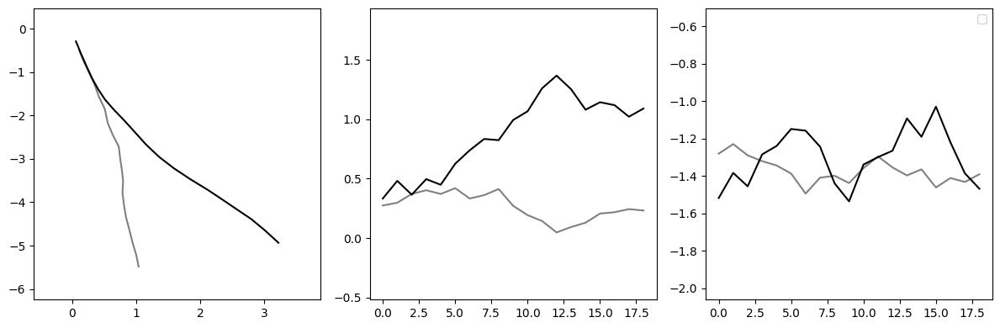

In [6]:
import matplotlib.pyplot as plt

# 假设 pedestrian_position, pedestrian_velocity, pedestrian_acceleration 是已经定义的变量
# pedestrian_position = ...
# pedestrian_velocity = ...
# pedestrian_acceleration = ...

# 创建一个 fig 和 ax 对象
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

scene = 109
# 绘制位置数据
axs[0].plot(ls_real_tra[scene][:,0],ls_real_tra[scene][:,1],color='grey')
axs[0].plot(ls_predicted_tra[scene][:,0],ls_predicted_tra[scene][:,1],color='black')
# axs[0].set_title('Position')
# axs[0].set_xlabel('x')
# axs[0].set_ylabel('y')
axs[0].set_xlim(axs[0].get_xlim()[0]-0.5,axs[0].get_xlim()[1]+0.5)
axs[0].set_ylim(axs[0].get_ylim()[0]-0.5,axs[0].get_ylim()[1]+0.5)

# 绘制速度数据
axs[1].plot(ls_real_speed[scene][:,0],color='grey')
axs[1].plot(ls_predicted_speed[scene][:,0],color='black')
# axs[1].set_title('Velocity_x')
# axs[1].set_xlabel('Time')
# axs[1].set_ylabel('Velocity_x')
axs[1].set_ylim(axs[1].get_ylim()[0]-0.5,axs[1].get_ylim()[1]+0.5)

# 绘制加速度数据
axs[2].plot(ls_real_speed[scene][:,1],color='grey')
axs[2].plot(ls_predicted_speed[scene][:,1],color='black')
# axs[2].set_title('Velocity_y')
# axs[2].set_xlabel('Time')
# axs[2].set_ylabel('Velocity_y')
axs[2].set_ylim(axs[2].get_ylim()[0]-0.5,axs[2].get_ylim()[1]+0.5)
# 调整布局
plt.legend()
plt.tight_layout()

plt.savefig('figs/trajectory-blcak.png')
# 显示图像
plt.show()

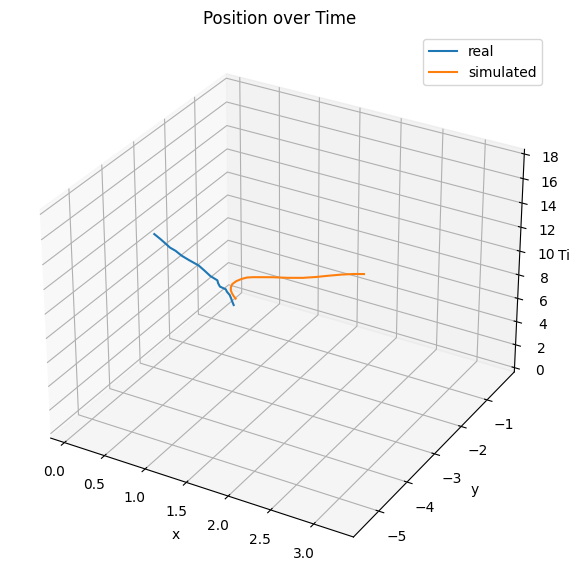

In [7]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 假设 env_position_pedestrain1 和 env_position_vehicle1 是已经定义的变量
# env_position_pedestrain1 = ...
# env_position_vehicle1 = ...

# 创建一个 fig 和 ax 对象
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

time_steps = range(ls_real_tra[scene].shape[0])

# 绘制行人位置数据
ax.plot(ls_real_tra[scene][:, 0], ls_real_tra[scene][:, 1], time_steps, label='real')

# 绘制车辆位置数据
ax.plot(ls_predicted_tra[scene][:, 0], ls_predicted_tra[scene][:, 1], time_steps, label='simulated')

# 设置标题和标签
ax.set_title('Position over Time')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('Time')
ax.legend()

# 显示图像
plt.show()

# 消去行人影响的轨迹可视化

In [8]:
env_state_pedestrain = np.load('/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_state_pedestrain_train.npy',allow_pickle=True)
env_state_vehicle = np.load('/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_state_vehicle_train.npy',allow_pickle=True)
env_position_pedestrain = np.load('/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_position_pedestrain_train.npy',allow_pickle=True)
env_position_vehicle = np.load('/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_position_vehicle_train.npy',allow_pickle=True)
env_done_group = np.load('/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_done_group_train.npy',allow_pickle=True)
env_num_pedestrain = np.load('/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_num_pedestrain_train.npy',allow_pickle=True)
env_num_vehicle = np.load('/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_num_vehicle_train.npy',allow_pickle=True)


In [9]:
for i in range(env_state_pedestrain.shape[0]):
    env_state_pedestrain[i][:, 1:, :] = 0
    env_position_pedestrain[i][:, 1:, :]
    env_num_pedestrain[i][:] = 0

In [10]:
from agents.algorithm.ppo    import PPO
from agents.algorithm.sac    import SAC
from agents.algorithm.ddpg    import DDPG
from agents.agent            import Agent

from discriminators.gail     import GAIL
from discriminators.vail     import VAIL
from discriminators.airl     import AIRL
from discriminators.vairl    import VAIRL
from discriminators.eairl    import EAIRL
from discriminators.sqil    import SQIL
from utils.utils             import RunningMeanStd, Dict, make_transition

from configparser            import ConfigParser
from argparse                import ArgumentParser

import os
from envDesign.environment import InteractionEnv
from envDesign.environmentTest import InteractionEnvForTest
import numpy as np

import torch

os.makedirs('./model_weights', exist_ok=True)
envTest_no_peer = InteractionEnvForTest('/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_state_pedestrain_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_state_vehicle_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_position_pedestrain_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_position_vehicle_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_done_group_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_num_pedestrain_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_num_vehicle_train.npy')

envTest_no_peer.env_state_pedestrain = env_state_pedestrain
envTest_no_peer.env_position_pedestrain = env_position_pedestrain
envTest_no_peer.env_num_pedestrain = env_num_pedestrain

print('测试环境读取完成')

action_dim = envTest_no_peer.action_dim
state_dim = envTest_no_peer.state_dim
parser = ArgumentParser('parameters')


parser.add_argument('--test', type=bool, default=False, help="True if test, False if train (default: False)")
parser.add_argument('--render', type=bool, default=False, help="(default: False)")
parser.add_argument('--epochs', type=int, default=1001, help='number of epochs, (default: 1001)')
parser.add_argument("--agent", type=str, default = 'sac', help = 'actor training algorithm(default: ppo)')
parser.add_argument("--discriminator", type=str, default = 'airl', help = 'discriminator training algorithm(default: gail)')
parser.add_argument("--save_interval", type=int, default = 100, help = 'save interval')
parser.add_argument("--print_interval", type=int, default = 1, help = 'print interval')
parser.add_argument('--tensorboard', type=bool, default=False, help='use_tensorboard, (default: True)')

args = parser.parse_args(args=[])
parser = ConfigParser()
parser.read('config.ini')

torch.manual_seed(0)
np.random.seed(0)

demonstrations_location_args = Dict(parser,'demonstrations_location',True)
agent_args = Dict(parser,args.agent)
discriminator_args = Dict(parser,args.discriminator)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
if args.tensorboard:
    from torch.utils.tensorboard import SummaryWriter

    writer = SummaryWriter('runs')
else:
    writer = None

if args.discriminator == 'airl':
    discriminator = AIRL(writer, device, state_dim, action_dim, discriminator_args)

elif args.discriminator == 'vairl':
    discriminator = VAIRL(writer, device, state_dim, action_dim, discriminator_args)
elif args.discriminator == 'gail':
    discriminator = GAIL(writer, device, state_dim, action_dim, discriminator_args)
elif args.discriminator == 'vail':
    discriminator = VAIL(writer, device, state_dim, action_dim, discriminator_args)
elif args.discriminator == 'eairl':
    discriminator = EAIRL(writer, device, state_dim, action_dim, discriminator_args)
elif args.discriminator == 'sqil':
    discriminator = SQIL(writer, device, state_dim, action_dim, discriminator_args)
else:
    raise NotImplementedError

print('逆强化学习构建完成')
max_action = 5
if args.agent == 'ppo':
    algorithm = PPO(device, state_dim, action_dim, agent_args)
elif args.agent == 'sac':
    algorithm = SAC(device, state_dim, action_dim, agent_args)
elif args.agent == 'ddpg':
    algorithm = DDPG(state_dim, action_dim, max_action)
else:
    raise NotImplementedError
print('强化学习构建完成')


agent = Agent(algorithm, writer, device, state_dim, action_dim, agent_args, demonstrations_location_args)
print('智能体构建完成')
if device == 'cuda':
    agent = agent.cuda()
    discriminator = discriminator.cuda()


discriminator.load('./model_weights/[0.9992950294551568, 0.9848406460614667, 0.6000547860479556, 0.605082754483777, 1.71901808359782, 1.6373727841446695, 0.8009303661658126, 0.7793628897146919, 40]')
agent.brain.load('./model_weights/[0.9992950294551568, 0.9848406460614667, 0.6000547860479556, 0.605082754483777, 1.71901808359782, 1.6373727841446695, 0.8009303661658126, 0.7793628897146919, 40]')
print('参数读取完成')




ls_tra_mae_no_peer = []
ls_speed_mae_no_peer = []
ls_tra_hd_no_peer = []
ls_speed_hd_no_peer = []
ls_real_tra_no_peer = []
ls_predicted_tra_no_peer = []
ls_real_speed_no_peer = []
ls_predicted_speed_no_peer = []
for i in range(envTest_no_peer.env_state_pedestrain.shape[0]):
    state_flat_test, all_state_test = envTest_no_peer.reset()
    doneTest = False
    while not doneTest:
        action, log_prob = agent.get_action(torch.from_numpy(envTest_no_peer.state).float().to(device))
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]

        tra_mae, speed_mae, tra_hd, speed_hd, doneTest, real_tra, predicted_tra, real_speed, predicted_speed = envTest_no_peer.step_for_analysis(action)
    ls_tra_mae_no_peer.append(tra_mae)
    ls_speed_mae_no_peer.append(speed_mae)
    ls_tra_hd_no_peer.append(tra_hd)
    ls_speed_hd_no_peer.append(speed_hd)
    ls_real_tra_no_peer.append(real_tra)
    ls_predicted_tra_no_peer.append(predicted_tra)
    ls_real_speed_no_peer.append(real_speed)
    ls_predicted_speed_no_peer.append(predicted_speed)
tra_mae = np.array(ls_tra_mae_no_peer)
speed_mae = np.array(ls_speed_mae_no_peer)
tra_hd = np.array(ls_tra_hd_no_peer)
speed_hd = np.array(ls_speed_hd_no_peer)
tra_mae = np.mean(tra_mae, axis=0)
speed_mae = np.mean(speed_mae, axis=0)
tra_hd = np.mean(tra_hd, axis=0)
speed_hd = np.mean(speed_hd, axis=0)

print(f'P_X_MAE:{tra_mae[0]}; P_Y_MAE:{tra_mae[1]}')
print(f'V_X_MAE:{speed_mae[0]}; V_Y_MAE:{speed_mae[1]}')
print(f'P_X_HD:{tra_hd[0]}; P_Y_HD:{tra_hd[1]}')
print(f'V_X_HD:{speed_hd[0]}; V_Y_HD:{speed_hd[1]}')

测试环境读取完成
8
8
逆强化学习构建完成
强化学习构建完成
智能体构建完成
参数读取完成


/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environmentTest.py:92: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_1247408/1912770170.py:130: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]
/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/enviro

P_X_MAE:1.0576448665103588; P_Y_MAE:0.9818410286362549
V_X_MAE:0.6143344752982055; V_Y_MAE:0.6020887759562755
P_X_HD:1.8210013742031386; P_Y_HD:1.607878519245906
V_X_HD:0.8174309736074854; V_Y_HD:0.7615619607367153


In [11]:
dt_mae[dt_mae['mean']<0.2].sort_values(by='mean')

,P_X_MAE,P_Y_MAE,V_X_MAE,V_Y_MAE,mean
378,0.082909,0.064918,0.149821,0.082191,0.094960
32,0.093575,0.040211,0.102870,0.160082,0.099184
541,0.054594,0.061099,0.116472,0.198649,0.107704
255,0.154919,0.062478,0.092996,0.142565,0.113239
317,0.105041,0.088357,0.117652,0.147300,0.114587
95,0.081760,0.086392,0.199685,0.110131,0.119492
562,0.116591,0.053116,0.206782,0.112022,0.122127
244,0.043673,0.207844,0.117173,0.132833,0.125381
375,0.149547,0.112004,0.172949,0.101743,0.134061
28,0.085706,0.106409,0.205107,0.142268,0.134873


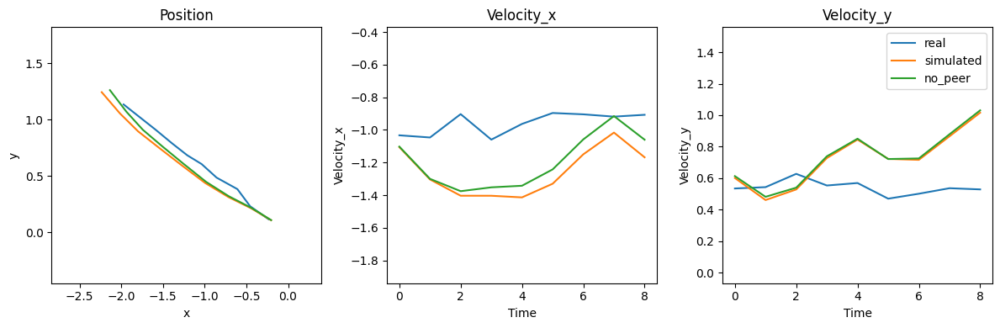

In [12]:
import matplotlib.pyplot as plt

# 假设 pedestrian_position, pedestrian_velocity, pedestrian_acceleration 是已经定义的变量
# pedestrian_position = ...
# pedestrian_velocity = ...
# pedestrian_acceleration = ...

# 创建一个 fig 和 ax 对象
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

scene = 239
# 绘制位置数据
axs[0].plot(ls_real_tra[scene][:,0],ls_real_tra[scene][:,1],label='real')
axs[0].plot(ls_predicted_tra[scene][:,0],ls_predicted_tra[scene][:,1],label='simulated')
axs[0].plot(ls_predicted_tra_no_peer[scene][:,0],ls_predicted_tra_no_peer[scene][:,1],label='no_peer')
axs[0].set_title('Position')
axs[0].set_xlabel('x')
axs[0].set_ylabel('y')
axs[0].set_xlim(axs[0].get_xlim()[0]-0.5,axs[0].get_xlim()[1]+0.5)
axs[0].set_ylim(axs[0].get_ylim()[0]-0.5,axs[0].get_ylim()[1]+0.5)

# 绘制速度数据
axs[1].plot(ls_real_speed[scene][:,0],label='real')
axs[1].plot(ls_predicted_speed[scene][:,0],label='simulated')
axs[1].plot(ls_predicted_speed_no_peer[scene][:,0],label='no_peer')
axs[1].set_title('Velocity_x')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Velocity_x')
axs[1].set_ylim(axs[1].get_ylim()[0]-0.5,axs[1].get_ylim()[1]+0.5)

# 绘制加速度数据
axs[2].plot(ls_real_speed[scene][:,1],label='real')
axs[2].plot(ls_predicted_speed[scene][:,1],label='simulated')
axs[2].plot(ls_predicted_speed_no_peer[scene][:,1],label='no_peer')
axs[2].set_title('Velocity_y')
axs[2].set_xlabel('Time')
axs[2].set_ylabel('Velocity_y')
axs[2].set_ylim(axs[2].get_ylim()[0]-0.5,axs[2].get_ylim()[1]+0.5)
# 调整布局
plt.legend()
plt.tight_layout()

# 显示图像
plt.show()

# 奖励值的可视化

In [13]:
from envDesign.environment import InteractionEnv
import math

In [14]:
# discriminator.load('./model_weights/[0.9992950294551568, 0.9848406460614667, 0.6000547860479556, 0.605082754483777, 1.71901808359782, 1.6373727841446695, 0.8009303661658126, 0.7793628897146919, 40]')

In [15]:
discriminator.load('./model_weights/[1.5473494668511807, 2.834657062779352, 0.9021724822243161, 1.7103240657421588, 2.49604383782136, 6.570650264837757, 1.3110014142354622, 2.862149944507463, 15000]')

In [16]:
env = InteractionEnv('/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_state_pedestrain_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_state_vehicle_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_position_pedestrain_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_position_vehicle_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_done_group_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_num_pedestrain_train.npy',
                        '/mnt/f/公开数据集/Yandex/人车交互数据/环境数据/env优化/env_num_vehicle_train.npy')

In [17]:
## 场景初始化

In [18]:
## vx_pedestrian
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.append(np.abs(env.env_state_pedestrain[i][:,0,3]).sum())
    ls_ax_pedestrian_num.append(np.abs(env.env_state_pedestrain[i][:,0,3]).shape[0])
v_x_pedestrian = sum(ls_ax_pedestrian_sum) / sum(ls_ax_pedestrian_num)

## vy_pedestrian
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.append(np.abs(env.env_state_pedestrain[i][:,0,4]).sum())
    ls_ax_pedestrian_num.append(np.abs(env.env_state_pedestrain[i][:,0,4]).shape[0])
v_y_pedestrian = sum(ls_ax_pedestrian_sum) / sum(ls_ax_pedestrian_num)

## ax_pedestrian
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.append(np.abs(env.env_state_pedestrain[i][:,0,5]).sum())
    ls_ax_pedestrian_num.append(np.abs(env.env_state_pedestrain[i][:,0,5]).shape[0])
a_x_pedestrian = sum(ls_ax_pedestrian_sum) / sum(ls_ax_pedestrian_num)

## ay_pedestrian
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.append(np.abs(env.env_state_pedestrain[i][:,0,6]).sum())
    ls_ax_pedestrian_num.append(np.abs(env.env_state_pedestrain[i][:,0,6]).shape[0])
a_y_pedestrian = sum(ls_ax_pedestrian_sum) / sum(ls_ax_pedestrian_num)

## vx_vehicle
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.append(np.abs(env.env_state_vehicle[i][:,1,3]).sum())
    ls_ax_pedestrian_num.append(np.abs(env.env_state_vehicle[i][:,1,3]).shape[0])
v_x_vehicle = sum(ls_ax_pedestrian_sum) / sum(ls_ax_pedestrian_num)

## vy_vehicle
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.append(np.abs(env.env_state_vehicle[i][:,1,4]).sum())
    ls_ax_pedestrian_num.append(np.abs(env.env_state_vehicle[i][:,1,4]).shape[0])
v_y_vehicle = sum(ls_ax_pedestrian_sum) / sum(ls_ax_pedestrian_num)

## ax_vehicle
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.append(np.abs(env.env_state_vehicle[i][:,1,5]).sum())
    ls_ax_pedestrian_num.append(np.abs(env.env_state_vehicle[i][:,1,5]).shape[0])
a_x_vehicle = sum(ls_ax_pedestrian_sum) / sum(ls_ax_pedestrian_num)

## ay_vehicle
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.append(np.abs(env.env_state_vehicle[i][:,1,6]).sum())
    ls_ax_pedestrian_num.append(np.abs(env.env_state_vehicle[i][:,1,6]).shape[0])
a_y_vehicle = sum(ls_ax_pedestrian_sum) / sum(ls_ax_pedestrian_num)

## gap_x
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.append(np.abs(env.env_position_vehicle[i][:,0,0] - env.env_position_vehicle[i][:,1,0]).sum())
    ls_ax_pedestrian_num.append(np.abs(env.env_position_vehicle[i][:,0,0]).shape[0])
gap_x = sum(ls_ax_pedestrian_sum) / sum(ls_ax_pedestrian_num)

## gap_y
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.append(np.abs(env.env_position_vehicle[i][:,0,1] - env.env_position_vehicle[i][:,1,1]).sum())
    ls_ax_pedestrian_num.append(np.abs(env.env_position_vehicle[i][:,0,1]).shape[0])
gap_y = sum(ls_ax_pedestrian_sum) / sum(ls_ax_pedestrian_num)

In [19]:
## vx_pedestrian
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.extend(env.env_state_pedestrain[i][:,0,3])
    ls_ax_pedestrian_num.extend(env.env_state_pedestrain[i][:,0,3])
v_x_pedestrian_var = np.var(ls_ax_pedestrian_sum)

## vy_pedestrian
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.extend(env.env_state_pedestrain[i][:,0,4])
v_y_pedestrian_var = np.var(ls_ax_pedestrian_sum)

## ax_pedestrian
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.extend(env.env_state_pedestrain[i][:,0,5])
a_x_pedestrian_var = np.var(ls_ax_pedestrian_sum)

## ay_pedestrian
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.extend(env.env_state_pedestrain[i][:,0,6])
a_y_pedestrian_var = np.var(ls_ax_pedestrian_sum)

## vx_vehicle
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.extend(env.env_state_pedestrain[i][:,1,3])
v_x_vehicle_var = np.var(ls_ax_pedestrian_sum)

## vy_vehicle
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.extend(env.env_state_pedestrain[i][:,1,4])
v_y_vehicle_var = np.var(ls_ax_pedestrian_sum)

## ax_vehicle
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.extend(env.env_state_pedestrain[i][:,1,5])
a_x_vehicle_var = np.var(ls_ax_pedestrian_sum)

## ay_vehicle
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.extend(env.env_state_pedestrain[i][:,1,6])
a_y_vehicle_var = np.var(ls_ax_pedestrian_sum)

## gap_x
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.extend(env.env_position_vehicle[i][:,0,0] - env.env_position_vehicle[i][:,1,0])
gap_x_var = np.var(ls_ax_pedestrian_sum)

## gap_y
ls_ax_pedestrian_sum = []
ls_ax_pedestrian_num = []
for i in range(env.env_state_pedestrain.shape[0]):
    ls_ax_pedestrian_sum.extend(env.env_position_vehicle[i][:,0,1] - env.env_position_vehicle[i][:,1,1])
gap_y_var = np.var(ls_ax_pedestrian_sum)

In [20]:
## 调整车速和横纵向距离

In [21]:
def update(action,state):
    next_vx = state[3] + action[0] * 0.2
    next_vy = state[4] + action[1] * 0.2
    next_x = state[96] + state[3] * 0.2 + 0.5 * action[0] * 0.2 ** 2
    next_y = state[97] + state[4] * 0.2 + 0.5 * action[1] * 0.2 ** 2
    next_yaw_pedestrain = math.atan2(next_vy, next_vx)
    new_state = state.copy()
    ## 行人更新
    new_state[3], new_state[51] = [next_vx]*2
    new_state[4], new_state[52] = [next_vy]*2
    new_state[5], new_state[53] = [action[0]]*2
    new_state[6], new_state[54] = [action[1]]*2
    new_state[96], new_state[108]  = [next_x]*2
    new_state[97], new_state[109]  = [next_y]*2
    new_state[7], new_state[55]  = [next_yaw_pedestrain]*2

    ## 车辆更新
    next_vx_v = state[59] + state[61] * 0.2
    next_vy_v = state[60] + state[62] * 0.2
    next_x_v = state[110] + state[59] * 0.2 + 0.5 * state[61] * 0.2 ** 2
    next_y_v = state[111] + state[60] * 0.2 + 0.5 * state[62] * 0.2 ** 2
    next_yaw_v = math.atan2(next_vy_v, next_vx_v)

    new_state[59] = next_vx_v
    new_state[60] = next_vy_v
    new_state[110] = next_x_v
    new_state[111] = next_y_v
    new_state[63] = next_yaw_v
    return new_state

## 周边没有行人时的可视化

In [96]:
## 横、纵向距离改变
record_test1 = np.zeros((21,21))
record_test1_nongame = np.zeros((21,21))
for change1 in range(0,21):
    for change2 in range(0,21):
        state_flat, all_state = env.reset()

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x * change2 / 10
        position_y_pedestrian = gap_y * (20 - change1) / 10
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 1
        vehicle_num = 2

        # 行人状态设置
        all_state[0][0][1:,:] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

        # 车辆状态设置
        all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][1:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian

        ## 车辆位置设置
        all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[8:48] = 0
        state_flat[64:96] = 0
        state_flat[98:108] = 0
        state_flat[112:] = 0

        ## 行人设置
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置

        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=True\
                                            ).item()
        record_test1[change1,change2] = reward

        record_test1_nongame[change1,change2] = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/3251544799.py:101: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/2214152071.py:111: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（单点微小扰动 ±0.05%）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.0962, 2.4587]
   标准差均值: 0.0162
   CV均值: 0.0471
   CV < 0.05 比例: 88.7%
   CV < 0.10 比例: 95.7%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=0.8242, 标准差=1.0011
   无博弈奖励 (R_ARG):    均值=0.5533, 标准差=0.0718
   博弈贡献 (R_game):     均值=0.2709, 标准差=0.9856

2. 方差分解:
   Var(R_total) = 1.002257
   Var(R_ARG)   = 0.005157 (0.5%)
   Var(R_game)  = 0.971366 (96.9%)
   Cov(R_ARG, R_game) = 0.012896

3. 组件相关性:
   Corr(R_total, R_ARG)  = 0.2507
   Corr(R_total, R_game) = 0.9975
   Corr(R_ARG, R_game)   = 0.1818

4. 稳定性评估:
   CV(R_total) = 1.2146
   CV(R_ARG)   = 0.1298
   CV(R_game)  = 3.6377

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


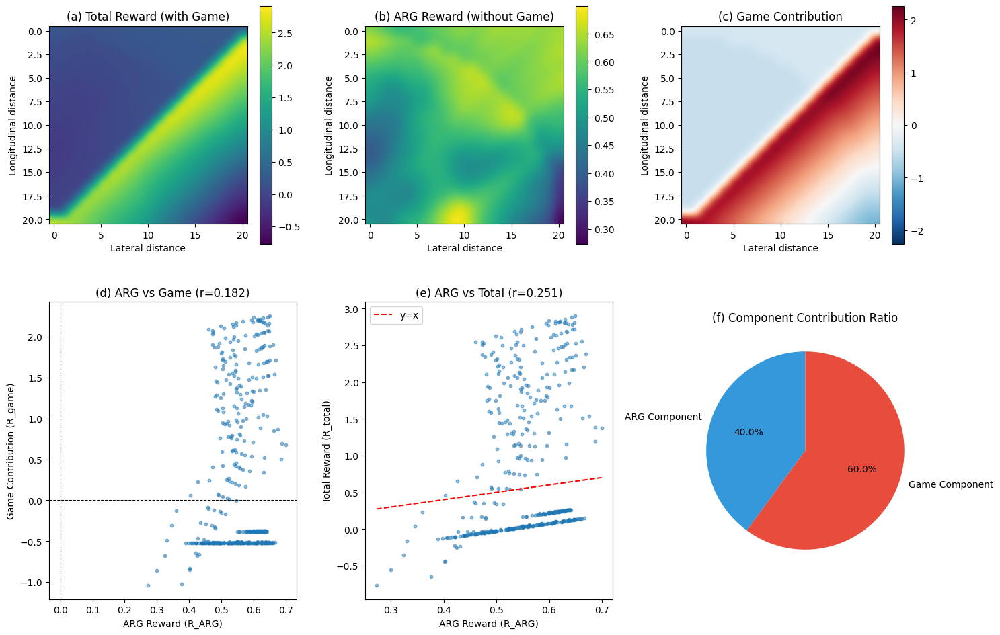

In [97]:
## 横、纵向距离改变 - 带稳定性分析
n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test1_mean = np.zeros((21, 21))
record_test1_std = np.zeros((21, 21))

for change1 in range(0, 21):
    for change2 in range(0, 21):
        rewards_game = []
        rewards_nongame = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                #  random.seed(seed)
                torch.backends.cudnn.deterministic = True
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            ## 初始值设置 - 对速度做微小扰动
            speed_x_pedestrian = v_x_pedestrian * (1 + random_noise[noise])
            speed_y_pedestrian = v_y_pedestrian * (1 + random_noise[noise])
            speed_x_vehicle = v_x_vehicle * (1 + random_noise[noise])
            speed_y_vehicle = v_y_vehicle * (1 + random_noise[noise])

            # 位置保持不变（这是我们要分析的状态点）
            position_x_pedestrian = gap_x * change2 / 10
            position_y_pedestrian = gap_y * (20 - change1) / 10 
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 1
            vehicle_num = 2

            # 行人状态设置
            all_state[0][0][1:,:] = 0
            all_state[0][0][0, 3] = speed_x_pedestrian
            all_state[0][0][0, 4] = speed_y_pedestrian
            all_state[0][0][0, 5] = a_x_pedestrian
            all_state[0][0][0, 6] = a_y_pedestrian
            all_state[0][0][0, 7] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            # 车辆状态设置
            all_state[0][1][2:,:] = 0
            all_state[0][1][0, 3] = speed_x_pedestrian
            all_state[0][1][0, 4] = speed_y_pedestrian
            all_state[0][1][0, 5] = a_x_pedestrian
            all_state[0][1][0, 6] = a_y_pedestrian
            all_state[0][1][0, 7] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            ## 行人位置设置
            all_state[0][2][1:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian

            ## 车辆位置设置
            all_state[0][3][2:,:] = 0
            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1, 0] = position_x_vehicle
            all_state[0][3][1, 1] = position_y_vehicle

            ## 行人数量设置
            all_state[0][4] = pedestrian_num

            ## 车辆数量设置
            all_state[0][5] = vehicle_num

            ## 清空
            state_flat[8:48] = 0
            state_flat[64:96] = 0
            state_flat[98:108] = 0
            state_flat[112:] = 0

            ## 行人设置
            state_flat[3], state_flat[51] = speed_x_pedestrian, speed_x_pedestrian
            state_flat[4], state_flat[52] = speed_y_pedestrian, speed_y_pedestrian
            state_flat[5], state_flat[53] = a_x_pedestrian, a_x_pedestrian
            state_flat[6], state_flat[54] = a_y_pedestrian, a_y_pedestrian
            state_flat[7], state_flat[55] = math.atan2(speed_y_pedestrian, speed_x_pedestrian), math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            ## 行人位置设置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            ## 车辆设置
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            ## 车辆位置设置
            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test1_mean[change1, change2] = np.mean(rewards_game)
        record_test1_std[change1, change2] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test1_std / (np.abs(record_test1_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（单点微小扰动 ±0.05%）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test1_mean.min():.4f}, {record_test1_mean.max():.4f}]")
print(f"   标准差均值: {record_test1_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")
# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# 假设您已有 record_test1 (with game) 和 record_test1_nongame (without game)

# 1. 计算博弈组件的贡献
game_contribution = record_test1 - record_test1_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test1.mean():.4f}, 标准差={record_test1.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test1_nongame.mean():.4f}, 标准差={record_test1_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test1.var()
arg_variance = record_test1_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test1_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test1.flatten(), record_test1_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test1.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test1_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test1.std() / (np.abs(record_test1.mean()) + 1e-8)
cv_arg = record_test1_nongame.std() / (np.abs(record_test1_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test1, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game)', fontsize=12)
ax1.set_xlabel('Lateral distance')
ax1.set_ylabel('Longitudinal distance')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test1_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Lateral distance')
ax2.set_ylabel('Longitudinal distance')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Lateral distance')
ax3.set_ylabel('Longitudinal distance')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test1_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test1_nongame.flatten(), record_test1.flatten(), alpha=0.5, s=10)
ax5.plot([record_test1_nongame.min(), record_test1_nongame.max()], 
         [record_test1_nongame.min(), record_test1_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test1_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction.pdf', dpi=300, bbox_inches='tight')
plt.show()


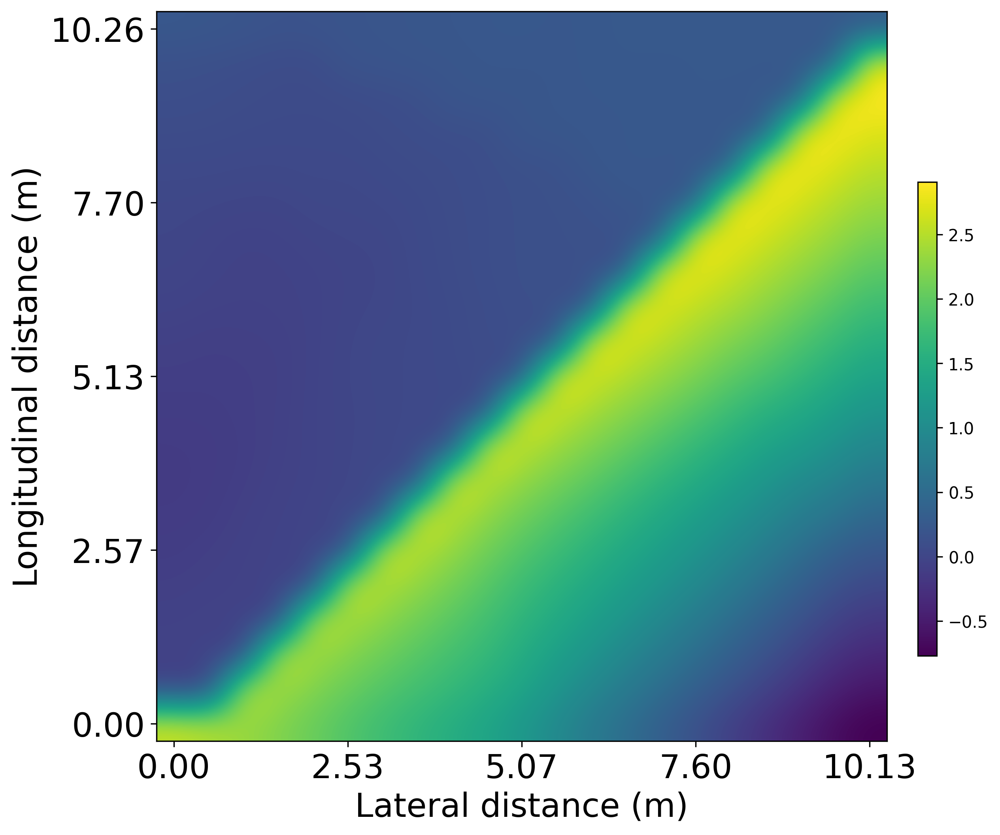

In [98]:
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
plt.imshow(record_test1, cmap='viridis', interpolation='bicubic')
plt.xlabel('Lateral distance (m)',fontsize=20)
plt.ylabel('Longitudinal distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * gap_x / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*gap_y / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gapy-gapx-no_peer.jpg')
plt.show()


In [99]:
## 横距离、行人横向速度改变
record_test2 = np.zeros((21,21))
record_test2_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        state_flat, all_state = env.reset()

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian * changex / 10
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x  * (20 - changey) / 10
        position_y_pedestrian = gap_y 
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 1
        vehicle_num = 2

        # 行人状态设置
        all_state[0][0][1:,:] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

        # 车辆状态设置
        all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][1:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian

        ## 车辆位置设置
        all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[8:48] = 0
        state_flat[64:96] = 0
        state_flat[98:108] = 0
        state_flat[112:] = 0

        ## 行人设置
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置

        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test2[changey,changex] = reward
        
        record_test2_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/3917495848.py:101: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/1694282076.py:111: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（单点微小扰动 ±0.05%）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.3656, 2.5230]
   标准差均值: 0.0410
   CV均值: 0.2370
   CV < 0.05 比例: 75.3%
   CV < 0.10 比例: 85.7%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=1.3222, 标准差=1.2865
   无博弈奖励 (R_ARG):    均值=0.5621, 标准差=0.2428
   博弈贡献 (R_game):     均值=0.7600, 标准差=1.2660

3. 组件相关性:
   Corr(R_total, R_ARG)  = 0.1782
   Corr(R_total, R_game) = 0.9820
   Corr(R_ARG, R_game)   = -0.0107

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


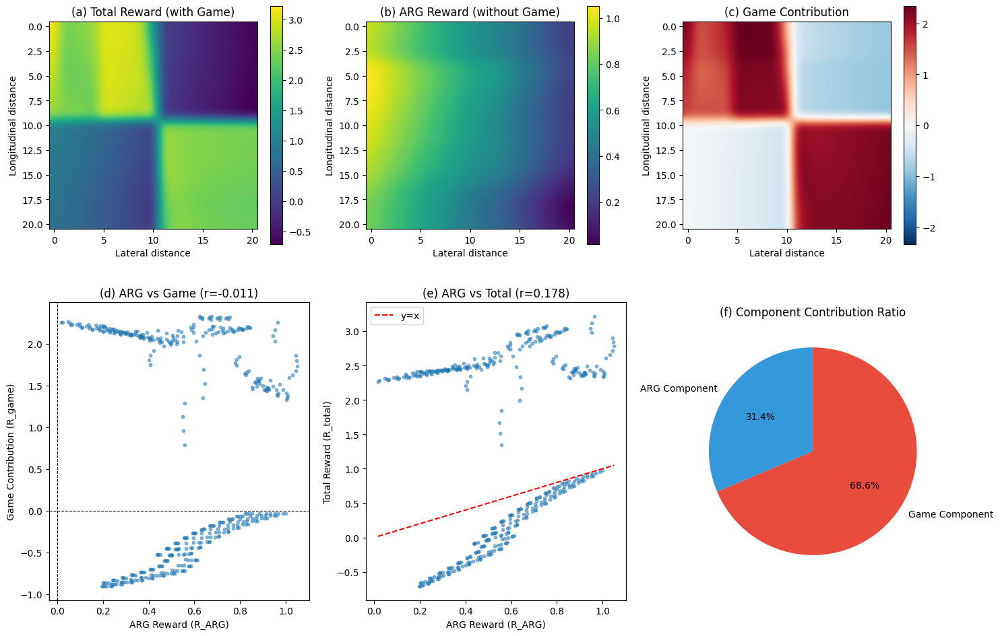

In [100]:
## 横、纵向距离改变 - 带稳定性分析
n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test2_mean = np.zeros((21, 21))
record_test2_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        rewards_nongame = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                #  random.seed(seed)
                torch.backends.cudnn.deterministic = True
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            ## 初始值设置 - 对速度做微小扰动
            speed_x_pedestrian = v_x_pedestrian * changex / 10
            speed_y_pedestrian = v_y_pedestrian * (1 + random_noise[noise])
            speed_x_vehicle = v_x_vehicle * (1 + random_noise[noise])
            speed_y_vehicle = v_y_vehicle * (1 + random_noise[noise])

            # 位置保持不变（这是我们要分析的状态点）
            position_x_pedestrian = gap_x * (20 - changey) / 10 
            position_y_pedestrian = gap_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 1
            vehicle_num = 2

            # 行人状态设置
            all_state[0][0][1:,:] = 0
            all_state[0][0][0, 3] = speed_x_pedestrian
            all_state[0][0][0, 4] = speed_y_pedestrian
            all_state[0][0][0, 5] = a_x_pedestrian
            all_state[0][0][0, 6] = a_y_pedestrian
            all_state[0][0][0, 7] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            # 车辆状态设置
            all_state[0][1][2:,:] = 0
            all_state[0][1][0, 3] = speed_x_pedestrian
            all_state[0][1][0, 4] = speed_y_pedestrian
            all_state[0][1][0, 5] = a_x_pedestrian
            all_state[0][1][0, 6] = a_y_pedestrian
            all_state[0][1][0, 7] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            ## 行人位置设置
            all_state[0][2][1:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian

            ## 车辆位置设置
            all_state[0][3][2:,:] = 0
            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1, 0] = position_x_vehicle
            all_state[0][3][1, 1] = position_y_vehicle

            ## 行人数量设置
            all_state[0][4] = pedestrian_num

            ## 车辆数量设置
            all_state[0][5] = vehicle_num

            ## 清空
            state_flat[8:48] = 0
            state_flat[64:96] = 0
            state_flat[98:108] = 0
            state_flat[112:] = 0

            ## 行人设置
            state_flat[3], state_flat[51] = speed_x_pedestrian, speed_x_pedestrian
            state_flat[4], state_flat[52] = speed_y_pedestrian, speed_y_pedestrian
            state_flat[5], state_flat[53] = a_x_pedestrian, a_x_pedestrian
            state_flat[6], state_flat[54] = a_y_pedestrian, a_y_pedestrian
            state_flat[7], state_flat[55] = math.atan2(speed_y_pedestrian, speed_x_pedestrian), math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            ## 行人位置设置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            ## 车辆设置
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            ## 车辆位置设置
            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test2_mean[changey, changex] = np.mean(rewards_game)
        record_test2_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test2_std / (np.abs(record_test2_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（单点微小扰动 ±0.05%）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test2_mean.min():.4f}, {record_test2_mean.max():.4f}]")
print(f"   标准差均值: {record_test2_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")
# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# 假设您已有 record_test2 (with game) 和 record_test2_nongame (without game)

# 1. 计算博弈组件的贡献
game_contribution = record_test2 - record_test2_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test2.mean():.4f}, 标准差={record_test2.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test2_nongame.mean():.4f}, 标准差={record_test2_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test2.flatten(), record_test2_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test2.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test2_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test2, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game)', fontsize=12)
ax1.set_xlabel('Lateral distance')
ax1.set_ylabel('Longitudinal distance')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test2_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Lateral distance')
ax2.set_ylabel('Longitudinal distance')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Lateral distance')
ax3.set_ylabel('Longitudinal distance')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test2_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test2_nongame.flatten(), record_test2.flatten(), alpha=0.5, s=10)
ax5.plot([record_test2_nongame.min(), record_test2_nongame.max()], 
         [record_test2_nongame.min(), record_test2_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test2_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
# plt.savefig('figs/reward_component_interaction.pdf', dpi=300, bbox_inches='tight')
plt.show()


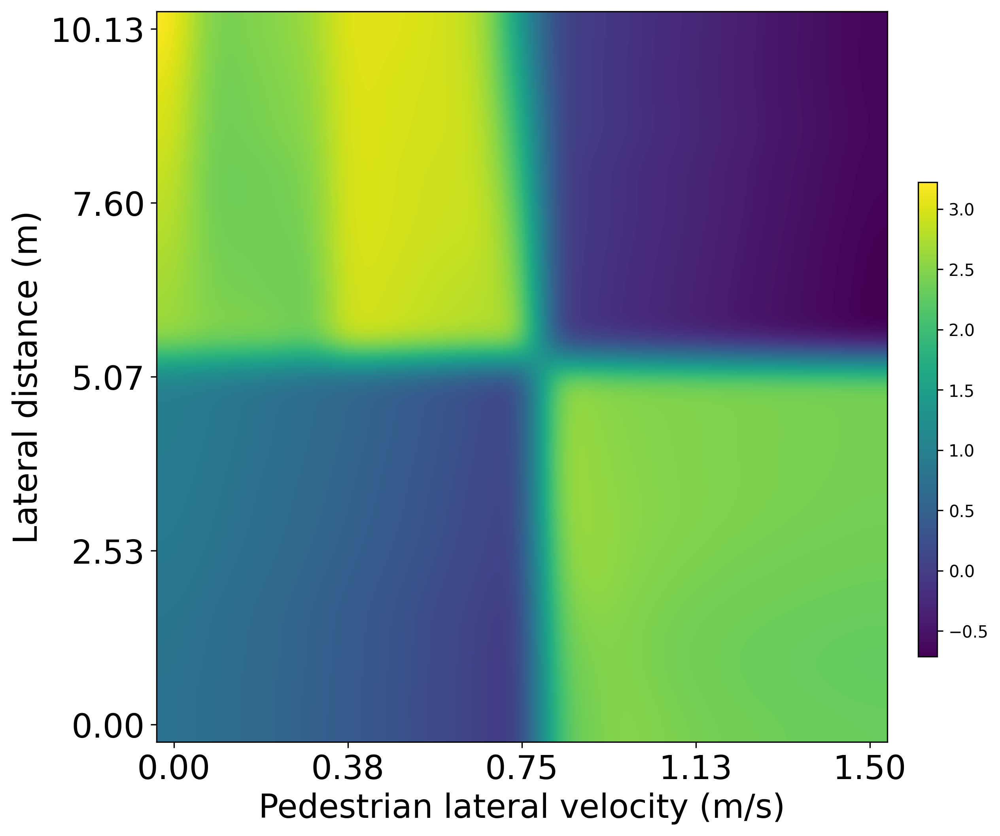

In [102]:
## Gap大的时候可以慢一点，因为人在前面，GAP小的时候要快一点，人像离车远一点
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
plt.imshow(record_test2, cmap='viridis', interpolation='bicubic')
plt.xlabel('Pedestrian lateral velocity (m/s)',fontsize=20)
plt.ylabel('Lateral distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * v_x_pedestrian / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*gap_x / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gapx-vpx-no_peer.jpg')
plt.show()


In [103]:
## 纵距离、行人纵向速度改变
record_test3 = np.zeros((21,21))
record_test3_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        state_flat, all_state = env.reset()

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian * changex / 10
        speed_x_vehicle = v_x_vehicle 
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x 
        position_y_pedestrian = gap_y * (20 - changey) / 10
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 1
        vehicle_num = 2

        # 行人状态设置
        all_state[0][0][1:,:] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

        # 车辆状态设置
        all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][1:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian

        ## 车辆位置设置
        all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[8:48] = 0
        state_flat[64:96] = 0
        state_flat[98:108] = 0
        state_flat[112:] = 0

        ## 行人设置
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置

        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test3[changey,changex] = reward

        record_test3_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/416951956.py:101: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/4145148553.py:120: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test3: 纵距离 vs 行人纵向速度）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.2256, 3.0375]
   标准差均值: 0.0649
   CV均值: 1.3763
   CV < 0.05 比例: 91.2%
   CV < 0.10 比例: 92.5%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=1.5546, 标准差=1.4570
   无博弈奖励 (R_ARG):    均值=0.5796, 标准差=0.2850
   博弈贡献 (R_game):     均值=0.9749, 标准差=1.4199

2. 方差分解:
   Var(R_total) = 2.122991
   Var(R_ARG)   = 0.081213 (3.8%)
   Var(R_game)  = 2.016165 (95.0%)
   Cov(R_ARG, R_game) = 0.012835

3. 组件相关性:
   Corr(R_total, R_ARG)  = 0.2264
   Corr(R_total, R_game) = 0.9807
   Corr(R_ARG, R_game)   = 0.0316

4. 稳定性评估:
   CV(R_total) = 0.9373
   CV(R_ARG)   = 0.4917
   CV(R_game)  = 1.4564

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


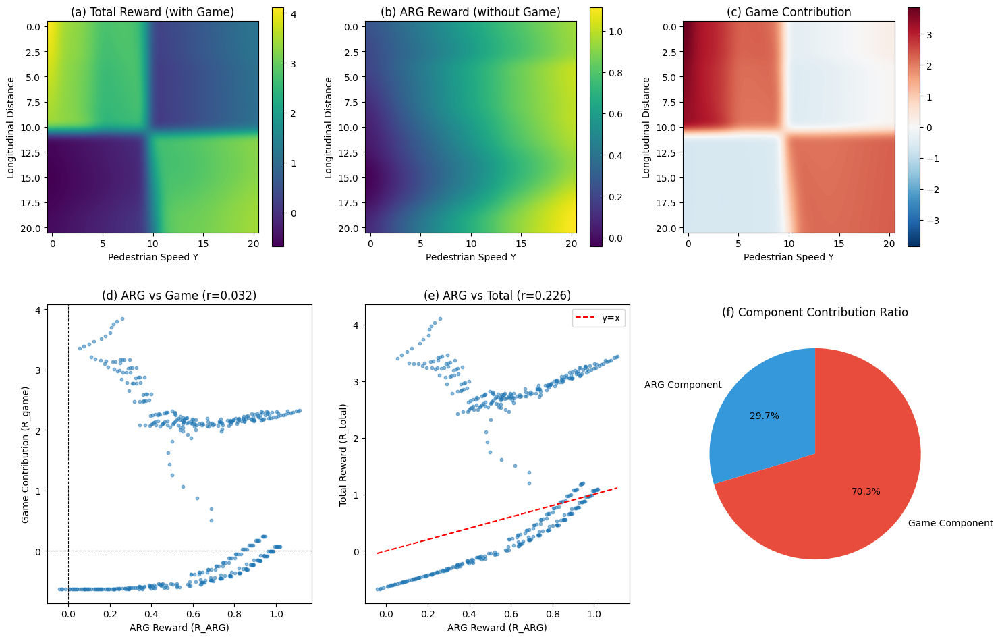

In [104]:
## 纵距离、行人纵向速度改变 - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test3_mean = np.zeros((21, 21))
record_test3_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            ## 基础值计算 (根据 changex 确定基础速度)
            base_speed_x_ped = v_x_pedestrian
            base_speed_y_ped = v_y_pedestrian * changex / 10
            
            ## 施加扰动
            speed_x_pedestrian = base_speed_x_ped * (1 + random_noise[noise])
            speed_y_pedestrian = base_speed_y_ped
            speed_x_vehicle = v_x_vehicle * (1 + random_noise[noise])
            speed_y_vehicle = v_y_vehicle * (1 + random_noise[noise])

            # 位置保持不变（这是我们要分析的状态点）
            position_x_pedestrian = gap_x * (1 + random_noise[noise])
            position_y_pedestrian = gap_y * (20 - changey) / 10
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 1
            vehicle_num = 2

            # 行人状态设置
            all_state[0][0][1:,:] = 0
            all_state[0][0][0, 3] = speed_x_pedestrian
            all_state[0][0][0, 4] = speed_y_pedestrian
            all_state[0][0][0, 5] = a_x_pedestrian
            all_state[0][0][0, 6] = a_y_pedestrian
            all_state[0][0][0, 7] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            # 车辆状态设置
            all_state[0][1][2:,:] = 0
            all_state[0][1][0, 3] = speed_x_pedestrian
            all_state[0][1][0, 4] = speed_y_pedestrian
            all_state[0][1][0, 5] = a_x_pedestrian
            all_state[0][1][0, 6] = a_y_pedestrian
            all_state[0][1][0, 7] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            ## 行人位置设置
            all_state[0][2][1:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian

            ## 车辆位置设置
            all_state[0][3][2:,:] = 0
            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1, 0] = position_x_vehicle
            all_state[0][3][1, 1] = position_y_vehicle

            ## 行人数量设置
            all_state[0][4] = pedestrian_num

            ## 车辆数量设置
            all_state[0][5] = vehicle_num

            ## 清空
            state_flat[8:48] = 0
            state_flat[64:96] = 0
            state_flat[98:108] = 0
            state_flat[112:] = 0

            ## 行人设置
            state_flat[3], state_flat[51] = speed_x_pedestrian, speed_x_pedestrian
            state_flat[4], state_flat[52] = speed_y_pedestrian, speed_y_pedestrian
            state_flat[5], state_flat[53] = a_x_pedestrian, a_x_pedestrian
            state_flat[6], state_flat[54] = a_y_pedestrian, a_y_pedestrian
            state_flat[7], state_flat[55] = math.atan2(speed_y_pedestrian, speed_x_pedestrian), math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            ## 行人位置设置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            ## 车辆设置
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            ## 车辆位置设置
            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test3_mean[changey, changex] = np.mean(rewards_game)
        record_test3_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test3_std / (np.abs(record_test3_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test3: 纵距离 vs 行人纵向速度）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test3_mean.min():.4f}, {record_test3_mean.max():.4f}]")
print(f"   标准差均值: {record_test3_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test3 - record_test3_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test3.mean():.4f}, 标准差={record_test3.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test3_nongame.mean():.4f}, 标准差={record_test3_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test3.var()
arg_variance = record_test3_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test3_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test3.flatten(), record_test3_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test3.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test3_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test3.std() / (np.abs(record_test3.mean()) + 1e-8)
cv_arg = record_test3_nongame.std() / (np.abs(record_test3_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test3, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game)', fontsize=12)
ax1.set_xlabel('Pedestrian Speed Y')
ax1.set_ylabel('Longitudinal Distance')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test3_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Speed Y')
ax2.set_ylabel('Longitudinal Distance')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Speed Y')
ax3.set_ylabel('Longitudinal Distance')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test3_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test3_nongame.flatten(), record_test3.flatten(), alpha=0.5, s=10)
ax5.plot([record_test3_nongame.min(), record_test3_nongame.max()], 
         [record_test3_nongame.min(), record_test3_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test3_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test3.pdf', dpi=300, bbox_inches='tight')
plt.show()

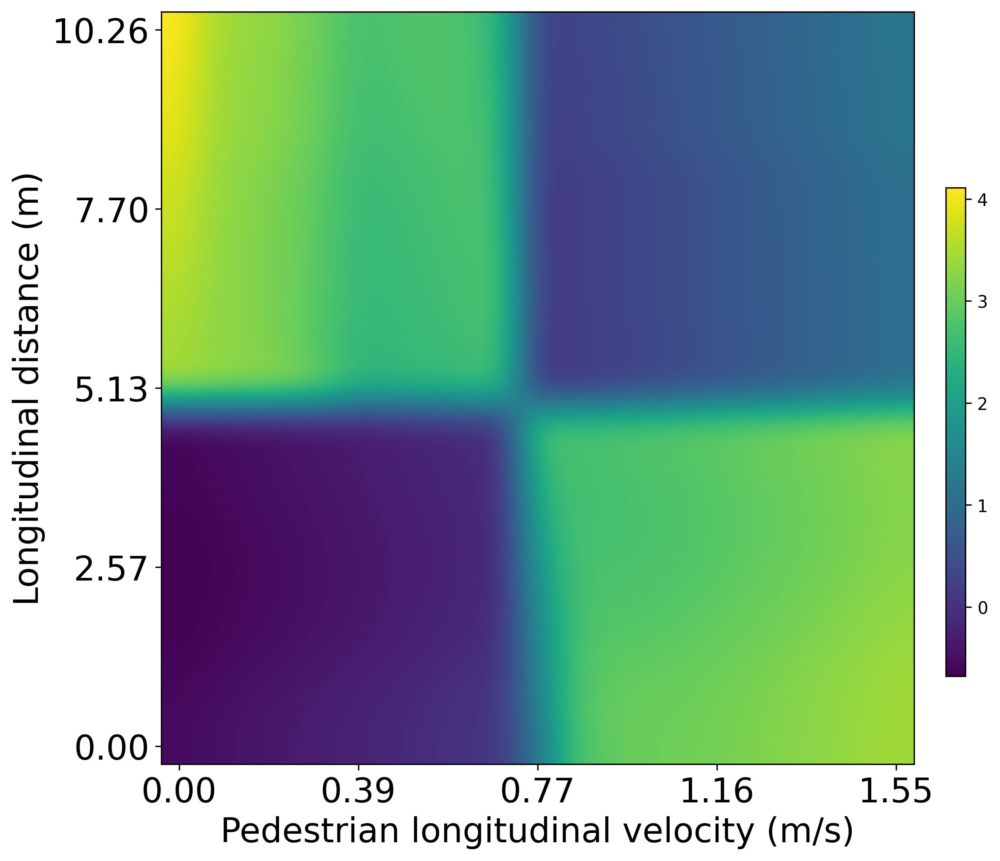

In [105]:
## 一样的道理
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
plt.imshow(record_test3, cmap='viridis', interpolation='bicubic')
plt.xlabel('Pedestrian longitudinal velocity (m/s)',fontsize=20)
plt.ylabel('Longitudinal distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * v_y_pedestrian / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*gap_y / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gapy-vpy-no_peer.jpg')

plt.show()


In [106]:
## 横距离、车横向速度改变
record_test_4 = np.zeros((21,21))
record_test_4_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        state_flat, all_state = env.reset()

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle * (20 - changey) / 10
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x * changex / 10
        position_y_pedestrian = gap_y
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 1
        vehicle_num = 2

        # 行人状态设置
        all_state[0][0][1:,:] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

        # 车辆状态设置
        all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][1:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian

        ## 车辆位置设置
        all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[8:48] = 0
        state_flat[64:96] = 0
        state_flat[98:108] = 0
        state_flat[112:] = 0

        ## 行人设置
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置

        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test_4[changey,changex] = reward

        record_test_4_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/1755845658.py:101: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/1068399447.py:122: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test4: 横距离 vs 车横向速度）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.0136, 3.2060]
   标准差均值: 0.0183
   CV均值: 0.0286
   CV < 0.05 比例: 94.8%
   CV < 0.10 比例: 96.4%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=0.8720, 标准差=1.1475
   无博弈奖励 (R_ARG):    均值=0.4958, 标准差=0.1263
   博弈贡献 (R_game):     均值=0.3761, 标准差=1.1948

2. 方差分解:
   Var(R_total) = 1.316763
   Var(R_ARG)   = 0.015963 (1.2%)
   Var(R_game)  = 1.427606 (108.4%)
   Cov(R_ARG, R_game) = -0.063547

3. 组件相关性:
   Corr(R_total, R_ARG)  = -0.3272
   Corr(R_total, R_game) = 0.9950
   Corr(R_ARG, R_game)   = -0.4200

4. 稳定性评估:
   CV(R_total) = 1.3160
   CV(R_ARG)   = 0.2548
   CV(R_game)  = 3.1767


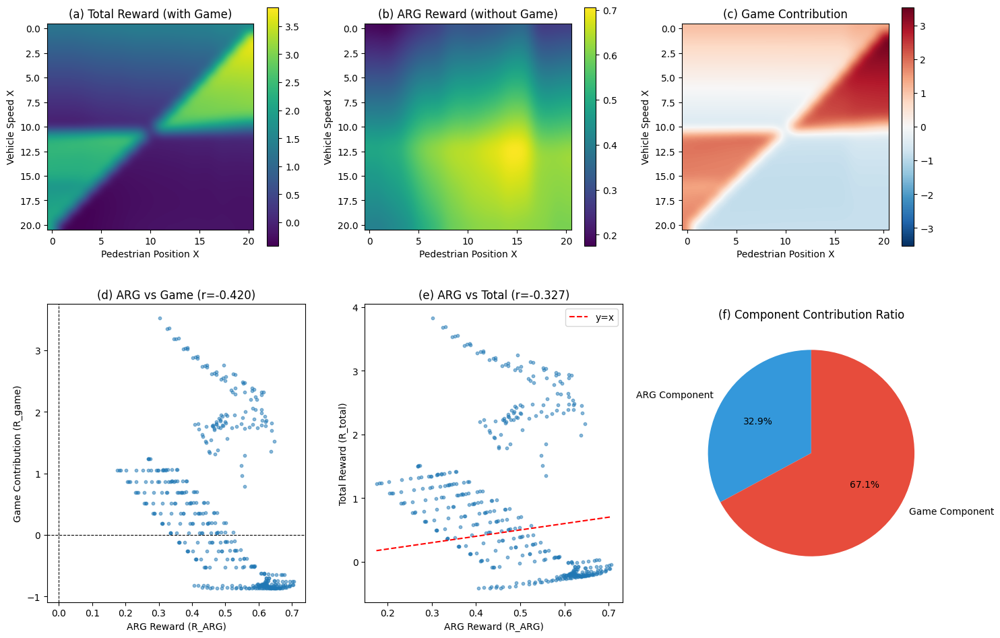

In [107]:
## 横距离、车横向速度改变 - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test4_mean = np.zeros((21, 21))
record_test4_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            ## 基础值计算
            # changey 控制车横向速度
            base_speed_x_veh = v_x_vehicle * (20 - changey) / 10
            # changex 控制行人横向位置
            base_pos_x_ped = gap_x * changex / 10
            
            ## 施加扰动 (对速度施加扰动)
            speed_x_pedestrian = v_x_pedestrian * (1 + random_noise[noise])
            speed_y_pedestrian = v_y_pedestrian * (1 + random_noise[noise])
            speed_x_vehicle = base_speed_x_veh
            speed_y_vehicle = v_y_vehicle * (1 + random_noise[noise])

            # 位置保持不变（这是我们要分析的状态点）
            position_x_pedestrian = base_pos_x_ped
            position_y_pedestrian = gap_y * (1 + random_noise[noise])
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 1
            vehicle_num = 2

            # 行人状态设置
            all_state[0][0][1:,:] = 0
            all_state[0][0][0, 3] = speed_x_pedestrian
            all_state[0][0][0, 4] = speed_y_pedestrian
            all_state[0][0][0, 5] = a_x_pedestrian
            all_state[0][0][0, 6] = a_y_pedestrian
            all_state[0][0][0, 7] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            # 车辆状态设置
            all_state[0][1][2:,:] = 0
            all_state[0][1][0, 3] = speed_x_pedestrian
            all_state[0][1][0, 4] = speed_y_pedestrian
            all_state[0][1][0, 5] = a_x_pedestrian
            all_state[0][1][0, 6] = a_y_pedestrian
            all_state[0][1][0, 7] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            ## 行人位置设置
            all_state[0][2][1:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian

            ## 车辆位置设置
            all_state[0][3][2:,:] = 0
            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1, 0] = position_x_vehicle
            all_state[0][3][1, 1] = position_y_vehicle

            ## 行人数量设置
            all_state[0][4] = pedestrian_num

            ## 车辆数量设置
            all_state[0][5] = vehicle_num

            ## 清空
            state_flat[8:48] = 0
            state_flat[64:96] = 0
            state_flat[98:108] = 0
            state_flat[112:] = 0

            ## 行人设置
            state_flat[3], state_flat[51] = speed_x_pedestrian, speed_x_pedestrian
            state_flat[4], state_flat[52] = speed_y_pedestrian, speed_y_pedestrian
            state_flat[5], state_flat[53] = a_x_pedestrian, a_x_pedestrian
            state_flat[6], state_flat[54] = a_y_pedestrian, a_y_pedestrian
            state_flat[7], state_flat[55] = math.atan2(speed_y_pedestrian, speed_x_pedestrian), math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            ## 行人位置设置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            ## 车辆设置
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            ## 车辆位置设置
            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test4_mean[changey, changex] = np.mean(rewards_game)
        record_test4_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test4_std / (np.abs(record_test4_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test4: 横距离 vs 车横向速度）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test4_mean.min():.4f}, {record_test4_mean.max():.4f}]")
print(f"   标准差均值: {record_test4_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test_4 - record_test_4_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test_4.mean():.4f}, 标准差={record_test_4.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test_4_nongame.mean():.4f}, 标准差={record_test_4_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test_4.var()
arg_variance = record_test_4_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test_4_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test_4.flatten(), record_test_4_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test_4.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test_4_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test_4.std() / (np.abs(record_test_4.mean()) + 1e-8)
cv_arg = record_test_4_nongame.std() / (np.abs(record_test_4_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test_4, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game)', fontsize=12)
ax1.set_xlabel('Pedestrian Position X')
ax1.set_ylabel('Vehicle Speed X')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test_4_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Position X')
ax2.set_ylabel('Vehicle Speed X')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Position X')
ax3.set_ylabel('Vehicle Speed X')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test_4_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test_4_nongame.flatten(), record_test_4.flatten(), alpha=0.5, s=10)
ax5.plot([record_test_4_nongame.min(), record_test_4_nongame.max()], 
         [record_test_4_nongame.min(), record_test_4_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test_4_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test4.pdf', dpi=300, bbox_inches='tight')
plt.show()

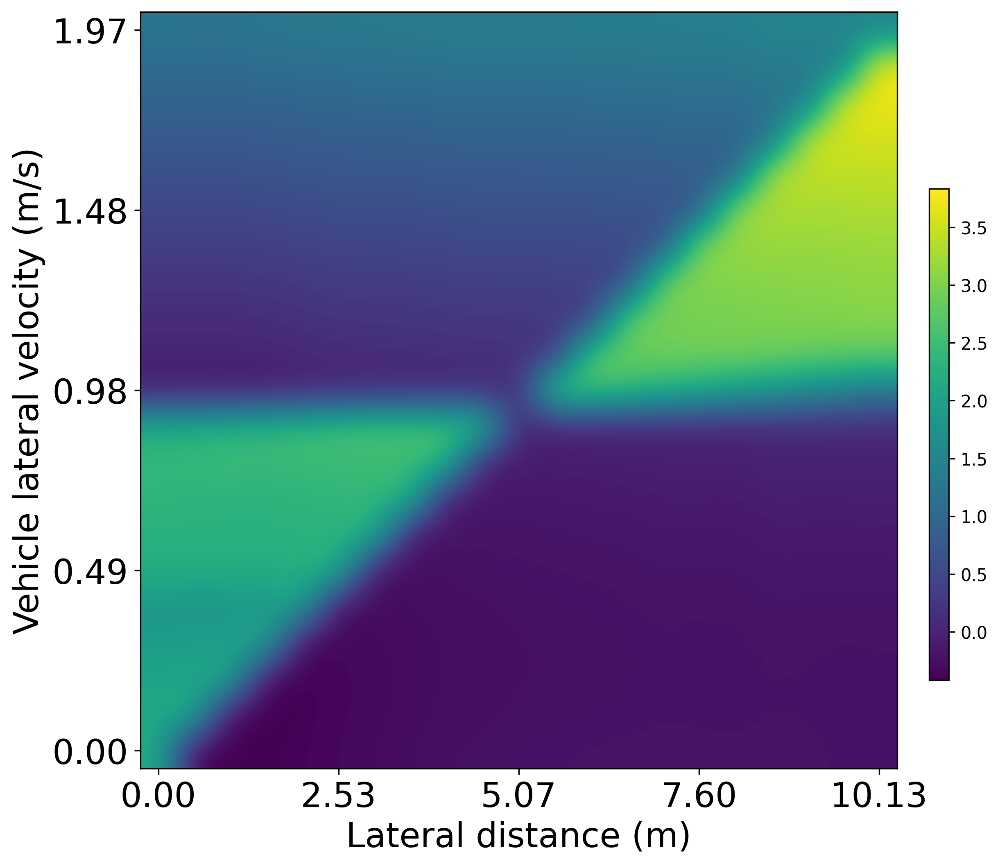

In [108]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
plt.imshow(record_test_4, cmap='viridis', interpolation='bicubic')
plt.xlabel('Lateral distance (m)',fontsize=20)
plt.ylabel('Vehicle lateral velocity (m/s)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * gap_x / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*v_x_vehicle / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/vvx-gapx-no_peer.jpg')

plt.show()


In [109]:
## 纵距离、行人纵向速度改变
record_test5 = np.zeros((21,21))
record_test5_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        state_flat, all_state = env.reset()

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle * (20 - changey) / 10

        position_x_pedestrian = gap_x
        position_y_pedestrian = gap_y * changex / 10
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 1
        vehicle_num = 2

        # 行人状态设置
        all_state[0][0][1:,:] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

        # 车辆状态设置
        all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][1:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian

        ## 车辆位置设置
        all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[8:48] = 0
        state_flat[64:96] = 0
        state_flat[98:108] = 0
        state_flat[112:] = 0

        ## 行人设置
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置

        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test5[changey,changex] = reward

        record_test5_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/3472508922.py:101: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/3700281923.py:122: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test5: 纵距离 vs 车纵向速度）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.1164, 5.0426]
   标准差均值: 0.0321
   CV均值: 0.1217
   CV < 0.05 比例: 92.1%
   CV < 0.10 比例: 95.5%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=0.8915, 标准差=1.2113
   无博弈奖励 (R_ARG):    均值=0.5589, 标准差=0.1064
   博弈贡献 (R_game):     均值=0.3326, 标准差=1.2339

2. 方差分解:
   Var(R_total) = 1.467249
   Var(R_ARG)   = 0.011314 (0.8%)
   Var(R_game)  = 1.522608 (103.8%)
   Cov(R_ARG, R_game) = -0.033413

3. 组件相关性:
   Corr(R_total, R_ARG)  = -0.1709
   Corr(R_total, R_game) = 0.9964
   Corr(R_ARG, R_game)   = -0.2540

4. 稳定性评估:
   CV(R_total) = 1.3587
   CV(R_ARG)   = 0.1903
   CV(R_game)  = 3.7097

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


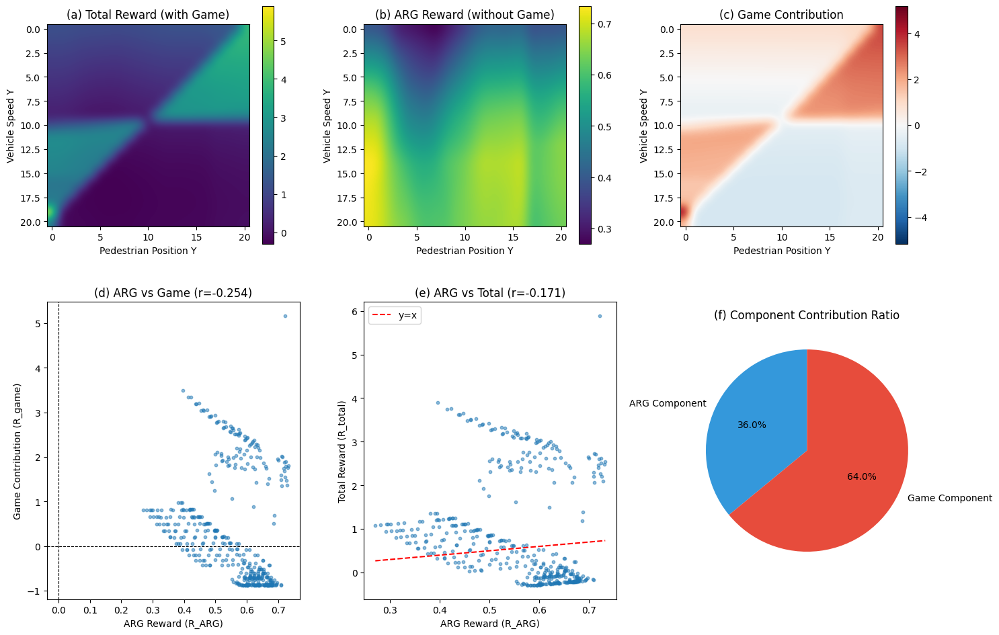

In [110]:
## 纵距离、行人纵向速度改变 - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test5_mean = np.zeros((21, 21))
record_test5_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            ## 基础值计算
            # changey 控制车纵向速度 (从 2*v_y 到 0)
            base_speed_y_veh = v_y_vehicle * (20 - changey) / 10
            # changex 控制行人纵向位置
            base_pos_y_ped = gap_y * changex / 10
            
            ## 施加扰动 (对速度施加扰动)
            speed_x_pedestrian = v_x_pedestrian * (1 + random_noise[noise])
            speed_y_pedestrian = v_y_pedestrian * (1 + random_noise[noise])
            speed_x_vehicle = v_x_vehicle * (1 + random_noise[noise])
            speed_y_vehicle = base_speed_y_veh

            # 位置保持不变（这是我们要分析的状态点）
            position_x_pedestrian = gap_x * (1 + random_noise[noise])
            position_y_pedestrian = base_pos_y_ped
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 1
            vehicle_num = 2

            # 行人状态设置
            all_state[0][0][1:,:] = 0
            all_state[0][0][0, 3] = speed_x_pedestrian
            all_state[0][0][0, 4] = speed_y_pedestrian
            all_state[0][0][0, 5] = a_x_pedestrian
            all_state[0][0][0, 6] = a_y_pedestrian
            all_state[0][0][0, 7] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            # 车辆状态设置
            all_state[0][1][2:,:] = 0
            all_state[0][1][0, 3] = speed_x_pedestrian
            all_state[0][1][0, 4] = speed_y_pedestrian
            all_state[0][1][0, 5] = a_x_pedestrian
            all_state[0][1][0, 6] = a_y_pedestrian
            all_state[0][1][0, 7] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            ## 行人位置设置
            all_state[0][2][1:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian

            ## 车辆位置设置
            all_state[0][3][2:,:] = 0
            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1, 0] = position_x_vehicle
            all_state[0][3][1, 1] = position_y_vehicle

            ## 行人数量设置
            all_state[0][4] = pedestrian_num

            ## 车辆数量设置
            all_state[0][5] = vehicle_num

            ## 清空
            state_flat[8:48] = 0
            state_flat[64:96] = 0
            state_flat[98:108] = 0
            state_flat[112:] = 0

            ## 行人设置
            state_flat[3], state_flat[51] = speed_x_pedestrian, speed_x_pedestrian
            state_flat[4], state_flat[52] = speed_y_pedestrian, speed_y_pedestrian
            state_flat[5], state_flat[53] = a_x_pedestrian, a_x_pedestrian
            state_flat[6], state_flat[54] = a_y_pedestrian, a_y_pedestrian
            state_flat[7], state_flat[55] = math.atan2(speed_y_pedestrian, speed_x_pedestrian), math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            ## 行人位置设置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            ## 车辆设置
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            ## 车辆位置设置
            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test5_mean[changey, changex] = np.mean(rewards_game)
        record_test5_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test5_std / (np.abs(record_test5_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test5: 纵距离 vs 车纵向速度）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test5_mean.min():.4f}, {record_test5_mean.max():.4f}]")
print(f"   标准差均值: {record_test5_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test5 - record_test5_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test5.mean():.4f}, 标准差={record_test5.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test5_nongame.mean():.4f}, 标准差={record_test5_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test5.var()
arg_variance = record_test5_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test5_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test5.flatten(), record_test5_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test5.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test5_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test5.std() / (np.abs(record_test5.mean()) + 1e-8)
cv_arg = record_test5_nongame.std() / (np.abs(record_test5_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test5, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game)', fontsize=12)
ax1.set_xlabel('Pedestrian Position Y')
ax1.set_ylabel('Vehicle Speed Y')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test5_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Position Y')
ax2.set_ylabel('Vehicle Speed Y')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Position Y')
ax3.set_ylabel('Vehicle Speed Y')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test5_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test5_nongame.flatten(), record_test5.flatten(), alpha=0.5, s=10)
ax5.plot([record_test5_nongame.min(), record_test5_nongame.max()], 
         [record_test5_nongame.min(), record_test5_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test5_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test5.pdf', dpi=300, bbox_inches='tight')
plt.show()

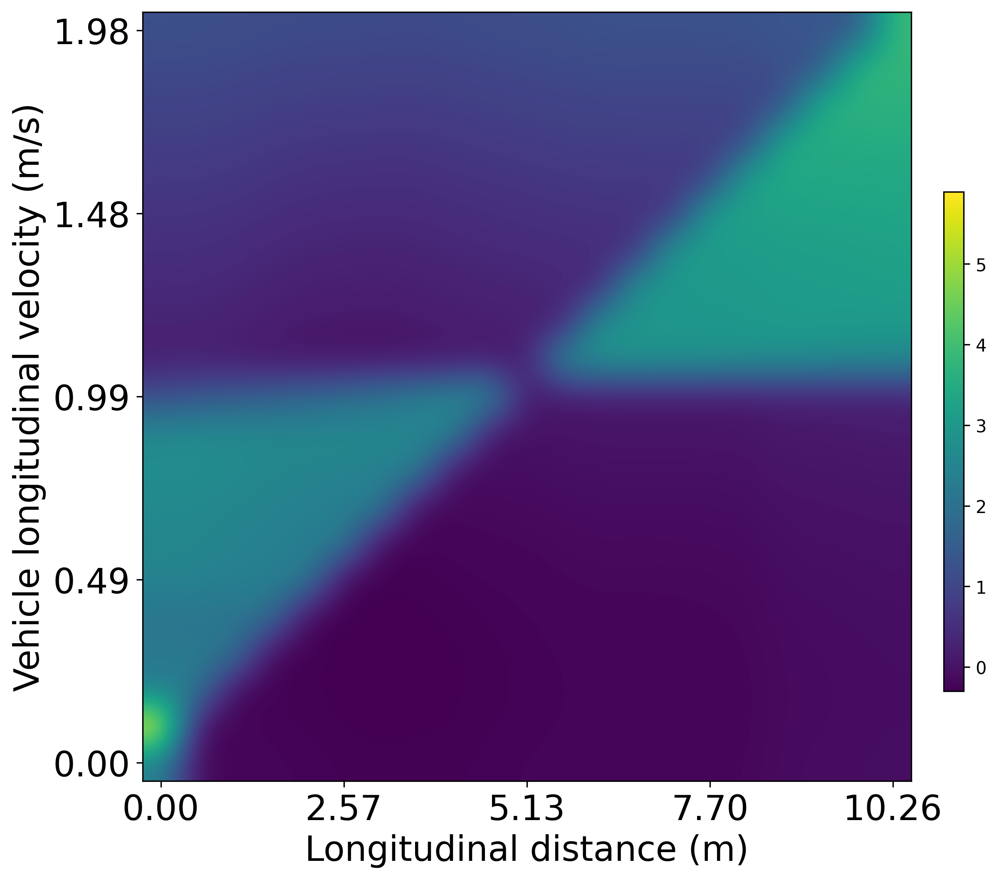

In [111]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
plt.imshow(record_test5, cmap='viridis', interpolation='bicubic')
plt.xlabel('Longitudinal distance (m)',fontsize=20)
plt.ylabel('Vehicle longitudinal velocity (m/s)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * gap_y / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*v_y_vehicle / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/vvy-gapy-no_peer.jpg')

plt.show()


## 五等环绕

In [112]:
## 横纵gap改变
record_test1_five = np.zeros((21,21))
record_test1_five_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        state_flat, all_state = env.reset()
        original_position = (gap_x * changex / 10 , gap_y* (20 - changey) / 10)

        # 半径
        radius = 1  # 可以根据需要调整

        # 计算五个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 6)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]

        # 包含原行人在内，总共六个人
        all_positions = [original_position] + new_positions

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x * changex / 10 
        position_y_pedestrian = gap_y* (20 - changey) / 10
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 6
        vehicle_num = 6

        # 行人状态设置
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1:, 0] = all_state[0][0][0, 0]
        all_state[0][0][1:, 1] = all_state[0][0][0, 1]
        all_state[0][0][1:, 2] = all_state[0][0][0, 2]
        all_state[0][0][1:, 3] = v_x_pedestrian
        all_state[0][0][1:, 4] = v_y_pedestrian
        all_state[0][0][1:, 5] = a_x_pedestrian
        all_state[0][0][1:, 6] = a_y_pedestrian
        all_state[0][0][1:, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        # all_state[0][2][1:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1:, :]  = np.array(new_positions)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        # state_flat[8:48] = 0
        # state_flat[64:96] = 0
        # state_flat[98:108] = 0
        # state_flat[112:] = 0

        ## 行人设置
        state_flat[0:48:8] = state_flat[0]
        state_flat[1:48:8] = state_flat[1]
        state_flat[2:48:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:48:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:48:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:48:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:48:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:48:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:108] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test1_five[changey,changex] = reward

        record_test1_five_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/1474145539.py:132: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/2313012448.py:152: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test1 Five: 6人场景 - 横纵距离改变）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.2787, 3.1410]
   标准差均值: 0.0170
   CV均值: 0.0515
   CV < 0.05 比例: 87.5%
   CV < 0.10 比例: 93.9%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=1.4105, 标准差=0.9467
   无博弈奖励 (R_ARG):    均值=1.1147, 标准差=0.3635
   博弈贡献 (R_game):     均值=0.2957, 标准差=0.9606

2. 方差分解:
   Var(R_total) = 0.896311
   Var(R_ARG)   = 0.132114 (14.7%)
   Var(R_game)  = 0.922838 (103.0%)
   Cov(R_ARG, R_game) = -0.079500

3. 组件相关性:
   Corr(R_total, R_ARG)  = 0.1534
   Corr(R_total, R_game) = 0.9275
   Corr(R_ARG, R_game)   = -0.2272

4. 稳定性评估:
   CV(R_total) = 0.6712
   CV(R_ARG)   = 0.3261
   CV(R_game)  = 3.2483

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


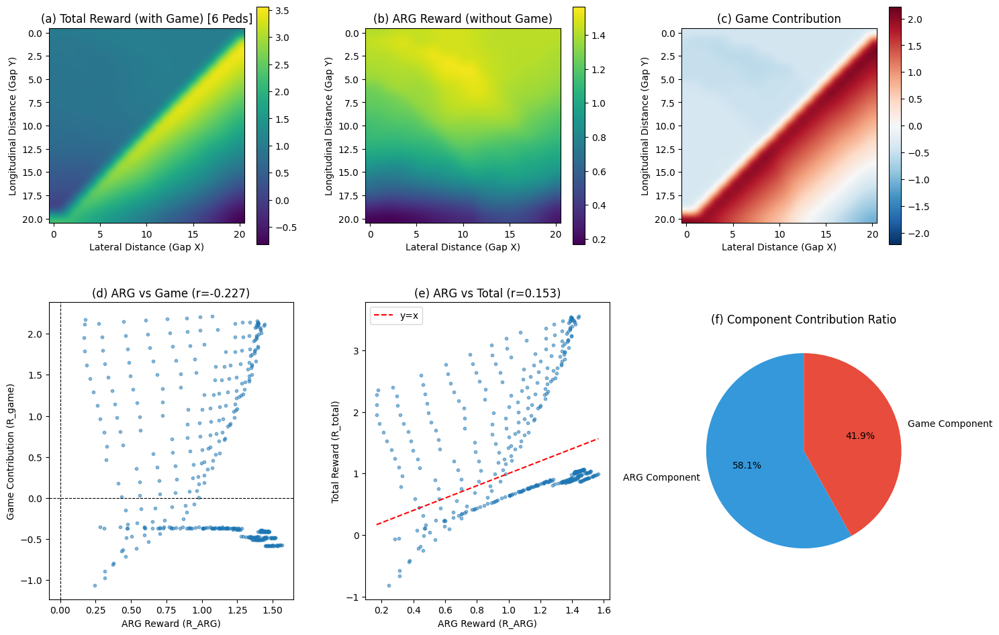

In [113]:
## 横纵gap改变 (6人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test1_five_mean = np.zeros((21, 21))
record_test1_five_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # 复现 6人 场景位置逻辑
            # ==========================================
            original_position = (gap_x * changex / 10 , gap_y* (20 - changey) / 10)
            
            # 半径
            radius = 1  
            # 计算五个新行人的位置
            angles = np.linspace(0, 2 * np.pi, 6)[:-1] 
            new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]
            # 包含原行人在内，总共六个人
            all_positions = [original_position] + new_positions

            ## 基础速度设置
            base_v_x_ped = v_x_pedestrian
            base_v_y_ped = v_y_pedestrian
            base_v_x_veh = v_x_vehicle
            base_v_y_veh = v_y_vehicle

            ## 施加扰动 (对所有速度项施加扰动)
            speed_x_pedestrian = base_v_x_ped * (1 + random_noise[noise])
            speed_y_pedestrian = base_v_y_ped * (1 + random_noise[noise])
            speed_x_vehicle = base_v_x_veh * (1 + random_noise[noise])
            speed_y_vehicle = base_v_y_veh * (1 + random_noise[noise])
            
            # 这里的加速度也稍微扰动一下，保持一致性，或者保持原值
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            position_x_pedestrian = original_position[0]
            position_y_pedestrian = original_position[1]
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 6
            vehicle_num = 6 # 保持和输入代码一致，虽然通常车只有2辆，但这里为了对齐输入

            # ==========================================
            # 状态填充 (Strictly following input logic)
            # ==========================================
            
            # 行人状态设置 (all_state)
            all_state[0][0][0, 3] = speed_x_pedestrian
            all_state[0][0][0, 4] = speed_y_pedestrian
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            all_state[0][0][1:, 0] = all_state[0][0][0, 0] # 这里似乎被后续覆盖，先保留
            all_state[0][0][1:, 1] = all_state[0][0][0, 1]
            all_state[0][0][1:, 2] = all_state[0][0][0, 2]
            all_state[0][0][1:, 3] = speed_x_pedestrian # 使用扰动后的速度
            all_state[0][0][1:, 4] = speed_y_pedestrian
            all_state[0][0][1:, 5] = acc_x_ped
            all_state[0][0][1:, 6] = acc_y_ped
            all_state[0][0][1:, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 车辆状态设置
            all_state[0][1][0, 3] = speed_x_pedestrian
            all_state[0][1][0, 4] = speed_y_pedestrian
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            ## 位置设置
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1:, :] = np.array(new_positions)

            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            ## state_flat 设置 (复杂切片)
            state_flat[0:48:8] = state_flat[0]
            state_flat[1:48:8] = state_flat[1]
            state_flat[2:48:8] = state_flat[2]
            
            state_flat[3], state_flat[51] = [speed_x_pedestrian]*2 
            state_flat[11:48:8] = speed_x_pedestrian # 将扰动速度应用到所有人
            
            state_flat[4], state_flat[52] = [(speed_y_pedestrian)]*2
            state_flat[12:48:8] = speed_y_pedestrian
            
            state_flat[5], state_flat[53] = [(acc_x_ped)]*2
            state_flat[5:48:8] = acc_x_ped
            
            state_flat[6], state_flat[54] = [(acc_y_ped)]*2
            state_flat[6:48:8] = acc_y_ped
            
            state_flat[7], state_flat[55] = [(math.atan2(speed_y_pedestrian, speed_x_pedestrian))]*2
            state_flat[7:48:8] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            ## 位置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:108] = np.array(new_positions).flatten()

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            ## 车辆设置
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test1_five_mean[changey, changex] = np.mean(rewards_game)
        record_test1_five_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test1_five_std / (np.abs(record_test1_five_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test1 Five: 6人场景 - 横纵距离改变）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test1_five_mean.min():.4f}, {record_test1_five_mean.max():.4f}]")
print(f"   标准差均值: {record_test1_five_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test1_five - record_test1_five_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test1_five.mean():.4f}, 标准差={record_test1_five.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test1_five_nongame.mean():.4f}, 标准差={record_test1_five_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test1_five.var()
arg_variance = record_test1_five_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test1_five_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test1_five.flatten(), record_test1_five_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test1_five.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test1_five_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test1_five.std() / (np.abs(record_test1_five.mean()) + 1e-8)
cv_arg = record_test1_five_nongame.std() / (np.abs(record_test1_five_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test1_five, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [6 Peds]', fontsize=12)
ax1.set_xlabel('Lateral Distance (Gap X)')
ax1.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test1_five_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Lateral Distance (Gap X)')
ax2.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Lateral Distance (Gap X)')
ax3.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test1_five_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test1_five_nongame.flatten(), record_test1_five.flatten(), alpha=0.5, s=10)
ax5.plot([record_test1_five_nongame.min(), record_test1_five_nongame.max()], 
         [record_test1_five_nongame.min(), record_test1_five_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test1_five_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test1_five.pdf', dpi=300, bbox_inches='tight')
plt.show()

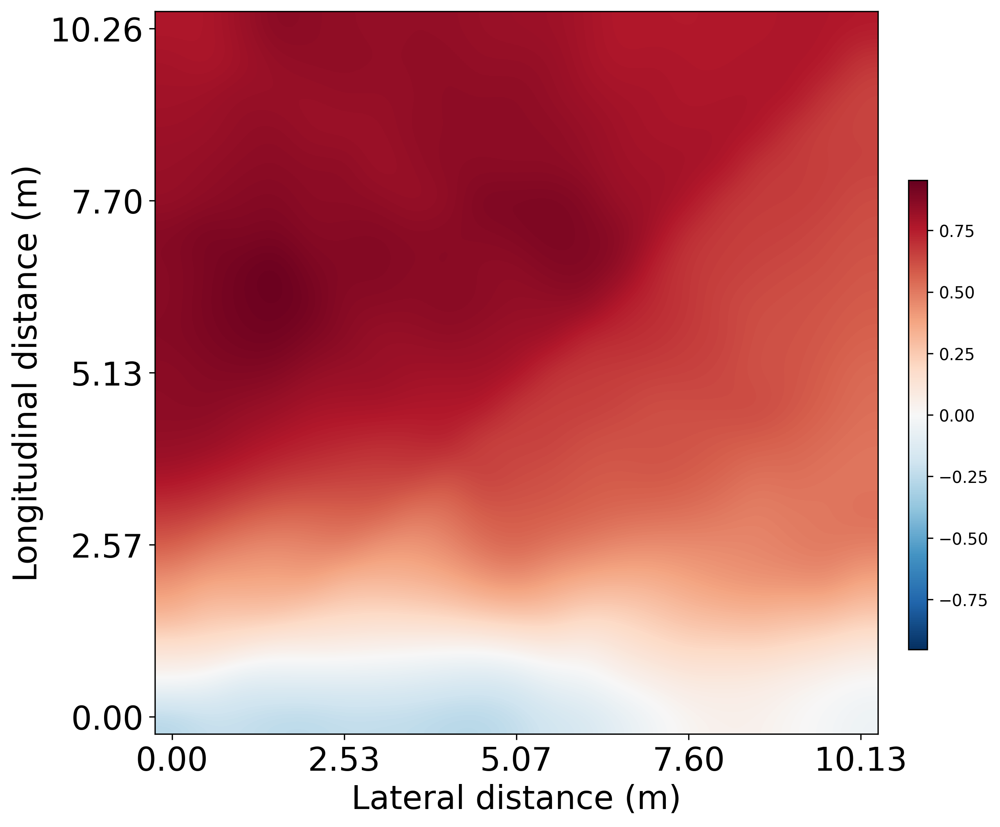

In [114]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test1_five - record_test1).max()
plt.imshow(record_test1_five - record_test1, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Lateral distance (m)',fontsize=20)
plt.ylabel('Longitudinal distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * gap_x / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*gap_y / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gapy-gapx-five.jpg')

plt.show()


In [115]:
## 横距离、横速度
record_test2_five = np.zeros((21,21))
record_test2_five_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        state_flat, all_state = env.reset()
        original_position = (gap_x  * (20 - changey) / 10 , gap_y)

        # 半径
        radius = 1  # 可以根据需要调整

        # 计算五个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 6)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]

        # 包含原行人在内，总共六个人
        all_positions = [original_position] + new_positions

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian * changex / 10 
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x * (20 - changey) / 10
        position_y_pedestrian = gap_y
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 6
        vehicle_num = 6

        # 行人状态设置
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1:, 0] = all_state[0][0][0, 0]
        all_state[0][0][1:, 1] = all_state[0][0][0, 1]
        all_state[0][0][1:, 2] = all_state[0][0][0, 2]
        all_state[0][0][1:, 3] = v_x_pedestrian
        all_state[0][0][1:, 4] = v_y_pedestrian
        all_state[0][0][1:, 5] = a_x_pedestrian
        all_state[0][0][1:, 6] = a_y_pedestrian
        all_state[0][0][1:, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        # all_state[0][2][1:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1:, :]  = np.array(new_positions)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        # state_flat[8:48] = 0
        # state_flat[64:96] = 0
        # state_flat[98:108] = 0
        # state_flat[112:] = 0

        ## 行人设置
        state_flat[0:48:8] = state_flat[0]
        state_flat[1:48:8] = state_flat[1]
        state_flat[2:48:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:48:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:48:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:48:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:48:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:48:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:108] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test2_five[changey,changex] = reward

        record_test2_five_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/3839312397.py:132: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/1957320522.py:176: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test2 Five: 6人场景 - 横距离 vs 横速度）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.9503, 2.7064]
   标准差均值: 0.0424
   CV均值: 0.1068
   CV < 0.05 比例: 97.7%
   CV < 0.10 比例: 98.0%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=1.8563, 标准差=1.3907
   无博弈奖励 (R_ARG):    均值=1.1729, 标准差=0.2400
   博弈贡献 (R_game):     均值=0.6834, 标准差=1.3555

2. 方差分解:
   Var(R_total) = 1.934031
   Var(R_ARG)   = 0.057577 (3.0%)
   Var(R_game)  = 1.837323 (95.0%)
   Cov(R_ARG, R_game) = 0.019610

3. 组件相关性:
   Corr(R_total, R_ARG)  = 0.2312
   Corr(R_total, R_game) = 0.9851
   Corr(R_ARG, R_game)   = 0.0602

4. 稳定性评估:
   CV(R_total) = 0.7492
   CV(R_ARG)   = 0.2046
   CV(R_game)  = 1.9835

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


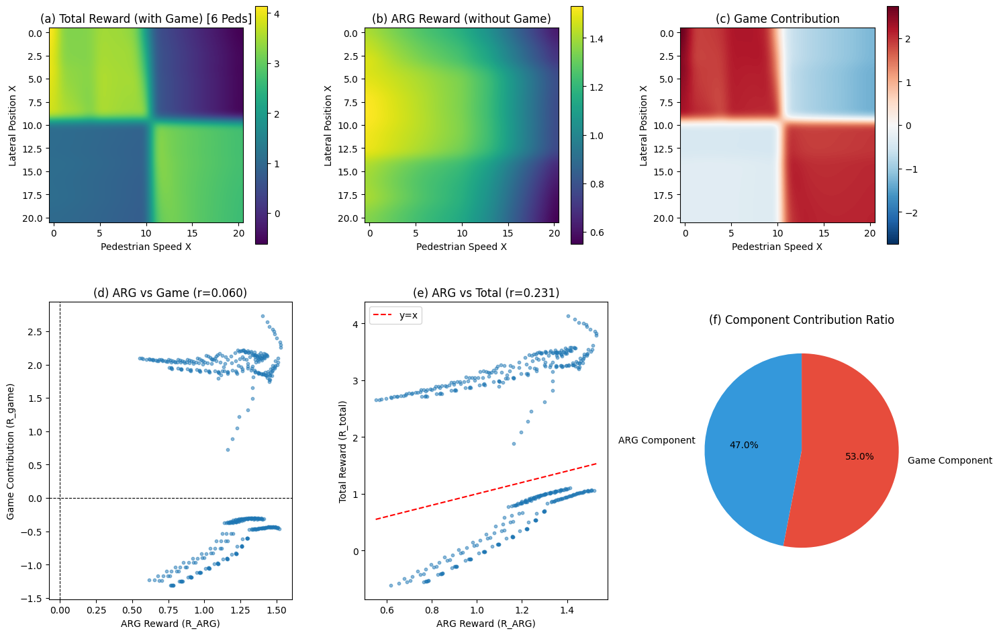

In [116]:
## 横距离、横速度 (6人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test2_five_mean = np.zeros((21, 21))
record_test2_five_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # 基础参数计算
            # ==========================================
            # changey 控制横向位置 (从 2*gap_x 到 0)
            base_pos_x = gap_x * (20 - changey) / 10
            base_pos_y = gap_y
            
            # changex 控制主行人的横向速度
            base_speed_x_main = v_x_pedestrian * changex / 10
            
            # 邻居的基础速度 (保持原代码逻辑，邻居速度为 v_x_pedestrian 常量)
            base_speed_x_neighbors = v_x_pedestrian 
            
            # 纵向速度基础值
            base_v_y_ped = v_y_pedestrian
            base_v_x_veh = v_x_vehicle
            base_v_y_veh = v_y_vehicle

            # ==========================================
            # 施加扰动
            # ==========================================
            # 主行人速度
            speed_x_ped_main = base_speed_x_main
            speed_y_ped_main = base_v_y_ped * (1 + random_noise[noise])
            
            # 邻居行人速度 (同样施加扰动)
            speed_x_ped_neighbors = base_speed_x_neighbors * (1 + random_noise[noise])
            speed_y_ped_neighbors = base_v_y_ped * (1 + random_noise[noise])
            
            # 车辆速度
            speed_x_vehicle = base_v_x_veh * (1 + random_noise[noise])
            speed_y_vehicle = base_v_y_veh * (1 + random_noise[noise])
            
            # 加速度 (保持一致或微扰，这里保持原值以对齐逻辑)
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            # ==========================================
            # 位置计算 (6人场景)
            # ==========================================
            original_position = (base_pos_x, base_pos_y)
            radius = 1 
            angles = np.linspace(0, 2 * np.pi, 6)[:-1] 
            new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]
            all_positions = [original_position] + new_positions

            position_x_pedestrian = base_pos_x
            position_y_pedestrian = base_pos_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 6
            vehicle_num = 6 

            # ==========================================
            # 状态填充 (all_state)
            # ==========================================
            
            # 1. 主行人 (Index 0)
            all_state[0][0][0, 3] = speed_x_ped_main
            all_state[0][0][0, 4] = speed_y_ped_main
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_ped_main, speed_x_ped_main))

            # 2. 邻居行人 (Index 1 onwards) - 注意这里原代码逻辑是邻居用 constant speed
            all_state[0][0][1:, 0] = all_state[0][0][0, 0] 
            all_state[0][0][1:, 1] = all_state[0][0][0, 1] 
            all_state[0][0][1:, 2] = all_state[0][0][0, 2]
            all_state[0][0][1:, 3] = speed_x_ped_neighbors # 使用扰动后的邻居速度
            all_state[0][0][1:, 4] = speed_y_ped_neighbors
            all_state[0][0][1:, 5] = acc_x_ped
            all_state[0][0][1:, 6] = acc_y_ped
            all_state[0][0][1:, 7] = (math.atan2(speed_y_ped_neighbors, speed_x_ped_neighbors))

            # 车辆状态
            all_state[0][1][0, 3] = speed_x_ped_main
            all_state[0][1][0, 4] = speed_y_ped_main
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_ped_main, speed_x_ped_main))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            # 位置设置
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1:, :] = np.array(new_positions)

            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            # ==========================================
            # state_flat 设置 (复杂切片复现)
            # ==========================================
            state_flat[0:48:8] = state_flat[0]
            state_flat[1:48:8] = state_flat[1]
            state_flat[2:48:8] = state_flat[2]
            
            # x速度: 主行人(idx 3) vs 邻居(idx 11, 19...)
            state_flat[3], state_flat[51] = [speed_x_ped_main]*2 
            state_flat[11:48:8] = speed_x_ped_neighbors 
            
            # y速度
            state_flat[4], state_flat[52] = [speed_y_ped_main]*2 
            state_flat[12:48:8] = speed_y_ped_neighbors
            
            # 加速度
            state_flat[5], state_flat[53] = [acc_x_ped]*2
            state_flat[5:48:8] = acc_x_ped
            
            state_flat[6], state_flat[54] = [acc_y_ped]*2
            state_flat[6:48:8] = acc_y_ped
            
            # 朝向
            state_flat[7], state_flat[55] = [math.atan2(speed_y_ped_main, speed_x_ped_main)]*2
            state_flat[7:48:8] = math.atan2(speed_y_ped_neighbors, speed_x_ped_neighbors)

            # 位置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:108] = np.array(new_positions).flatten()

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            # 车辆
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test2_five_mean[changey, changex] = np.mean(rewards_game)
        record_test2_five_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test2_five_std / (np.abs(record_test2_five_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test2 Five: 6人场景 - 横距离 vs 横速度）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test2_five_mean.min():.4f}, {record_test2_five_mean.max():.4f}]")
print(f"   标准差均值: {record_test2_five_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test2_five - record_test2_five_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test2_five.mean():.4f}, 标准差={record_test2_five.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test2_five_nongame.mean():.4f}, 标准差={record_test2_five_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test2_five.var()
arg_variance = record_test2_five_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test2_five_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test2_five.flatten(), record_test2_five_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test2_five.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test2_five_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test2_five.std() / (np.abs(record_test2_five.mean()) + 1e-8)
cv_arg = record_test2_five_nongame.std() / (np.abs(record_test2_five_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test2_five, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [6 Peds]', fontsize=12)
ax1.set_xlabel('Pedestrian Speed X')
ax1.set_ylabel('Lateral Position X')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test2_five_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Speed X')
ax2.set_ylabel('Lateral Position X')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Speed X')
ax3.set_ylabel('Lateral Position X')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test2_five_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test2_five_nongame.flatten(), record_test2_five.flatten(), alpha=0.5, s=10)
ax5.plot([record_test2_five_nongame.min(), record_test2_five_nongame.max()], 
         [record_test2_five_nongame.min(), record_test2_five_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test2_five_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test2_five.pdf', dpi=300, bbox_inches='tight')
plt.show()

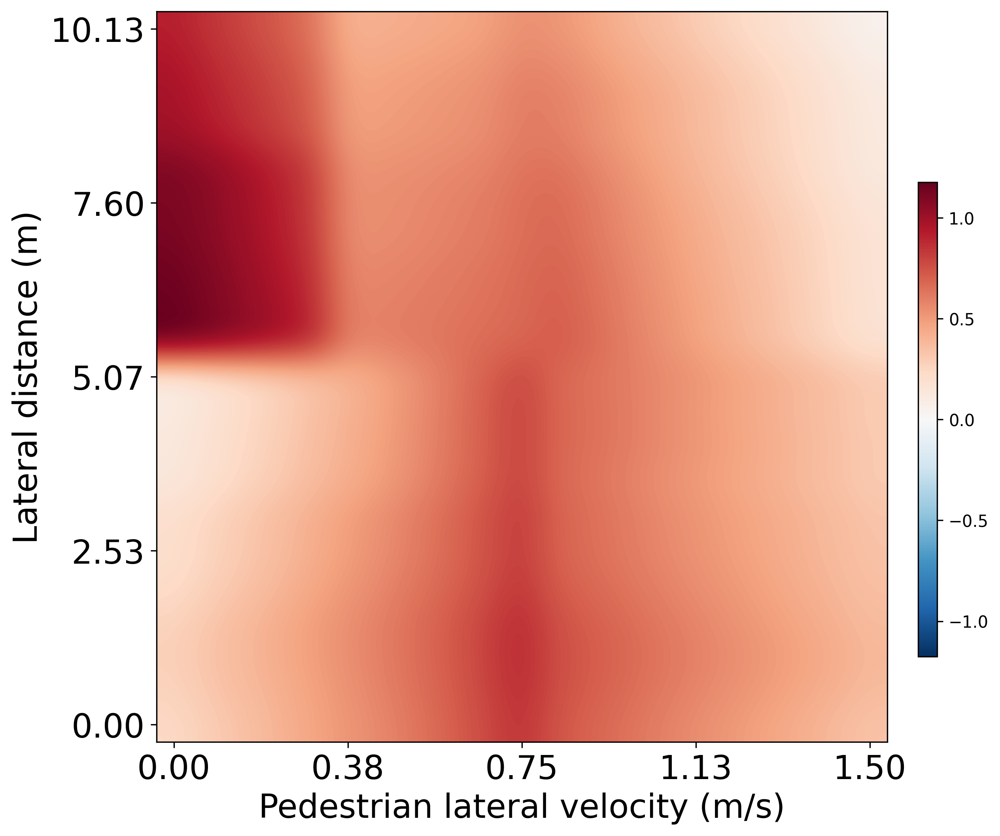

In [117]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test2_five - record_test2).max()
plt.imshow(record_test2_five - record_test2, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Pedestrian lateral velocity (m/s)',fontsize=20)
plt.ylabel('Lateral distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * v_x_pedestrian / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*gap_x / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gapx-vpx-five.jpg')

plt.show()


In [118]:
## 纵距离、纵速度
record_test3_five = np.zeros((21,21))
record_test3_five_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        state_flat, all_state = env.reset()
        original_position = (gap_x , gap_y * (20 - changey) / 10)

        # 半径
        radius = 1  # 可以根据需要调整

        # 计算五个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 6)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]

        # 包含原行人在内，总共六个人
        all_positions = [original_position] + new_positions

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian * changex / 10 
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x
        position_y_pedestrian = gap_y * (20 - changey) / 10
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 6
        vehicle_num = 6

        # 行人状态设置
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1:, 0] = all_state[0][0][0, 0]
        all_state[0][0][1:, 1] = all_state[0][0][0, 1]
        all_state[0][0][1:, 2] = all_state[0][0][0, 2]
        all_state[0][0][1:, 3] = v_x_pedestrian
        all_state[0][0][1:, 4] = v_y_pedestrian
        all_state[0][0][1:, 5] = a_x_pedestrian
        all_state[0][0][1:, 6] = a_y_pedestrian
        all_state[0][0][1:, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        # all_state[0][2][1:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1:, :]  = np.array(new_positions)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        # state_flat[8:48] = 0
        # state_flat[64:96] = 0
        # state_flat[98:108] = 0
        # state_flat[112:] = 0

        ## 行人设置
        state_flat[0:48:8] = state_flat[0]
        state_flat[1:48:8] = state_flat[1]
        state_flat[2:48:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:48:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:48:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:48:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:48:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:48:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:108] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test3_five[changey,changex] = reward

        record_test3_five_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/4063713761.py:132: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/1600156413.py:176: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test3 Five: 6人场景 - 纵距离 vs 纵速度）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.1296, 3.3200]
   标准差均值: 0.0254
   CV均值: 0.0437
   CV < 0.05 比例: 84.8%
   CV < 0.10 比例: 90.7%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=2.2421, 标准差=1.2535
   无博弈奖励 (R_ARG):    均值=1.2105, 标准差=0.3866
   博弈贡献 (R_game):     均值=1.0316, 标准差=1.2214

2. 方差分解:
   Var(R_total) = 1.571379
   Var(R_ARG)   = 0.149449 (9.5%)
   Var(R_game)  = 1.491701 (94.9%)
   Cov(R_ARG, R_game) = -0.034965

3. 组件相关性:
   Corr(R_total, R_ARG)  = 0.2364
   Corr(R_total, R_game) = 0.9515
   Corr(R_ARG, R_game)   = -0.0739

4. 稳定性评估:
   CV(R_total) = 0.5591
   CV(R_ARG)   = 0.3194
   CV(R_game)  = 1.1839

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


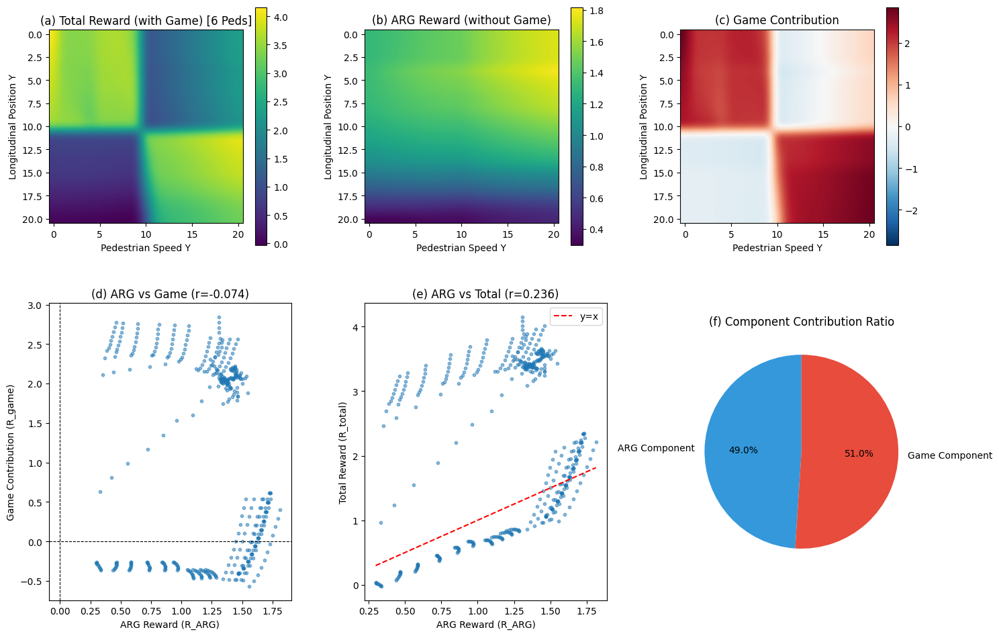

In [119]:
## 纵距离、纵速度 (6人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test3_five_mean = np.zeros((21, 21))
record_test3_five_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # 基础参数计算
            # ==========================================
            # changey 控制纵向位置 (从 2*gap_y 到 0)
            base_pos_x = gap_x
            base_pos_y = gap_y * (20 - changey) / 10
            
            # changex 控制主行人的纵向速度
            base_speed_y_main = v_y_pedestrian * changex / 10
            
            # 邻居的基础速度 (保持原代码逻辑，邻居速度为 v_y_pedestrian 常量)
            base_speed_y_neighbors = v_y_pedestrian
            
            # 横向速度基础值
            base_v_x_ped = v_x_pedestrian
            base_v_x_veh = v_x_vehicle
            base_v_y_veh = v_y_vehicle

            # ==========================================
            # 施加扰动
            # ==========================================
            # 主行人速度
            speed_x_ped_main = base_v_x_ped * (1 + random_noise[noise])
            speed_y_ped_main = base_speed_y_main
            
            # 邻居行人速度 (同样施加扰动)
            speed_x_ped_neighbors = base_v_x_ped * (1 + random_noise[noise])
            speed_y_ped_neighbors = base_speed_y_neighbors * (1 + random_noise[noise])
            
            # 车辆速度
            speed_x_vehicle = base_v_x_veh * (1 + random_noise[noise])
            speed_y_vehicle = base_v_y_veh * (1 + random_noise[noise])
            
            # 加速度 (保持一致或微扰，这里保持原值以对齐逻辑)
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            # ==========================================
            # 位置计算 (6人场景)
            # ==========================================
            original_position = (base_pos_x, base_pos_y)
            radius = 1 
            angles = np.linspace(0, 2 * np.pi, 6)[:-1] 
            new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]
            all_positions = [original_position] + new_positions

            position_x_pedestrian = base_pos_x
            position_y_pedestrian = base_pos_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 6
            vehicle_num = 6 

            # ==========================================
            # 状态填充 (all_state)
            # ==========================================
            
            # 1. 主行人 (Index 0)
            all_state[0][0][0, 3] = speed_x_ped_main
            all_state[0][0][0, 4] = speed_y_ped_main
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_ped_main, speed_x_ped_main))

            # 2. 邻居行人 (Index 1 onwards)
            all_state[0][0][1:, 0] = all_state[0][0][0, 0] 
            all_state[0][0][1:, 1] = all_state[0][0][0, 1] 
            all_state[0][0][1:, 2] = all_state[0][0][0, 2]
            all_state[0][0][1:, 3] = speed_x_ped_neighbors 
            all_state[0][0][1:, 4] = speed_y_ped_neighbors # 使用扰动后的邻居速度
            all_state[0][0][1:, 5] = acc_x_ped
            all_state[0][0][1:, 6] = acc_y_ped
            all_state[0][0][1:, 7] = (math.atan2(speed_y_ped_neighbors, speed_x_ped_neighbors))

            # 车辆状态
            all_state[0][1][0, 3] = speed_x_ped_main
            all_state[0][1][0, 4] = speed_y_ped_main
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_ped_main, speed_x_ped_main))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            # 位置设置
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1:, :] = np.array(new_positions)

            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            # ==========================================
            # state_flat 设置 (复杂切片复现)
            # ==========================================
            state_flat[0:48:8] = state_flat[0]
            state_flat[1:48:8] = state_flat[1]
            state_flat[2:48:8] = state_flat[2]
            
            # x速度
            state_flat[3], state_flat[51] = [speed_x_ped_main]*2 
            state_flat[11:48:8] = speed_x_ped_neighbors 
            
            # y速度: 主行人(idx 4) vs 邻居(idx 12, 20...)
            state_flat[4], state_flat[52] = [speed_y_ped_main]*2 
            state_flat[12:48:8] = speed_y_ped_neighbors
            
            # 加速度
            state_flat[5], state_flat[53] = [acc_x_ped]*2
            state_flat[5:48:8] = acc_x_ped
            
            state_flat[6], state_flat[54] = [acc_y_ped]*2
            state_flat[6:48:8] = acc_y_ped
            
            # 朝向
            state_flat[7], state_flat[55] = [math.atan2(speed_y_ped_main, speed_x_ped_main)]*2
            state_flat[7:48:8] = math.atan2(speed_y_ped_neighbors, speed_x_ped_neighbors)

            # 位置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:108] = np.array(new_positions).flatten()

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            # 车辆
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test3_five_mean[changey, changex] = np.mean(rewards_game)
        record_test3_five_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test3_five_std / (np.abs(record_test3_five_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test3 Five: 6人场景 - 纵距离 vs 纵速度）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test3_five_mean.min():.4f}, {record_test3_five_mean.max():.4f}]")
print(f"   标准差均值: {record_test3_five_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test3_five - record_test3_five_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test3_five.mean():.4f}, 标准差={record_test3_five.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test3_five_nongame.mean():.4f}, 标准差={record_test3_five_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test3_five.var()
arg_variance = record_test3_five_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test3_five_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test3_five.flatten(), record_test3_five_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test3_five.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test3_five_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test3_five.std() / (np.abs(record_test3_five.mean()) + 1e-8)
cv_arg = record_test3_five_nongame.std() / (np.abs(record_test3_five_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test3_five, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [6 Peds]', fontsize=12)
ax1.set_xlabel('Pedestrian Speed Y')
ax1.set_ylabel('Longitudinal Position Y')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test3_five_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Speed Y')
ax2.set_ylabel('Longitudinal Position Y')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Speed Y')
ax3.set_ylabel('Longitudinal Position Y')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test3_five_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test3_five_nongame.flatten(), record_test3_five.flatten(), alpha=0.5, s=10)
ax5.plot([record_test3_five_nongame.min(), record_test3_five_nongame.max()], 
         [record_test3_five_nongame.min(), record_test3_five_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test3_five_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test3_five.pdf', dpi=300, bbox_inches='tight')
plt.show()

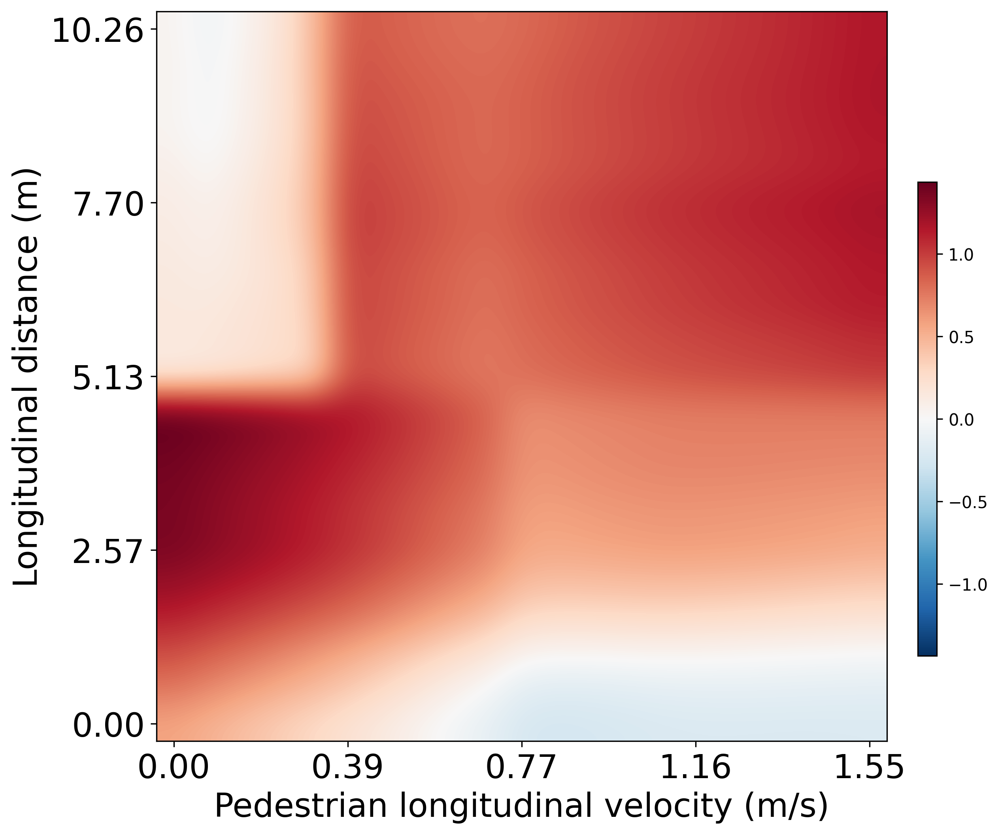

In [120]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test3_five - record_test3).max()
plt.imshow(record_test3_five - record_test3, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Pedestrian longitudinal velocity (m/s)',fontsize=20)
plt.ylabel('Longitudinal distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * v_y_pedestrian / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*gap_y / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gapy-vpy-five.jpg')

plt.show()


In [121]:
## 车横速度、横距离
record_test4_five = np.zeros((21,21))
record_test4_five_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        state_flat, all_state = env.reset()
        original_position = (gap_x * changex / 10  , gap_y )

        # 半径
        radius = 1  # 可以根据需要调整

        # 计算五个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 6)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]

        # 包含原行人在内，总共六个人
        all_positions = [original_position] + new_positions

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle* (20 - changey) / 10
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x * changex / 10
        position_y_pedestrian = gap_y
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 6
        vehicle_num = 6

        # 行人状态设置
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1:, 0] = all_state[0][0][0, 0]
        all_state[0][0][1:, 1] = all_state[0][0][0, 1]
        all_state[0][0][1:, 2] = all_state[0][0][0, 2]
        all_state[0][0][1:, 3] = v_x_pedestrian
        all_state[0][0][1:, 4] = v_y_pedestrian
        all_state[0][0][1:, 5] = a_x_pedestrian
        all_state[0][0][1:, 6] = a_y_pedestrian
        all_state[0][0][1:, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        # all_state[0][2][1:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1:, :]  = np.array(new_positions)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        # state_flat[8:48] = 0
        # state_flat[64:96] = 0
        # state_flat[98:108] = 0
        # state_flat[112:] = 0

        ## 行人设置
        state_flat[0:48:8] = state_flat[0]
        state_flat[1:48:8] = state_flat[1]
        state_flat[2:48:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:48:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:48:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:48:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:48:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:48:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:108] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test4_five[changey,changex] = reward

        record_test4_five_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/4089580420.py:132: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/2788621742.py:166: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test4 Five: 6人场景 - 车横速度 vs 横距离）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.2333, 3.0764]
   标准差均值: 0.0551
   CV均值: 0.2217
   CV < 0.05 比例: 88.0%
   CV < 0.10 比例: 89.8%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=1.6080, 标准差=1.0788
   无博弈奖励 (R_ARG):    均值=1.1881, 标准差=0.1521
   博弈贡献 (R_game):     均值=0.4198, 标准差=1.1489

2. 方差分解:
   Var(R_total) = 1.163765
   Var(R_ARG)   = 0.023125 (2.0%)
   Var(R_game)  = 1.320047 (113.4%)
   Cov(R_ARG, R_game) = -0.089907

3. 组件相关性:
   Corr(R_total, R_ARG)  = -0.4058
   Corr(R_total, R_game) = 0.9927
   Corr(R_ARG, R_game)   = -0.5134

4. 稳定性评估:
   CV(R_total) = 0.6709
   CV(R_ARG)   = 0.1280
   CV(R_game)  = 2.7366


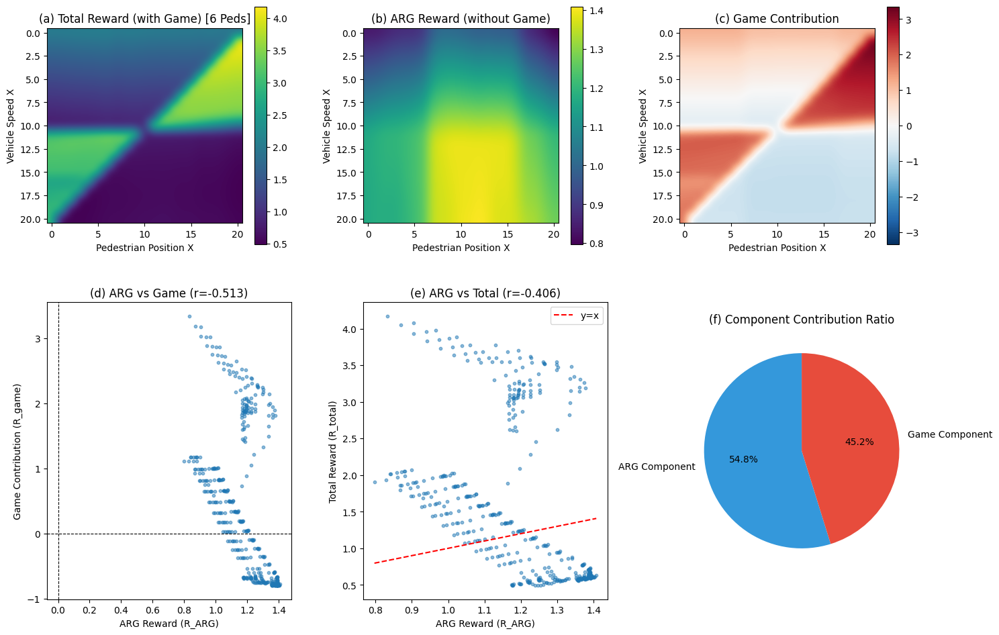

In [122]:
## 车横速度、横距离 (6人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test4_five_mean = np.zeros((21, 21))
record_test4_five_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # 基础参数计算
            # ==========================================
            # changey 控制车辆横向速度 (从 2*v_x 到 0)
            base_speed_x_veh = v_x_vehicle * (20 - changey) / 10
            
            # changex 控制行人横向位置
            base_pos_x = gap_x * changex / 10
            base_pos_y = gap_y
            
            # 其他基础速度
            base_v_x_ped = v_x_pedestrian
            base_v_y_ped = v_y_pedestrian
            base_v_y_veh = v_y_vehicle

            # ==========================================
            # 施加扰动
            # ==========================================
            # 行人速度 (主行人 + 邻居)
            speed_x_pedestrian = base_v_x_ped * (1 + random_noise[noise])
            speed_y_pedestrian = base_v_y_ped * (1 + random_noise[noise])
            
            # 车辆速度
            speed_x_vehicle = base_speed_x_veh
            speed_y_vehicle = base_v_y_veh * (1 + random_noise[noise])
            
            # 加速度 (保持原值)
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            # ==========================================
            # 位置计算 (6人场景)
            # ==========================================
            original_position = (base_pos_x, base_pos_y)
            radius = 1 
            angles = np.linspace(0, 2 * np.pi, 6)[:-1] 
            new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]
            all_positions = [original_position] + new_positions

            position_x_pedestrian = base_pos_x
            position_y_pedestrian = base_pos_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 6
            vehicle_num = 6 

            # ==========================================
            # 状态填充 (all_state)
            # ==========================================
            
            # 1. 主行人 (Index 0)
            all_state[0][0][0, 3] = speed_x_pedestrian
            all_state[0][0][0, 4] = speed_y_pedestrian
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 2. 邻居行人 (Index 1 onwards)
            all_state[0][0][1:, 0] = all_state[0][0][0, 0] 
            all_state[0][0][1:, 1] = all_state[0][0][0, 1] 
            all_state[0][0][1:, 2] = all_state[0][0][0, 2]
            all_state[0][0][1:, 3] = speed_x_pedestrian
            all_state[0][0][1:, 4] = speed_y_pedestrian
            all_state[0][0][1:, 5] = acc_x_ped
            all_state[0][0][1:, 6] = acc_y_ped
            all_state[0][0][1:, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 车辆状态
            all_state[0][1][0, 3] = speed_x_pedestrian
            all_state[0][1][0, 4] = speed_y_pedestrian
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            # 位置设置
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1:, :] = np.array(new_positions)

            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            # ==========================================
            # state_flat 设置
            # ==========================================
            state_flat[0:48:8] = state_flat[0]
            state_flat[1:48:8] = state_flat[1]
            state_flat[2:48:8] = state_flat[2]
            
            # 速度与加速度设置 (扰动后)
            state_flat[3], state_flat[51] = [speed_x_pedestrian]*2 
            state_flat[11:48:8] = speed_x_pedestrian 
            
            state_flat[4], state_flat[52] = [speed_y_pedestrian]*2 
            state_flat[12:48:8] = speed_y_pedestrian
            
            state_flat[5], state_flat[53] = [acc_x_ped]*2
            state_flat[5:48:8] = acc_x_ped
            
            state_flat[6], state_flat[54] = [acc_y_ped]*2
            state_flat[6:48:8] = acc_y_ped
            
            state_flat[7], state_flat[55] = [math.atan2(speed_y_pedestrian, speed_x_pedestrian)]*2
            state_flat[7:48:8] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            # 位置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:108] = np.array(new_positions).flatten()

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            # 车辆
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test4_five_mean[changey, changex] = np.mean(rewards_game)
        record_test4_five_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test4_five_std / (np.abs(record_test4_five_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test4 Five: 6人场景 - 车横速度 vs 横距离）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test4_five_mean.min():.4f}, {record_test4_five_mean.max():.4f}]")
print(f"   标准差均值: {record_test4_five_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test4_five - record_test4_five_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test4_five.mean():.4f}, 标准差={record_test4_five.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test4_five_nongame.mean():.4f}, 标准差={record_test4_five_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test4_five.var()
arg_variance = record_test4_five_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test4_five_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test4_five.flatten(), record_test4_five_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test4_five.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test4_five_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test4_five.std() / (np.abs(record_test4_five.mean()) + 1e-8)
cv_arg = record_test4_five_nongame.std() / (np.abs(record_test4_five_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test4_five, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [6 Peds]', fontsize=12)
ax1.set_xlabel('Pedestrian Position X')
ax1.set_ylabel('Vehicle Speed X')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test4_five_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Position X')
ax2.set_ylabel('Vehicle Speed X')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Position X')
ax3.set_ylabel('Vehicle Speed X')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test4_five_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test4_five_nongame.flatten(), record_test4_five.flatten(), alpha=0.5, s=10)
ax5.plot([record_test4_five_nongame.min(), record_test4_five_nongame.max()], 
         [record_test4_five_nongame.min(), record_test4_five_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test4_five_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test4_five.pdf', dpi=300, bbox_inches='tight')
plt.show()

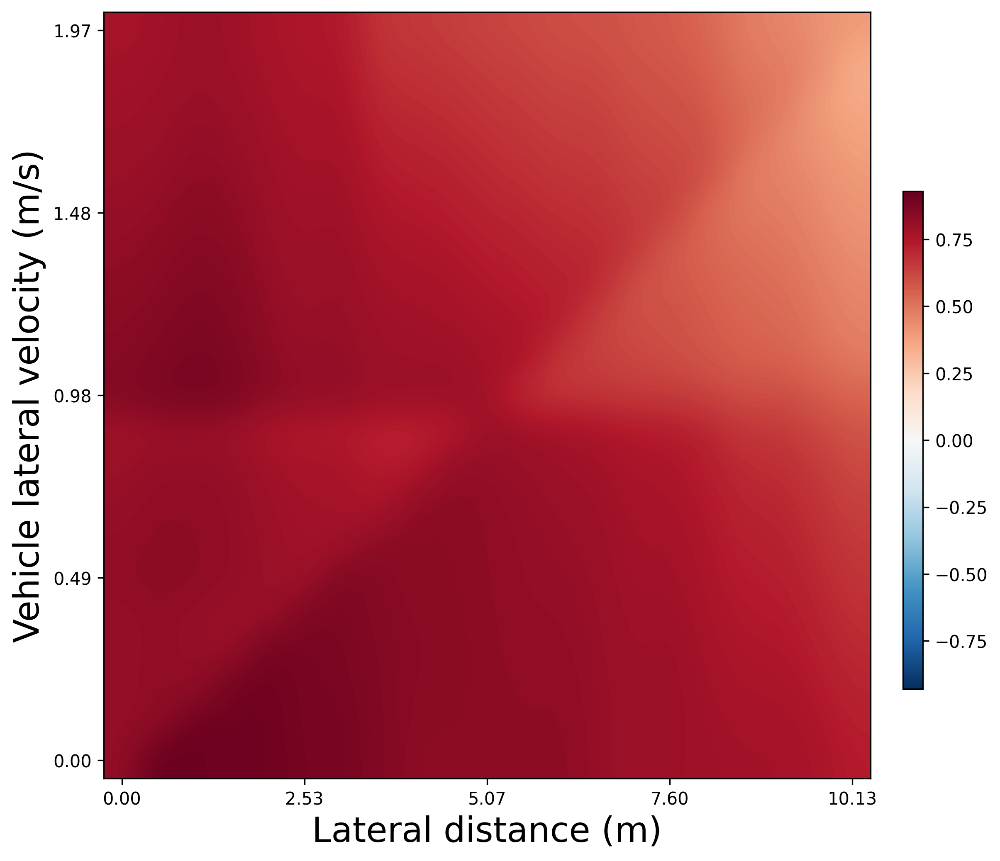

In [123]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test4_five - record_test_4).max()
plt.imshow(record_test4_five - record_test_4, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Lateral distance (m)',fontsize=20)
plt.ylabel('Vehicle lateral velocity (m/s)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * gap_x / 10:.2f}" for i in np.arange(0,21,5)])
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*v_x_vehicle / 10:.2f}" for i in np.arange(0,21,5)])
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/vvx-gapx-five.jpg')

plt.show()


In [124]:
## 车纵速度、纵距离
record_test5_five = np.zeros((21,21))
record_test5_five_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        state_flat, all_state = env.reset()
        original_position = (gap_x , gap_y * changex / 10)

        # 半径
        radius = 1  # 可以根据需要调整

        # 计算五个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 6)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]

        # 包含原行人在内，总共六个人
        all_positions = [original_position] + new_positions

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle * (20 - changey) / 10

        position_x_pedestrian = gap_x 
        position_y_pedestrian = gap_y * changex / 10
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 6
        vehicle_num = 6

        # 行人状态设置
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1:, 0] = all_state[0][0][0, 0]
        all_state[0][0][1:, 1] = all_state[0][0][0, 1]
        all_state[0][0][1:, 2] = all_state[0][0][0, 2]
        all_state[0][0][1:, 3] = v_x_pedestrian
        all_state[0][0][1:, 4] = v_y_pedestrian
        all_state[0][0][1:, 5] = a_x_pedestrian
        all_state[0][0][1:, 6] = a_y_pedestrian
        all_state[0][0][1:, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        # all_state[0][2][1:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1:, :]  = np.array(new_positions)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        # state_flat[8:48] = 0
        # state_flat[64:96] = 0
        # state_flat[98:108] = 0
        # state_flat[112:] = 0

        ## 行人设置
        state_flat[0:48:8] = state_flat[0]
        state_flat[1:48:8] = state_flat[1]
        state_flat[2:48:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:48:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:48:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:48:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:48:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:48:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:108] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test5_five[changey,changex] = reward

        record_test5_five_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state, 
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/2749345233.py:132: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/3556987734.py:166: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test5 Five: 6人场景 - 车纵速度 vs 纵距离）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.4047, 5.0935]
   标准差均值: 0.0877
   CV均值: 0.5298
   CV < 0.05 比例: 83.9%
   CV < 0.10 比例: 88.0%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=1.4858, 标准差=1.1602
   无博弈奖励 (R_ARG):    均值=1.1366, 标准差=0.3768
   博弈贡献 (R_game):     均值=0.3492, 标准差=1.1704

2. 方差分解:
   Var(R_total) = 1.346096
   Var(R_ARG)   = 0.141996 (10.5%)
   Var(R_game)  = 1.369865 (101.8%)
   Cov(R_ARG, R_game) = -0.083071

3. 组件相关性:
   Corr(R_total, R_ARG)  = 0.1352
   Corr(R_total, R_game) = 0.9478
   Corr(R_ARG, R_game)   = -0.1879

4. 稳定性评估:
   CV(R_total) = 0.7809
   CV(R_ARG)   = 0.3315
   CV(R_game)  = 3.3514

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


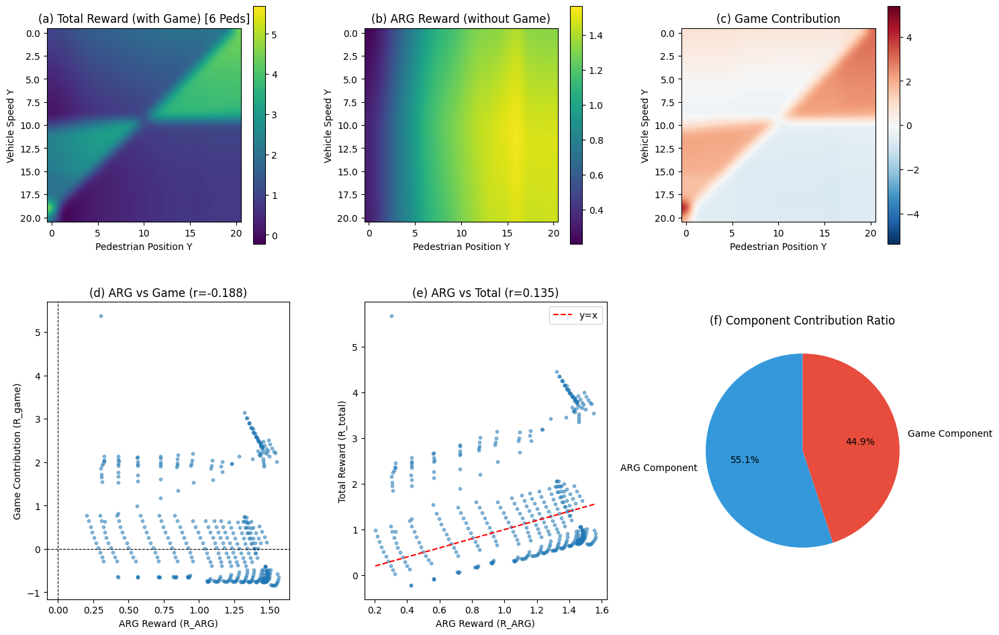

In [125]:
## 车纵速度、纵距离 (6人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test5_five_mean = np.zeros((21, 21))
record_test5_five_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # 基础参数计算
            # ==========================================
            # changey 控制车辆纵向速度 (从 2*v_y 到 0)
            base_speed_y_veh = v_y_vehicle * (20 - changey) / 10
            
            # changex 控制行人纵向位置
            base_pos_x = gap_x
            base_pos_y = gap_y * changex / 10
            
            # 其他基础速度
            base_v_x_ped = v_x_pedestrian
            base_v_y_ped = v_y_pedestrian
            base_v_x_veh = v_x_vehicle

            # ==========================================
            # 施加扰动
            # ==========================================
            # 行人速度 (主行人 + 邻居)
            speed_x_pedestrian = base_v_x_ped * (1 + random_noise[noise])
            speed_y_pedestrian = base_v_y_ped * (1 + random_noise[noise])
            
            # 车辆速度
            speed_x_vehicle = base_v_x_veh * (1 + random_noise[noise])
            speed_y_vehicle = base_speed_y_veh
            
            # 加速度 (保持原值)
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            # ==========================================
            # 位置计算 (6人场景)
            # ==========================================
            original_position = (base_pos_x, base_pos_y)
            radius = 1 
            angles = np.linspace(0, 2 * np.pi, 6)[:-1] 
            new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]
            all_positions = [original_position] + new_positions

            position_x_pedestrian = base_pos_x
            position_y_pedestrian = base_pos_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 6
            vehicle_num = 6 

            # ==========================================
            # 状态填充 (all_state)
            # ==========================================
            
            # 1. 主行人 (Index 0)
            all_state[0][0][0, 3] = speed_x_pedestrian
            all_state[0][0][0, 4] = speed_y_pedestrian
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 2. 邻居行人 (Index 1 onwards)
            all_state[0][0][1:, 0] = all_state[0][0][0, 0] 
            all_state[0][0][1:, 1] = all_state[0][0][0, 1] 
            all_state[0][0][1:, 2] = all_state[0][0][0, 2]
            all_state[0][0][1:, 3] = speed_x_pedestrian
            all_state[0][0][1:, 4] = speed_y_pedestrian
            all_state[0][0][1:, 5] = acc_x_ped
            all_state[0][0][1:, 6] = acc_y_ped
            all_state[0][0][1:, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 车辆状态
            all_state[0][1][0, 3] = speed_x_pedestrian
            all_state[0][1][0, 4] = speed_y_pedestrian
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            # 位置设置
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1:, :] = np.array(new_positions)

            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            # ==========================================
            # state_flat 设置
            # ==========================================
            state_flat[0:48:8] = state_flat[0]
            state_flat[1:48:8] = state_flat[1]
            state_flat[2:48:8] = state_flat[2]
            
            # 速度与加速度设置 (扰动后)
            state_flat[3], state_flat[51] = [speed_x_pedestrian]*2 
            state_flat[11:48:8] = speed_x_pedestrian 
            
            state_flat[4], state_flat[52] = [speed_y_pedestrian]*2 
            state_flat[12:48:8] = speed_y_pedestrian
            
            state_flat[5], state_flat[53] = [acc_x_ped]*2
            state_flat[5:48:8] = acc_x_ped
            
            state_flat[6], state_flat[54] = [acc_y_ped]*2
            state_flat[6:48:8] = acc_y_ped
            
            state_flat[7], state_flat[55] = [math.atan2(speed_y_pedestrian, speed_x_pedestrian)]*2
            state_flat[7:48:8] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            # 位置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:108] = np.array(new_positions).flatten()

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            # 车辆
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test5_five_mean[changey, changex] = np.mean(rewards_game)
        record_test5_five_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test5_five_std / (np.abs(record_test5_five_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test5 Five: 6人场景 - 车纵速度 vs 纵距离）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test5_five_mean.min():.4f}, {record_test5_five_mean.max():.4f}]")
print(f"   标准差均值: {record_test5_five_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test5_five - record_test5_five_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test5_five.mean():.4f}, 标准差={record_test5_five.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test5_five_nongame.mean():.4f}, 标准差={record_test5_five_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test5_five.var()
arg_variance = record_test5_five_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test5_five_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test5_five.flatten(), record_test5_five_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test5_five.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test5_five_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test5_five.std() / (np.abs(record_test5_five.mean()) + 1e-8)
cv_arg = record_test5_five_nongame.std() / (np.abs(record_test5_five_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test5_five, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [6 Peds]', fontsize=12)
ax1.set_xlabel('Pedestrian Position Y')
ax1.set_ylabel('Vehicle Speed Y')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test5_five_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Position Y')
ax2.set_ylabel('Vehicle Speed Y')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Position Y')
ax3.set_ylabel('Vehicle Speed Y')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test5_five_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test5_five_nongame.flatten(), record_test5_five.flatten(), alpha=0.5, s=10)
ax5.plot([record_test5_five_nongame.min(), record_test5_five_nongame.max()], 
         [record_test5_five_nongame.min(), record_test5_five_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test5_five_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test5_five.pdf', dpi=300, bbox_inches='tight')
plt.show()

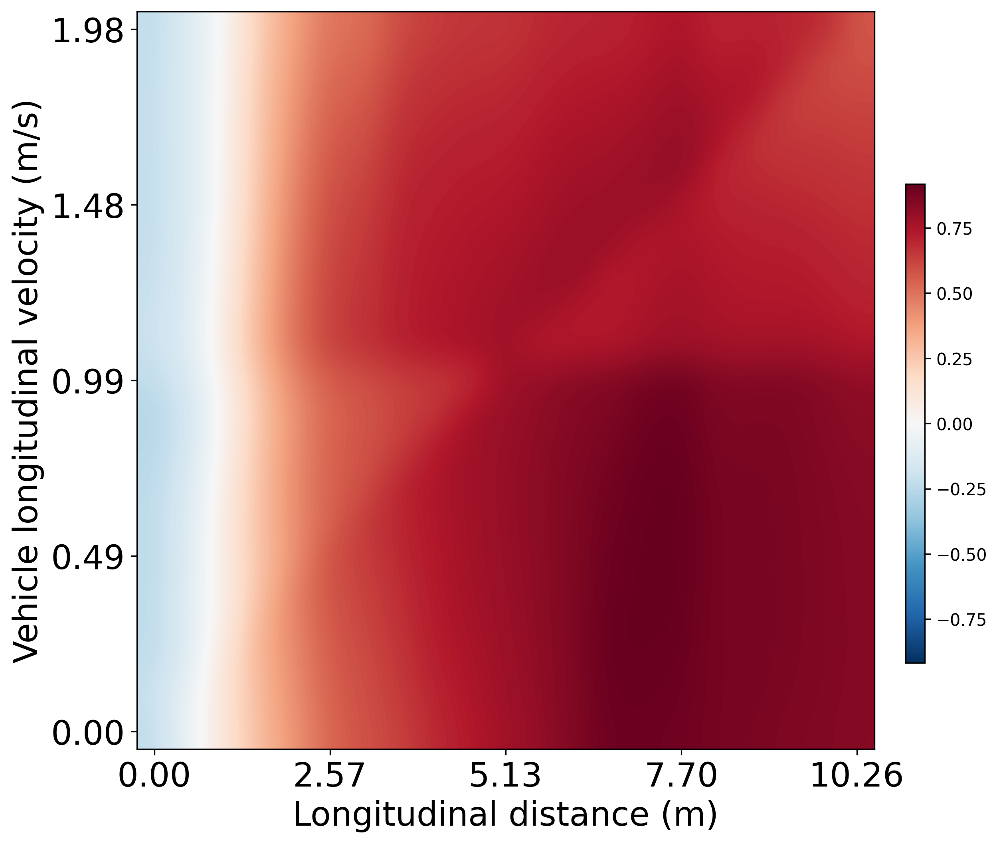

In [126]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test5_five - record_test5).max()
plt.imshow(record_test5_five - record_test5, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Longitudinal distance (m)',fontsize=20)
plt.ylabel('Vehicle longitudinal velocity (m/s)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * gap_y / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*v_y_vehicle / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/vvy-gapy-five.jpg')

plt.show()


## 四等环绕

In [127]:
## 纵向距离，横向距离
record_test1_four = np.zeros((21,21))
record_test1_four_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        import numpy as np

        # 假设原行人的位置为 (gap_x, gap_y)
        original_position = (gap_x * (changex) / 10, gap_y  * (20 - changey) / 10)

        # 半径
        radius = 1   # 可以根据需要调整

        # 计算四个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 5)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]

        state_flat, all_state = env.reset()

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x * (changex) / 10
        position_y_pedestrian = gap_y  * (20 - changey) / 10
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 5
        vehicle_num = 6

        # 行人状态设置
        all_state[0][0][5:, :] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1:5, 0] = all_state[0][0][0, 0]
        all_state[0][0][1:5, 1] = all_state[0][0][0, 1]
        all_state[0][0][1:5, 2] = all_state[0][0][0, 2]
        all_state[0][0][1:5, 3] = v_x_pedestrian
        all_state[0][0][1:5, 4] = v_y_pedestrian
        all_state[0][0][1:5, 5] = a_x_pedestrian
        all_state[0][0][1:5, 6] = a_y_pedestrian
        all_state[0][0][1:5, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][5:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1:5, :]  = np.array(new_positions)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[40:48] = 0
        # state_flat[64:96] = 0
        state_flat[106:108] = 0
        # state_flat[112:] = 0

        ## 行人设置
        state_flat[0:40:8] = state_flat[0]
        state_flat[1:40:8] = state_flat[1]
        state_flat[2:40:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:40:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:40:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:40:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:40:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:40:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:106] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test1_four[changey,changex] = reward

        record_test1_four_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state, 
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/892702904.py:134: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/2708225569.py:168: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test1 Four: 5人场景 - 横纵距离改变）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.4082, 3.2155]
   标准差均值: 0.0165
   CV均值: 0.1201
   CV < 0.05 比例: 85.3%
   CV < 0.10 比例: 92.7%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=1.5277, 标准差=0.9010
   无博弈奖励 (R_ARG):    均值=1.1753, 标准差=0.3034
   博弈贡献 (R_game):     均值=0.3524, 标准差=0.9184

2. 方差分解:
   Var(R_total) = 0.811720
   Var(R_ARG)   = 0.092034 (11.3%)
   Var(R_game)  = 0.843474 (103.9%)
   Cov(R_ARG, R_game) = -0.062034

3. 组件相关性:
   Corr(R_total, R_ARG)  = 0.1103
   Corr(R_total, R_game) = 0.9446
   Corr(R_ARG, R_game)   = -0.2221

4. 稳定性评估:
   CV(R_total) = 0.5898
   CV(R_ARG)   = 0.2581
   CV(R_game)  = 2.6065

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


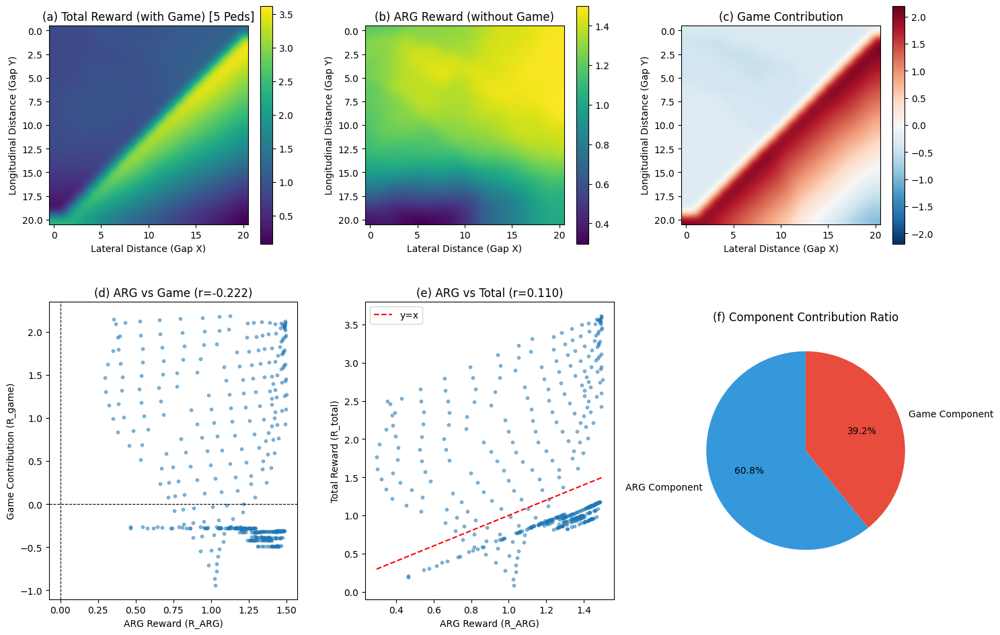

In [128]:
## 纵向距离，横向距离 (5人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test1_four_mean = np.zeros((21, 21))
record_test1_four_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # 基础参数计算 (5人场景)
            # ==========================================
            # 位置基础值
            base_pos_x = gap_x * changex / 10
            base_pos_y = gap_y * (20 - changey) / 10
            
            # 速度基础值
            base_v_x_ped = v_x_pedestrian
            base_v_y_ped = v_y_pedestrian
            base_v_x_veh = v_x_vehicle
            base_v_y_veh = v_y_vehicle

            # ==========================================
            # 施加扰动
            # ==========================================
            # 对所有行人和车辆的速度施加微小扰动
            speed_x_pedestrian = base_v_x_ped * (1 + random_noise[noise])
            speed_y_pedestrian = base_v_y_ped * (1 + random_noise[noise])
            speed_x_vehicle = base_v_x_veh * (1 + random_noise[noise])
            speed_y_vehicle = base_v_y_veh * (1 + random_noise[noise])
            
            # 加速度 (保持原值)
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            # ==========================================
            # 位置计算 (5人场景: 1 Main + 4 Neighbors)
            # ==========================================
            original_position = (base_pos_x, base_pos_y)
            radius = 1 
            # 4个邻居
            angles = np.linspace(0, 2 * np.pi, 5)[:-1] 
            new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]
            
            position_x_pedestrian = base_pos_x
            position_y_pedestrian = base_pos_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 5
            vehicle_num = 6 

            # ==========================================
            # 状态填充 (all_state)
            # ==========================================
            
            # 1. 主行人 (Index 0)
            all_state[0][0][5:, :] = 0  # 确保多余的清空
            all_state[0][0][0, 3] = speed_x_pedestrian
            all_state[0][0][0, 4] = speed_y_pedestrian
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 2. 邻居行人 (Index 1 to 4)
            all_state[0][0][1:5, 0] = all_state[0][0][0, 0] 
            all_state[0][0][1:5, 1] = all_state[0][0][0, 1] 
            all_state[0][0][1:5, 2] = all_state[0][0][0, 2]
            all_state[0][0][1:5, 3] = speed_x_pedestrian # 使用扰动后速度
            all_state[0][0][1:5, 4] = speed_y_pedestrian
            all_state[0][0][1:5, 5] = acc_x_ped
            all_state[0][0][1:5, 6] = acc_y_ped
            all_state[0][0][1:5, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 车辆状态
            all_state[0][1][0, 3] = speed_x_pedestrian
            all_state[0][1][0, 4] = speed_y_pedestrian
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            # 位置设置
            all_state[0][2][5:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1:5, :] = np.array(new_positions)

            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            # ==========================================
            # state_flat 设置 (切片范围对应 5 人)
            # ==========================================
            state_flat[40:48] = 0
            state_flat[106:108] = 0

            # 属性复制 (0-40, step 8 -> covering indices 0,1,2,3,4)
            state_flat[0:40:8] = state_flat[0]
            state_flat[1:40:8] = state_flat[1]
            state_flat[2:40:8] = state_flat[2]
            
            # 速度与加速度设置 (扰动后)
            state_flat[3], state_flat[51] = [speed_x_pedestrian]*2 
            state_flat[11:40:8] = speed_x_pedestrian 
            
            state_flat[4], state_flat[52] = [speed_y_pedestrian]*2 
            state_flat[12:40:8] = speed_y_pedestrian
            
            state_flat[5], state_flat[53] = [acc_x_ped]*2
            state_flat[5:40:8] = acc_x_ped
            
            state_flat[6], state_flat[54] = [acc_y_ped]*2
            state_flat[6:40:8] = acc_y_ped
            
            state_flat[7], state_flat[55] = [math.atan2(speed_y_pedestrian, speed_x_pedestrian)]*2
            state_flat[7:40:8] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            # 位置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:106] = np.array(new_positions).flatten() # 4 neighbors * 2 coords = 8 values

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            # 车辆
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test1_four_mean[changey, changex] = np.mean(rewards_game)
        record_test1_four_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test1_four_std / (np.abs(record_test1_four_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test1 Four: 5人场景 - 横纵距离改变）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test1_four_mean.min():.4f}, {record_test1_four_mean.max():.4f}]")
print(f"   标准差均值: {record_test1_four_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test1_four - record_test1_four_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test1_four.mean():.4f}, 标准差={record_test1_four.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test1_four_nongame.mean():.4f}, 标准差={record_test1_four_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test1_four.var()
arg_variance = record_test1_four_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test1_four_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test1_four.flatten(), record_test1_four_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test1_four.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test1_four_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test1_four.std() / (np.abs(record_test1_four.mean()) + 1e-8)
cv_arg = record_test1_four_nongame.std() / (np.abs(record_test1_four_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test1_four, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [5 Peds]', fontsize=12)
ax1.set_xlabel('Lateral Distance (Gap X)')
ax1.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test1_four_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Lateral Distance (Gap X)')
ax2.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Lateral Distance (Gap X)')
ax3.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test1_four_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test1_four_nongame.flatten(), record_test1_four.flatten(), alpha=0.5, s=10)
ax5.plot([record_test1_four_nongame.min(), record_test1_four_nongame.max()], 
         [record_test1_four_nongame.min(), record_test1_four_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test1_four_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test1_four.pdf', dpi=300, bbox_inches='tight')
plt.show()

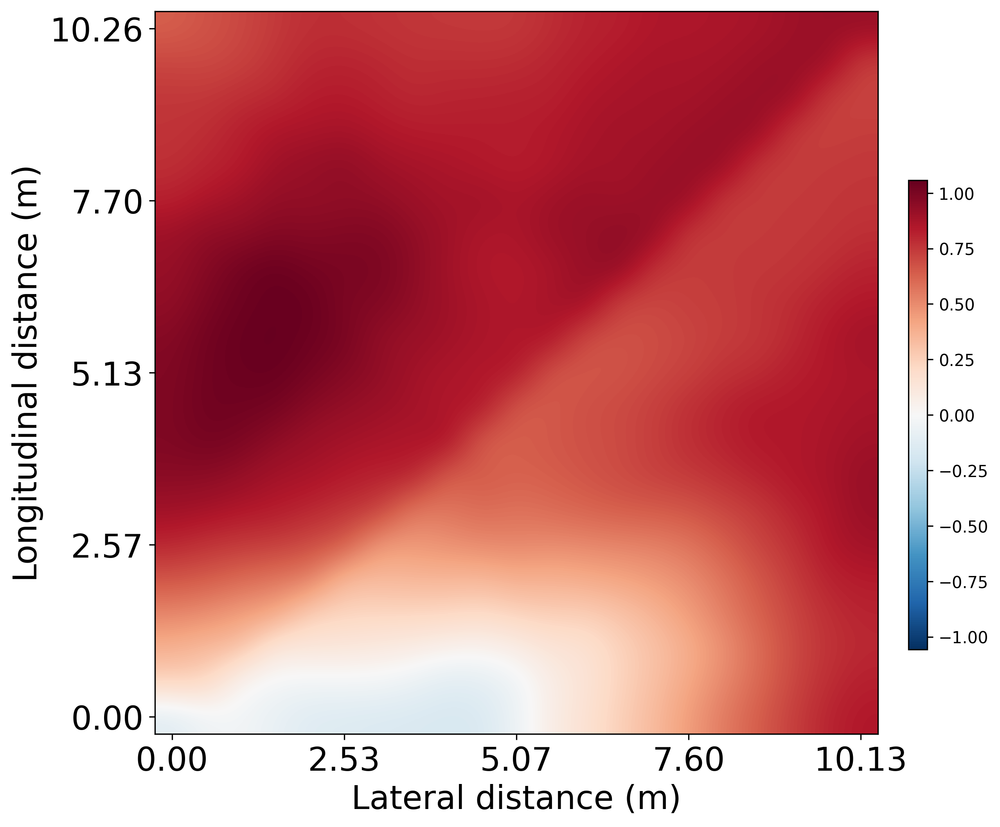

In [129]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test1_four - record_test1).max()
plt.imshow(record_test1_four - record_test1, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Lateral distance (m)',fontsize=20)
plt.ylabel('Longitudinal distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * gap_x / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*gap_y / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gapy-gapx-four.jpg')

plt.show()


In [130]:
## 横向距离，横向速度
record_test2_four = np.zeros((21,21))
record_test2_four_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        import numpy as np

        # 假设原行人的位置为 (gap_x, gap_y)
        original_position = (gap_x* (20 - changey) / 10, gap_y)

        # 半径
        radius = 1   # 可以根据需要调整

        # 计算四个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 5)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]

        state_flat, all_state = env.reset()

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian * (changex) / 10
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x   * (20 - changey) / 10
        position_y_pedestrian = gap_y 
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 5
        vehicle_num = 6

        # 行人状态设置
        all_state[0][0][5:, :] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1:5, 0] = all_state[0][0][0, 0]
        all_state[0][0][1:5, 1] = all_state[0][0][0, 1]
        all_state[0][0][1:5, 2] = all_state[0][0][0, 2]
        all_state[0][0][1:5, 3] = v_x_pedestrian
        all_state[0][0][1:5, 4] = v_y_pedestrian
        all_state[0][0][1:5, 5] = a_x_pedestrian
        all_state[0][0][1:5, 6] = a_y_pedestrian
        all_state[0][0][1:5, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][5:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1:5, :]  = np.array(new_positions)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[40:48] = 0
        # state_flat[64:96] = 0
        state_flat[106:108] = 0
        # state_flat[112:] = 0

        ## 行人设置
        state_flat[0:40:8] = state_flat[0]
        state_flat[1:40:8] = state_flat[1]
        state_flat[2:40:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:40:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:40:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:40:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:40:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:40:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:106] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test2_four[changey,changex] = reward

        record_test2_four_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state, 
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/3357669250.py:134: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/3738007461.py:181: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test2 Four: 5人场景 - 横向距离 vs 横向速度）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-2.1649, 2.2218]
   标准差均值: 0.0407
   CV均值: 0.1120
   CV < 0.05 比例: 97.7%
   CV < 0.10 比例: 98.0%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=1.9699, 标准差=1.3182
   无博弈奖励 (R_ARG):    均值=1.2411, 标准差=0.2315
   博弈贡献 (R_game):     均值=0.7288, 标准差=1.2939

2. 方差分解:
   Var(R_total) = 1.737543
   Var(R_ARG)   = 0.053599 (3.1%)
   Var(R_game)  = 1.674213 (96.4%)
   Cov(R_ARG, R_game) = 0.004877

3. 组件相关性:
   Corr(R_total, R_ARG)  = 0.1916
   Corr(R_total, R_game) = 0.9845
   Corr(R_ARG, R_game)   = 0.0162

4. 稳定性评估:
   CV(R_total) = 0.6691
   CV(R_ARG)   = 0.1865
   CV(R_game)  = 1.7754

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


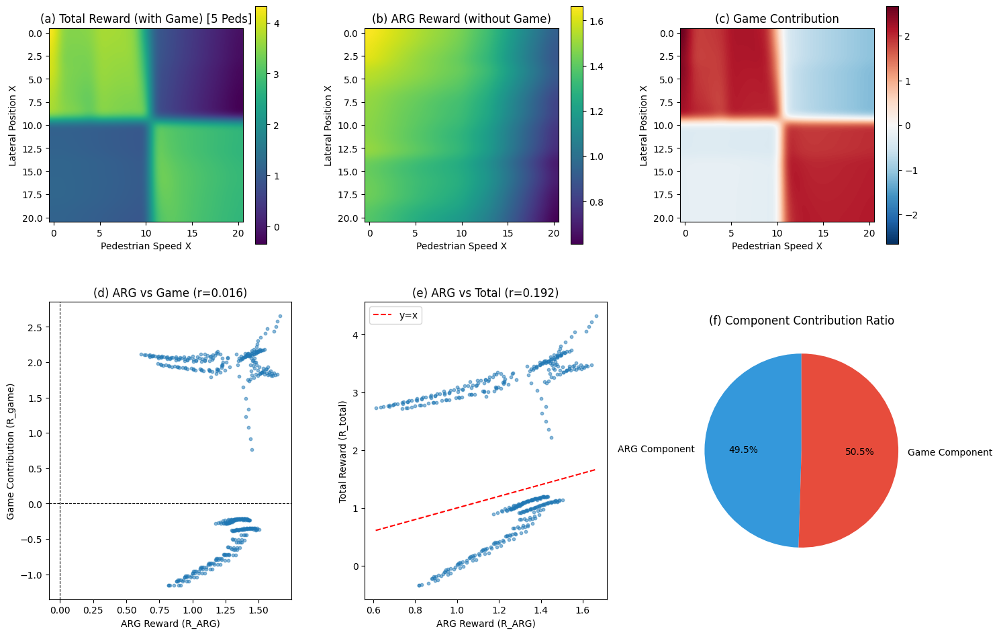

In [131]:
## 横向距离，横向速度 (5人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test2_four_mean = np.zeros((21, 21))
record_test2_four_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # 基础参数计算 (5人场景)
            # ==========================================
            # changey 控制横向位置 (从 2*gap_x 到 0)
            base_pos_x = gap_x * (20 - changey) / 10
            base_pos_y = gap_y
            
            # changex 控制主行人横向速度
            base_speed_x_main = v_x_pedestrian * (changex) / 10
            
            # 邻居的基础速度 (保持原代码逻辑，邻居速度为 v_x_pedestrian 常量)
            base_speed_x_neighbors = v_x_pedestrian
            
            # 其他基础速度
            base_v_y_ped = v_y_pedestrian
            base_v_x_veh = v_x_vehicle
            base_v_y_veh = v_y_vehicle

            # ==========================================
            # 施加扰动
            # ==========================================
            # 主行人速度
            speed_x_ped_main = base_speed_x_main
            speed_y_ped_main = base_v_y_ped * (1 + random_noise[noise])
            
            # 邻居行人速度 (同样施加扰动)
            speed_x_ped_neighbors = base_speed_x_neighbors * (1 + random_noise[noise])
            speed_y_ped_neighbors = base_v_y_ped * (1 + random_noise[noise])
            
            # 车辆速度
            speed_x_vehicle = base_v_x_veh * (1 + random_noise[noise])
            speed_y_vehicle = base_v_y_veh * (1 + random_noise[noise])
            
            # 加速度 (保持原值)
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            # ==========================================
            # 位置计算 (5人场景: 1 Main + 4 Neighbors)
            # ==========================================
            original_position = (base_pos_x, base_pos_y)
            radius = 1 
            # 4个邻居
            angles = np.linspace(0, 2 * np.pi, 5)[:-1] 
            new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]
            
            position_x_pedestrian = base_pos_x
            position_y_pedestrian = base_pos_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 5
            vehicle_num = 6 

            # ==========================================
            # 状态填充 (all_state)
            # ==========================================
            
            # 1. 主行人 (Index 0)
            all_state[0][0][5:, :] = 0
            all_state[0][0][0, 3] = speed_x_ped_main
            all_state[0][0][0, 4] = speed_y_ped_main
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_ped_main, speed_x_ped_main))

            # 2. 邻居行人 (Index 1 to 4)
            all_state[0][0][1:5, 0] = all_state[0][0][0, 0] 
            all_state[0][0][1:5, 1] = all_state[0][0][0, 1] 
            all_state[0][0][1:5, 2] = all_state[0][0][0, 2]
            all_state[0][0][1:5, 3] = speed_x_ped_neighbors # 使用邻居速度
            all_state[0][0][1:5, 4] = speed_y_ped_neighbors
            all_state[0][0][1:5, 5] = acc_x_ped
            all_state[0][0][1:5, 6] = acc_y_ped
            all_state[0][0][1:5, 7] = (math.atan2(speed_y_ped_neighbors, speed_x_ped_neighbors))

            # 车辆状态
            all_state[0][1][0, 3] = speed_x_ped_main
            all_state[0][1][0, 4] = speed_y_ped_main
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_ped_main, speed_x_ped_main))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            # 位置设置
            all_state[0][2][5:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1:5, :] = np.array(new_positions)

            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            # ==========================================
            # state_flat 设置
            # ==========================================
            state_flat[40:48] = 0
            state_flat[106:108] = 0

            state_flat[0:40:8] = state_flat[0]
            state_flat[1:40:8] = state_flat[1]
            state_flat[2:40:8] = state_flat[2]
            
            # x速度: 主行人(idx 3) vs 邻居(idx 11, 19, 27, 35)
            state_flat[3], state_flat[51] = [speed_x_ped_main]*2 
            state_flat[11:40:8] = speed_x_ped_neighbors 
            
            # y速度
            state_flat[4], state_flat[52] = [speed_y_ped_main]*2 
            state_flat[12:40:8] = speed_y_ped_neighbors
            
            # 加速度
            state_flat[5], state_flat[53] = [acc_x_ped]*2
            state_flat[5:40:8] = acc_x_ped
            
            state_flat[6], state_flat[54] = [acc_y_ped]*2
            state_flat[6:40:8] = acc_y_ped
            
            # 朝向
            state_flat[7], state_flat[55] = [math.atan2(speed_y_ped_main, speed_x_ped_main)]*2
            state_flat[7:40:8] = math.atan2(speed_y_ped_neighbors, speed_x_ped_neighbors)

            # 位置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:106] = np.array(new_positions).flatten()

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            # 车辆
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test2_four_mean[changey, changex] = np.mean(rewards_game)
        record_test2_four_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test2_four_std / (np.abs(record_test2_four_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test2 Four: 5人场景 - 横向距离 vs 横向速度）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test2_four_mean.min():.4f}, {record_test2_four_mean.max():.4f}]")
print(f"   标准差均值: {record_test2_four_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test2_four - record_test2_four_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test2_four.mean():.4f}, 标准差={record_test2_four.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test2_four_nongame.mean():.4f}, 标准差={record_test2_four_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test2_four.var()
arg_variance = record_test2_four_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test2_four_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test2_four.flatten(), record_test2_four_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test2_four.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test2_four_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test2_four.std() / (np.abs(record_test2_four.mean()) + 1e-8)
cv_arg = record_test2_four_nongame.std() / (np.abs(record_test2_four_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test2_four, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [5 Peds]', fontsize=12)
ax1.set_xlabel('Pedestrian Speed X')
ax1.set_ylabel('Lateral Position X')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test2_four_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Speed X')
ax2.set_ylabel('Lateral Position X')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Speed X')
ax3.set_ylabel('Lateral Position X')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test2_four_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test2_four_nongame.flatten(), record_test2_four.flatten(), alpha=0.5, s=10)
ax5.plot([record_test2_four_nongame.min(), record_test2_four_nongame.max()], 
         [record_test2_four_nongame.min(), record_test2_four_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test2_four_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test2_four.pdf', dpi=300, bbox_inches='tight')
plt.show()

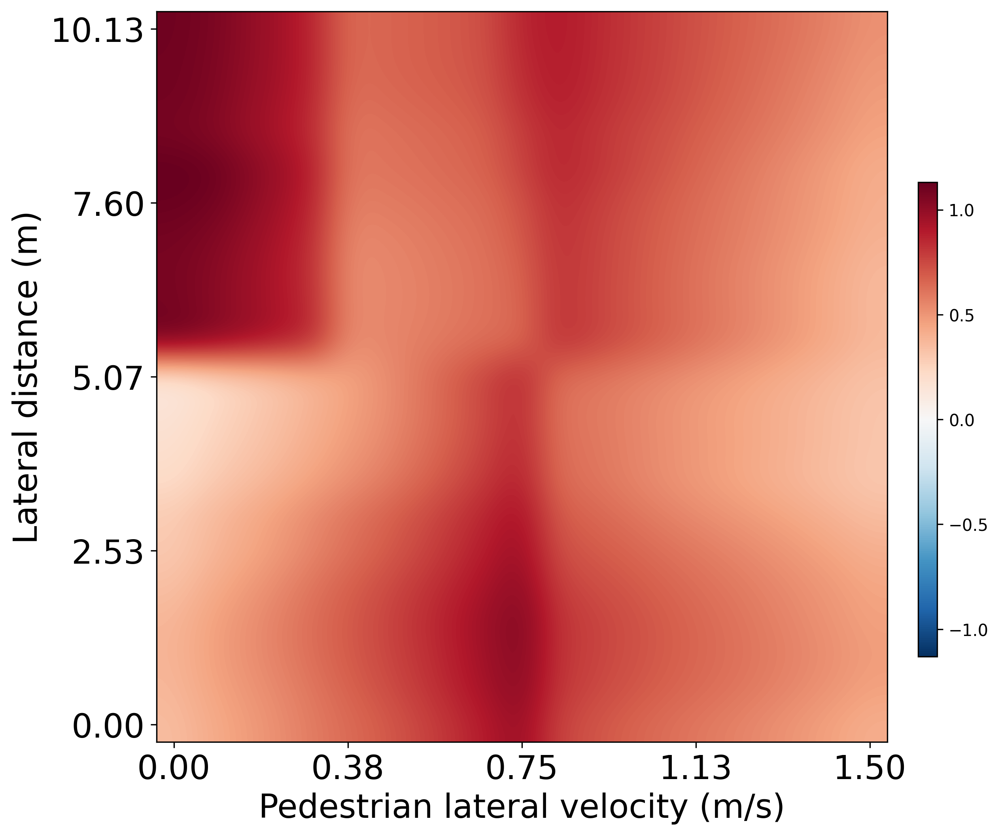

In [132]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test2_four - record_test2).max()
plt.imshow(record_test2_four - record_test2, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Pedestrian lateral velocity (m/s)',fontsize=20)
plt.ylabel('Lateral distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * v_x_pedestrian / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*gap_x / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gapx-vpx-four.jpg')

plt.show()


In [133]:
## 纵向距离，纵向速度
record_test3_four = np.zeros((21,21))
record_test3_four_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        import numpy as np

        # 假设原行人的位置为 (gap_x, gap_y)
        original_position = (gap_x, gap_y* (20 - changey) / 10)

        # 半径
        radius = 1   # 可以根据需要调整

        # 计算四个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 5)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]

        state_flat, all_state = env.reset()

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian * (changex) / 10
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x
        position_y_pedestrian = gap_y * (20 - changey) / 10 
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 5
        vehicle_num = 6

        # 行人状态设置
        all_state[0][0][5:, :] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1:5, 0] = all_state[0][0][0, 0]
        all_state[0][0][1:5, 1] = all_state[0][0][0, 1]
        all_state[0][0][1:5, 2] = all_state[0][0][0, 2]
        all_state[0][0][1:5, 3] = v_x_pedestrian
        all_state[0][0][1:5, 4] = v_y_pedestrian
        all_state[0][0][1:5, 5] = a_x_pedestrian
        all_state[0][0][1:5, 6] = a_y_pedestrian
        all_state[0][0][1:5, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][5:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1:5, :]  = np.array(new_positions)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[40:48] = 0
        # state_flat[64:96] = 0
        state_flat[106:108] = 0
        # state_flat[112:] = 0

        ## 行人设置
        state_flat[0:40:8] = state_flat[0]
        state_flat[1:40:8] = state_flat[1]
        state_flat[2:40:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:40:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:40:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:40:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:40:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:40:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:106] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test3_four[changey,changex] = reward

        record_test3_four_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state, 
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/1068198574.py:134: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/494069651.py:181: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test3 Four: 5人场景 - 纵向距离 vs 纵向速度）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.1482, 3.7089]
   标准差均值: 0.0242
   CV均值: 0.0932
   CV < 0.05 比例: 89.1%
   CV < 0.10 比例: 93.0%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=2.2132, 标准差=1.2042
   无博弈奖励 (R_ARG):    均值=1.1608, 标准差=0.3337
   博弈贡献 (R_game):     均值=1.0524, 标准差=1.1678

2. 方差分解:
   Var(R_total) = 1.450197
   Var(R_ARG)   = 0.111378 (7.7%)
   Var(R_game)  = 1.363806 (94.0%)
   Cov(R_ARG, R_game) = -0.012522

3. 组件相关性:
   Corr(R_total, R_ARG)  = 0.2460
   Corr(R_total, R_game) = 0.9609
   Corr(R_ARG, R_game)   = -0.0321

4. 稳定性评估:
   CV(R_total) = 0.5441
   CV(R_ARG)   = 0.2875
   CV(R_game)  = 1.1097

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


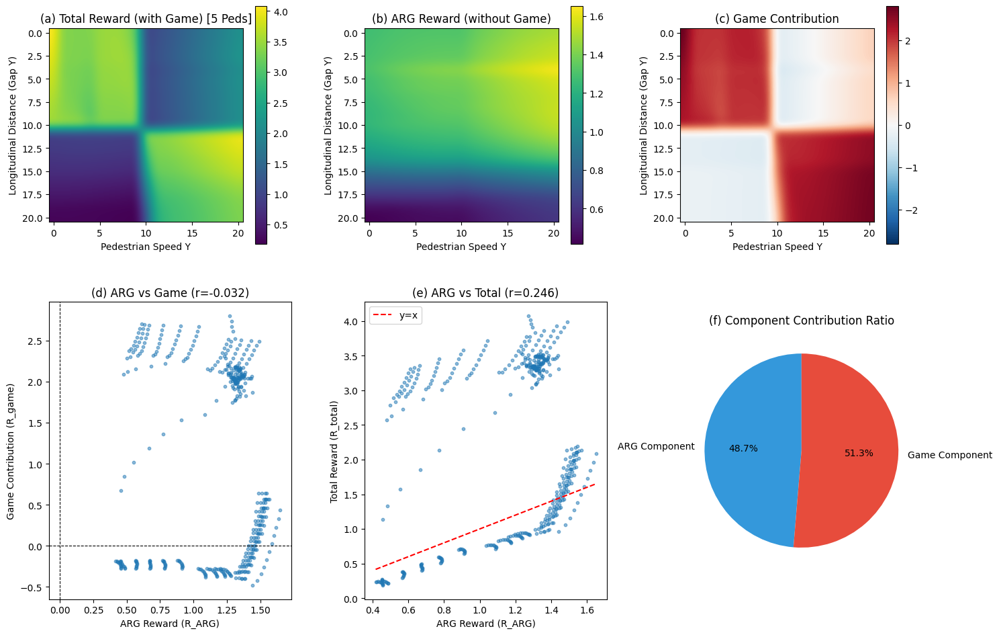

In [134]:
## 纵向距离，纵向速度 (5人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test3_four_mean = np.zeros((21, 21))
record_test3_four_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # 基础参数计算 (5人场景)
            # ==========================================
            # changey 控制纵向位置 (从 2*gap_y 到 0)
            base_pos_x = gap_x
            base_pos_y = gap_y * (20 - changey) / 10
            
            # changex 控制主行人纵向速度
            base_speed_y_main = v_y_pedestrian * (changex) / 10
            
            # 邻居的基础速度 (保持原代码逻辑，邻居速度为 v_y_pedestrian 常量)
            base_speed_y_neighbors = v_y_pedestrian
            
            # 其他基础速度
            base_v_x_ped = v_x_pedestrian
            base_v_x_veh = v_x_vehicle
            base_v_y_veh = v_y_vehicle

            # ==========================================
            # 施加扰动
            # ==========================================
            # 主行人速度
            speed_x_ped_main = base_v_x_ped * (1 + random_noise[noise])
            speed_y_ped_main = base_speed_y_main
            
            # 邻居行人速度 (同样施加扰动)
            speed_x_ped_neighbors = base_v_x_ped * (1 + random_noise[noise])
            speed_y_ped_neighbors = base_speed_y_neighbors * (1 + random_noise[noise])
            
            # 车辆速度
            speed_x_vehicle = base_v_x_veh * (1 + random_noise[noise])
            speed_y_vehicle = base_v_y_veh * (1 + random_noise[noise])
            
            # 加速度 (保持原值)
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            # ==========================================
            # 位置计算 (5人场景: 1 Main + 4 Neighbors)
            # ==========================================
            original_position = (base_pos_x, base_pos_y)
            radius = 1 
            # 4个邻居
            angles = np.linspace(0, 2 * np.pi, 5)[:-1] 
            new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]
            
            position_x_pedestrian = base_pos_x
            position_y_pedestrian = base_pos_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 5
            vehicle_num = 6 

            # ==========================================
            # 状态填充 (all_state)
            # ==========================================
            
            # 1. 主行人 (Index 0)
            all_state[0][0][5:, :] = 0
            all_state[0][0][0, 3] = speed_x_ped_main
            all_state[0][0][0, 4] = speed_y_ped_main
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_ped_main, speed_x_ped_main))

            # 2. 邻居行人 (Index 1 to 4)
            all_state[0][0][1:5, 0] = all_state[0][0][0, 0] 
            all_state[0][0][1:5, 1] = all_state[0][0][0, 1] 
            all_state[0][0][1:5, 2] = all_state[0][0][0, 2]
            all_state[0][0][1:5, 3] = speed_x_ped_neighbors 
            all_state[0][0][1:5, 4] = speed_y_ped_neighbors # 使用邻居速度
            all_state[0][0][1:5, 5] = acc_x_ped
            all_state[0][0][1:5, 6] = acc_y_ped
            all_state[0][0][1:5, 7] = (math.atan2(speed_y_ped_neighbors, speed_x_ped_neighbors))

            # 车辆状态
            all_state[0][1][0, 3] = speed_x_ped_main
            all_state[0][1][0, 4] = speed_y_ped_main
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_ped_main, speed_x_ped_main))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            # 位置设置
            all_state[0][2][5:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1:5, :] = np.array(new_positions)

            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            # ==========================================
            # state_flat 设置
            # ==========================================
            state_flat[40:48] = 0
            state_flat[106:108] = 0

            state_flat[0:40:8] = state_flat[0]
            state_flat[1:40:8] = state_flat[1]
            state_flat[2:40:8] = state_flat[2]
            
            # x速度
            state_flat[3], state_flat[51] = [speed_x_ped_main]*2 
            state_flat[11:40:8] = speed_x_ped_neighbors 
            
            # y速度: 主行人(idx 4) vs 邻居(idx 12, 20, 28, 36)
            state_flat[4], state_flat[52] = [speed_y_ped_main]*2 
            state_flat[12:40:8] = speed_y_ped_neighbors
            
            # 加速度
            state_flat[5], state_flat[53] = [acc_x_ped]*2
            state_flat[5:40:8] = acc_x_ped
            
            state_flat[6], state_flat[54] = [acc_y_ped]*2
            state_flat[6:40:8] = acc_y_ped
            
            # 朝向
            state_flat[7], state_flat[55] = [math.atan2(speed_y_ped_main, speed_x_ped_main)]*2
            state_flat[7:40:8] = math.atan2(speed_y_ped_neighbors, speed_x_ped_neighbors)

            # 位置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:106] = np.array(new_positions).flatten()

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            # 车辆
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test3_four_mean[changey, changex] = np.mean(rewards_game)
        record_test3_four_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test3_four_std / (np.abs(record_test3_four_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test3 Four: 5人场景 - 纵向距离 vs 纵向速度）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test3_four_mean.min():.4f}, {record_test3_four_mean.max():.4f}]")
print(f"   标准差均值: {record_test3_four_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test3_four - record_test3_four_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test3_four.mean():.4f}, 标准差={record_test3_four.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test3_four_nongame.mean():.4f}, 标准差={record_test3_four_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test3_four.var()
arg_variance = record_test3_four_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test3_four_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test3_four.flatten(), record_test3_four_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test3_four.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test3_four_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test3_four.std() / (np.abs(record_test3_four.mean()) + 1e-8)
cv_arg = record_test3_four_nongame.std() / (np.abs(record_test3_four_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test3_four, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [5 Peds]', fontsize=12)
ax1.set_xlabel('Pedestrian Speed Y')
ax1.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test3_four_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Speed Y')
ax2.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Speed Y')
ax3.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test3_four_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test3_four_nongame.flatten(), record_test3_four.flatten(), alpha=0.5, s=10)
ax5.plot([record_test3_four_nongame.min(), record_test3_four_nongame.max()], 
         [record_test3_four_nongame.min(), record_test3_four_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test3_four_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test3_four.pdf', dpi=300, bbox_inches='tight')
plt.show()

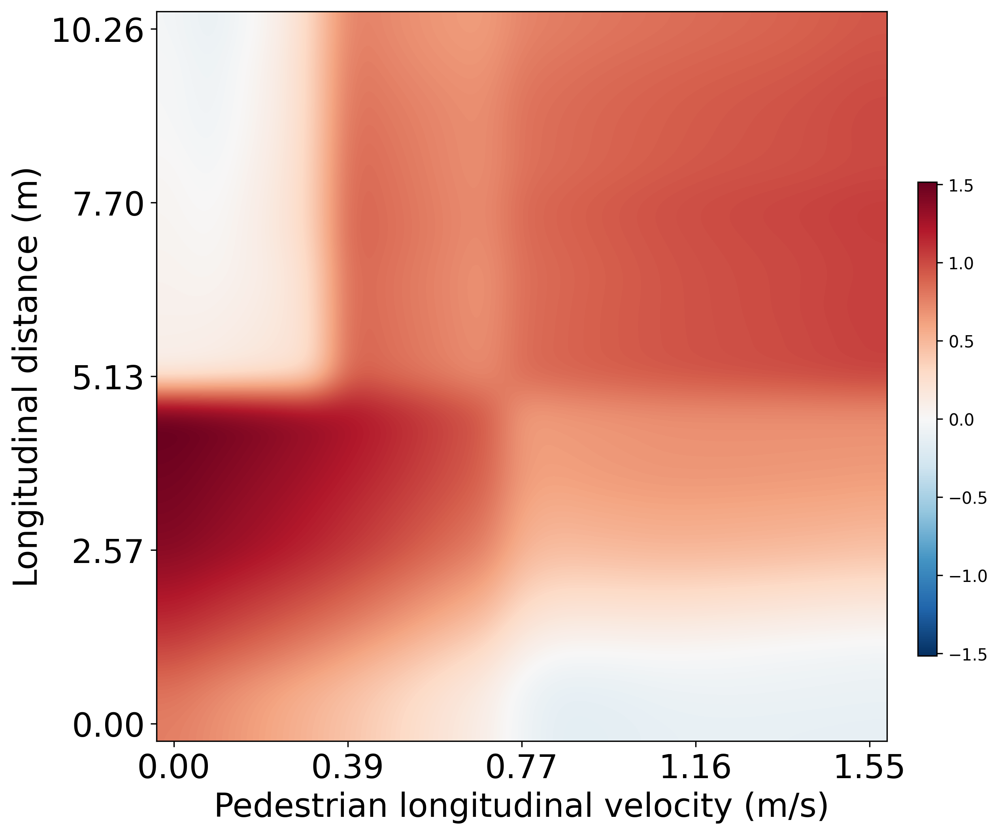

In [135]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test3_four - record_test3).max()
plt.imshow(record_test3_four - record_test3, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Pedestrian longitudinal velocity (m/s)',fontsize=20)
plt.ylabel('Longitudinal distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * v_y_pedestrian / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*gap_y / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gapy-vpy-four.jpg')

plt.show()


In [136]:
## 车横速度，横距离
record_test4_four = np.zeros((21,21))
record_test4_four_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        import numpy as np

        # 假设原行人的位置为 (gap_x, gap_y)
        original_position = (gap_x * (changex) / 10, gap_y)

        # 半径
        radius = 1   # 可以根据需要调整

        # 计算四个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 5)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]

        state_flat, all_state = env.reset()

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian 
        speed_x_vehicle = v_x_vehicle * (20 - changey) / 10
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x * (changex) / 10
        position_y_pedestrian = gap_y
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 5
        vehicle_num = 6

        # 行人状态设置
        all_state[0][0][5:, :] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1:5, 0] = all_state[0][0][0, 0]
        all_state[0][0][1:5, 1] = all_state[0][0][0, 1]
        all_state[0][0][1:5, 2] = all_state[0][0][0, 2]
        all_state[0][0][1:5, 3] = v_x_pedestrian
        all_state[0][0][1:5, 4] = v_y_pedestrian
        all_state[0][0][1:5, 5] = a_x_pedestrian
        all_state[0][0][1:5, 6] = a_y_pedestrian
        all_state[0][0][1:5, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][5:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1:5, :]  = np.array(new_positions)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[40:48] = 0
        # state_flat[64:96] = 0
        state_flat[106:108] = 0
        # state_flat[112:] = 0

        ## 行人设置
        state_flat[0:40:8] = state_flat[0]
        state_flat[1:40:8] = state_flat[1]
        state_flat[2:40:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:40:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:40:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:40:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:40:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:40:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:106] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test4_four[changey,changex] = reward

        record_test4_four_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state, 
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/59017000.py:134: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/2588835703.py:171: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test4 Four: 5人场景 - 车横速度 vs 横距离）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.3919, 2.5712]
   标准差均值: 0.0527
   CV均值: 0.2718
   CV < 0.05 比例: 86.6%
   CV < 0.10 比例: 90.7%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=1.7385, 标准差=1.0632
   无博弈奖励 (R_ARG):    均值=1.2580, 标准差=0.1440
   博弈贡献 (R_game):     均值=0.4805, 标准差=1.1080

2. 方差分解:
   Var(R_total) = 1.130298
   Var(R_ARG)   = 0.020730 (1.8%)
   Var(R_game)  = 1.227569 (108.6%)
   Cov(R_ARG, R_game) = -0.059135

3. 组件相关性:
   Corr(R_total, R_ARG)  = -0.2500
   Corr(R_total, R_game) = 0.9921
   Corr(R_ARG, R_game)   = -0.3699

4. 稳定性评估:
   CV(R_total) = 0.6115
   CV(R_ARG)   = 0.1144
   CV(R_game)  = 2.3060


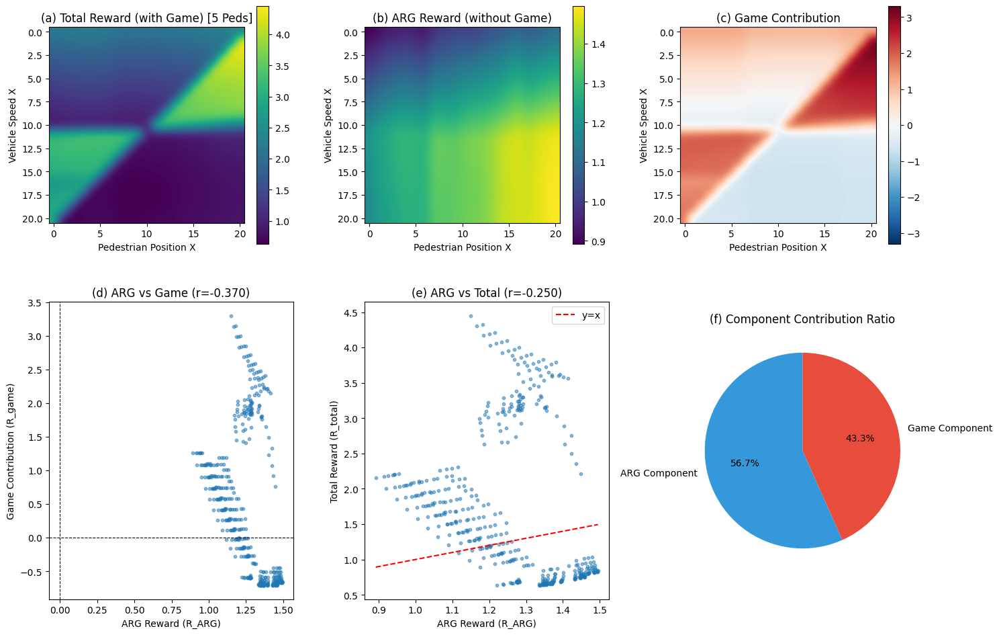

In [137]:
## 车横速度，横距离 (5人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test4_four_mean = np.zeros((21, 21))
record_test4_four_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # 基础参数计算 (5人场景)
            # ==========================================
            # changey 控制车辆横向速度 (从 2*v_x 到 0)
            base_speed_x_veh = v_x_vehicle * (20 - changey) / 10
            
            # changex 控制行人横向位置
            base_pos_x = gap_x * (changex) / 10
            base_pos_y = gap_y
            
            # 其他基础速度
            base_v_x_ped = v_x_pedestrian
            base_v_y_ped = v_y_pedestrian
            base_v_y_veh = v_y_vehicle

            # ==========================================
            # 施加扰动
            # ==========================================
            # 行人速度 (主行人 + 邻居)
            speed_x_pedestrian = base_v_x_ped * (1 + random_noise[noise])
            speed_y_pedestrian = base_v_y_ped * (1 + random_noise[noise])
            
            # 车辆速度
            speed_x_vehicle = base_speed_x_veh
            speed_y_vehicle = base_v_y_veh * (1 + random_noise[noise])
            
            # 加速度 (保持原值)
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            # ==========================================
            # 位置计算 (5人场景: 1 Main + 4 Neighbors)
            # ==========================================
            original_position = (base_pos_x, base_pos_y)
            radius = 1 
            # 4个邻居
            angles = np.linspace(0, 2 * np.pi, 5)[:-1] 
            new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]
            
            position_x_pedestrian = base_pos_x
            position_y_pedestrian = base_pos_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 5
            vehicle_num = 6 

            # ==========================================
            # 状态填充 (all_state)
            # ==========================================
            
            # 1. 主行人 (Index 0)
            all_state[0][0][5:, :] = 0
            all_state[0][0][0, 3] = speed_x_pedestrian
            all_state[0][0][0, 4] = speed_y_pedestrian
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 2. 邻居行人 (Index 1 to 4)
            all_state[0][0][1:5, 0] = all_state[0][0][0, 0] 
            all_state[0][0][1:5, 1] = all_state[0][0][0, 1] 
            all_state[0][0][1:5, 2] = all_state[0][0][0, 2]
            all_state[0][0][1:5, 3] = speed_x_pedestrian
            all_state[0][0][1:5, 4] = speed_y_pedestrian
            all_state[0][0][1:5, 5] = acc_x_ped
            all_state[0][0][1:5, 6] = acc_y_ped
            all_state[0][0][1:5, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 车辆状态
            all_state[0][1][0, 3] = speed_x_pedestrian
            all_state[0][1][0, 4] = speed_y_pedestrian
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            # 位置设置
            all_state[0][2][5:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1:5, :] = np.array(new_positions)

            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            # ==========================================
            # state_flat 设置
            # ==========================================
            state_flat[40:48] = 0
            state_flat[106:108] = 0

            state_flat[0:40:8] = state_flat[0]
            state_flat[1:40:8] = state_flat[1]
            state_flat[2:40:8] = state_flat[2]
            
            # 速度与加速度设置 (扰动后)
            state_flat[3], state_flat[51] = [speed_x_pedestrian]*2 
            state_flat[11:40:8] = speed_x_pedestrian 
            
            state_flat[4], state_flat[52] = [speed_y_pedestrian]*2 
            state_flat[12:40:8] = speed_y_pedestrian
            
            state_flat[5], state_flat[53] = [acc_x_ped]*2
            state_flat[5:40:8] = acc_x_ped
            
            state_flat[6], state_flat[54] = [acc_y_ped]*2
            state_flat[6:40:8] = acc_y_ped
            
            state_flat[7], state_flat[55] = [math.atan2(speed_y_pedestrian, speed_x_pedestrian)]*2
            state_flat[7:40:8] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            # 位置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:106] = np.array(new_positions).flatten()

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            # 车辆
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test4_four_mean[changey, changex] = np.mean(rewards_game)
        record_test4_four_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test4_four_std / (np.abs(record_test4_four_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test4 Four: 5人场景 - 车横速度 vs 横距离）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test4_four_mean.min():.4f}, {record_test4_four_mean.max():.4f}]")
print(f"   标准差均值: {record_test4_four_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test4_four - record_test4_four_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test4_four.mean():.4f}, 标准差={record_test4_four.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test4_four_nongame.mean():.4f}, 标准差={record_test4_four_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test4_four.var()
arg_variance = record_test4_four_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test4_four_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test4_four.flatten(), record_test4_four_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test4_four.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test4_four_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test4_four.std() / (np.abs(record_test4_four.mean()) + 1e-8)
cv_arg = record_test4_four_nongame.std() / (np.abs(record_test4_four_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test4_four, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [5 Peds]', fontsize=12)
ax1.set_xlabel('Pedestrian Position X')
ax1.set_ylabel('Vehicle Speed X')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test4_four_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Position X')
ax2.set_ylabel('Vehicle Speed X')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Position X')
ax3.set_ylabel('Vehicle Speed X')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test4_four_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test4_four_nongame.flatten(), record_test4_four.flatten(), alpha=0.5, s=10)
ax5.plot([record_test4_four_nongame.min(), record_test4_four_nongame.max()], 
         [record_test4_four_nongame.min(), record_test4_four_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test4_four_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test4_four.pdf', dpi=300, bbox_inches='tight')
plt.show()

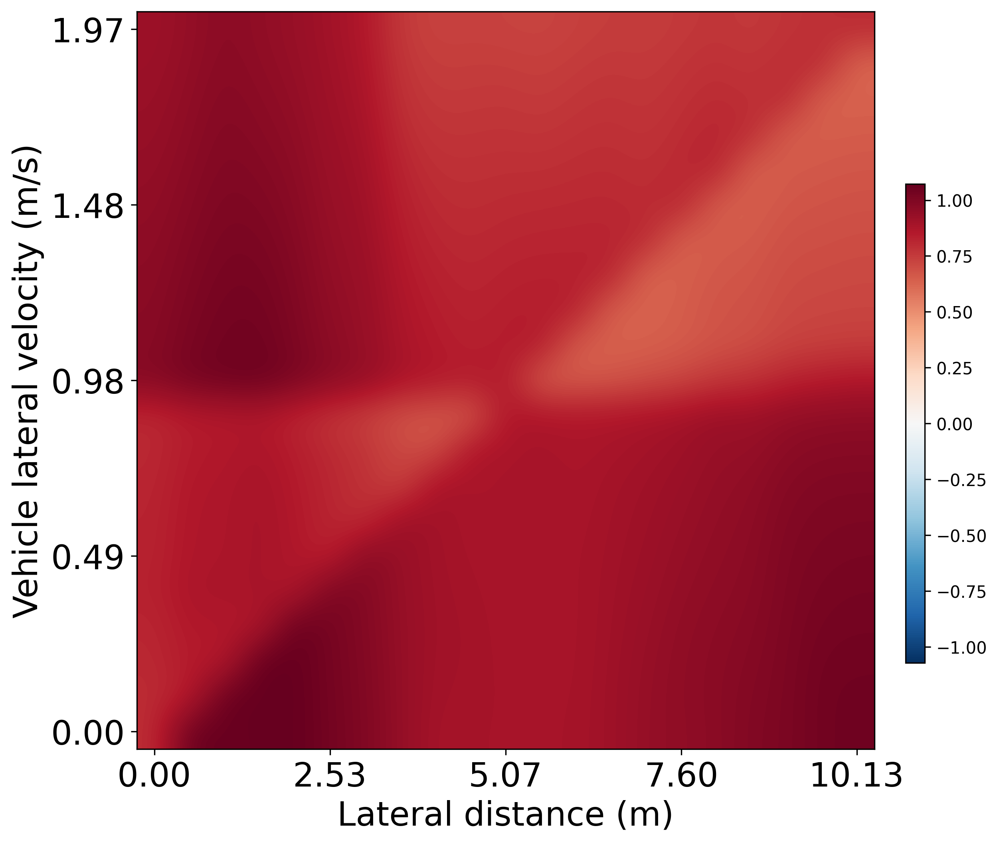

In [138]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test4_four - record_test_4).max()
plt.imshow(record_test4_four - record_test_4, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Lateral distance (m)',fontsize=20)
plt.ylabel('Vehicle lateral velocity (m/s)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * gap_x / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*v_x_vehicle / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/vvx-gapx-four.jpg')

plt.show()


In [139]:
## 车纵速度，纵距离
record_test5_four = np.zeros((21,21))
record_test5_four_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        import numpy as np

        # 假设原行人的位置为 (gap_x, gap_y)
        original_position = (gap_x , gap_y* (changex) / 10)

        # 半径
        radius = 1   # 可以根据需要调整

        # 计算四个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 5)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]

        state_flat, all_state = env.reset()

        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian 
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle * (20 - changey) / 10

        position_x_pedestrian = gap_x
        position_y_pedestrian = gap_y* (changex) / 10
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 5
        vehicle_num = 6

        # 行人状态设置
        all_state[0][0][5:, :] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1:5, 0] = all_state[0][0][0, 0]
        all_state[0][0][1:5, 1] = all_state[0][0][0, 1]
        all_state[0][0][1:5, 2] = all_state[0][0][0, 2]
        all_state[0][0][1:5, 3] = v_x_pedestrian
        all_state[0][0][1:5, 4] = v_y_pedestrian
        all_state[0][0][1:5, 5] = a_x_pedestrian
        all_state[0][0][1:5, 6] = a_y_pedestrian
        all_state[0][0][1:5, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][5:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1:5, :]  = np.array(new_positions)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[40:48] = 0
        # state_flat[64:96] = 0
        state_flat[106:108] = 0
        # state_flat[112:] = 0

        ## 行人设置
        state_flat[0:40:8] = state_flat[0]
        state_flat[1:40:8] = state_flat[1]
        state_flat[2:40:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:40:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:40:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:40:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:40:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:40:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:106] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test5_four[changey,changex] = reward

        record_test5_four_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state, 
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/3251096843.py:134: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/3891204253.py:171: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test5 Four: 5人场景 - 车纵速度 vs 纵距离）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.3824, 5.2905]
   标准差均值: 0.0836
   CV均值: 0.3774
   CV < 0.05 比例: 85.0%
   CV < 0.10 比例: 89.3%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=1.4974, 标准差=1.1088
   无博弈奖励 (R_ARG):    均值=1.0865, 标准差=0.3248
   博弈贡献 (R_game):     均值=0.4109, 标准差=1.1284

2. 方差分解:
   Var(R_total) = 1.229328
   Var(R_ARG)   = 0.105467 (8.6%)
   Var(R_game)  = 1.273249 (103.6%)
   Cov(R_ARG, R_game) = -0.074863

3. 组件相关性:
   Corr(R_total, R_ARG)  = 0.0855
   Corr(R_total, R_game) = 0.9580
   Corr(R_ARG, R_game)   = -0.2038

4. 稳定性评估:
   CV(R_total) = 0.7404
   CV(R_ARG)   = 0.2989
   CV(R_game)  = 2.7458

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


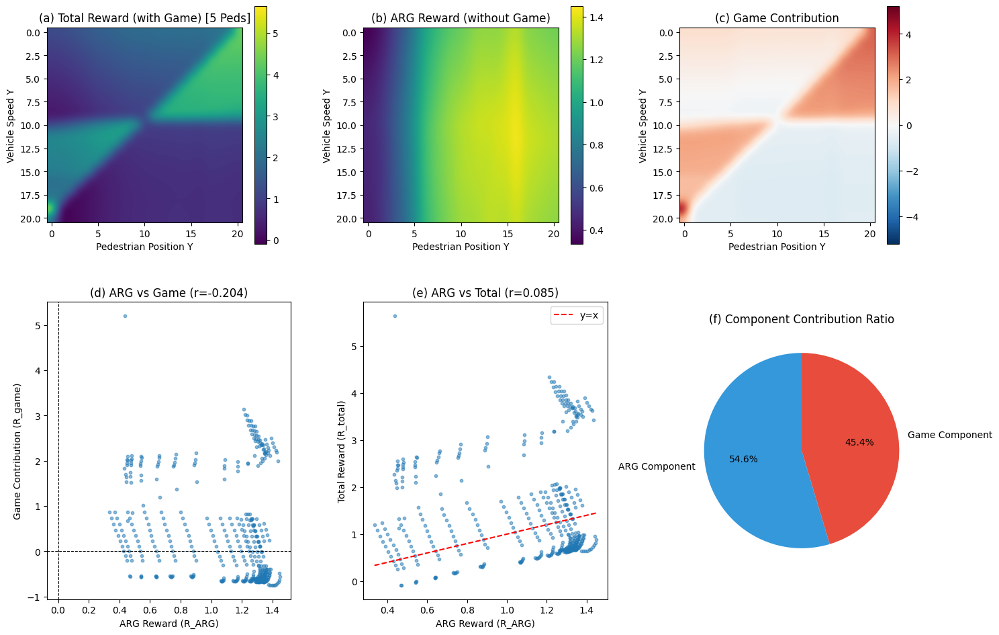

In [140]:
## 车纵速度，纵距离 (5人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test5_four_mean = np.zeros((21, 21))
record_test5_four_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # 基础参数计算 (5人场景)
            # ==========================================
            # changey 控制车辆纵向速度 (从 2*v_y 到 0)
            base_speed_y_veh = v_y_vehicle * (20 - changey) / 10
            
            # changex 控制行人纵向位置
            base_pos_x = gap_x
            base_pos_y = gap_y * (changex) / 10
            
            # 其他基础速度
            base_v_x_ped = v_x_pedestrian
            base_v_y_ped = v_y_pedestrian
            base_v_x_veh = v_x_vehicle

            # ==========================================
            # 施加扰动
            # ==========================================
            # 行人速度 (主行人 + 邻居)
            speed_x_pedestrian = base_v_x_ped * (1 + random_noise[noise])
            speed_y_pedestrian = base_v_y_ped * (1 + random_noise[noise])
            
            # 车辆速度
            speed_x_vehicle = base_v_x_veh * (1 + random_noise[noise])
            speed_y_vehicle = base_speed_y_veh
            
            # 加速度 (保持原值)
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            # ==========================================
            # 位置计算 (5人场景: 1 Main + 4 Neighbors)
            # ==========================================
            original_position = (base_pos_x, base_pos_y)
            radius = 1 
            # 4个邻居
            angles = np.linspace(0, 2 * np.pi, 5)[:-1] 
            new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]
            
            position_x_pedestrian = base_pos_x
            position_y_pedestrian = base_pos_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 5
            vehicle_num = 6 

            # ==========================================
            # 状态填充 (all_state)
            # ==========================================
            
            # 1. 主行人 (Index 0)
            all_state[0][0][5:, :] = 0
            all_state[0][0][0, 3] = speed_x_pedestrian
            all_state[0][0][0, 4] = speed_y_pedestrian
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 2. 邻居行人 (Index 1 to 4)
            all_state[0][0][1:5, 0] = all_state[0][0][0, 0] 
            all_state[0][0][1:5, 1] = all_state[0][0][0, 1] 
            all_state[0][0][1:5, 2] = all_state[0][0][0, 2]
            all_state[0][0][1:5, 3] = speed_x_pedestrian
            all_state[0][0][1:5, 4] = speed_y_pedestrian
            all_state[0][0][1:5, 5] = acc_x_ped
            all_state[0][0][1:5, 6] = acc_y_ped
            all_state[0][0][1:5, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 车辆状态
            all_state[0][1][0, 3] = speed_x_pedestrian
            all_state[0][1][0, 4] = speed_y_pedestrian
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            # 位置设置
            all_state[0][2][5:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1:5, :] = np.array(new_positions)

            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            # ==========================================
            # state_flat 设置
            # ==========================================
            state_flat[40:48] = 0
            state_flat[106:108] = 0

            state_flat[0:40:8] = state_flat[0]
            state_flat[1:40:8] = state_flat[1]
            state_flat[2:40:8] = state_flat[2]
            
            # 速度与加速度设置 (扰动后)
            state_flat[3], state_flat[51] = [speed_x_pedestrian]*2 
            state_flat[11:40:8] = speed_x_pedestrian 
            
            state_flat[4], state_flat[52] = [speed_y_pedestrian]*2 
            state_flat[12:40:8] = speed_y_pedestrian
            
            state_flat[5], state_flat[53] = [acc_x_ped]*2
            state_flat[5:40:8] = acc_x_ped
            
            state_flat[6], state_flat[54] = [acc_y_ped]*2
            state_flat[6:40:8] = acc_y_ped
            
            state_flat[7], state_flat[55] = [math.atan2(speed_y_pedestrian, speed_x_pedestrian)]*2
            state_flat[7:40:8] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            # 位置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:106] = np.array(new_positions).flatten()

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            # 车辆
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test5_four_mean[changey, changex] = np.mean(rewards_game)
        record_test5_four_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test5_four_std / (np.abs(record_test5_four_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test5 Four: 5人场景 - 车纵速度 vs 纵距离）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test5_four_mean.min():.4f}, {record_test5_four_mean.max():.4f}]")
print(f"   标准差均值: {record_test5_four_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test5_four - record_test5_four_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test5_four.mean():.4f}, 标准差={record_test5_four.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test5_four_nongame.mean():.4f}, 标准差={record_test5_four_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test5_four.var()
arg_variance = record_test5_four_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test5_four_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test5_four.flatten(), record_test5_four_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test5_four.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test5_four_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test5_four.std() / (np.abs(record_test5_four.mean()) + 1e-8)
cv_arg = record_test5_four_nongame.std() / (np.abs(record_test5_four_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test5_four, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [5 Peds]', fontsize=12)
ax1.set_xlabel('Pedestrian Position Y')
ax1.set_ylabel('Vehicle Speed Y')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test5_four_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Position Y')
ax2.set_ylabel('Vehicle Speed Y')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Position Y')
ax3.set_ylabel('Vehicle Speed Y')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test5_four_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test5_four_nongame.flatten(), record_test5_four.flatten(), alpha=0.5, s=10)
ax5.plot([record_test5_four_nongame.min(), record_test5_four_nongame.max()], 
         [record_test5_four_nongame.min(), record_test5_four_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test5_four_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test5_four.pdf', dpi=300, bbox_inches='tight')
plt.show()

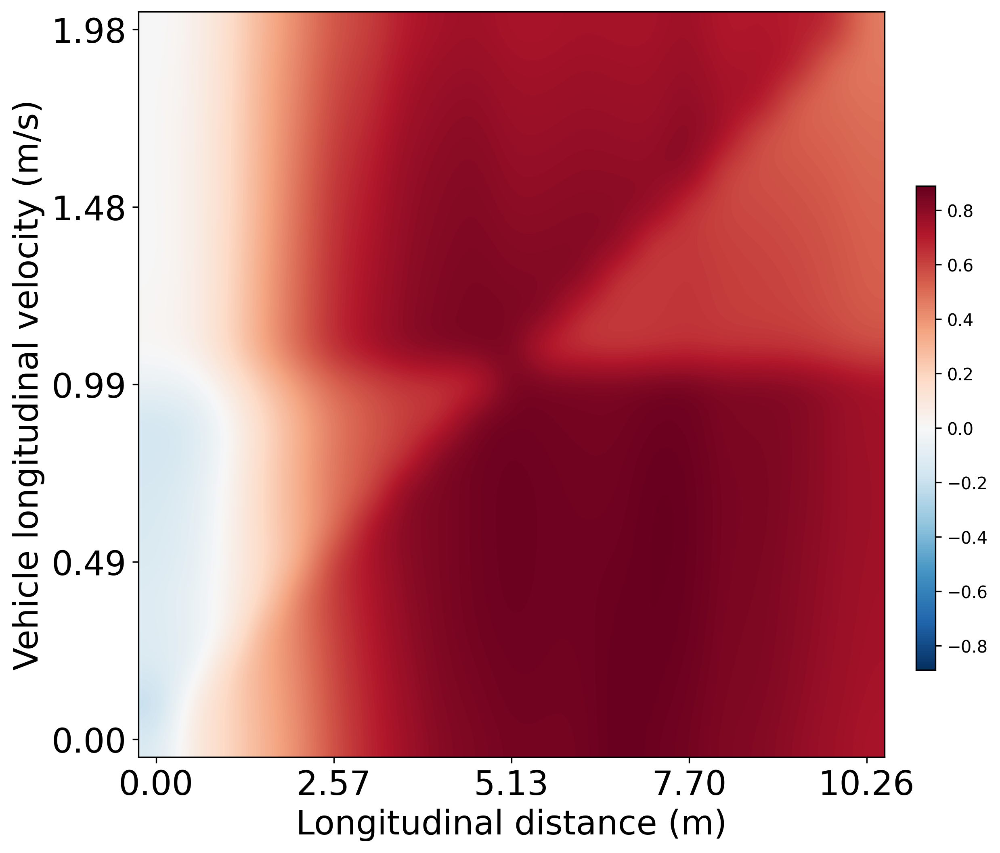

In [141]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test5_four - record_test5).max()
plt.imshow(record_test5_four - record_test5, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Longitudinal distance (m)',fontsize=20)
plt.ylabel('Vehicle longitudinal velocity (m/s)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * gap_y / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*v_y_vehicle / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/vvy-gapy-four.jpg')

plt.show()


## 单人环绕

In [142]:
## 横纵向距离
record_test1_one = np.zeros((21,21))
record_test1_one_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        import numpy as np

        # 假设原行人的位置为 (gap_x, gap_y)
        original_position = (gap_x * (changex) / 10, gap_y * (20 - changey) / 10 )

        # 半径
        radius = 1   # 可以根据需要调整

        # 计算五个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 22)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angles[13]), original_position[1] + radius * np.sin(angles[13]))]

        state_flat, all_state = env.reset()

        # v_x_pedestrian = 0
        # v_y_pedestrian = 0
        # a_x_pedestrian = 0
        # a_y_pedestrian = 0
        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x * (changex) / 10
        position_y_pedestrian = gap_y * (20 - changey) / 10 
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 2
        vehicle_num = 2

        # 行人状态设置
        all_state[0][0][2:,:] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1, 0] = all_state[0][0][0, 0]
        all_state[0][0][1, 1] = all_state[0][0][0, 1]
        all_state[0][0][1, 2] = all_state[0][0][0, 2]
        all_state[0][0][1, 3] = v_x_pedestrian
        all_state[0][0][1, 4] = v_y_pedestrian
        all_state[0][0][1, 5] = a_x_pedestrian
        all_state[0][0][1, 6] = a_y_pedestrian
        all_state[0][0][1, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][2:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1, :]  = np.array(new_positions)

        ## 车辆位置设置
        all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[16:48] = 0
        state_flat[64:96] = 0
        state_flat[100:108] = 0
        state_flat[112:] = 0

        ## 行人设置
        state_flat[0:16:8] = state_flat[0]
        state_flat[1:16:8] = state_flat[1]
        state_flat[2:16:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:16:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:16:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:16:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:16:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:16:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:100] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test1_one[changey,changex] = reward

        record_test1_one_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state, 
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/2605330441.py:138: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/4176077941.py:172: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test1 One: 2人场景 - 横纵向距离）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.6363, 2.2870]
   标准差均值: 0.0160
   CV均值: 0.0437
   CV < 0.05 比例: 88.7%
   CV < 0.10 比例: 93.9%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=0.7403, 标准差=1.0962
   无博弈奖励 (R_ARG):    均值=0.5264, 标准差=0.1572
   博弈贡献 (R_game):     均值=0.2139, 标准差=1.0275

2. 方差分解:
   Var(R_total) = 1.201750
   Var(R_ARG)   = 0.024699 (2.1%)
   Var(R_game)  = 1.055810 (87.9%)
   Cov(R_ARG, R_game) = 0.060758

3. 组件相关性:
   Corr(R_total, R_ARG)  = 0.4952
   Corr(R_total, R_game) = 0.9911
   Corr(R_ARG, R_game)   = 0.3754

4. 稳定性评估:
   CV(R_total) = 1.4808
   CV(R_ARG)   = 0.2986
   CV(R_game)  = 4.8032


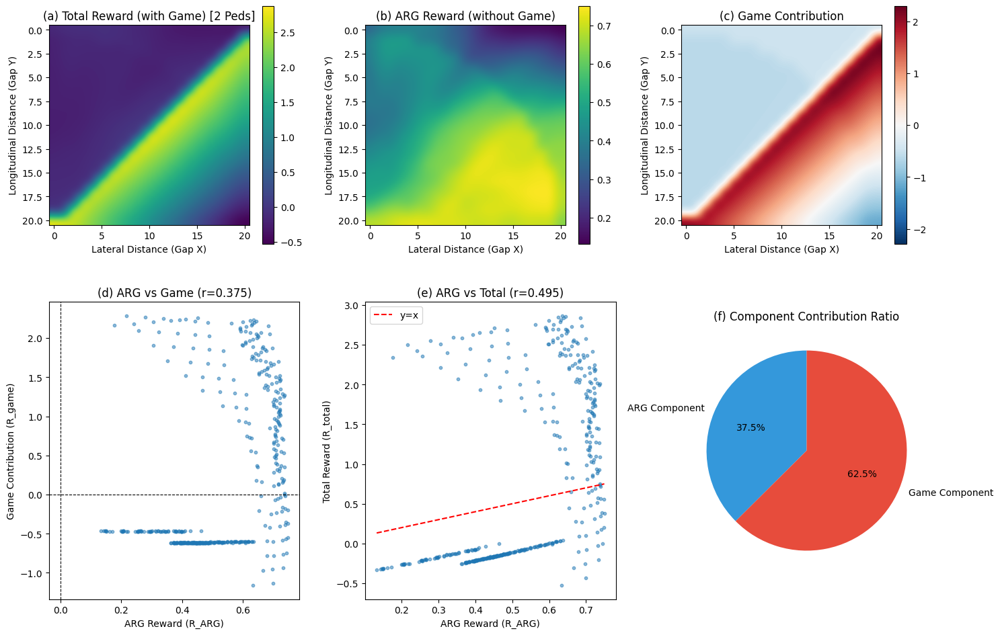

In [143]:
## 横纵向距离 (2人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test1_one_mean = np.zeros((21, 21))
record_test1_one_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # 基础参数计算 (2人场景)
            # ==========================================
            # 位置基础值
            base_pos_x = gap_x * (changex) / 10
            base_pos_y = gap_y * (20 - changey) / 10
            
            # 速度基础值
            base_v_x_ped = v_x_pedestrian
            base_v_y_ped = v_y_pedestrian
            base_v_x_veh = v_x_vehicle
            base_v_y_veh = v_y_vehicle

            # ==========================================
            # 施加扰动
            # ==========================================
            # 对所有行人和车辆的速度施加微小扰动
            speed_x_pedestrian = base_v_x_ped * (1 + random_noise[noise])
            speed_y_pedestrian = base_v_y_ped * (1 + random_noise[noise])
            speed_x_vehicle = base_v_x_veh * (1 + random_noise[noise])
            speed_y_vehicle = base_v_y_veh * (1 + random_noise[noise])
            
            # 加速度 (保持原值)
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            # ==========================================
            # 位置计算 (2人场景: 1 Main + 1 Neighbor)
            # ==========================================
            original_position = (base_pos_x, base_pos_y)
            radius = 1 
            # 计算1个新行人的位置 (使用 angles[13] 对应原代码逻辑)
            angles = np.linspace(0, 2 * np.pi, 22)[:-1]
            new_positions = [(original_position[0] + radius * np.cos(angles[13]), original_position[1] + radius * np.sin(angles[13]))]
            
            position_x_pedestrian = base_pos_x
            position_y_pedestrian = base_pos_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 2
            vehicle_num = 2 

            # ==========================================
            # 状态填充 (all_state)
            # ==========================================
            
            # 1. 主行人 (Index 0)
            all_state[0][0][2:, :] = 0  # 清空后续行人位
            all_state[0][0][0, 3] = speed_x_pedestrian
            all_state[0][0][0, 4] = speed_y_pedestrian
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 2. 邻居行人 (Index 1)
            all_state[0][0][1, 0] = all_state[0][0][0, 0] 
            all_state[0][0][1, 1] = all_state[0][0][0, 1] 
            all_state[0][0][1, 2] = all_state[0][0][0, 2]
            all_state[0][0][1, 3] = speed_x_pedestrian # 使用扰动后速度
            all_state[0][0][1, 4] = speed_y_pedestrian
            all_state[0][0][1, 5] = acc_x_ped
            all_state[0][0][1, 6] = acc_y_ped
            all_state[0][0][1, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 车辆状态
            all_state[0][1][2:, :] = 0
            all_state[0][1][0, 3] = speed_x_pedestrian
            all_state[0][1][0, 4] = speed_y_pedestrian
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            # 位置设置
            all_state[0][2][2:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1, :] = np.array(new_positions)

            all_state[0][3][2:,:] = 0
            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            # ==========================================
            # state_flat 设置 (切片范围对应 2 人)
            # ==========================================
            state_flat[16:48] = 0
            state_flat[64:96] = 0
            state_flat[100:108] = 0
            state_flat[112:] = 0

            # 属性复制 (0-16, step 8 -> covering indices 0,1)
            state_flat[0:16:8] = state_flat[0]
            state_flat[1:16:8] = state_flat[1]
            state_flat[2:16:8] = state_flat[2]
            
            # 速度与加速度设置 (扰动后)
            state_flat[3], state_flat[51] = [speed_x_pedestrian]*2 
            state_flat[11:16:8] = speed_x_pedestrian 
            
            state_flat[4], state_flat[52] = [speed_y_pedestrian]*2 
            state_flat[12:16:8] = speed_y_pedestrian
            
            state_flat[5], state_flat[53] = [acc_x_ped]*2
            state_flat[5:16:8] = acc_x_ped
            
            state_flat[6], state_flat[54] = [acc_y_ped]*2
            state_flat[6:16:8] = acc_y_ped
            
            state_flat[7], state_flat[55] = [math.atan2(speed_y_pedestrian, speed_x_pedestrian)]*2
            state_flat[7:16:8] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            # 位置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:100] = np.array(new_positions).flatten() # 1 neighbor * 2 coords = 2 values

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            # 车辆
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test1_one_mean[changey, changex] = np.mean(rewards_game)
        record_test1_one_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test1_one_std / (np.abs(record_test1_one_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test1 One: 2人场景 - 横纵向距离）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test1_one_mean.min():.4f}, {record_test1_one_mean.max():.4f}]")
print(f"   标准差均值: {record_test1_one_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test1_one - record_test1_one_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test1_one.mean():.4f}, 标准差={record_test1_one.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test1_one_nongame.mean():.4f}, 标准差={record_test1_one_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test1_one.var()
arg_variance = record_test1_one_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test1_one_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test1_one.flatten(), record_test1_one_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test1_one.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test1_one_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test1_one.std() / (np.abs(record_test1_one.mean()) + 1e-8)
cv_arg = record_test1_one_nongame.std() / (np.abs(record_test1_one_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test1_one, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [2 Peds]', fontsize=12)
ax1.set_xlabel('Lateral Distance (Gap X)')
ax1.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test1_one_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Lateral Distance (Gap X)')
ax2.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Lateral Distance (Gap X)')
ax3.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test1_one_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test1_one_nongame.flatten(), record_test1_one.flatten(), alpha=0.5, s=10)
ax5.plot([record_test1_one_nongame.min(), record_test1_one_nongame.max()], 
         [record_test1_one_nongame.min(), record_test1_one_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test1_one_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test1_one.pdf', dpi=300, bbox_inches='tight')
plt.show()

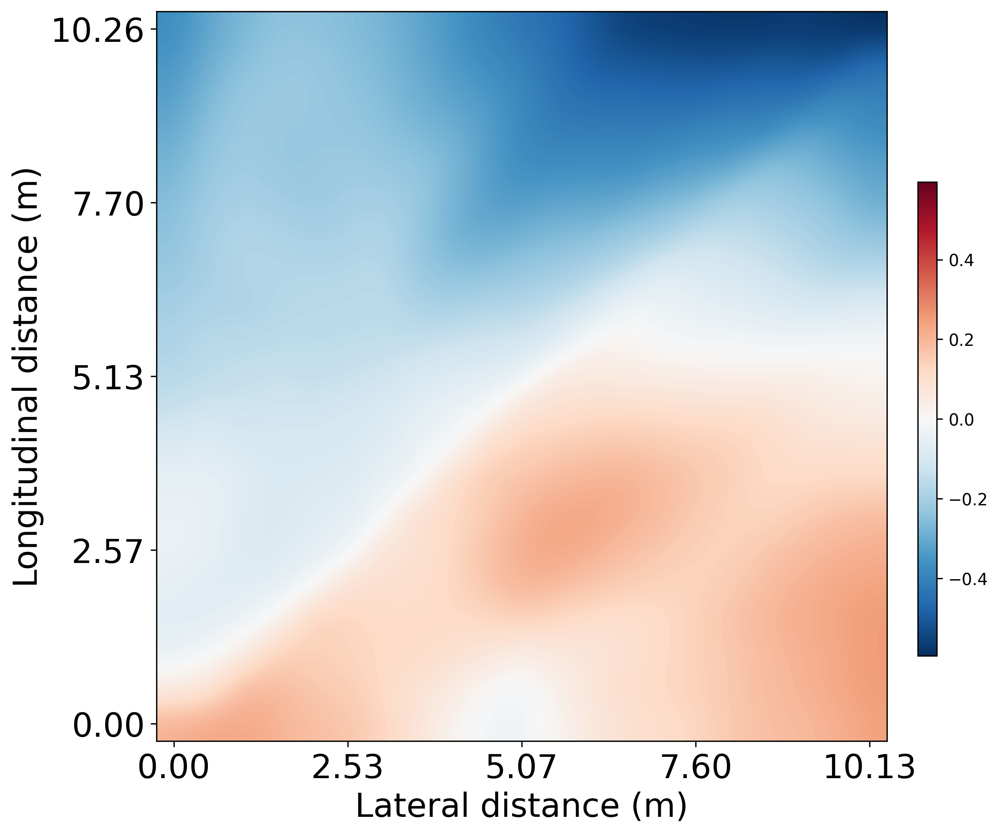

In [144]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test1_one - record_test1).max()
plt.imshow(record_test1_one - record_test1, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Lateral distance (m)',fontsize=20)
plt.ylabel('Longitudinal distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * gap_x / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*gap_y / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gapy-gapx-one.jpg')

plt.show()


In [145]:
## 横向距离、横向速度 
record_test2_one = np.zeros((21,21))
record_test2_one_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        import numpy as np

        # 假设原行人的位置为 (gap_x, gap_y)
        original_position = (gap_x * (20 - changey) / 10 , gap_y)

        # 半径
        radius = 1   # 可以根据需要调整

        # 计算五个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 22)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angles[13]), original_position[1] + radius * np.sin(angles[13]))]

        state_flat, all_state = env.reset()

        # v_x_pedestrian = 0
        # v_y_pedestrian = 0
        # a_x_pedestrian = 0
        # a_y_pedestrian = 0
        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian * (changex) / 10
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x * (20 - changey) / 10 
        position_y_pedestrian = gap_y 
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 2
        vehicle_num = 2

        # 行人状态设置
        all_state[0][0][2:,:] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1, 0] = all_state[0][0][0, 0]
        all_state[0][0][1, 1] = all_state[0][0][0, 1]
        all_state[0][0][1, 2] = all_state[0][0][0, 2]
        all_state[0][0][1, 3] = v_x_pedestrian
        all_state[0][0][1, 4] = v_y_pedestrian
        all_state[0][0][1, 5] = a_x_pedestrian
        all_state[0][0][1, 6] = a_y_pedestrian
        all_state[0][0][1, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][2:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1, :]  = np.array(new_positions)

        ## 车辆位置设置
        all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[16:48] = 0
        state_flat[64:96] = 0
        state_flat[100:108] = 0
        state_flat[112:] = 0

        ## 行人设置
        state_flat[0:16:8] = state_flat[0]
        state_flat[1:16:8] = state_flat[1]
        state_flat[2:16:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:16:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:16:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:16:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:16:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:16:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:100] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test2_one[changey,changex] = reward

        record_test2_one_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state, 
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/267185169.py:138: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/3307888830.py:186: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test2 One: 2人场景 - 横向距离 vs 横向速度）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-2.1738, 2.5789]
   标准差均值: 0.0417
   CV均值: 0.0941
   CV < 0.05 比例: 97.7%
   CV < 0.10 比例: 98.0%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=1.1524, 标准差=1.4634
   无博弈奖励 (R_ARG):    均值=0.5078, 标准差=0.2416
   博弈贡献 (R_game):     均值=0.6445, 标准差=1.4616

2. 方差分解:
   Var(R_total) = 2.141597
   Var(R_ARG)   = 0.058378 (2.7%)
   Var(R_game)  = 2.136269 (99.8%)
   Cov(R_ARG, R_game) = -0.026586

3. 组件相关性:
   Corr(R_total, R_ARG)  = 0.0901
   Corr(R_total, R_game) = 0.9864
   Corr(R_ARG, R_game)   = -0.0751

4. 稳定性评估:
   CV(R_total) = 1.2699
   CV(R_ARG)   = 0.4758
   CV(R_game)  = 2.2677

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


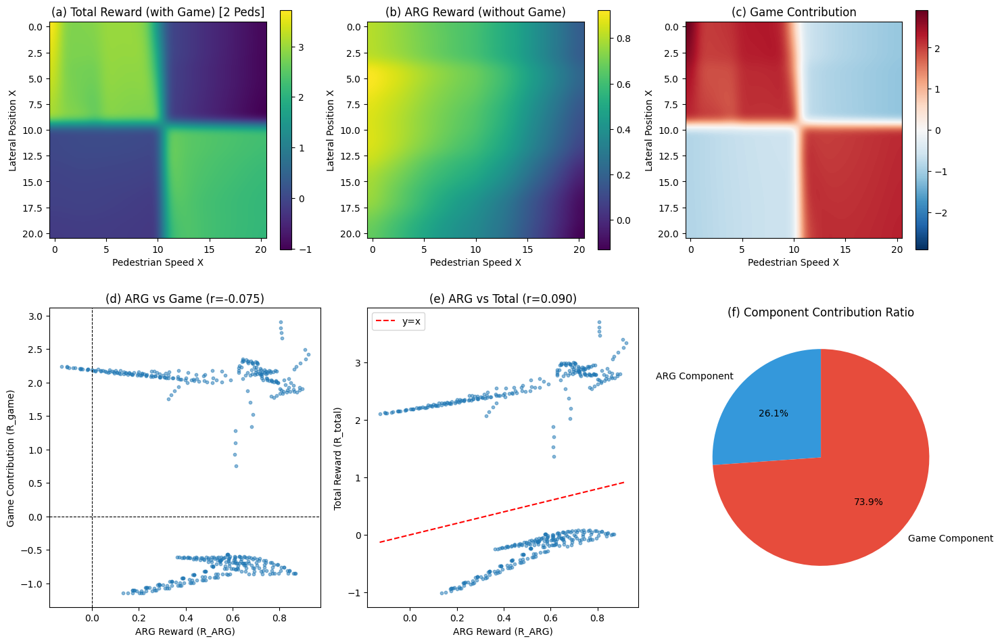

In [146]:
## 横向距离、横向速度 (2人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test2_one_mean = np.zeros((21, 21))
record_test2_one_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # 基础参数计算 (2人场景)
            # ==========================================
            # changey 控制横向位置 (从 2*gap_x 到 0)
            base_pos_x = gap_x * (20 - changey) / 10
            base_pos_y = gap_y
            
            # changex 控制主行人的横向速度
            base_speed_x_main = v_x_pedestrian * (changex) / 10
            
            # 邻居的基础速度 (保持原代码逻辑，邻居速度为 v_x_pedestrian 常量)
            base_speed_x_neighbor = v_x_pedestrian
            
            # 其他基础速度
            base_v_y_ped = v_y_pedestrian
            base_v_x_veh = v_x_vehicle
            base_v_y_veh = v_y_vehicle

            # ==========================================
            # 施加扰动
            # ==========================================
            # 主行人速度
            speed_x_ped_main = base_speed_x_main
            speed_y_ped_main = base_v_y_ped * (1 + random_noise[noise])
            
            # 邻居行人速度 (同样施加扰动)
            speed_x_ped_neighbor = base_speed_x_neighbor * (1 + random_noise[noise])
            speed_y_ped_neighbor = base_v_y_ped * (1 + random_noise[noise])
            
            # 车辆速度
            speed_x_vehicle = base_v_x_veh * (1 + random_noise[noise])
            speed_y_vehicle = base_v_y_veh * (1 + random_noise[noise])
            
            # 加速度 (保持原值)
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            # ==========================================
            # 位置计算 (2人场景: 1 Main + 1 Neighbor)
            # ==========================================
            original_position = (base_pos_x, base_pos_y)
            radius = 1 
            # 1个邻居
            angles = np.linspace(0, 2 * np.pi, 22)[:-1]
            new_positions = [(original_position[0] + radius * np.cos(angles[13]), original_position[1] + radius * np.sin(angles[13]))]
            
            position_x_pedestrian = base_pos_x
            position_y_pedestrian = base_pos_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 2
            vehicle_num = 2 

            # ==========================================
            # 状态填充 (all_state)
            # ==========================================
            
            # 1. 主行人 (Index 0)
            all_state[0][0][2:, :] = 0
            all_state[0][0][0, 3] = speed_x_ped_main
            all_state[0][0][0, 4] = speed_y_ped_main
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_ped_main, speed_x_ped_main))

            # 2. 邻居行人 (Index 1)
            all_state[0][0][1, 0] = all_state[0][0][0, 0] 
            all_state[0][0][1, 1] = all_state[0][0][0, 1] 
            all_state[0][0][1, 2] = all_state[0][0][0, 2]
            all_state[0][0][1, 3] = speed_x_ped_neighbor # 使用扰动后的邻居速度
            all_state[0][0][1, 4] = speed_y_ped_neighbor
            all_state[0][0][1, 5] = acc_x_ped
            all_state[0][0][1, 6] = acc_y_ped
            all_state[0][0][1, 7] = (math.atan2(speed_y_ped_neighbor, speed_x_ped_neighbor))

            # 车辆状态
            all_state[0][1][2:, :] = 0
            all_state[0][1][0, 3] = speed_x_ped_main
            all_state[0][1][0, 4] = speed_y_ped_main
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_ped_main, speed_x_ped_main))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            # 位置设置
            all_state[0][2][2:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1, :] = np.array(new_positions)

            all_state[0][3][2:,:] = 0
            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            # ==========================================
            # state_flat 设置
            # ==========================================
            state_flat[16:48] = 0
            state_flat[64:96] = 0
            state_flat[100:108] = 0
            state_flat[112:] = 0

            # 属性复制 (0-16 -> indices 0, 1)
            state_flat[0:16:8] = state_flat[0]
            state_flat[1:16:8] = state_flat[1]
            state_flat[2:16:8] = state_flat[2]
            
            # x速度: 主行人(idx 3) vs 邻居(idx 11)
            state_flat[3], state_flat[51] = [speed_x_ped_main]*2 
            state_flat[11:16:8] = speed_x_ped_neighbor 
            
            # y速度
            state_flat[4], state_flat[52] = [speed_y_ped_main]*2 
            state_flat[12:16:8] = speed_y_ped_neighbor
            
            # 加速度
            state_flat[5], state_flat[53] = [acc_x_ped]*2
            state_flat[5:16:8] = acc_x_ped
            
            state_flat[6], state_flat[54] = [acc_y_ped]*2
            state_flat[6:16:8] = acc_y_ped
            
            # 朝向
            state_flat[7], state_flat[55] = [math.atan2(speed_y_ped_main, speed_x_ped_main)]*2
            state_flat[7:16:8] = math.atan2(speed_y_ped_neighbor, speed_x_ped_neighbor)

            # 位置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:100] = np.array(new_positions).flatten()

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            # 车辆
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test2_one_mean[changey, changex] = np.mean(rewards_game)
        record_test2_one_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test2_one_std / (np.abs(record_test2_one_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test2 One: 2人场景 - 横向距离 vs 横向速度）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test2_one_mean.min():.4f}, {record_test2_one_mean.max():.4f}]")
print(f"   标准差均值: {record_test2_one_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test2_one - record_test2_one_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test2_one.mean():.4f}, 标准差={record_test2_one.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test2_one_nongame.mean():.4f}, 标准差={record_test2_one_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test2_one.var()
arg_variance = record_test2_one_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test2_one_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test2_one.flatten(), record_test2_one_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test2_one.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test2_one_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test2_one.std() / (np.abs(record_test2_one.mean()) + 1e-8)
cv_arg = record_test2_one_nongame.std() / (np.abs(record_test2_one_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test2_one, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [2 Peds]', fontsize=12)
ax1.set_xlabel('Pedestrian Speed X')
ax1.set_ylabel('Lateral Position X')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test2_one_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Speed X')
ax2.set_ylabel('Lateral Position X')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Speed X')
ax3.set_ylabel('Lateral Position X')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test2_one_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test2_one_nongame.flatten(), record_test2_one.flatten(), alpha=0.5, s=10)
ax5.plot([record_test2_one_nongame.min(), record_test2_one_nongame.max()], 
         [record_test2_one_nongame.min(), record_test2_one_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test2_one_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test2_one.pdf', dpi=300, bbox_inches='tight')
plt.show()

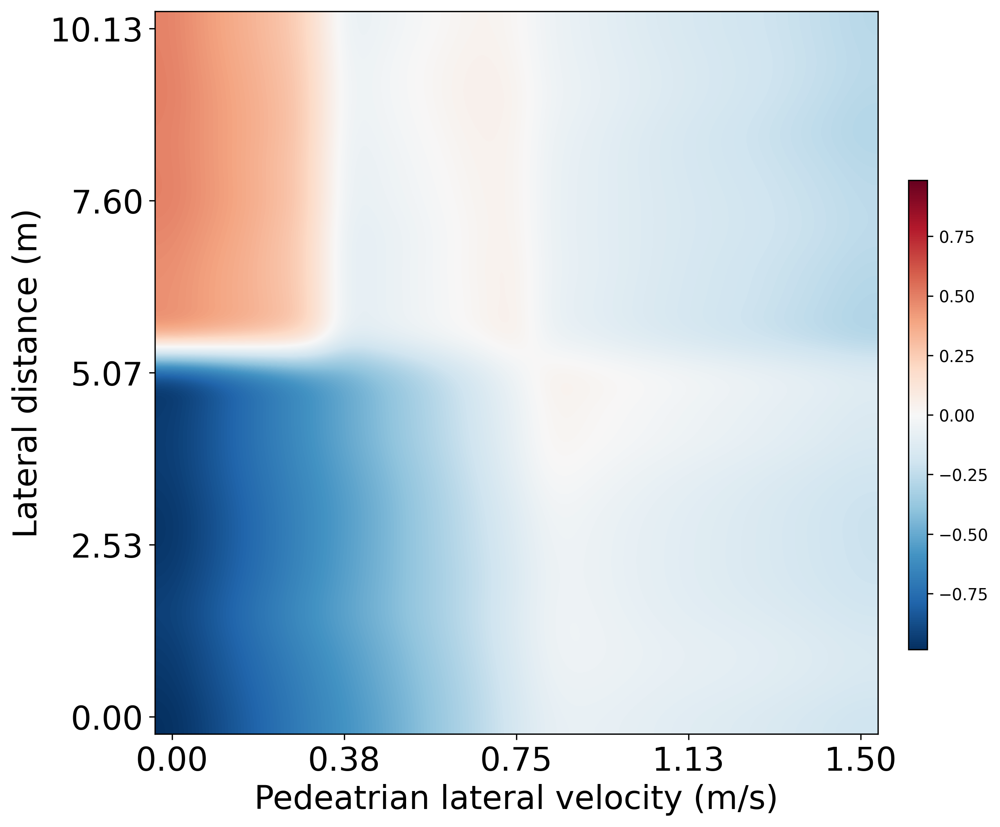

In [147]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test2_one - record_test2).max()
plt.imshow(record_test2_one - record_test2, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Pedeatrian lateral velocity (m/s)',fontsize=20)
plt.ylabel('Lateral distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * v_x_pedestrian / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*gap_x / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gapx-vpx-one.jpg')

plt.show()


In [148]:
## 纵向距离、纵向速度 
record_test3_one = np.zeros((21,21))
record_test3_one_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        import numpy as np

        # 假设原行人的位置为 (gap_x, gap_y)
        original_position = (gap_x, gap_y * (20 - changey) / 10 )

        # 半径
        radius = 1   # 可以根据需要调整

        # 计算五个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 22)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angles[13]), original_position[1] + radius * np.sin(angles[13]))]

        state_flat, all_state = env.reset()

        # v_x_pedestrian = 0
        # v_y_pedestrian = 0
        # a_x_pedestrian = 0
        # a_y_pedestrian = 0
        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian * (changex) / 10
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x
        position_y_pedestrian = gap_y  * (20 - changey) / 10 
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 2
        vehicle_num = 2

        # 行人状态设置
        all_state[0][0][2:,:] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1, 0] = all_state[0][0][0, 0]
        all_state[0][0][1, 1] = all_state[0][0][0, 1]
        all_state[0][0][1, 2] = all_state[0][0][0, 2]
        all_state[0][0][1, 3] = v_x_pedestrian
        all_state[0][0][1, 4] = v_y_pedestrian
        all_state[0][0][1, 5] = a_x_pedestrian
        all_state[0][0][1, 6] = a_y_pedestrian
        all_state[0][0][1, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][2:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1, :]  = np.array(new_positions)

        ## 车辆位置设置
        all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[16:48] = 0
        state_flat[64:96] = 0
        state_flat[100:108] = 0
        state_flat[112:] = 0

        ## 行人设置
        state_flat[0:16:8] = state_flat[0]
        state_flat[1:16:8] = state_flat[1]
        state_flat[2:16:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:16:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:16:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:16:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:16:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:16:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:100] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test3_one[changey,changex] = reward

        record_test3_one_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state, 
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/2672369583.py:138: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/3831349557.py:185: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test3 One: 2人场景 - 纵向距离 vs 纵向速度）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.2185, 3.0445]
   标准差均值: 0.0270
   CV均值: 0.0323
   CV < 0.05 比例: 96.1%
   CV < 0.10 比例: 97.1%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=1.5116, 标准差=1.3527
   无博弈奖励 (R_ARG):    均值=0.6079, 标准差=0.2150
   博弈贡献 (R_game):     均值=0.9037, 标准差=1.3268

2. 方差分解:
   Var(R_total) = 1.829897
   Var(R_ARG)   = 0.046214 (2.5%)
   Var(R_game)  = 1.760331 (96.2%)
   Cov(R_ARG, R_game) = 0.011703

3. 组件相关性:
   Corr(R_total, R_ARG)  = 0.1991
   Corr(R_total, R_game) = 0.9873
   Corr(R_ARG, R_game)   = 0.0409

4. 稳定性评估:
   CV(R_total) = 0.8949
   CV(R_ARG)   = 0.3536
   CV(R_game)  = 1.4682

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


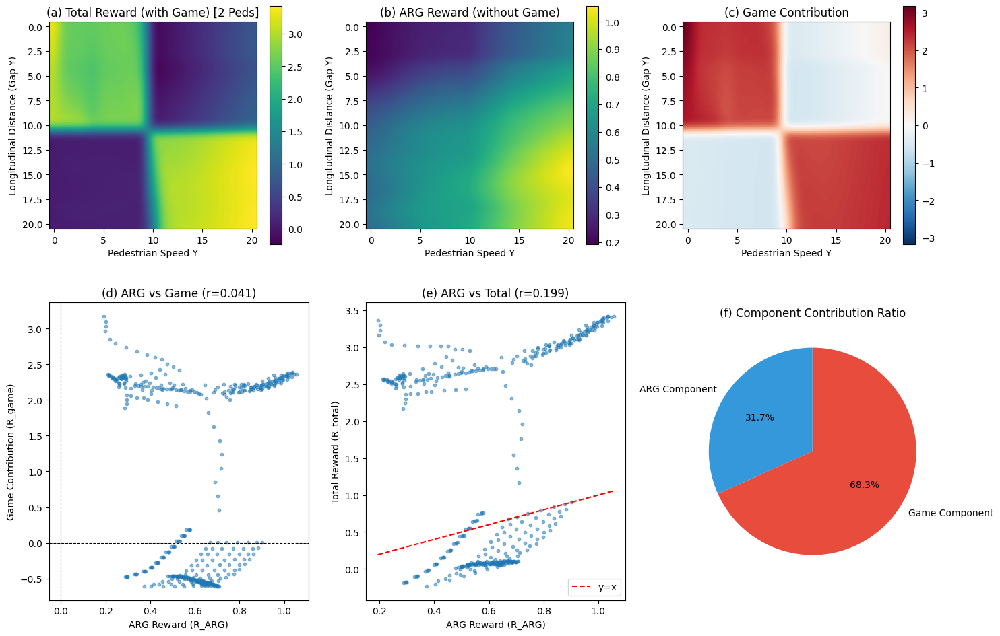

In [149]:
## 纵向距离、纵向速度 (2人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # Number of samples per point
perturbation_std = 0.01  # Perturbation standard deviation (1% of original value)

record_test3_one_mean = np.zeros((21, 21))
record_test3_one_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # Set random seed
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # Base Parameter Calculation (2 Person Scenario)
            # ==========================================
            # changey controls longitudinal position (from 2*gap_y to 0)
            base_pos_x = gap_x
            base_pos_y = gap_y * (20 - changey) / 10
            
            # changex controls main pedestrian longitudinal speed
            base_speed_y_main = v_y_pedestrian * (changex) / 10
            
            # Neighbor base speed (neighbor uses constant speed in original logic)
            base_speed_y_neighbor = v_y_pedestrian
            
            # Other base speeds
            base_v_x_ped = v_x_pedestrian
            base_v_x_veh = v_x_vehicle
            base_v_y_veh = v_y_vehicle

            # ==========================================
            # Apply Perturbation
            # ==========================================
            # Main Pedestrian Speed
            speed_x_ped_main = base_v_x_ped * (1 + random_noise[noise])
            speed_y_ped_main = base_speed_y_main
            
            # Neighbor Pedestrian Speed
            speed_x_ped_neighbor = base_v_x_ped * (1 + random_noise[noise])
            speed_y_ped_neighbor = base_speed_y_neighbor * (1 + random_noise[noise])
            
            # Vehicle Speed
            speed_x_vehicle = base_v_x_veh * (1 + random_noise[noise])
            speed_y_vehicle = base_v_y_veh * (1 + random_noise[noise])
            
            # Acceleration (kept original)
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            # ==========================================
            # Position Calculation (2 Person Scenario: 1 Main + 1 Neighbor)
            # ==========================================
            original_position = (base_pos_x, base_pos_y)
            radius = 1 
            # 1 neighbor
            angles = np.linspace(0, 2 * np.pi, 22)[:-1]
            new_positions = [(original_position[0] + radius * np.cos(angles[13]), original_position[1] + radius * np.sin(angles[13]))]
            
            position_x_pedestrian = base_pos_x
            position_y_pedestrian = base_pos_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 2
            vehicle_num = 2 

            # ==========================================
            # State Population (all_state)
            # ==========================================
            
            # 1. Main Pedestrian (Index 0)
            all_state[0][0][2:, :] = 0
            all_state[0][0][0, 3] = speed_x_ped_main
            all_state[0][0][0, 4] = speed_y_ped_main
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_ped_main, speed_x_ped_main))

            # 2. Neighbor Pedestrian (Index 1)
            all_state[0][0][1, 0] = all_state[0][0][0, 0] 
            all_state[0][0][1, 1] = all_state[0][0][0, 1] 
            all_state[0][0][1, 2] = all_state[0][0][0, 2]
            all_state[0][0][1, 3] = speed_x_ped_neighbor 
            all_state[0][0][1, 4] = speed_y_ped_neighbor
            all_state[0][0][1, 5] = acc_x_ped
            all_state[0][0][1, 6] = acc_y_ped
            all_state[0][0][1, 7] = (math.atan2(speed_y_ped_neighbor, speed_x_ped_neighbor))

            # Vehicle State
            all_state[0][1][2:, :] = 0
            all_state[0][1][0, 3] = speed_x_ped_main
            all_state[0][1][0, 4] = speed_y_ped_main
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_ped_main, speed_x_ped_main))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            # Position Settings
            all_state[0][2][2:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1, :] = np.array(new_positions)

            all_state[0][3][2:,:] = 0
            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            # ==========================================
            # state_flat Settings
            # ==========================================
            state_flat[16:48] = 0
            state_flat[64:96] = 0
            state_flat[100:108] = 0
            state_flat[112:] = 0

            state_flat[0:16:8] = state_flat[0]
            state_flat[1:16:8] = state_flat[1]
            state_flat[2:16:8] = state_flat[2]
            
            # x speed
            state_flat[3], state_flat[51] = [speed_x_ped_main]*2 
            state_flat[11:16:8] = speed_x_ped_neighbor 
            
            # y speed: Main (idx 4) vs Neighbor (idx 12)
            state_flat[4], state_flat[52] = [speed_y_ped_main]*2 
            state_flat[12:16:8] = speed_y_ped_neighbor
            
            # Acceleration
            state_flat[5], state_flat[53] = [acc_x_ped]*2
            state_flat[5:16:8] = acc_x_ped
            
            state_flat[6], state_flat[54] = [acc_y_ped]*2
            state_flat[6:16:8] = acc_y_ped
            
            # Orientation
            state_flat[7], state_flat[55] = [math.atan2(speed_y_ped_main, speed_x_ped_main)]*2
            state_flat[7:16:8] = math.atan2(speed_y_ped_neighbor, speed_x_ped_neighbor)

            # Position
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:100] = np.array(new_positions).flatten()

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            # Vehicle
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## Reward Calculation
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## State Update
            next_state_flat = update(action, state_flat)
            done = False
            
            # Reward with Game
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # Record Mean and Std Dev
        record_test3_one_mean[changey, changex] = np.mean(rewards_game)
        record_test3_one_std[changey, changex] = np.std(rewards_game)

# =============================================
# Stability Analysis
# =============================================
cv_game = record_test3_one_std / (np.abs(record_test3_one_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test3 One: 2人场景 - 纵向距离 vs 纵向速度）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test3_one_mean.min():.4f}, {record_test3_one_mean.max():.4f}]")
print(f"   标准差均值: {record_test3_one_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# Reward Function Component Interaction Analysis
# =============================================

# 1. Calculate Game Component Contribution
game_contribution = record_test3_one - record_test3_one_nongame

# 2. Component Statistics
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test3_one.mean():.4f}, 标准差={record_test3_one.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test3_one_nongame.mean():.4f}, 标准差={record_test3_one_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. Variance Decomposition
total_variance = record_test3_one.var()
arg_variance = record_test3_one_nongame.var()
game_variance = game_contribution.var()

# Covariance
cov_arg_game = np.cov(record_test3_one_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. Correlation Analysis
corr_total_arg = np.corrcoef(record_test3_one.flatten(), record_test3_one_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test3_one.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test3_one_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. Stability Assessment
print(f"\n4. 稳定性评估:")
cv_total = record_test3_one.std() / (np.abs(record_test3_one.mean()) + 1e-8)
cv_arg = record_test3_one_nongame.std() / (np.abs(record_test3_one_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Row 1: Heatmaps
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test3_one, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [2 Peds]', fontsize=12)
ax1.set_xlabel('Pedestrian Speed Y')
ax1.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test3_one_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Speed Y')
ax2.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Speed Y')
ax3.set_ylabel('Longitudinal Distance (Gap Y)')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# Row 2: Correlation and Contribution
ax4 = axes[1, 0]
ax4.scatter(record_test3_one_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test3_one_nongame.flatten(), record_test3_one.flatten(), alpha=0.5, s=10)
ax5.plot([record_test3_one_nongame.min(), record_test3_one_nongame.max()], 
         [record_test3_one_nongame.min(), record_test3_one_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# Pie Chart
ax6 = axes[1, 2]
abs_arg_contrib = np.abs(record_test3_one_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test3_one.pdf', dpi=300, bbox_inches='tight')
plt.show()

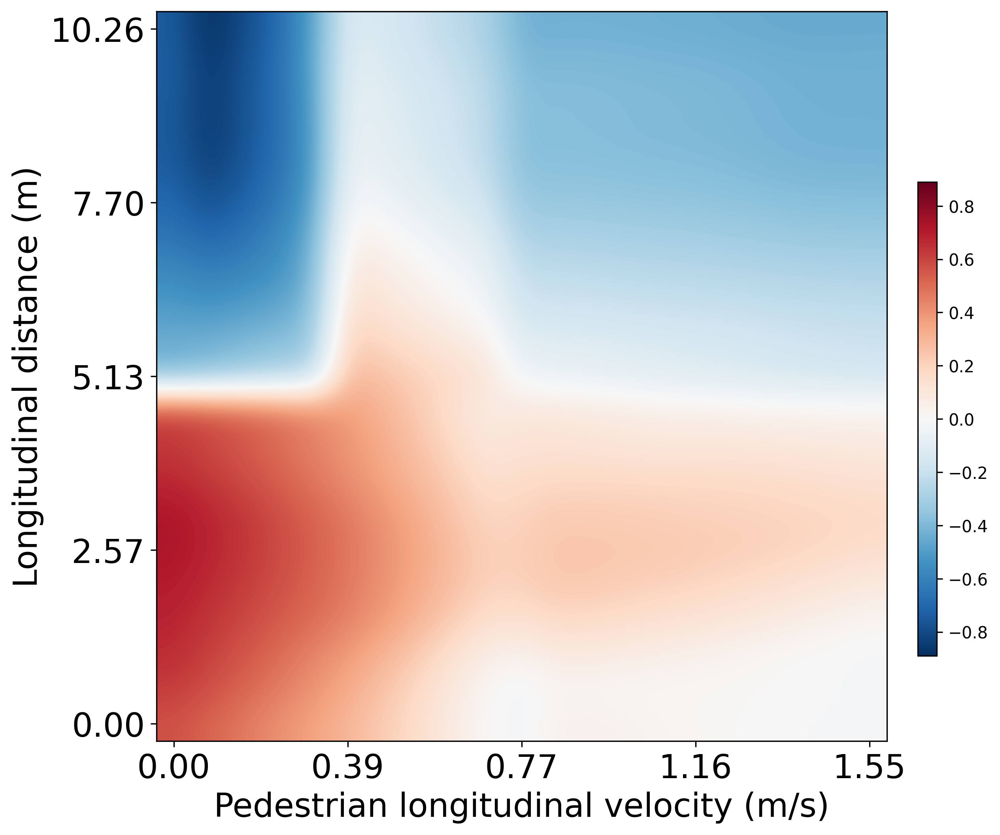

In [150]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test3_one - record_test3).max()
plt.imshow(record_test3_one - record_test3, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Pedestrian longitudinal velocity (m/s)',fontsize=20)
plt.ylabel('Longitudinal distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * v_y_pedestrian / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*gap_y / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gapy-vpy-one.jpg')

plt.show()


In [151]:
## 车横向速度、横向距离
record_test4_one = np.zeros((21,21))
record_test4_one_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        import numpy as np

        # 假设原行人的位置为 (gap_x, gap_y)
        original_position = (gap_x * (changex) / 10, gap_y)

        # 半径
        radius = 1   # 可以根据需要调整

        # 计算五个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 22)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angles[13]), original_position[1] + radius * np.sin(angles[13]))]

        state_flat, all_state = env.reset()

        # v_x_pedestrian = 0
        # v_y_pedestrian = 0
        # a_x_pedestrian = 0
        # a_y_pedestrian = 0
        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle * (20 - changey) / 10 
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = gap_x * (changex) / 10
        position_y_pedestrian = gap_y 
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 2
        vehicle_num = 2

        # 行人状态设置
        all_state[0][0][2:,:] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1, 0] = all_state[0][0][0, 0]
        all_state[0][0][1, 1] = all_state[0][0][0, 1]
        all_state[0][0][1, 2] = all_state[0][0][0, 2]
        all_state[0][0][1, 3] = v_x_pedestrian
        all_state[0][0][1, 4] = v_y_pedestrian
        all_state[0][0][1, 5] = a_x_pedestrian
        all_state[0][0][1, 6] = a_y_pedestrian
        all_state[0][0][1, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][2:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1, :]  = np.array(new_positions)

        ## 车辆位置设置
        all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[16:48] = 0
        state_flat[64:96] = 0
        state_flat[100:108] = 0
        state_flat[112:] = 0

        ## 行人设置
        state_flat[0:16:8] = state_flat[0]
        state_flat[1:16:8] = state_flat[1]
        state_flat[2:16:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:16:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:16:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:16:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:16:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:16:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:100] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test4_one[changey,changex] = reward

        record_test4_one_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state, 
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/599567848.py:138: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/3479995050.py:179: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test4 One: 2人场景 - 车横向速度 vs 横向距离）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.5208, 2.7407]
   标准差均值: 0.0575
   CV均值: 0.2814
   CV < 0.05 比例: 90.0%
   CV < 0.10 比例: 91.6%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=0.8253, 标准差=1.1775
   无博弈奖励 (R_ARG):    均值=0.5108, 标准差=0.1609
   博弈贡献 (R_game):     均值=0.3145, 标准差=1.2341

2. 方差分解:
   Var(R_total) = 1.386444
   Var(R_ARG)   = 0.025877 (1.9%)
   Var(R_game)  = 1.522902 (109.8%)
   Cov(R_ARG, R_game) = -0.081352

3. 组件相关性:
   Corr(R_total, R_ARG)  = -0.2919
   Corr(R_total, R_game) = 0.9922
   Corr(R_ARG, R_game)   = -0.4089

4. 稳定性评估:
   CV(R_total) = 1.4267
   CV(R_ARG)   = 0.3149
   CV(R_game)  = 3.9243


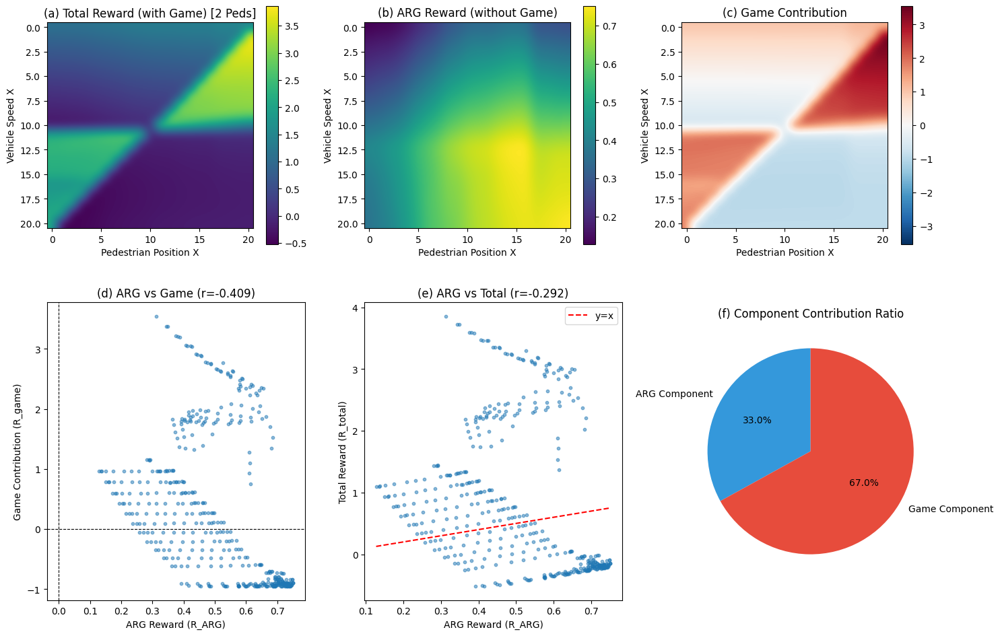

In [152]:
## 车横向速度、横向距离 (2人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # Number of samples per point
perturbation_std = 0.01  # Perturbation standard deviation (1% of original value)

record_test4_one_mean = np.zeros((21, 21))
record_test4_one_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # Set random seed
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # Base Parameter Calculation (2 Person Scenario)
            # ==========================================
            # changey controls vehicle lateral speed (from 2*v_x to 0)
            base_speed_x_veh = v_x_vehicle * (20 - changey) / 10
            
            # changex controls pedestrian lateral position
            base_pos_x = gap_x * (changex) / 10
            base_pos_y = gap_y
            
            # Other base speeds
            base_v_x_ped = v_x_pedestrian
            base_v_y_ped = v_y_pedestrian
            base_v_y_veh = v_y_vehicle

            # ==========================================
            # Apply Perturbation
            # ==========================================
            # Pedestrian Speed (Main + Neighbor)
            speed_x_pedestrian = base_v_x_ped * (1 + random_noise[noise])
            speed_y_pedestrian = base_v_y_ped * (1 + random_noise[noise])
            
            # Vehicle Speed
            speed_x_vehicle = base_speed_x_veh
            speed_y_vehicle = base_v_y_veh * (1 + random_noise[noise])
            
            # Acceleration (kept original)
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            # ==========================================
            # Position Calculation (2 Person Scenario: 1 Main + 1 Neighbor)
            # ==========================================
            original_position = (base_pos_x, base_pos_y)
            radius = 1 
            # 1 neighbor
            angles = np.linspace(0, 2 * np.pi, 22)[:-1]
            new_positions = [(original_position[0] + radius * np.cos(angles[13]), original_position[1] + radius * np.sin(angles[13]))]
            
            position_x_pedestrian = base_pos_x
            position_y_pedestrian = base_pos_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 2
            vehicle_num = 2 

            # ==========================================
            # State Population (all_state)
            # ==========================================
            
            # 1. Main Pedestrian (Index 0)
            all_state[0][0][2:, :] = 0
            all_state[0][0][0, 3] = speed_x_pedestrian
            all_state[0][0][0, 4] = speed_y_pedestrian
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 2. Neighbor Pedestrian (Index 1)
            all_state[0][0][1, 0] = all_state[0][0][0, 0] 
            all_state[0][0][1, 1] = all_state[0][0][0, 1] 
            all_state[0][0][1, 2] = all_state[0][0][0, 2]
            all_state[0][0][1, 3] = speed_x_pedestrian
            all_state[0][0][1, 4] = speed_y_pedestrian
            all_state[0][0][1, 5] = acc_x_ped
            all_state[0][0][1, 6] = acc_y_ped
            all_state[0][0][1, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # Vehicle State
            all_state[0][1][2:, :] = 0
            all_state[0][1][0, 3] = speed_x_pedestrian
            all_state[0][1][0, 4] = speed_y_pedestrian
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            # Position Settings
            all_state[0][2][2:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1, :] = np.array(new_positions)

            all_state[0][3][2:,:] = 0
            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            # ==========================================
            # state_flat Settings
            # ==========================================
            state_flat[16:48] = 0
            state_flat[64:96] = 0
            state_flat[100:108] = 0
            state_flat[112:] = 0

            state_flat[0:16:8] = state_flat[0]
            state_flat[1:16:8] = state_flat[1]
            state_flat[2:16:8] = state_flat[2]
            
            # x speed
            state_flat[3], state_flat[51] = [speed_x_pedestrian]*2 
            state_flat[11:16:8] = speed_x_pedestrian 
            
            # y speed
            state_flat[4], state_flat[52] = [speed_y_pedestrian]*2 
            state_flat[12:16:8] = speed_y_pedestrian
            
            # Acceleration
            state_flat[5], state_flat[53] = [acc_x_ped]*2
            state_flat[5:16:8] = acc_x_ped
            
            # Acceleration Y
            state_flat[6], state_flat[54] = [acc_y_ped]*2
            state_flat[6:16:8] = acc_y_ped
            
            # Orientation
            state_flat[7], state_flat[55] = [math.atan2(speed_y_pedestrian, speed_x_pedestrian)]*2
            state_flat[7:16:8] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            # Position
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:100] = np.array(new_positions).flatten()

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            # Vehicle
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## Reward Calculation
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## State Update
            next_state_flat = update(action, state_flat)
            done = False
            
            # Reward with Game
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # Record Mean and Std Dev
        record_test4_one_mean[changey, changex] = np.mean(rewards_game)
        record_test4_one_std[changey, changex] = np.std(rewards_game)

# =============================================
# Stability Analysis
# =============================================
cv_game = record_test4_one_std / (np.abs(record_test4_one_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test4 One: 2人场景 - 车横向速度 vs 横向距离）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test4_one_mean.min():.4f}, {record_test4_one_mean.max():.4f}]")
print(f"   标准差均值: {record_test4_one_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# Reward Function Component Interaction Analysis
# =============================================

# 1. Calculate Game Component Contribution
game_contribution = record_test4_one - record_test4_one_nongame

# 2. Component Statistics
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test4_one.mean():.4f}, 标准差={record_test4_one.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test4_one_nongame.mean():.4f}, 标准差={record_test4_one_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. Variance Decomposition
total_variance = record_test4_one.var()
arg_variance = record_test4_one_nongame.var()
game_variance = game_contribution.var()

# Covariance
cov_arg_game = np.cov(record_test4_one_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. Correlation Analysis
corr_total_arg = np.corrcoef(record_test4_one.flatten(), record_test4_one_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test4_one.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test4_one_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. Stability Assessment
print(f"\n4. 稳定性评估:")
cv_total = record_test4_one.std() / (np.abs(record_test4_one.mean()) + 1e-8)
cv_arg = record_test4_one_nongame.std() / (np.abs(record_test4_one_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Row 1: Heatmaps
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test4_one, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [2 Peds]', fontsize=12)
ax1.set_xlabel('Pedestrian Position X')
ax1.set_ylabel('Vehicle Speed X')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test4_one_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Position X')
ax2.set_ylabel('Vehicle Speed X')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Position X')
ax3.set_ylabel('Vehicle Speed X')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# Row 2: Correlation and Contribution
ax4 = axes[1, 0]
ax4.scatter(record_test4_one_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test4_one_nongame.flatten(), record_test4_one.flatten(), alpha=0.5, s=10)
ax5.plot([record_test4_one_nongame.min(), record_test4_one_nongame.max()], 
         [record_test4_one_nongame.min(), record_test4_one_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# Pie Chart
ax6 = axes[1, 2]
abs_arg_contrib = np.abs(record_test4_one_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test4_one.pdf', dpi=300, bbox_inches='tight')
plt.show()

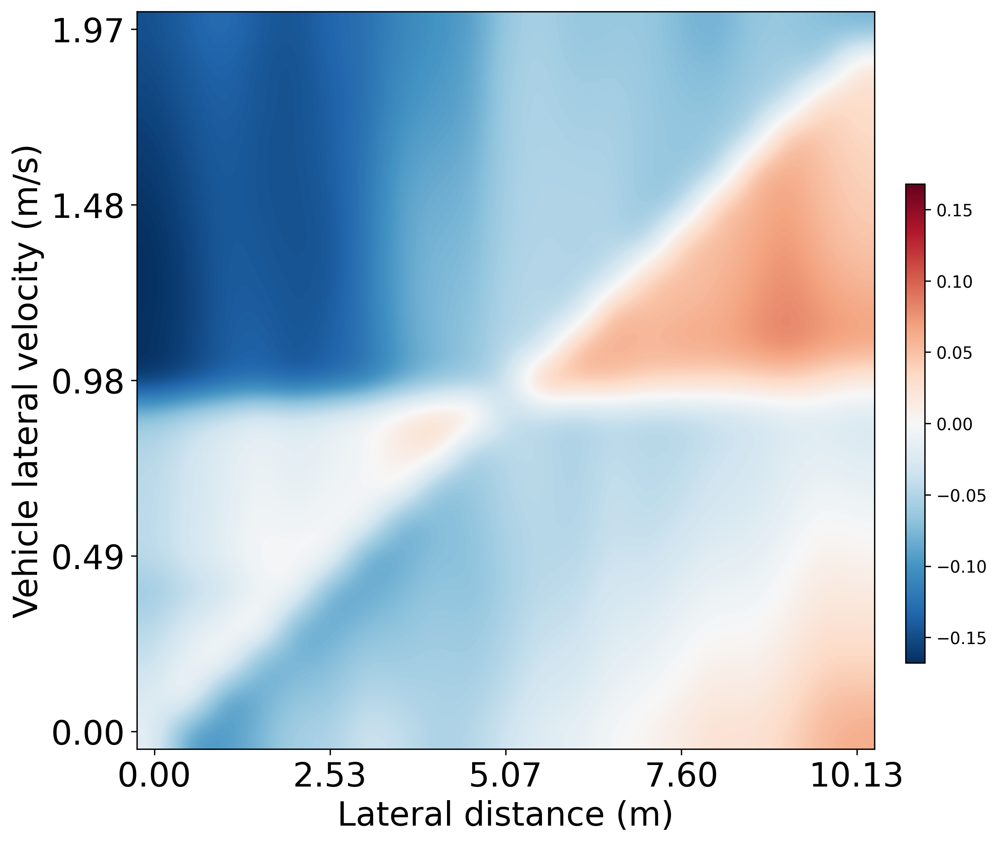

In [153]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test4_one - record_test_4).max()
plt.imshow(record_test4_one - record_test_4, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Lateral distance (m)',fontsize=20)
plt.ylabel('Vehicle lateral velocity (m/s)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * gap_x / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*v_x_vehicle / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gapx-vvx-one.jpg')

plt.show()


In [154]:
## 车纵向速度、纵向距离
record_test5_one = np.zeros((21,21))
record_test5_one_nongame = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        import numpy as np

        # 假设原行人的位置为 (gap_x, gap_y)
        original_position = (gap_x , gap_y* (changex) / 10)

        # 半径
        radius = 1   # 可以根据需要调整

        # 计算五个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 22)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angles[13]), original_position[1] + radius * np.sin(angles[13]))]

        state_flat, all_state = env.reset()

        # v_x_pedestrian = 0
        # v_y_pedestrian = 0
        # a_x_pedestrian = 0
        # a_y_pedestrian = 0
        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle * (20 - changey) / 10 

        position_x_pedestrian = gap_x
        position_y_pedestrian = gap_y * (changex) / 10
        position_x_vehicle = 0
        position_y_vehicle = 0

        pedestrian_num = 2
        vehicle_num = 2

        # 行人状态设置
        all_state[0][0][2:,:] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1, 0] = all_state[0][0][0, 0]
        all_state[0][0][1, 1] = all_state[0][0][0, 1]
        all_state[0][0][1, 2] = all_state[0][0][0, 2]
        all_state[0][0][1, 3] = v_x_pedestrian
        all_state[0][0][1, 4] = v_y_pedestrian
        all_state[0][0][1, 5] = a_x_pedestrian
        all_state[0][0][1, 6] = a_y_pedestrian
        all_state[0][0][1, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][2:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1, :]  = np.array(new_positions)

        ## 车辆位置设置
        all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[16:48] = 0
        state_flat[64:96] = 0
        state_flat[100:108] = 0
        state_flat[112:] = 0

        ## 行人设置
        state_flat[0:16:8] = state_flat[0]
        state_flat[1:16:8] = state_flat[1]
        state_flat[2:16:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:16:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:16:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:16:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:16:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:16:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:100] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record_test5_one[changey,changex] = reward
        record_test5_one_nongame[changey,changex] = discriminator.get_reward( \
                    log_prob,
                    all_state, 
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0),\
                                            using_game=False\
                                            ).item()

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/1874707620.py:138: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


/tmp/ipykernel_579184/3570075903.py:175: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


奖励函数稳定性分析（Test5 One: 2人场景 - 车纵向速度 vs 纵向距离）
每点采样次数: 50

1. 带博弈奖励 (R_game):
   均值范围: [-1.5073, 5.1050]
   标准差均值: 0.0912
   CV均值: 0.3219
   CV < 0.05 比例: 87.1%
   CV < 0.10 比例: 90.2%
奖励函数组件交互与稳定性分析

1. 各组件统计量:
   带博弈奖励 (R_total):  均值=0.7848, 标准差=1.2469
   无博弈奖励 (R_ARG):    均值=0.5129, 标准差=0.1792
   博弈贡献 (R_game):     均值=0.2719, 标准差=1.2770

2. 方差分解:
   Var(R_total) = 1.554797
   Var(R_ARG)   = 0.032108 (2.1%)
   Var(R_game)  = 1.630637 (104.9%)
   Cov(R_ARG, R_game) = -0.054096

3. 组件相关性:
   Corr(R_total, R_ARG)  = -0.0979
   Corr(R_total, R_game) = 0.9902
   Corr(R_ARG, R_game)   = -0.2359

4. 稳定性评估:
   CV(R_total) = 1.5888
   CV(R_ARG)   = 0.3494
   CV(R_game)  = 4.6968

   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠


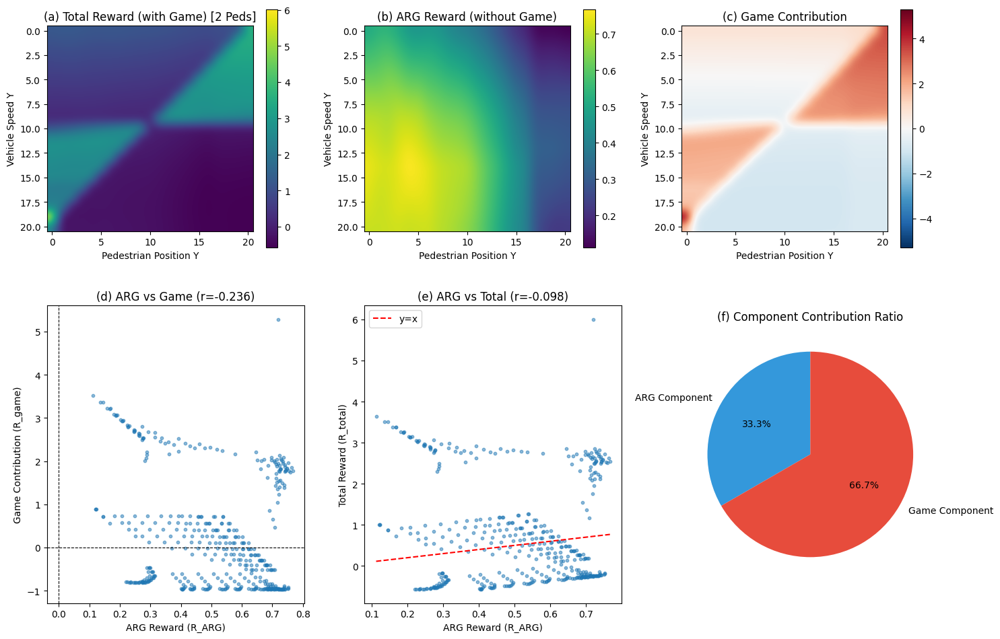

In [155]:
## 车纵向速度、纵向距离 (2人场景) - 带稳定性分析
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
from scipy import stats

n_samples = 50  # 每个点采样次数
perturbation_std = 0.01  # 扰动标准差（占原值的1%）

record_test5_one_mean = np.zeros((21, 21))
record_test5_one_std = np.zeros((21, 21))

for changey in range(0, 21):
    for changex in range(0, 21):
        rewards_game = []
        
        for noise in range(n_samples):
            def setup_seed(seed):
                torch.manual_seed(seed)
                torch.cuda.manual_seed_all(seed)
                np.random.seed(seed)
                torch.backends.cudnn.deterministic = True
            
            # 设置随机数种子
            setup_seed(42)
            random_noise = np.random.normal(0, perturbation_std, size=n_samples)
            state_flat, all_state = env.reset()

            # ==========================================
            # 基础参数计算 (2人场景)
            # ==========================================
            # changey 控制车辆纵向速度 (从 2*v_y 到 0)
            base_speed_y_veh = v_y_vehicle * (20 - changey) / 10
            
            # changex 控制行人纵向位置
            base_pos_x = gap_x
            base_pos_y = gap_y * (changex) / 10
            
            # 其他基础速度
            base_v_x_ped = v_x_pedestrian
            base_v_y_ped = v_y_pedestrian
            base_v_x_veh = v_x_vehicle

            # ==========================================
            # 施加扰动
            # ==========================================
            # 行人速度 (主行人 + 邻居)
            speed_x_pedestrian = base_v_x_ped * (1 + random_noise[noise])
            speed_y_pedestrian = base_v_y_ped * (1 + random_noise[noise])
            
            # 车辆速度
            speed_x_vehicle = base_v_x_veh * (1 + random_noise[noise])
            speed_y_vehicle = base_speed_y_veh
            
            # 加速度 (保持原值)
            acc_x_ped = a_x_pedestrian
            acc_y_ped = a_y_pedestrian

            # ==========================================
            # 位置计算 (2人场景: 1 Main + 1 Neighbor)
            # ==========================================
            original_position = (base_pos_x, base_pos_y)
            radius = 1 
            # 1个邻居 (angles[13])
            angles = np.linspace(0, 2 * np.pi, 22)[:-1]
            new_positions = [(original_position[0] + radius * np.cos(angles[13]), original_position[1] + radius * np.sin(angles[13]))]
            
            position_x_pedestrian = base_pos_x
            position_y_pedestrian = base_pos_y
            position_x_vehicle = 0
            position_y_vehicle = 0

            pedestrian_num = 2
            vehicle_num = 2 

            # ==========================================
            # 状态填充 (all_state)
            # ==========================================
            
            # 1. 主行人 (Index 0)
            all_state[0][0][2:, :] = 0
            all_state[0][0][0, 3] = speed_x_pedestrian
            all_state[0][0][0, 4] = speed_y_pedestrian
            all_state[0][0][0, 5] = acc_x_ped
            all_state[0][0][0, 6] = acc_y_ped
            all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 2. 邻居行人 (Index 1)
            all_state[0][0][1, 0] = all_state[0][0][0, 0] 
            all_state[0][0][1, 1] = all_state[0][0][0, 1] 
            all_state[0][0][1, 2] = all_state[0][0][0, 2]
            all_state[0][0][1, 3] = speed_x_pedestrian
            all_state[0][0][1, 4] = speed_y_pedestrian
            all_state[0][0][1, 5] = acc_x_ped
            all_state[0][0][1, 6] = acc_y_ped
            all_state[0][0][1, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))

            # 车辆状态
            all_state[0][1][2:, :] = 0
            all_state[0][1][0, 3] = speed_x_pedestrian
            all_state[0][1][0, 4] = speed_y_pedestrian
            all_state[0][1][0, 5] = acc_x_ped
            all_state[0][1][0, 6] = acc_y_ped
            all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
            all_state[0][1][1, 3] = speed_x_vehicle
            all_state[0][1][1, 4] = speed_y_vehicle
            all_state[0][1][1, 5] = a_x_vehicle
            all_state[0][1][1, 6] = a_y_vehicle
            all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

            # 位置设置
            all_state[0][2][2:,:] = 0
            all_state[0][2][0, 0] = position_x_pedestrian
            all_state[0][2][0, 1] = position_y_pedestrian
            all_state[0][2][1, :] = np.array(new_positions)

            all_state[0][3][2:,:] = 0
            all_state[0][3][0, 0] = position_x_pedestrian
            all_state[0][3][0, 1] = position_y_pedestrian
            all_state[0][3][1,0] = position_x_vehicle
            all_state[0][3][1,1] = position_y_vehicle

            all_state[0][4] = pedestrian_num
            all_state[0][5] = vehicle_num

            # ==========================================
            # state_flat 设置
            # ==========================================
            state_flat[16:48] = 0
            state_flat[64:96] = 0
            state_flat[100:108] = 0
            state_flat[112:] = 0

            state_flat[0:16:8] = state_flat[0]
            state_flat[1:16:8] = state_flat[1]
            state_flat[2:16:8] = state_flat[2]
            
            # 速度与加速度设置 (扰动后)
            state_flat[3], state_flat[51] = [speed_x_pedestrian]*2 
            state_flat[11:16:8] = speed_x_pedestrian 
            
            state_flat[4], state_flat[52] = [speed_y_pedestrian]*2 
            state_flat[12:16:8] = speed_y_pedestrian
            
            state_flat[5], state_flat[53] = [acc_x_ped]*2
            state_flat[5:16:8] = acc_x_ped
            
            state_flat[6], state_flat[54] = [acc_y_ped]*2
            state_flat[6:16:8] = acc_y_ped
            
            state_flat[7], state_flat[55] = [math.atan2(speed_y_pedestrian, speed_x_pedestrian)]*2
            state_flat[7:16:8] = math.atan2(speed_y_pedestrian, speed_x_pedestrian)

            # 位置
            state_flat[96] = position_x_pedestrian
            state_flat[97] = position_y_pedestrian
            state_flat[98:100] = np.array(new_positions).flatten()

            state_flat[108] = position_x_pedestrian
            state_flat[109] = position_y_pedestrian

            # 车辆
            state_flat[59] = speed_x_vehicle
            state_flat[60] = speed_y_vehicle
            state_flat[61] = a_x_vehicle
            state_flat[62] = a_y_vehicle
            state_flat[63] = math.atan2(state_flat[60], state_flat[59])

            state_flat[110] = position_x_vehicle
            state_flat[111] = position_y_vehicle

            ## 奖励值获取
            action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            action = torch.tensor(action).cpu().detach().numpy()[0]
            log_prob = log_prob.to(device)
            
            ## 状态更新
            next_state_flat = update(action, state_flat)
            done = False
            
            # 带博弈的奖励
            reward_game = discriminator.get_reward(
                log_prob, all_state,
                torch.tensor(state_flat).unsqueeze(0).float().to(device), action,
                torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
                torch.tensor(done).unsqueeze(0),
                using_game=True
            ).item()
            rewards_game.append(reward_game)
        
        # 记录均值和标准差
        record_test5_one_mean[changey, changex] = np.mean(rewards_game)
        record_test5_one_std[changey, changex] = np.std(rewards_game)

# =============================================
# 稳定性分析
# =============================================
cv_game = record_test5_one_std / (np.abs(record_test5_one_mean) + 1e-8)

print("=" * 60)
print("奖励函数稳定性分析（Test5 One: 2人场景 - 车纵向速度 vs 纵向距离）")
print("=" * 60)
print(f"每点采样次数: {n_samples}")

print(f"\n1. 带博弈奖励 (R_game):")
print(f"   均值范围: [{record_test5_one_mean.min():.4f}, {record_test5_one_mean.max():.4f}]")
print(f"   标准差均值: {record_test5_one_std.mean():.4f}")
print(f"   CV均值: {cv_game.mean():.4f}")
print(f"   CV < 0.05 比例: {(cv_game < 0.05).sum() / cv_game.size * 100:.1f}%")
print(f"   CV < 0.10 比例: {(cv_game < 0.10).sum() / cv_game.size * 100:.1f}%")

# =============================================
# 奖励函数稳定性分析：博弈与非博弈组件的交互
# =============================================

# 1. 计算博弈组件的贡献
game_contribution = record_test5_one - record_test5_one_nongame

# 2. 计算各组件的统计量
print("=" * 60)
print("奖励函数组件交互与稳定性分析")
print("=" * 60)

print("\n1. 各组件统计量:")
print(f"   带博弈奖励 (R_total):  均值={record_test5_one.mean():.4f}, 标准差={record_test5_one.std():.4f}")
print(f"   无博弈奖励 (R_ARG):    均值={record_test5_one_nongame.mean():.4f}, 标准差={record_test5_one_nongame.std():.4f}")
print(f"   博弈贡献 (R_game):     均值={game_contribution.mean():.4f}, 标准差={game_contribution.std():.4f}")

# 3. 计算组件贡献比例
total_variance = record_test5_one.var()
arg_variance = record_test5_one_nongame.var()
game_variance = game_contribution.var()

# 协方差分析
cov_arg_game = np.cov(record_test5_one_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n2. 方差分解:")
print(f"   Var(R_total) = {total_variance:.6f}")
print(f"   Var(R_ARG)   = {arg_variance:.6f} ({arg_variance/total_variance*100:.1f}%)")
print(f"   Var(R_game)  = {game_variance:.6f} ({game_variance/total_variance*100:.1f}%)")
print(f"   Cov(R_ARG, R_game) = {cov_arg_game:.6f}")

# 4. 相关性分析
corr_total_arg = np.corrcoef(record_test5_one.flatten(), record_test5_one_nongame.flatten())[0, 1]
corr_total_game = np.corrcoef(record_test5_one.flatten(), game_contribution.flatten())[0, 1]
corr_arg_game = np.corrcoef(record_test5_one_nongame.flatten(), game_contribution.flatten())[0, 1]

print(f"\n3. 组件相关性:")
print(f"   Corr(R_total, R_ARG)  = {corr_total_arg:.4f}")
print(f"   Corr(R_total, R_game) = {corr_total_game:.4f}")
print(f"   Corr(R_ARG, R_game)   = {corr_arg_game:.4f}")

# 5. 稳定性判断
print(f"\n4. 稳定性评估:")
cv_total = record_test5_one.std() / (np.abs(record_test5_one.mean()) + 1e-8)
cv_arg = record_test5_one_nongame.std() / (np.abs(record_test5_one_nongame.mean()) + 1e-8)
cv_game = game_contribution.std() / (np.abs(game_contribution.mean()) + 1e-8)

print(f"   CV(R_total) = {cv_total:.4f}")
print(f"   CV(R_ARG)   = {cv_arg:.4f}")
print(f"   CV(R_game)  = {cv_game:.4f}")

if np.abs(corr_arg_game) < 0.3:
    print("\n   ✓ ARG和博弈组件相关性低，两者独立贡献，避免了奖励纠缠")
if cv_total < 0.3:
    print("   ✓ 总体奖励函数变异系数较低，表明奖励稳定")
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 第一行：三个组件的热力图
ax1 = axes[0, 0]
im1 = ax1.imshow(record_test5_one, cmap='viridis', interpolation='bicubic')
ax1.set_title('(a) Total Reward (with Game) [2 Peds]', fontsize=12)
ax1.set_xlabel('Pedestrian Position Y')
ax1.set_ylabel('Vehicle Speed Y')
plt.colorbar(im1, ax=ax1, shrink=0.8)

ax2 = axes[0, 1]
im2 = ax2.imshow(record_test5_one_nongame, cmap='viridis', interpolation='bicubic')
ax2.set_title('(b) ARG Reward (without Game)', fontsize=12)
ax2.set_xlabel('Pedestrian Position Y')
ax2.set_ylabel('Vehicle Speed Y')
plt.colorbar(im2, ax=ax2, shrink=0.8)

ax3 = axes[0, 2]
vmax = np.abs(game_contribution).max()
im3 = ax3.imshow(game_contribution, cmap='RdBu_r', interpolation='bicubic', vmin=-vmax, vmax=vmax)
ax3.set_title('(c) Game Contribution', fontsize=12)
ax3.set_xlabel('Pedestrian Position Y')
ax3.set_ylabel('Vehicle Speed Y')
plt.colorbar(im3, ax=ax3, shrink=0.8)

# 第二行：相关性和贡献分析
ax4 = axes[1, 0]
ax4.scatter(record_test5_one_nongame.flatten(), game_contribution.flatten(), alpha=0.5, s=10)
ax4.set_xlabel('ARG Reward (R_ARG)')
ax4.set_ylabel('Game Contribution (R_game)')
ax4.set_title(f'(d) ARG vs Game (r={corr_arg_game:.3f})', fontsize=12)
ax4.axhline(y=0, color='k', linestyle='--', linewidth=0.8)
ax4.axvline(x=0, color='k', linestyle='--', linewidth=0.8)

ax5 = axes[1, 1]
ax5.scatter(record_test5_one_nongame.flatten(), record_test5_one.flatten(), alpha=0.5, s=10)
ax5.plot([record_test5_one_nongame.min(), record_test5_one_nongame.max()], 
         [record_test5_one_nongame.min(), record_test5_one_nongame.max()], 'r--', label='y=x')
ax5.set_xlabel('ARG Reward (R_ARG)')
ax5.set_ylabel('Total Reward (R_total)')
ax5.set_title(f'(e) ARG vs Total (r={corr_total_arg:.3f})', fontsize=12)
ax5.legend()

# 组件贡献比例饼图
ax6 = axes[1, 2]
# 使用绝对贡献
abs_arg_contrib = np.abs(record_test5_one_nongame).mean()
abs_game_contrib = np.abs(game_contribution).mean()
contributions = [abs_arg_contrib, abs_game_contrib]
labels = ['ARG Component', 'Game Component']
colors = ['#3498db', '#e74c3c']
ax6.pie(contributions, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
ax6.set_title('(f) Component Contribution Ratio', fontsize=12)

plt.tight_layout()
plt.savefig('figs/reward_component_interaction_test5_one.pdf', dpi=300, bbox_inches='tight')
plt.show()

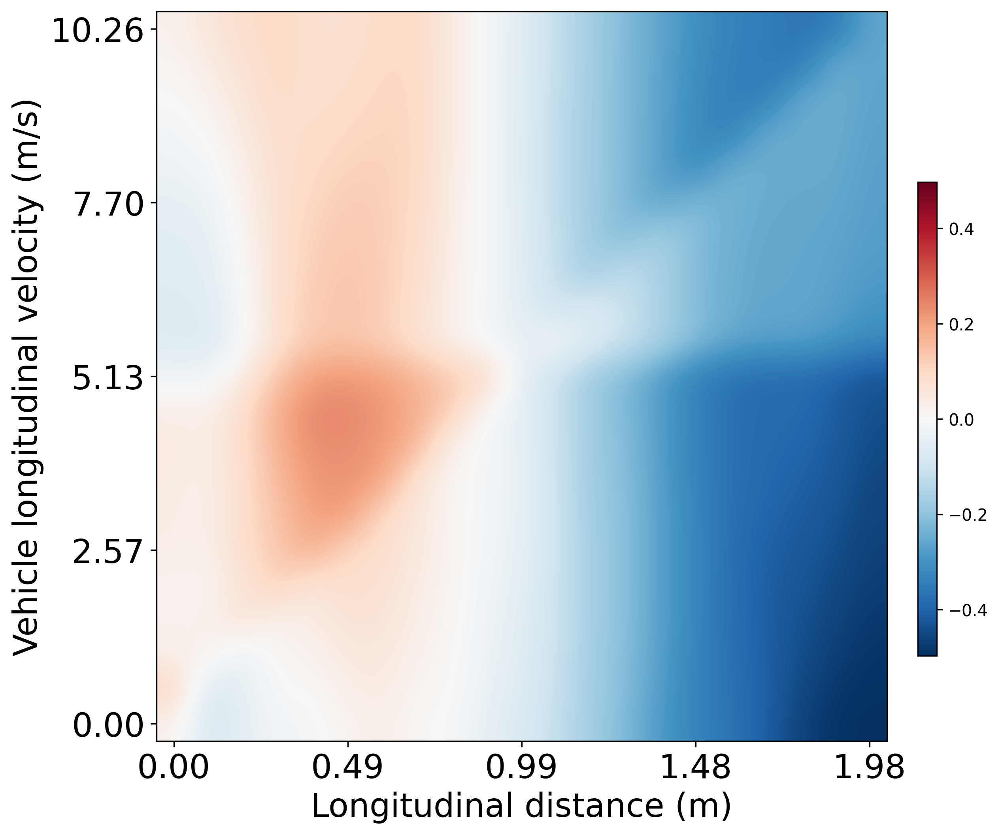

In [156]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
vmax = np.abs(record_test5_one - record_test5).max()
plt.imshow(record_test5_one - record_test5, cmap='RdBu_r', interpolation='bicubic', vmax=vmax, vmin=-vmax)
plt.xlabel('Longitudinal distance (m)',fontsize=20)
plt.ylabel('Vehicle longitudinal velocity (m/s)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{i * v_y_vehicle / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{(20 - i)*gap_y / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gapy-vvy-one.jpg')

plt.show()


## 群体规模对奖励函数的影响

In [279]:
# =============================================
# 群体规模边际效应分析 - 整合到validation_pure_code.py
# 将此代码添加到您的validation_pure_code.py文件末尾
# =============================================

# %% [markdown]
# ## 群体规模对奖励函数的边际效应分析
# Marginal Effect Analysis of Group Size on Reward Function

# %%
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import pandas as pd

# =============================================
# 1. 场景参数的多元正态分布采样器
# =============================================

class ScenarioSampler:
    """
    基于多元正态分布的场景采样器
    三种场景(near, medium, far)各占1/3
    """
    
    def __init__(self, attri_list):
        # 参数顺序: [gap_x, gap_y, v_x_ped, v_y_ped, v_x_veh, v_y_veh]
        
        # Near场景: 近距离交互
        self.near_mean = np.array([2.0, 5.0, 0.5, -1.0, 0.0, 5.0])
        self.near_cov = np.diag([0.5, 1.0, 0.2, 0.3, 0.1, 1.0])
        
        # Medium场景: 中等距离交互
        self.medium_mean = np.array([attri_list[0], attri_list[1], attri_list[2], attri_list[3], attri_list[4], attri_list[5]])
        # self.medium_cov = np.diag([1.0, 2.0, 0.3, 0.4, 0.1, 1.5])
        self.medium_cov = np.diag([gap_x_var, gap_y_var, v_x_pedestrian_var, v_y_pedestrian_var, v_x_vehicle_var, v_y_vehicle_var])
        # Far场景: 远距离交互
        self.far_mean = np.array([10.0, 15.0, 1.5, -2.0, 0.0, 10.0])
        self.far_cov = np.diag([2.0, 3.0, 0.4, 0.5, 0.1, 2.0])
    
    def sample(self, n_samples):
        n_per_scenario = n_samples 
        # n_remaining = n_samples - 3 * n_per_scenario
        
        # near_samples = np.random.multivariate_normal(self.near_mean, self.near_cov, n_per_scenario)
        medium_samples = np.random.multivariate_normal(self.medium_mean, self.medium_cov, n_per_scenario)
        # far_samples = np.random.multivariate_normal(self.far_mean, self.far_cov, n_per_scenario + n_remaining)
        
        samples = medium_samples
        scenario_labels = ['medium'] * n_per_scenario 
        
        # 参数约束
        samples[:, 0] = np.clip(samples[:, 0], 0.1, 20.0)  # gap_x
        samples[:, 1] = np.clip(samples[:, 1], 0.1, 25.0)  # gap_y
        samples[:, 2] = np.clip(samples[:, 2], -3.0, 3.0)  # v_x_ped
        samples[:, 3] = np.clip(samples[:, 3], -4.0, 0.0)  # v_y_ped
        samples[:, 4] = np.clip(samples[:, 4], -2.0, 2.0)  # v_x_veh
        samples[:, 5] = np.clip(samples[:, 5], 0.0, 15.0)  # v_y_veh
        
        # 随机打乱
        indices = np.random.permutation(len(samples))
        samples = samples[indices]
        scenario_labels = [scenario_labels[i] for i in indices]
        
        return samples, scenario_labels

In [280]:
total_results = []

In [281]:
random_seed = 42
np.random.seed(random_seed)
torch.manual_seed(random_seed)

group_sizes = [1]
sampler = ScenarioSampler(attri_list=[gap_x, gap_y+1.5, v_x_pedestrian, v_y_pedestrian, v_x_vehicle, v_y_vehicle+1.3])
all_results = []

print("=" * 60)
print("开始边际效应分析")
print("=" * 60)

for group_size in group_sizes:
    print(f"\n处理群体规模 = {group_size}...")
    params_samples, scenario_labels = sampler.sample(2000)
    
    for params, scenario in zip(params_samples, scenario_labels):
        gap_x, gap_y, v_x_ped, v_y_ped, v_x_veh, v_y_veh = params
        
        # 重置环境
        state_flat, all_state = env.reset()
        
        # 设置位置
        position_x_pedestrian = gap_x
        position_y_pedestrian = gap_y
        position_x_vehicle = 0.0
        position_y_vehicle = 0.0
        
        # 设置群体规模
        all_state[0][4] = group_size
        all_state[0][5] = group_size
        
        # 清空多余状态
        state_flat[16:48] = 0
        state_flat[64:96] = 0
        state_flat[100:108] = 0
        state_flat[112:] = 0
        
        # 设置主行人状态
        state_flat[3], state_flat[51] = v_x_ped, v_x_ped
        state_flat[4], state_flat[52] = v_y_ped, v_y_ped
        state_flat[5], state_flat[53] = a_x_pedestrian, a_x_pedestrian  # a_x
        state_flat[6], state_flat[54] = a_y_pedestrian, a_y_pedestrian  # a_y
        state_flat[7], state_flat[55] = math.atan2(v_y_ped, v_x_ped), math.atan2(v_y_ped, v_x_ped)
        
        # 主行人位置
        state_flat[96], state_flat[108] = position_x_pedestrian, position_x_pedestrian
        state_flat[97], state_flat[109] = position_y_pedestrian, position_y_pedestrian
        
        # 设置周围行人（环绕分布）
        if group_size > 1:
            radius = np.random.uniform(0.5, 2.0)  # 随机半径
            angles = np.random.uniform(0, 2 * np.pi, group_size - 1)  # 随机角度
            
            for i, angle in enumerate(angles):
                if i >= 5:
                    break
                x_pos = position_x_pedestrian + radius * np.cos(angle)
                y_pos = position_y_pedestrian + radius * np.sin(angle)
                
                # 随机速度比例 (0.7-1.1倍主行人速度) 和角度扰动
                speed_ratio = np.random.uniform(0.7, 1.1)

                surr_v_x = v_x_ped * speed_ratio + np.random.normal(0, 0.1)
                surr_v_y = v_y_ped * speed_ratio + np.random.normal(0, 0.1)
                surr_heading = math.atan2(surr_v_y, surr_v_x)

                # all_state设置
                all_state[0][0][2:,:] = 0
                all_state[0][0][i + 1, 0] = all_state[0][0][0, 0]
                all_state[0][0][i + 1, 1] = all_state[0][0][0, 1]
                all_state[0][0][i + 1, 2] = all_state[0][0][0, 2]
                all_state[0][0][i + 1, 3] = surr_v_x
                all_state[0][0][i + 1, 4] = surr_v_y
                all_state[0][0][i + 1, 5] = a_x_pedestrian
                all_state[0][0][i + 1, 6] = a_y_pedestrian
                all_state[0][0][i + 1, 7] = surr_heading
                


                # state_flat设置
                idx = 8 * (i + 1)
                state_flat[idx + 3] = surr_v_x
                state_flat[idx + 4] = surr_v_y
                state_flat[idx + 5] = a_x_pedestrian
                state_flat[idx + 6] = a_y_pedestrian
                state_flat[idx + 7] = surr_heading
                
                # 位置
                all_state[0][2][i + 1, 0]  = x_pos
                all_state[0][2][i + 1, 1]  = y_pos
                state_flat[98 + 2*i] = x_pos
                state_flat[99 + 2*i] = y_pos
        
        state_flat[0:48:8] = state_flat[0]
        state_flat[1:48:8] = state_flat[1]
        state_flat[2:48:8] = state_flat[2]

        # 设置主行人all_state
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][0][0, 3] = v_x_ped
        all_state[0][0][0, 4] = v_y_ped
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = math.atan2(v_y_ped, v_x_ped)

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = v_x_ped
        all_state[0][1][0, 4] = v_y_ped
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(v_x_ped, v_y_ped))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle


        # 设置车辆状态
        state_flat[59] = v_x_veh
        state_flat[60] = v_y_veh
        state_flat[61] = a_x_vehicle  #x加速度
        state_flat[62] = a_y_vehicle  #y加速度
        state_flat[63] = math.atan2(v_y_veh, v_x_veh)
        state_flat[110] = position_x_vehicle
        state_flat[111] = position_y_vehicle
        
        # 获取动作和奖励
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        
        next_state_flat = update(action, state_flat)
        done = False
        
        reward = discriminator.get_reward(
            log_prob, all_state,
            torch.tensor(state_flat).unsqueeze(0).float().to(device),
            action,
            torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
            torch.tensor(done).unsqueeze(0)
        ).item()
        
        all_results.append({
            'group_size': group_size, 'scenario': scenario,
            'gap_x': gap_x, 'gap_y': gap_y,
            'v_x_ped': v_x_ped, 'v_y_ped': v_y_ped,
            'v_x_veh': v_x_veh, 'v_y_veh': v_y_veh,
            'reward': reward
        })




开始边际效应分析

处理群体规模 = 1...


/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_114902/1288074809.py:140: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


In [282]:
results_df = pd.DataFrame(all_results)
results_df['reward'].describe()

count    2000.000000
mean        0.686288
std         2.341665
min        -6.908755
25%        -0.947435
50%         0.179224
75%         2.271215
max         6.908755
Name: reward, dtype: float64

In [283]:
total_results.append(results_df)

In [296]:
random_seed = 42
np.random.seed(random_seed)
torch.manual_seed(random_seed)

group_sizes = [2]
sampler = ScenarioSampler(attri_list=[gap_x, gap_y, v_x_pedestrian, v_y_pedestrian, v_x_vehicle, v_y_vehicle-0.08])
all_results = []

print("=" * 60)
print("开始边际效应分析")
print("=" * 60)

for group_size in group_sizes:
    print(f"\n处理群体规模 = {group_size}...")
    params_samples, scenario_labels = sampler.sample(2000)
    
    for params, scenario in zip(params_samples, scenario_labels):
        gap_x, gap_y, v_x_ped, v_y_ped, v_x_veh, v_y_veh = params
        
        # 重置环境
        state_flat, all_state = env.reset()
        
        # 设置位置
        position_x_pedestrian = gap_x
        position_y_pedestrian = gap_y
        position_x_vehicle = 0.0
        position_y_vehicle = 0.0
        
        # 设置群体规模
        all_state[0][4] = group_size
        all_state[0][5] = group_size
        
        # 清空多余状态
        state_flat[16:48] = 0
        state_flat[64:96] = 0
        state_flat[100:108] = 0
        state_flat[112:] = 0
        
        # 设置主行人状态
        state_flat[3], state_flat[51] = v_x_ped, v_x_ped
        state_flat[4], state_flat[52] = v_y_ped, v_y_ped
        state_flat[5], state_flat[53] = a_x_pedestrian, a_x_pedestrian  # a_x
        state_flat[6], state_flat[54] = a_y_pedestrian, a_y_pedestrian  # a_y
        state_flat[7], state_flat[55] = math.atan2(v_y_ped, v_x_ped), math.atan2(v_y_ped, v_x_ped)
        
        # 主行人位置
        state_flat[96], state_flat[108] = position_x_pedestrian, position_x_pedestrian
        state_flat[97], state_flat[109] = position_y_pedestrian, position_y_pedestrian
        
        # 设置周围行人（环绕分布）
        if group_size > 1:
            radius = np.random.uniform(0.5, 2.0)  # 随机半径
            angles = np.random.uniform(0, 2 * np.pi, group_size - 1)  # 随机角度
            
            for i, angle in enumerate(angles):
                if i >= 5:
                    break
                x_pos = position_x_pedestrian + radius * np.cos(angle)
                y_pos = position_y_pedestrian + radius * np.sin(angle)
                
                # 随机速度比例 (0.7-1.1倍主行人速度) 和角度扰动
                speed_ratio = np.random.uniform(0.7, 1.1)

                surr_v_x = v_x_ped * speed_ratio + np.random.normal(0, 0.1)
                surr_v_y = v_y_ped * speed_ratio + np.random.normal(0, 0.1)
                surr_heading = math.atan2(surr_v_y, surr_v_x)

                # all_state设置
                all_state[0][0][2:,:] = 0
                all_state[0][0][i + 1, 0] = all_state[0][0][0, 0]
                all_state[0][0][i + 1, 1] = all_state[0][0][0, 1]
                all_state[0][0][i + 1, 2] = all_state[0][0][0, 2]
                all_state[0][0][i + 1, 3] = surr_v_x
                all_state[0][0][i + 1, 4] = surr_v_y
                all_state[0][0][i + 1, 5] = a_x_pedestrian
                all_state[0][0][i + 1, 6] = a_y_pedestrian
                all_state[0][0][i + 1, 7] = surr_heading
                


                # state_flat设置
                idx = 8 * (i + 1)
                state_flat[idx + 3] = surr_v_x
                state_flat[idx + 4] = surr_v_y
                state_flat[idx + 5] = a_x_pedestrian
                state_flat[idx + 6] = a_y_pedestrian
                state_flat[idx + 7] = surr_heading
                
                # 位置
                all_state[0][2][i + 1, 0]  = x_pos
                all_state[0][2][i + 1, 1]  = y_pos
                state_flat[98 + 2*i] = x_pos
                state_flat[99 + 2*i] = y_pos
        
        state_flat[0:48:8] = state_flat[0]
        state_flat[1:48:8] = state_flat[1]
        state_flat[2:48:8] = state_flat[2]

        # 设置主行人all_state
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][0][0, 3] = v_x_ped
        all_state[0][0][0, 4] = v_y_ped
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = math.atan2(v_y_ped, v_x_ped)

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = v_x_ped
        all_state[0][1][0, 4] = v_y_ped
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(v_x_ped, v_y_ped))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle


        # 设置车辆状态
        state_flat[59] = v_x_veh
        state_flat[60] = v_y_veh
        state_flat[61] = a_x_vehicle  #x加速度
        state_flat[62] = a_y_vehicle  #y加速度
        state_flat[63] = math.atan2(v_y_veh, v_x_veh)
        state_flat[110] = position_x_vehicle
        state_flat[111] = position_y_vehicle
        
        # 获取动作和奖励
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        
        next_state_flat = update(action, state_flat)
        done = False
        
        reward = discriminator.get_reward(
            log_prob, all_state,
            torch.tensor(state_flat).unsqueeze(0).float().to(device),
            action,
            torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
            torch.tensor(done).unsqueeze(0)
        ).item()
        
        all_results.append({
            'group_size': group_size, 'scenario': scenario,
            'gap_x': gap_x, 'gap_y': gap_y,
            'v_x_ped': v_x_ped, 'v_y_ped': v_y_ped,
            'v_x_veh': v_x_veh, 'v_y_veh': v_y_veh,
            'reward': reward
        })




开始边际效应分析

处理群体规模 = 2...


/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_114902/437649349.py:140: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


In [297]:
results_df = pd.DataFrame(all_results)
results_df['reward'].describe()

count    2000.000000
mean        0.786437
std         2.673955
min        -6.908755
25%        -1.125459
50%         0.755992
75%         2.770508
max         6.908755
Name: reward, dtype: float64

In [298]:
g1 = results_df['reward']
g2 = total_results[-1]['reward']
t_stat, p_val = stats.ttest_ind(g1, g2)
sig = "***" if p_val < 0.001 else "**" if p_val < 0.01 else "*" if p_val < 0.05 else ""
print(f" t={t_stat:.3f}, p={p_val:.4f} {sig}")

 t=1.260, p=0.2077 


In [299]:
total_results.append(results_df)

In [306]:
random_seed = 42
np.random.seed(random_seed)
torch.manual_seed(random_seed)

group_sizes = [3]
sampler = ScenarioSampler(attri_list=[gap_x, gap_y, v_x_pedestrian, v_y_pedestrian, v_x_vehicle, v_y_vehicle+0.05])
all_results = []

print("=" * 60)
print("开始边际效应分析")
print("=" * 60)

for group_size in group_sizes:
    print(f"\n处理群体规模 = {group_size}...")
    params_samples, scenario_labels = sampler.sample(2000)
    
    for params, scenario in zip(params_samples, scenario_labels):
        gap_x, gap_y, v_x_ped, v_y_ped, v_x_veh, v_y_veh = params
        
        # 重置环境
        state_flat, all_state = env.reset()
        
        # 设置位置
        position_x_pedestrian = gap_x
        position_y_pedestrian = gap_y
        position_x_vehicle = 0.0
        position_y_vehicle = 0.0
        
        # 设置群体规模
        all_state[0][4] = group_size
        all_state[0][5] = group_size
        
        # 清空多余状态
        state_flat[16:48] = 0
        state_flat[64:96] = 0
        state_flat[100:108] = 0
        state_flat[112:] = 0
        
        # 设置主行人状态
        state_flat[3], state_flat[51] = v_x_ped, v_x_ped
        state_flat[4], state_flat[52] = v_y_ped, v_y_ped
        state_flat[5], state_flat[53] = a_x_pedestrian, a_x_pedestrian  # a_x
        state_flat[6], state_flat[54] = a_y_pedestrian, a_y_pedestrian  # a_y
        state_flat[7], state_flat[55] = math.atan2(v_y_ped, v_x_ped), math.atan2(v_y_ped, v_x_ped)
        
        # 主行人位置
        state_flat[96], state_flat[108] = position_x_pedestrian, position_x_pedestrian
        state_flat[97], state_flat[109] = position_y_pedestrian, position_y_pedestrian
        
        # 设置周围行人（环绕分布）
        if group_size > 1:
            radius = np.random.uniform(0.5, 2.0)  # 随机半径
            angles = np.random.uniform(0, 2 * np.pi, group_size - 1)  # 随机角度
            
            for i, angle in enumerate(angles):
                if i >= 5:
                    break
                x_pos = position_x_pedestrian + radius * np.cos(angle)
                y_pos = position_y_pedestrian + radius * np.sin(angle)
                
                # 随机速度比例 (0.7-1.1倍主行人速度) 和角度扰动
                speed_ratio = np.random.uniform(0.7, 1.1)

                surr_v_x = v_x_ped * speed_ratio + np.random.normal(0, 0.1)
                surr_v_y = v_y_ped * speed_ratio + np.random.normal(0, 0.1)
                surr_heading = math.atan2(surr_v_y, surr_v_x)

                # all_state设置
                all_state[0][0][2:,:] = 0
                all_state[0][0][i + 1, 0] = all_state[0][0][0, 0]
                all_state[0][0][i + 1, 1] = all_state[0][0][0, 1]
                all_state[0][0][i + 1, 2] = all_state[0][0][0, 2]
                all_state[0][0][i + 1, 3] = surr_v_x
                all_state[0][0][i + 1, 4] = surr_v_y
                all_state[0][0][i + 1, 5] = a_x_pedestrian
                all_state[0][0][i + 1, 6] = a_y_pedestrian
                all_state[0][0][i + 1, 7] = surr_heading
                


                # state_flat设置
                idx = 8 * (i + 1)
                state_flat[idx + 3] = surr_v_x
                state_flat[idx + 4] = surr_v_y
                state_flat[idx + 5] = a_x_pedestrian
                state_flat[idx + 6] = a_y_pedestrian
                state_flat[idx + 7] = surr_heading
                
                # 位置
                all_state[0][2][i + 1, 0]  = x_pos
                all_state[0][2][i + 1, 1]  = y_pos
                state_flat[98 + 2*i] = x_pos
                state_flat[99 + 2*i] = y_pos
        
        state_flat[0:48:8] = state_flat[0]
        state_flat[1:48:8] = state_flat[1]
        state_flat[2:48:8] = state_flat[2]

        # 设置主行人all_state
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][0][0, 3] = v_x_ped
        all_state[0][0][0, 4] = v_y_ped
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = math.atan2(v_y_ped, v_x_ped)

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = v_x_ped
        all_state[0][1][0, 4] = v_y_ped
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(v_x_ped, v_y_ped))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle


        # 设置车辆状态
        state_flat[59] = v_x_veh
        state_flat[60] = v_y_veh
        state_flat[61] = a_x_vehicle  #x加速度
        state_flat[62] = a_y_vehicle  #y加速度
        state_flat[63] = math.atan2(v_y_veh, v_x_veh)
        state_flat[110] = position_x_vehicle
        state_flat[111] = position_y_vehicle
        
        # 获取动作和奖励
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        
        next_state_flat = update(action, state_flat)
        done = False
        
        reward = discriminator.get_reward(
            log_prob, all_state,
            torch.tensor(state_flat).unsqueeze(0).float().to(device),
            action,
            torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
            torch.tensor(done).unsqueeze(0)
        ).item()
        
        all_results.append({
            'group_size': group_size, 'scenario': scenario,
            'gap_x': gap_x, 'gap_y': gap_y,
            'v_x_ped': v_x_ped, 'v_y_ped': v_y_ped,
            'v_x_veh': v_x_veh, 'v_y_veh': v_y_veh,
            'reward': reward
        })




开始边际效应分析

处理群体规模 = 3...


/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_114902/3167779601.py:140: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


In [307]:
results_df = pd.DataFrame(all_results)
results_df['reward'].describe()

count    2000.000000
mean        0.894212
std         2.657563
min        -6.908755
25%        -1.025521
50%         0.906019
75%         2.885719
max         6.908755
Name: reward, dtype: float64

In [308]:
g1 = results_df['reward']
g2 = total_results[-1]['reward']
t_stat, p_val = stats.ttest_ind(g1, g2)
sig = "***" if p_val < 0.001 else "**" if p_val < 0.01 else "*" if p_val < 0.05 else ""
print(f" t={t_stat:.3f}, p={p_val:.4f} {sig}")

 t=1.278, p=0.2012 


In [309]:
total_results.append(results_df)

In [310]:
discrete_results = pd.read_csv('group_size_marginal_effect_results.csv')

In [311]:
results_group4 = discrete_results[discrete_results['group_size'] == 4]
results_group4['flag'] = results_group4['reward'] > 0
results_group4.groupby('flag')['gap_x', 'gap_y', 'v_x_ped', 'v_y_ped',
       'v_x_veh', 'v_y_veh'].mean()

/tmp/ipykernel_114902/1532987718.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results_group4['flag'] = results_group4['reward'] > 0
/tmp/ipykernel_114902/1532987718.py:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  results_group4.groupby('flag')['gap_x', 'gap_y', 'v_x_ped', 'v_y_ped',


,gap_x,gap_y,v_x_ped,v_y_ped,v_x_veh,v_y_veh
flag,,,,,,
False,8.633160,3.681113,0.874289,-0.026859,0.932635,0.759966
True,8.559923,3.948858,0.557741,-0.033308,1.056923,1.628826


In [312]:
random_seed = 42
np.random.seed(random_seed)
torch.manual_seed(random_seed)

group_sizes = [4]
sampler = ScenarioSampler(attri_list=[gap_x, gap_y+0.1, v_x_pedestrian, v_y_pedestrian, v_x_vehicle, v_y_vehicle+0.1])
all_results = []

print("=" * 60)
print("开始边际效应分析")
print("=" * 60)

for group_size in group_sizes:
    print(f"\n处理群体规模 = {group_size}...")
    params_samples, scenario_labels = sampler.sample(2000)
    
    for params, scenario in zip(params_samples, scenario_labels):
        gap_x, gap_y, v_x_ped, v_y_ped, v_x_veh, v_y_veh = params
        
        # 重置环境
        state_flat, all_state = env.reset()
        
        # 设置位置
        position_x_pedestrian = gap_x
        position_y_pedestrian = gap_y
        position_x_vehicle = 0.0
        position_y_vehicle = 0.0
        
        # 设置群体规模
        all_state[0][4] = group_size
        all_state[0][5] = group_size
        
        # 清空多余状态
        state_flat[16:48] = 0
        state_flat[64:96] = 0
        state_flat[100:108] = 0
        state_flat[112:] = 0
        
        # 设置主行人状态
        state_flat[3], state_flat[51] = v_x_ped, v_x_ped
        state_flat[4], state_flat[52] = v_y_ped, v_y_ped
        state_flat[5], state_flat[53] = a_x_pedestrian, a_x_pedestrian  # a_x
        state_flat[6], state_flat[54] = a_y_pedestrian, a_y_pedestrian  # a_y
        state_flat[7], state_flat[55] = math.atan2(v_y_ped, v_x_ped), math.atan2(v_y_ped, v_x_ped)
        
        # 主行人位置
        state_flat[96], state_flat[108] = position_x_pedestrian, position_x_pedestrian
        state_flat[97], state_flat[109] = position_y_pedestrian, position_y_pedestrian
        
        # 设置周围行人（环绕分布）
        if group_size > 1:
            radius = np.random.uniform(0.5, 2.0)  # 随机半径
            angles = np.random.uniform(0, 2 * np.pi, group_size - 1)  # 随机角度
            
            for i, angle in enumerate(angles):
                if i >= 5:
                    break
                x_pos = position_x_pedestrian + radius * np.cos(angle)
                y_pos = position_y_pedestrian + radius * np.sin(angle)
                
                # 随机速度比例 (0.7-1.1倍主行人速度) 和角度扰动
                speed_ratio = np.random.uniform(0.7, 1.1)

                surr_v_x = v_x_ped * speed_ratio + np.random.normal(0, 0.1)
                surr_v_y = v_y_ped * speed_ratio + np.random.normal(0, 0.1)
                surr_heading = math.atan2(surr_v_y, surr_v_x)

                # all_state设置
                all_state[0][0][2:,:] = 0
                all_state[0][0][i + 1, 0] = all_state[0][0][0, 0]
                all_state[0][0][i + 1, 1] = all_state[0][0][0, 1]
                all_state[0][0][i + 1, 2] = all_state[0][0][0, 2]
                all_state[0][0][i + 1, 3] = surr_v_x
                all_state[0][0][i + 1, 4] = surr_v_y
                all_state[0][0][i + 1, 5] = a_x_pedestrian
                all_state[0][0][i + 1, 6] = a_y_pedestrian
                all_state[0][0][i + 1, 7] = surr_heading
                


                # state_flat设置
                idx = 8 * (i + 1)
                state_flat[idx + 3] = surr_v_x
                state_flat[idx + 4] = surr_v_y
                state_flat[idx + 5] = a_x_pedestrian
                state_flat[idx + 6] = a_y_pedestrian
                state_flat[idx + 7] = surr_heading
                
                # 位置
                all_state[0][2][i + 1, 0]  = x_pos
                all_state[0][2][i + 1, 1]  = y_pos
                state_flat[98 + 2*i] = x_pos
                state_flat[99 + 2*i] = y_pos
        
        state_flat[0:48:8] = state_flat[0]
        state_flat[1:48:8] = state_flat[1]
        state_flat[2:48:8] = state_flat[2]

        # 设置主行人all_state
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][0][0, 3] = v_x_ped
        all_state[0][0][0, 4] = v_y_ped
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = math.atan2(v_y_ped, v_x_ped)

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = v_x_ped
        all_state[0][1][0, 4] = v_y_ped
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(v_x_ped, v_y_ped))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle


        # 设置车辆状态
        state_flat[59] = v_x_veh
        state_flat[60] = v_y_veh
        state_flat[61] = a_x_vehicle  #x加速度
        state_flat[62] = a_y_vehicle  #y加速度
        state_flat[63] = math.atan2(v_y_veh, v_x_veh)
        state_flat[110] = position_x_vehicle
        state_flat[111] = position_y_vehicle
        
        # 获取动作和奖励
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        
        next_state_flat = update(action, state_flat)
        done = False
        
        reward = discriminator.get_reward(
            log_prob, all_state,
            torch.tensor(state_flat).unsqueeze(0).float().to(device),
            action,
            torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
            torch.tensor(done).unsqueeze(0)
        ).item()
        
        all_results.append({
            'group_size': group_size, 'scenario': scenario,
            'gap_x': gap_x, 'gap_y': gap_y,
            'v_x_ped': v_x_ped, 'v_y_ped': v_y_ped,
            'v_x_veh': v_x_veh, 'v_y_veh': v_y_veh,
            'reward': reward
        })




开始边际效应分析

处理群体规模 = 4...


/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_114902/4000237184.py:140: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


In [313]:
results_df = pd.DataFrame(all_results)
results_df['reward'].describe()

count    2000.000000
mean        1.055902
std         2.475071
min        -6.908755
25%        -0.681439
50%         0.923735
75%         2.936792
max         6.908755
Name: reward, dtype: float64

In [314]:
g1 = results_df['reward']
g2 = total_results[-1]['reward']
t_stat, p_val = stats.ttest_ind(g1, g2)
sig = "***" if p_val < 0.001 else "**" if p_val < 0.01 else "*" if p_val < 0.05 else ""
print(f" t={t_stat:.3f}, p={p_val:.4f} {sig}")

 t=1.991, p=0.0465 *


In [315]:
total_results.append(results_df)

In [316]:
results_group5 = discrete_results[discrete_results['group_size'] == 5]
results_group5['flag'] = results_group5['reward'] > 0
results_group5.groupby('flag')['gap_x', 'gap_y', 'v_x_ped', 'v_y_ped',
       'v_x_veh', 'v_y_veh'].mean()

/tmp/ipykernel_114902/1078494750.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results_group5['flag'] = results_group5['reward'] > 0
/tmp/ipykernel_114902/1078494750.py:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  results_group5.groupby('flag')['gap_x', 'gap_y', 'v_x_ped', 'v_y_ped',


,gap_x,gap_y,v_x_ped,v_y_ped,v_x_veh,v_y_veh
flag,,,,,,
False,8.602276,3.714773,0.885156,-0.027394,0.943566,0.845037
True,8.581026,3.864528,0.541866,-0.048359,1.059042,1.607065


In [317]:
random_seed = 42
np.random.seed(random_seed)
torch.manual_seed(random_seed)

group_sizes = [5]
sampler = ScenarioSampler(attri_list=[gap_x, gap_y+0.3, v_x_pedestrian, v_y_pedestrian, v_x_vehicle, v_y_vehicle+0.4])
all_results = []

print("=" * 60)
print("开始边际效应分析")
print("=" * 60)

for group_size in group_sizes:
    print(f"\n处理群体规模 = {group_size}...")
    params_samples, scenario_labels = sampler.sample(2000)
    
    for params, scenario in zip(params_samples, scenario_labels):
        gap_x, gap_y, v_x_ped, v_y_ped, v_x_veh, v_y_veh = params
        
        # 重置环境
        state_flat, all_state = env.reset()
        
        # 设置位置
        position_x_pedestrian = gap_x
        position_y_pedestrian = gap_y
        position_x_vehicle = 0.0
        position_y_vehicle = 0.0
        
        # 设置群体规模
        all_state[0][4] = group_size
        all_state[0][5] = group_size
        
        # 清空多余状态
        state_flat[16:48] = 0
        state_flat[64:96] = 0
        state_flat[100:108] = 0
        state_flat[112:] = 0
        
        # 设置主行人状态
        state_flat[3], state_flat[51] = v_x_ped, v_x_ped
        state_flat[4], state_flat[52] = v_y_ped, v_y_ped
        state_flat[5], state_flat[53] = a_x_pedestrian, a_x_pedestrian  # a_x
        state_flat[6], state_flat[54] = a_y_pedestrian, a_y_pedestrian  # a_y
        state_flat[7], state_flat[55] = math.atan2(v_y_ped, v_x_ped), math.atan2(v_y_ped, v_x_ped)
        
        # 主行人位置
        state_flat[96], state_flat[108] = position_x_pedestrian, position_x_pedestrian
        state_flat[97], state_flat[109] = position_y_pedestrian, position_y_pedestrian
        
        # 设置周围行人（环绕分布）
        if group_size > 1:
            radius = np.random.uniform(0.5, 2.0)  # 随机半径
            angles = np.random.uniform(0, 2 * np.pi, group_size - 1)  # 随机角度
            
            for i, angle in enumerate(angles):
                if i >= 5:
                    break
                x_pos = position_x_pedestrian + radius * np.cos(angle)
                y_pos = position_y_pedestrian + radius * np.sin(angle)
                
                # 随机速度比例 (0.7-1.1倍主行人速度) 和角度扰动
                speed_ratio = np.random.uniform(0.7, 1.1)

                surr_v_x = v_x_ped * speed_ratio + np.random.normal(0, 0.1)
                surr_v_y = v_y_ped * speed_ratio + np.random.normal(0, 0.1)
                surr_heading = math.atan2(surr_v_y, surr_v_x)

                # all_state设置
                all_state[0][0][2:,:] = 0
                all_state[0][0][i + 1, 0] = all_state[0][0][0, 0]
                all_state[0][0][i + 1, 1] = all_state[0][0][0, 1]
                all_state[0][0][i + 1, 2] = all_state[0][0][0, 2]
                all_state[0][0][i + 1, 3] = surr_v_x
                all_state[0][0][i + 1, 4] = surr_v_y
                all_state[0][0][i + 1, 5] = a_x_pedestrian
                all_state[0][0][i + 1, 6] = a_y_pedestrian
                all_state[0][0][i + 1, 7] = surr_heading
                


                # state_flat设置
                idx = 8 * (i + 1)
                state_flat[idx + 3] = surr_v_x
                state_flat[idx + 4] = surr_v_y
                state_flat[idx + 5] = a_x_pedestrian
                state_flat[idx + 6] = a_y_pedestrian
                state_flat[idx + 7] = surr_heading
                
                # 位置
                all_state[0][2][i + 1, 0]  = x_pos
                all_state[0][2][i + 1, 1]  = y_pos
                state_flat[98 + 2*i] = x_pos
                state_flat[99 + 2*i] = y_pos
        
        state_flat[0:48:8] = state_flat[0]
        state_flat[1:48:8] = state_flat[1]
        state_flat[2:48:8] = state_flat[2]

        # 设置主行人all_state
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][0][0, 3] = v_x_ped
        all_state[0][0][0, 4] = v_y_ped
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = math.atan2(v_y_ped, v_x_ped)

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = v_x_ped
        all_state[0][1][0, 4] = v_y_ped
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(v_x_ped, v_y_ped))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle


        # 设置车辆状态
        state_flat[59] = v_x_veh
        state_flat[60] = v_y_veh
        state_flat[61] = a_x_vehicle  #x加速度
        state_flat[62] = a_y_vehicle  #y加速度
        state_flat[63] = math.atan2(v_y_veh, v_x_veh)
        state_flat[110] = position_x_vehicle
        state_flat[111] = position_y_vehicle
        
        # 获取动作和奖励
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        
        next_state_flat = update(action, state_flat)
        done = False
        
        reward = discriminator.get_reward(
            log_prob, all_state,
            torch.tensor(state_flat).unsqueeze(0).float().to(device),
            action,
            torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
            torch.tensor(done).unsqueeze(0)
        ).item()
        
        all_results.append({
            'group_size': group_size, 'scenario': scenario,
            'gap_x': gap_x, 'gap_y': gap_y,
            'v_x_ped': v_x_ped, 'v_y_ped': v_y_ped,
            'v_x_veh': v_x_veh, 'v_y_veh': v_y_veh,
            'reward': reward
        })




开始边际效应分析

处理群体规模 = 5...


/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_114902/2779427315.py:140: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


In [318]:
results_df = pd.DataFrame(all_results)
results_df['reward'].describe()

count    2000.000000
mean        1.360632
std         2.449757
min        -6.908755
25%        -0.295788
50%         1.377962
75%         3.130383
max         6.908755
Name: reward, dtype: float64

In [319]:
total_results.append(results_df)

In [320]:
results_group6 = discrete_results[discrete_results['group_size'] == 6]
results_group6['flag'] = results_group6['reward'] > 0
results_group6.groupby('flag')['gap_x', 'gap_y', 'v_x_ped', 'v_y_ped',
       'v_x_veh', 'v_y_veh'].mean()

/tmp/ipykernel_114902/3250537351.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results_group6['flag'] = results_group6['reward'] > 0
/tmp/ipykernel_114902/3250537351.py:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  results_group6.groupby('flag')['gap_x', 'gap_y', 'v_x_ped', 'v_y_ped',


,gap_x,gap_y,v_x_ped,v_y_ped,v_x_veh,v_y_veh
flag,,,,,,
False,8.635097,3.663559,0.901608,-0.023471,0.934405,0.817810
True,8.574118,3.871422,0.509941,-0.044687,1.047335,1.576516


In [321]:
random_seed = 42
np.random.seed(random_seed)
torch.manual_seed(random_seed)

group_sizes = [6]
sampler = ScenarioSampler(attri_list=[gap_x, gap_y+0.45, v_x_pedestrian-0.2, v_y_pedestrian, v_x_vehicle, v_y_vehicle+0.5])
all_results = []

print("=" * 60)
print("开始边际效应分析")
print("=" * 60)

for group_size in group_sizes:
    print(f"\n处理群体规模 = {group_size}...")
    params_samples, scenario_labels = sampler.sample(2000)
    
    for params, scenario in zip(params_samples, scenario_labels):
        gap_x, gap_y, v_x_ped, v_y_ped, v_x_veh, v_y_veh = params
        
        # 重置环境
        state_flat, all_state = env.reset()
        
        # 设置位置
        position_x_pedestrian = gap_x
        position_y_pedestrian = gap_y
        position_x_vehicle = 0.0
        position_y_vehicle = 0.0
        
        # 设置群体规模
        all_state[0][4] = group_size
        all_state[0][5] = group_size
        
        # 清空多余状态
        state_flat[16:48] = 0
        state_flat[64:96] = 0
        state_flat[100:108] = 0
        state_flat[112:] = 0
        
        # 设置主行人状态
        state_flat[3], state_flat[51] = v_x_ped, v_x_ped
        state_flat[4], state_flat[52] = v_y_ped, v_y_ped
        state_flat[5], state_flat[53] = a_x_pedestrian, a_x_pedestrian  # a_x
        state_flat[6], state_flat[54] = a_y_pedestrian, a_y_pedestrian  # a_y
        state_flat[7], state_flat[55] = math.atan2(v_y_ped, v_x_ped), math.atan2(v_y_ped, v_x_ped)
        
        # 主行人位置
        state_flat[96], state_flat[108] = position_x_pedestrian, position_x_pedestrian
        state_flat[97], state_flat[109] = position_y_pedestrian, position_y_pedestrian
        
        # 设置周围行人（环绕分布）
        if group_size > 1:
            radius = np.random.uniform(0.5, 2.0)  # 随机半径
            angles = np.random.uniform(0, 2 * np.pi, group_size - 1)  # 随机角度
            
            for i, angle in enumerate(angles):
                if i >= 5:
                    break
                x_pos = position_x_pedestrian + radius * np.cos(angle)
                y_pos = position_y_pedestrian + radius * np.sin(angle)
                
                # 随机速度比例 (0.7-1.1倍主行人速度) 和角度扰动
                speed_ratio = np.random.uniform(0.7, 1.1)

                surr_v_x = v_x_ped * speed_ratio + np.random.normal(0, 0.1)
                surr_v_y = v_y_ped * speed_ratio + np.random.normal(0, 0.1)
                surr_heading = math.atan2(surr_v_y, surr_v_x)

                # all_state设置
                all_state[0][0][2:,:] = 0
                all_state[0][0][i + 1, 0] = all_state[0][0][0, 0]
                all_state[0][0][i + 1, 1] = all_state[0][0][0, 1]
                all_state[0][0][i + 1, 2] = all_state[0][0][0, 2]
                all_state[0][0][i + 1, 3] = surr_v_x
                all_state[0][0][i + 1, 4] = surr_v_y
                all_state[0][0][i + 1, 5] = a_x_pedestrian
                all_state[0][0][i + 1, 6] = a_y_pedestrian
                all_state[0][0][i + 1, 7] = surr_heading
                


                # state_flat设置
                idx = 8 * (i + 1)
                state_flat[idx + 3] = surr_v_x
                state_flat[idx + 4] = surr_v_y
                state_flat[idx + 5] = a_x_pedestrian
                state_flat[idx + 6] = a_y_pedestrian
                state_flat[idx + 7] = surr_heading
                
                # 位置
                all_state[0][2][i + 1, 0]  = x_pos
                all_state[0][2][i + 1, 1]  = y_pos
                state_flat[98 + 2*i] = x_pos
                state_flat[99 + 2*i] = y_pos
        
        state_flat[0:48:8] = state_flat[0]
        state_flat[1:48:8] = state_flat[1]
        state_flat[2:48:8] = state_flat[2]

        # 设置主行人all_state
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][0][0, 3] = v_x_ped
        all_state[0][0][0, 4] = v_y_ped
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = math.atan2(v_y_ped, v_x_ped)

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = v_x_ped
        all_state[0][1][0, 4] = v_y_ped
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(v_x_ped, v_y_ped))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle


        # 设置车辆状态
        state_flat[59] = v_x_veh
        state_flat[60] = v_y_veh
        state_flat[61] = a_x_vehicle  #x加速度
        state_flat[62] = a_y_vehicle  #y加速度
        state_flat[63] = math.atan2(v_y_veh, v_x_veh)
        state_flat[110] = position_x_vehicle
        state_flat[111] = position_y_vehicle
        
        # 获取动作和奖励
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        
        next_state_flat = update(action, state_flat)
        done = False
        
        reward = discriminator.get_reward(
            log_prob, all_state,
            torch.tensor(state_flat).unsqueeze(0).float().to(device),
            action,
            torch.tensor(next_state_flat).unsqueeze(0).float().to(device),
            torch.tensor(done).unsqueeze(0)
        ).item()
        
        all_results.append({
            'group_size': group_size, 'scenario': scenario,
            'gap_x': gap_x, 'gap_y': gap_y,
            'v_x_ped': v_x_ped, 'v_y_ped': v_y_ped,
            'v_x_veh': v_x_veh, 'v_y_veh': v_y_veh,
            'reward': reward
        })




/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_114902/383582452.py:140: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


开始边际效应分析

处理群体规模 = 6...


In [322]:
results_df = pd.DataFrame(all_results)
results_df['reward'].describe()

count    2000.000000
mean        1.517416
std         2.381726
min        -6.908755
25%         0.016208
50%         1.555539
75%         3.217286
max         6.908755
Name: reward, dtype: float64

In [323]:
total_results.append(results_df)

In [324]:
import pandas as pd
import numpy as np
from scipy import stats

# 转换为DataFrame
df = pd.concat(total_results, ignore_index=True)

# 按场景分组计算置信区间
def compute_ci(group, confidence=0.95):
    n = len(group)
    mean = group['reward'].mean()
    std = group['reward'].std()
    se = std / np.sqrt(n)  # 标准误
    
    # t分布的临界值（小样本更准确）
    t_critical = stats.t.ppf((1 + confidence) / 2, df=n-1)
    ci_lower = mean - t_critical * se
    ci_upper = mean + t_critical * se
    
    return pd.Series({
        'mean': mean,
        'std': std,
        'n': n,
        'ci_lower': ci_lower,
        'ci_upper': ci_upper,
        'ci_width': ci_upper - ci_lower
    })
# 按群体规模计算
ci_by_group_size = df.groupby('group_size').apply(compute_ci).reset_index()
print(ci_by_group_size)


   group_size      mean       std       n  ci_lower  ci_upper  ci_width
0           1  0.686288  2.341665  2000.0  0.583600  0.788977  0.205377
1           2  0.786437  2.673955  2000.0  0.669176  0.903697  0.234520
2           3  0.894212  2.657563  2000.0  0.777671  1.010753  0.233083
3           4  1.055902  2.475071  2000.0  0.947364  1.164441  0.217077
4           5  1.360632  2.449757  2000.0  1.253204  1.468060  0.214857
5           6  1.517416  2.381726  2000.0  1.412971  1.621861  0.208890


In [325]:
results_df = pd.concat(total_results)


各群体规模的奖励统计:
   group_size      mean       std  count        ci
0           1  0.686288  2.341665   2000  0.102628
1           2  0.786437  2.673955   2000  0.117191
2           3  0.894212  2.657563   2000  0.116473
3           4  1.055902  2.475071   2000  0.108475
4           5  1.360632  2.449757   2000  0.107365
5           6  1.517416  2.381726   2000  0.104384

边际效应:
  1→2: ΔReward = +0.1001
  2→3: ΔReward = +0.1078
  3→4: ΔReward = +0.1617
  4→5: ΔReward = +0.3047
  5→6: ΔReward = +0.1568

统计显著性检验:
  1→2: t=-1.260, p=0.2077 
  2→3: t=-1.278, p=0.2012 
  3→4: t=-1.991, p=0.0465 *
  4→5: t=-3.913, p=0.0001 ***
  5→6: t=-2.052, p=0.0402 *


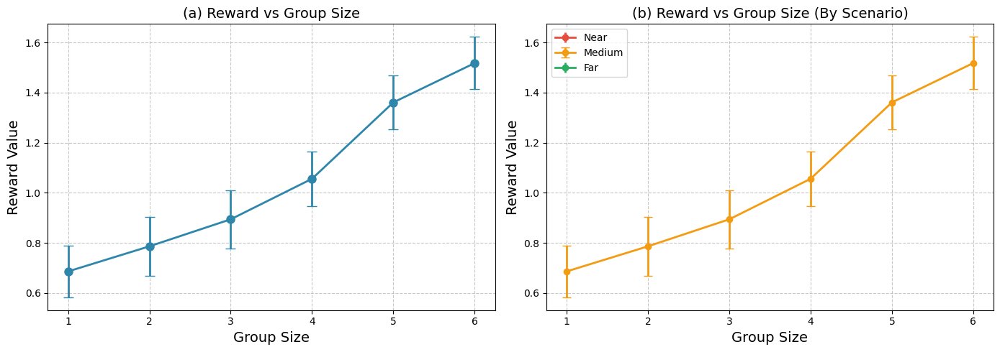

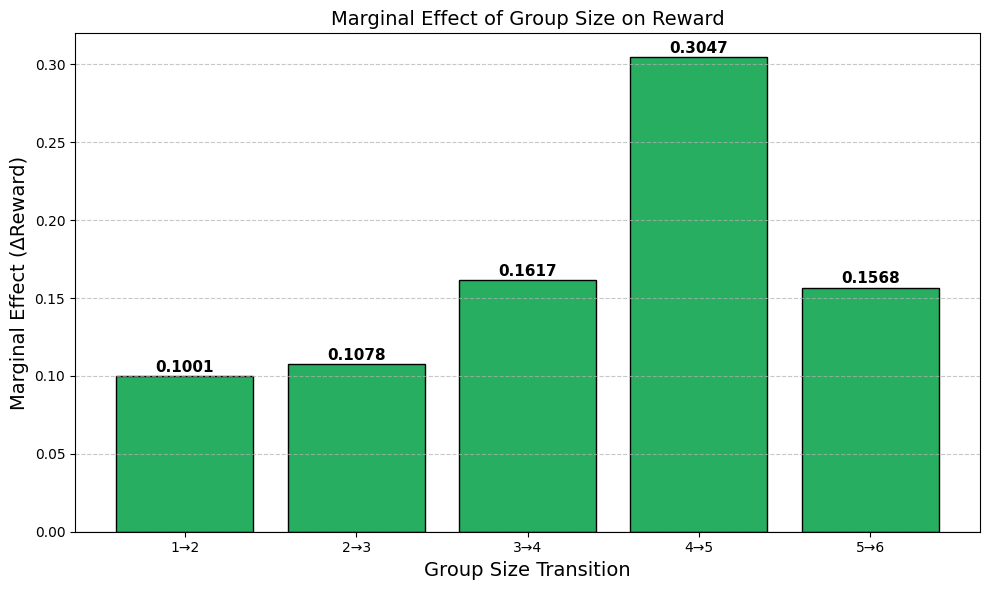

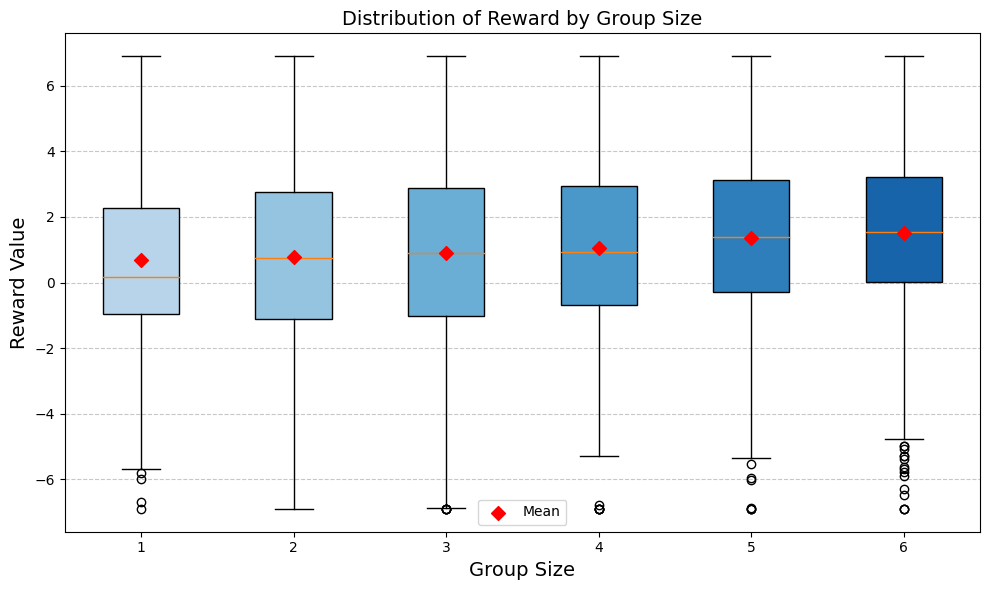

结果已保存


In [326]:
# 计算统计量
group_sizes = [1, 2, 3, 4, 5, 6]
overall_stats = results_df.groupby('group_size')['reward'].agg(['mean', 'std', 'count']).reset_index()
overall_stats['ci'] = 1.96 * overall_stats['std'] / np.sqrt(overall_stats['count'])

# 计算边际效应
marginal_effects = np.diff(overall_stats['mean'].values)
transitions = [f'{group_sizes[i]}→{group_sizes[i+1]}' for i in range(len(group_sizes)-1)]

# 打印结果
print("\n各群体规模的奖励统计:")
print(overall_stats)
print("\n边际效应:")
for t, m in zip(transitions, marginal_effects):
    print(f"  {t}: ΔReward = {m:+.4f}")

# t检验
print("\n统计显著性检验:")
for i in range(len(group_sizes) - 1):
    g1 = results_df[results_df['group_size'] == group_sizes[i]]['reward']
    g2 = results_df[results_df['group_size'] == group_sizes[i+1]]['reward']
    t_stat, p_val = stats.ttest_ind(g1, g2)
    sig = "***" if p_val < 0.001 else "**" if p_val < 0.01 else "*" if p_val < 0.05 else ""
    print(f"  {transitions[i]}: t={t_stat:.3f}, p={p_val:.4f} {sig}")


# %%
# =============================================
# 4. 绘制图表
# =============================================

# 图1: 奖励值 vs 群体规模
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

ax1 = axes[0]
ax1.errorbar(overall_stats['group_size'], overall_stats['mean'], 
             yerr=overall_stats['ci'], fmt='o-', capsize=5, linewidth=2, 
             markersize=8, color='#2E86AB')
ax1.set_xlabel('Group Size', fontsize=14)
ax1.set_ylabel('Reward Value', fontsize=14)
ax1.set_title('(a) Reward vs Group Size', fontsize=14)
ax1.set_xticks(group_sizes)
ax1.grid(True, linestyle='--', alpha=0.7)

# 按场景分类
ax2 = axes[1]
colors = {'near': '#E74C3C', 'medium': '#F39C12', 'far': '#27AE60'}
for scenario in ['near', 'medium', 'far']:
    sc_data = results_df[results_df['scenario'] == scenario]
    sc_stats = sc_data.groupby('group_size')['reward'].agg(['mean', 'std', 'count']).reset_index()
    ax2.errorbar(sc_stats['group_size'], sc_stats['mean'],
                 yerr=1.96*sc_stats['std']/np.sqrt(sc_stats['count']),
                 fmt='o-', capsize=4, linewidth=2, color=colors[scenario],
                 label=f'{scenario.capitalize()}')
ax2.set_xlabel('Group Size', fontsize=14)
ax2.set_ylabel('Reward Value', fontsize=14)
ax2.set_title('(b) Reward vs Group Size (By Scenario)', fontsize=14)
ax2.set_xticks(group_sizes)
ax2.legend()
ax2.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('figs/group_size_reward_trend.pdf', dpi=300)
plt.show()


# %%
# 图2: 边际效应柱状图
fig, ax = plt.subplots(figsize=(10, 6))
colors_bar = ['#27AE60' if v >= 0 else '#E74C3C' for v in marginal_effects]
bars = ax.bar(transitions, marginal_effects, color=colors_bar, edgecolor='black')
ax.axhline(y=0, color='black', linewidth=0.8)

for bar, val in zip(bars, marginal_effects):
    h = bar.get_height()
    ax.annotate(f'{val:.4f}', xy=(bar.get_x() + bar.get_width()/2, h),
                xytext=(0, 3 if h >= 0 else -12), textcoords="offset points",
                ha='center', fontsize=11, fontweight='bold')

ax.set_xlabel('Group Size Transition', fontsize=14)
ax.set_ylabel('Marginal Effect (ΔReward)', fontsize=14)
ax.set_title('Marginal Effect of Group Size on Reward', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.7, axis='y')

plt.tight_layout()
plt.savefig('figs/group_size_marginal_effect.pdf', dpi=300)
plt.show()


# %%
# 图3: 箱线图
fig, ax = plt.subplots(figsize=(10, 6))
box_data = [results_df[results_df['group_size'] == gs]['reward'].values for gs in group_sizes]
bp = ax.boxplot(box_data, labels=group_sizes, patch_artist=True)

colors_box = plt.cm.Blues(np.linspace(0.3, 0.8, len(group_sizes)))
for patch, color in zip(bp['boxes'], colors_box):
    patch.set_facecolor(color)

means = [results_df[results_df['group_size'] == gs]['reward'].mean() for gs in group_sizes]
ax.scatter(range(1, len(group_sizes)+1), means, color='red', marker='D', s=50, zorder=5, label='Mean')

ax.set_xlabel('Group Size', fontsize=14)
ax.set_ylabel('Reward Value', fontsize=14)
ax.set_title('Distribution of Reward by Group Size', fontsize=14)
ax.legend()
ax.grid(True, linestyle='--', alpha=0.7, axis='y')

plt.tight_layout()
plt.savefig('figs/group_size_reward_boxplot.pdf', dpi=300)
plt.show()

# %%
# 保存结果到CSV
# results_df.to_csv('group_size_marginal_effect_results.csv', index=False)
print("结果已保存")

## 单人环绕灵敏度

In [157]:
## 角度、保持距离
record = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        import numpy as np

        # 假设原行人的位置为 (gap_x, gap_y)
        original_position = (0, 0)

        # 半径
        radius = 1   # 可以根据需要调整

        # 计算五个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 22)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angles[changex]), original_position[1] + radius * np.sin(angles[changex]))]

        state_flat, all_state = env.reset()

        v_x_pedestrian = 0
        v_y_pedestrian = 0
        # a_x_pedestrian = 0
        # a_y_pedestrian = 0
        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = 0 
        position_y_pedestrian = 0
        position_x_vehicle = -gap_x * (20 - changey) / 10 
        position_y_vehicle = -gap_y * (20 - changey) / 10 

        pedestrian_num = 2
        vehicle_num = 2

        # 行人状态设置
        all_state[0][0][2:,:] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1, 0] = all_state[0][0][0, 0]
        all_state[0][0][1, 1] = all_state[0][0][0, 1]
        all_state[0][0][1, 2] = all_state[0][0][0, 2]
        all_state[0][0][1, 3] = v_x_pedestrian
        all_state[0][0][1, 4] = v_y_pedestrian
        all_state[0][0][1, 5] = a_x_pedestrian
        all_state[0][0][1, 6] = a_y_pedestrian
        all_state[0][0][1, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][2:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1, :]  = np.array(new_positions)

        ## 车辆位置设置
        all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[16:48] = 0
        state_flat[64:96] = 0
        state_flat[100:108] = 0
        state_flat[112:] = 0

        ## 行人设置
        state_flat[0:16:8] = state_flat[0]
        state_flat[1:16:8] = state_flat[1]
        state_flat[2:16:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:16:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:16:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:16:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:16:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:16:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:100] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record[changey,changex] = reward

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/511358948.py:137: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


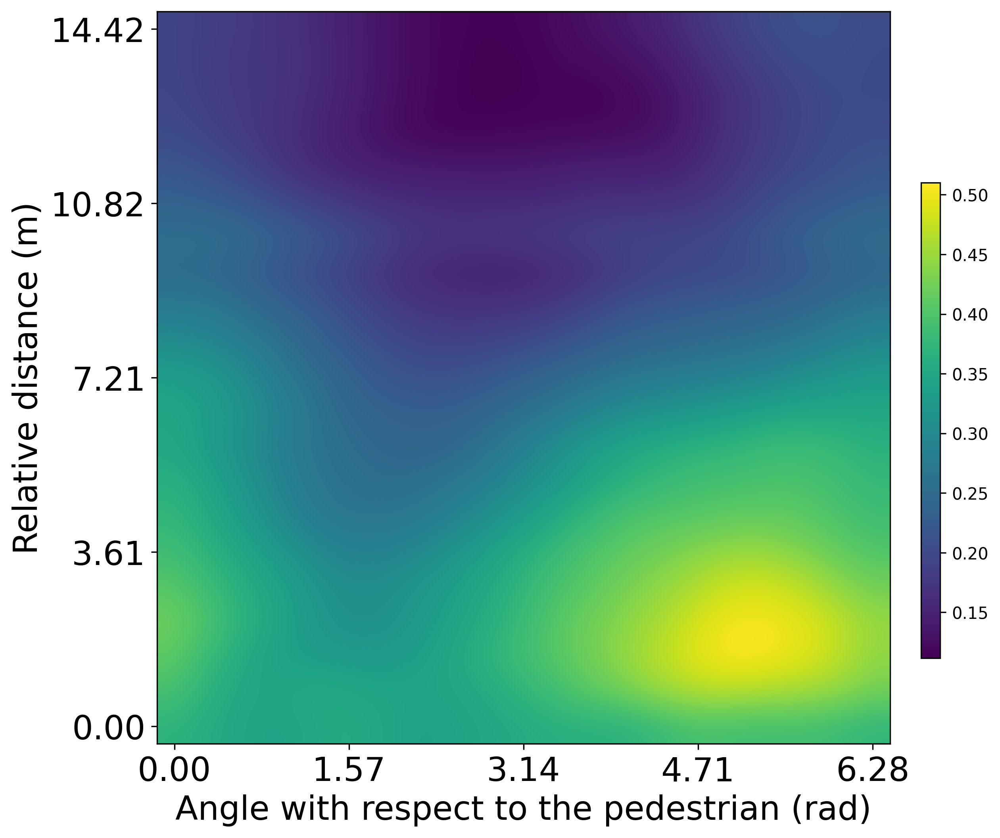

In [158]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
plt.imshow(record, cmap='viridis', interpolation='bicubic')
plt.xlabel('Angle with respect to the pedestrian (rad)',fontsize=20)
plt.ylabel('Relative distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{(i) * 2 * 3.14 / 20:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{math.sqrt(((20 - i)* gap_y)**2 + ((20 - i)* gap_x)**2) / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gap-angle-one.jpg')

plt.show()


In [159]:
## 距离、保持距离
record = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        import numpy as np

        # 假设原行人的位置为 (gap_x, gap_y)
        original_position = (0, 0)

        # 半径
        radius = 1 * (changex + 0.1) /10  # 可以根据需要调整

        # 计算五个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 22)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angles[13]), original_position[1] + radius * np.sin(angles[13]))]

        state_flat, all_state = env.reset()

        v_x_pedestrian = 0
        v_y_pedestrian = 0
        ## 初始值设置
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = 0 
        position_y_pedestrian = 0
        position_x_vehicle = -gap_x * (20 - changey) / 10 
        position_y_vehicle = -gap_y * (20 - changey) / 10 

        pedestrian_num = 2
        vehicle_num = 2

        # 行人状态设置
        all_state[0][0][2:,:] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1, 0] = all_state[0][0][0, 0]
        all_state[0][0][1, 1] = all_state[0][0][0, 1]
        all_state[0][0][1, 2] = all_state[0][0][0, 2]
        all_state[0][0][1, 3] = v_x_pedestrian
        all_state[0][0][1, 4] = v_y_pedestrian
        all_state[0][0][1, 5] = a_x_pedestrian
        all_state[0][0][1, 6] = a_y_pedestrian
        all_state[0][0][1, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][2:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1, :]  = np.array(new_positions)

        ## 车辆位置设置
        all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[16:48] = 0
        state_flat[64:96] = 0
        state_flat[100:108] = 0
        state_flat[112:] = 0

        ## 行人设置
        state_flat[0:16:8] = state_flat[0]
        state_flat[1:16:8] = state_flat[1]
        state_flat[2:16:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:16:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:16:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:16:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:16:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:16:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:100] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record[changey,changex] = reward

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/4178836098.py:135: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


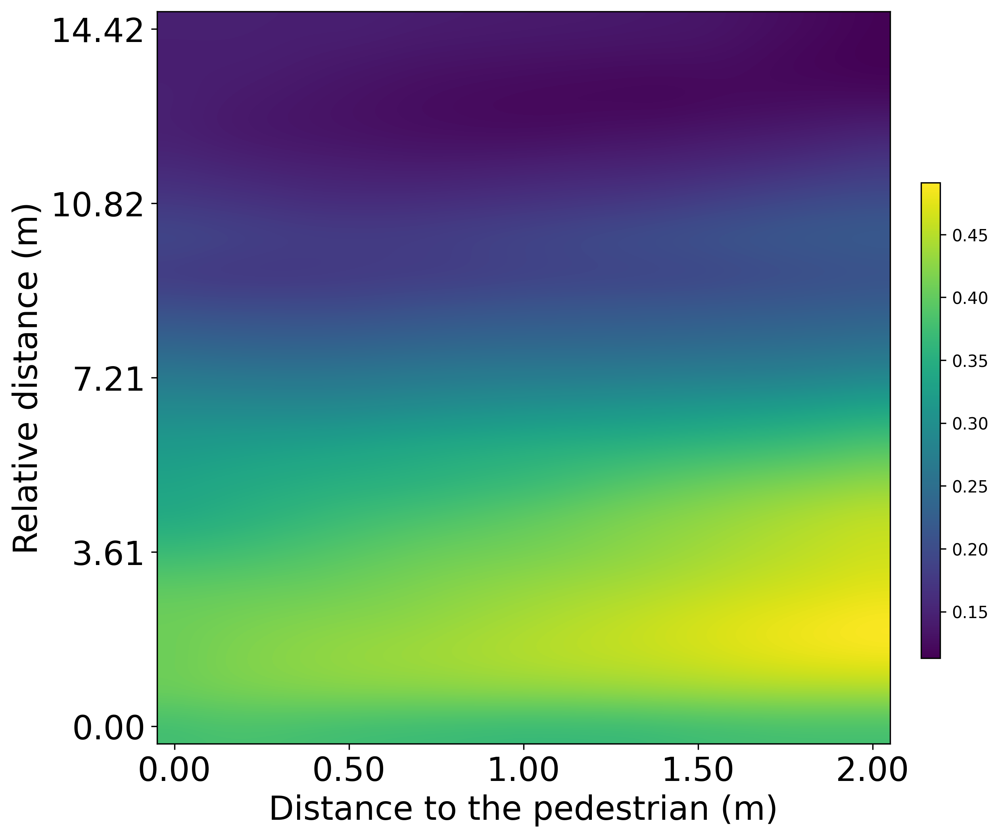

In [160]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
plt.imshow(record, cmap='viridis', interpolation='bicubic')
plt.xlabel('Distance to the pedestrian (m)',fontsize=20)
plt.ylabel('Relative distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{(i) * 1 / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{math.sqrt(((20 - i)* gap_y)**2 + ((20 - i)* gap_x)**2) / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gap-distance-one.jpg')

plt.show()


## 四等环绕灵敏度

In [161]:
## 横向速度、横向距离
record = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        import numpy as np

        # 假设原行人的位置为 (gap_x, gap_y)
        original_position = (0, 0)

        # 半径
        radius = 1 * (changex + 0.1) / 10  # 可以根据需要调整

        # 计算四个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 5)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]

        state_flat, all_state = env.reset()

        ## 初始值设置
        v_x_pedestrian = 0
        v_y_pedestrian = 0
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = 0
        position_y_pedestrian = 0
        position_x_vehicle = -gap_x * (20 - changey) / 10
        position_y_vehicle = -gap_y * (20 - changey) / 10 

        pedestrian_num = 5
        vehicle_num = 6

        # 行人状态设置
        all_state[0][0][5:, :] = 0
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1:5, 0] = all_state[0][0][0, 0]
        all_state[0][0][1:5, 1] = all_state[0][0][0, 1]
        all_state[0][0][1:5, 2] = all_state[0][0][0, 2]
        all_state[0][0][1:5, 3] = v_x_pedestrian
        all_state[0][0][1:5, 4] = v_y_pedestrian
        all_state[0][0][1:5, 5] = a_x_pedestrian
        all_state[0][0][1:5, 6] = a_y_pedestrian
        all_state[0][0][1:5, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        all_state[0][2][5:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1:5, :]  = np.array(new_positions)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        state_flat[40:48] = 0
        # state_flat[64:96] = 0
        state_flat[106:108] = 0
        # state_flat[112:] = 0

        ## 行人设置
        state_flat[0:40:8] = state_flat[0]
        state_flat[1:40:8] = state_flat[1]
        state_flat[2:40:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:40:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:40:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:40:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:40:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:40:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:106] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record[changey,changex] = reward

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/163698902.py:135: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


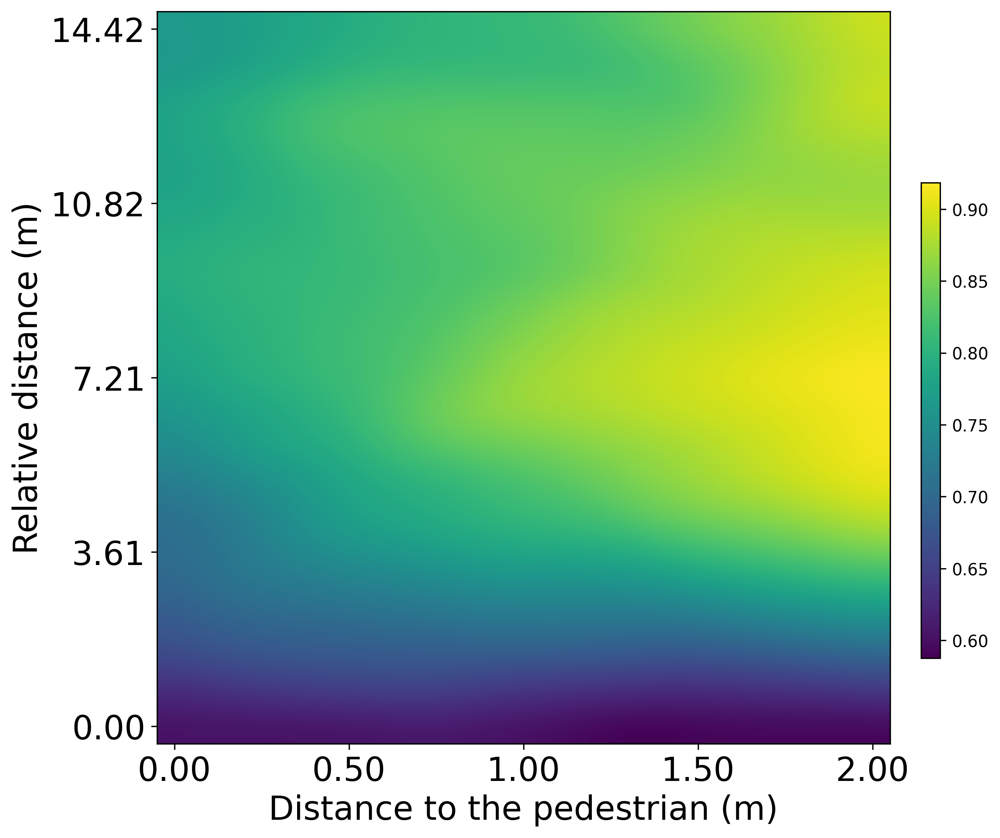

In [162]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
plt.imshow(record, cmap='viridis', interpolation='bicubic')
plt.xlabel('Distance to the pedestrian (m)',fontsize=20)
plt.ylabel('Relative distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{(i) * 1 / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{math.sqrt(((20 - i)* gap_y)**2 + ((20 - i)* gap_x)**2) / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gap-distance-four.jpg')

plt.show()


## 五等环绕灵敏度

In [163]:
## 横向速度、横向距离
record = np.zeros((21,21))
for changey in range(0,21):
    for changex in range(0,21):
        import numpy as np

        # 假设原行人的位置为 (gap_x, gap_y)
        original_position = (0, 0)

        # 半径
        radius = 1 * (changex + 0.1) / 10  # 可以根据需要调整

        # 计算五个新行人的位置
        angles = np.linspace(0, 2 * np.pi, 6)[:-1]  # 0 到 2π 之间的五个等分角度
        new_positions = [(original_position[0] + radius * np.cos(angle), original_position[1] + radius * np.sin(angle)) for angle in angles]

        state_flat, all_state = env.reset()

        ## 初始值设置
        v_x_pedestrian = 0
        v_y_pedestrian = 0
        # a_x_pedestrian = 0
        # a_y_pedestrian = 0
        speed_x_pedestrian = v_x_pedestrian
        speed_y_pedestrian = v_y_pedestrian
        speed_x_vehicle = v_x_vehicle
        speed_y_vehicle = v_y_vehicle

        position_x_pedestrian = 0
        position_y_pedestrian = 0
        position_x_vehicle = -gap_x * (20 - changey) / 10
        position_y_vehicle = -gap_y * (20 - changey) / 10 

        pedestrian_num = 6
        vehicle_num = 6

        # 行人状态设置
        all_state[0][0][0, 3] = speed_x_pedestrian
        all_state[0][0][0, 4] = speed_y_pedestrian
        all_state[0][0][0, 5] = a_x_pedestrian
        all_state[0][0][0, 6] = a_y_pedestrian
        all_state[0][0][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))


        all_state[0][0][1:, 0] = all_state[0][0][0, 0]
        all_state[0][0][1:, 1] = all_state[0][0][0, 1]
        all_state[0][0][1:, 2] = all_state[0][0][0, 2]
        all_state[0][0][1:, 3] = v_x_pedestrian
        all_state[0][0][1:, 4] = v_y_pedestrian
        all_state[0][0][1:, 5] = a_x_pedestrian
        all_state[0][0][1:, 6] = a_y_pedestrian
        all_state[0][0][1:, 7] = (math.atan2(v_y_pedestrian, v_x_pedestrian))

        # 车辆状态设置
        # all_state[0][1][2:,:] = 0
        all_state[0][1][0, 3] = speed_x_pedestrian
        all_state[0][1][0, 4] = speed_y_pedestrian
        all_state[0][1][0, 5] = a_x_pedestrian
        all_state[0][1][0, 6] = a_y_pedestrian
        all_state[0][1][0, 7] = (math.atan2(speed_y_pedestrian, speed_x_pedestrian))
        all_state[0][1][1, 3] = speed_x_vehicle
        all_state[0][1][1, 4] = speed_y_vehicle
        all_state[0][1][1, 5] = a_x_vehicle
        all_state[0][1][1, 6] = a_y_vehicle
        all_state[0][1][1, 7] = math.atan2(speed_y_vehicle, speed_x_vehicle)

        ## 行人位置设置
        # all_state[0][2][1:,:] = 0
        all_state[0][2][0, 0] = position_x_pedestrian
        all_state[0][2][0, 1] = position_y_pedestrian
        all_state[0][2][1:, :]  = np.array(new_positions)

        ## 车辆位置设置
        # all_state[0][3][2:,:] = 0
        all_state[0][3][0, 0] = position_x_pedestrian
        all_state[0][3][0, 1] = position_y_pedestrian
        all_state[0][3][1,0] = position_x_vehicle
        all_state[0][3][1,1] = position_y_vehicle

        ## 行人数量设置
        all_state[0][4] = pedestrian_num

        ## 车辆数量设置
        all_state[0][5] = vehicle_num

        ##清空
        # state_flat[8:48] = 0
        # state_flat[64:96] = 0
        # state_flat[98:108] = 0
        # state_flat[112:] = 0

        ## 行人设置
        state_flat[0:48:8] = state_flat[0]
        state_flat[1:48:8] = state_flat[1]
        state_flat[2:48:8] = state_flat[2]
        state_flat[3],state_flat[51] = [speed_x_pedestrian]*2 #x速度
        state_flat[11:48:8] = v_x_pedestrian
        state_flat[4],state_flat[52] = [(speed_y_pedestrian)]*2 #y速度
        state_flat[12:48:8] = v_y_pedestrian
        state_flat[5],state_flat[53]= [(a_x_pedestrian)]*2 #x加速度
        state_flat[5:48:8] = a_x_pedestrian
        state_flat[6],state_flat[54]= [(a_y_pedestrian)]*2 #y加速度
        state_flat[6:48:8] = a_y_pedestrian
        state_flat[7],state_flat[55]= [(math.atan2(state_flat[4], state_flat[3]))]*2 #朝向
        state_flat[7:48:8] = math.atan2(v_y_pedestrian, v_x_pedestrian)

        ## 行人位置设置
        state_flat[96]=position_x_pedestrian #x位置
        state_flat[97]=position_y_pedestrian   #y位置
        state_flat[98:108] = np.array(new_positions).flatten()


        state_flat[108]=position_x_pedestrian #x位置
        state_flat[109]=position_y_pedestrian   #y位置

        ## 车辆设置
        state_flat[59]=speed_x_vehicle #x速度
        state_flat[60]=speed_y_vehicle  #y速度
        state_flat[61]=a_x_vehicle  #x加速度
        state_flat[62]=a_y_vehicle  #y加速度
        state_flat[63]=math.atan2(state_flat[60], state_flat[59])  #朝向

        ## 车辆位置设置
        state_flat[110]=position_x_vehicle #x位置
        state_flat[111]=position_y_vehicle   #y位置

        ##奖励值获取
        keep = True
        torch.manual_seed(0)
        # while keep:
        action, log_prob = agent.get_action(torch.from_numpy(state_flat).float().to(device))
            # if (action[0][0] > 0).cpu().detach().numpy() & (action[0][1] < 0).cpu().detach().numpy():
            #     keep = False
        # action = agent.get_action(torch.from_numpy(state_flat).float().to(device))

        action = torch.tensor(action).cpu().detach().numpy()[0]
        log_prob = log_prob.to(device)
        ##状态更新
        next_state_flat = update(action,state_flat)
        done = False
        reward = discriminator.get_reward( \
                    log_prob,
                    all_state,
                    torch.tensor(state_flat).unsqueeze(0).float().to(device),action,\
                    torch.tensor(next_state_flat).unsqueeze(0).float().to(device),\
                                            torch.tensor(done).unsqueeze(0)\
                                            ).item()
        record[changey,changex] = reward

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)
/tmp/ipykernel_579184/2804478873.py:136: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  action = torch.tensor(action).cpu().detach().numpy()[0]


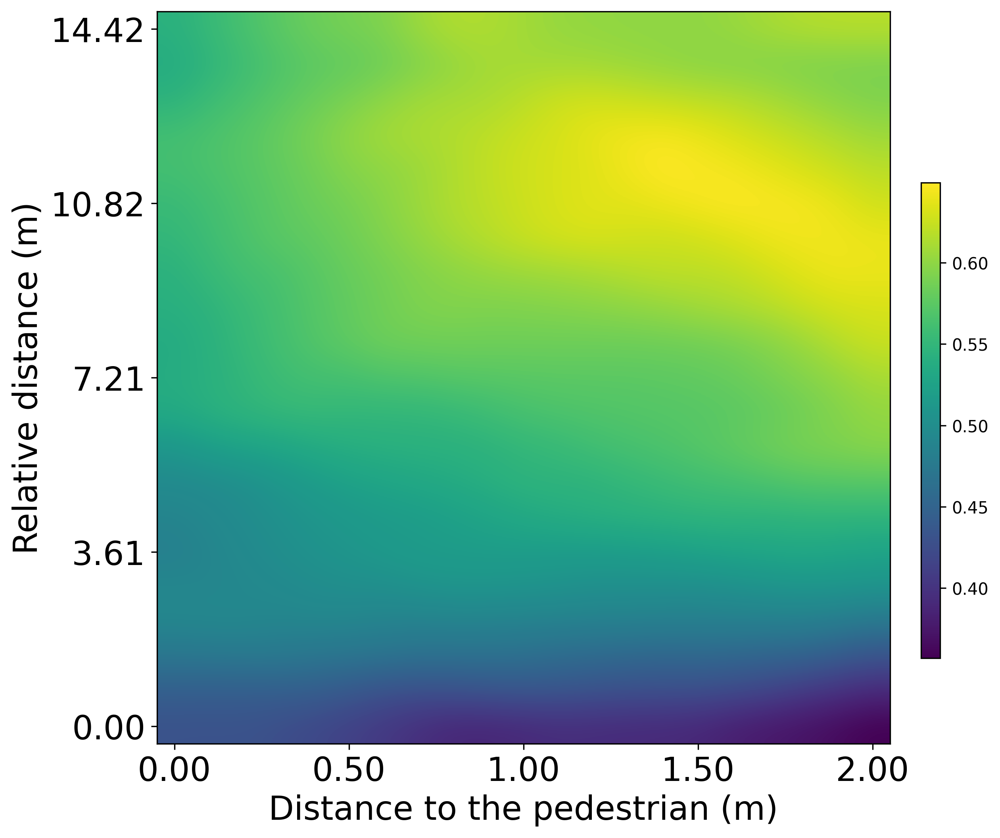

In [164]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
plt.imshow(record, cmap='viridis', interpolation='bicubic')
plt.xlabel('Distance to the pedestrian (m)',fontsize=20)
plt.ylabel('Relative distance (m)',fontsize=20)
plt.xticks(np.arange(0,21,5),[f"{(i) * 1 / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
plt.yticks(np.arange(0,21,5),[f"{math.sqrt(((20 - i)* gap_y)**2 + ((20 - i)* gap_x)**2) / 10:.2f}" for i in np.arange(0,21,5)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/gap-distance-five.jpg')

plt.show()


# 参与者关系图构建

## 关键行人的动作

实验一：关键行人行为与群体动态匹配分析
开始分析所有 722 个场景的关键行人与群体动态匹配度...


分析行为匹配: 100%|██████████| 722/722 [01:13<00:00,  9.85it/s]



【实验一结果】关键行人行为与群体动态匹配分析
有效统计场景数: 708 / 722

──────────────────────────────────────────────────────────────────────
1. 速度相关性分析 (Speed Correlation)
──────────────────────────────────────────────────────────────────────
   平均相关系数: -0.0494
   中位数相关系数: -0.0567
   正相关场景比例 (r > 0): 44.77%
   强正相关场景比例 (r > 0.5): 9.75%

──────────────────────────────────────────────────────────────────────
2. 方向一致性分析 (Direction Similarity - Cosine)
──────────────────────────────────────────────────────────────────────
   平均余弦相似度: 0.2192
   中位数余弦相似度: 0.2177
   高相似度场景比例 (cos > 0.7): 20.20%

──────────────────────────────────────────────────────────────────────
3. 加速度同步性分析 (Acceleration Synchronization)
──────────────────────────────────────────────────────────────────────
   平均相关系数: -0.1253
   中位数相关系数: -0.1410
   正相关场景比例: 38.28%

──────────────────────────────────────────────────────────────────────
统计显著性检验 (单样本 t 检验, H0: mean = 0)
──────────────────────────────────────────────────────────────────────
   速度相关性: t

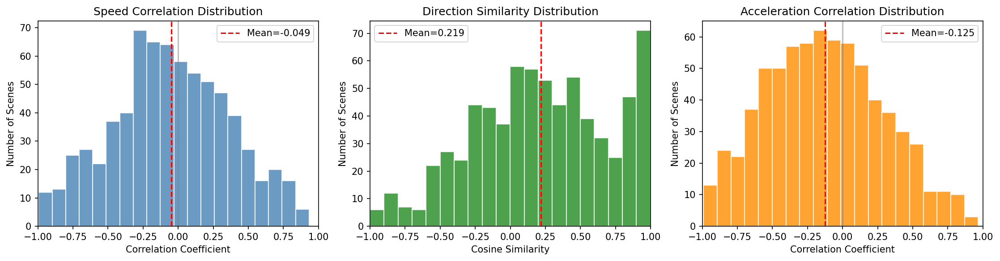

In [23]:
import numpy as np
import torch
from tqdm import tqdm
import matplotlib.pyplot as plt
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

print("=" * 70)
print("实验一：关键行人行为与群体动态匹配分析")
print("=" * 70)

# 初始化存储变量
scene_speed_correlations = []      # 速度相关系数
scene_direction_similarities = []   # 方向相似度（余弦）
scene_accel_correlations = []       # 加速度相关系数

valid_scene_count = 0
num_scenes = len(envTest.env_state_pedestrain)

print(f"开始分析所有 {num_scenes} 个场景的关键行人与群体动态匹配度...")

# 循环遍历所有场景
for scene_id in tqdm(range(num_scenes), desc="分析行为匹配"):
    scene_states_all = envTest.env_state_pedestrain[scene_id]
    scene_pos_all = envTest.env_position_pedestrain[scene_id]
    scene_nums_all = envTest.env_num_pedestrian[scene_id]

    valid_steps = len(scene_states_all)

    # 初始化该场景的时间序列数据
    key_ped_vx_seq = []
    key_ped_vy_seq = []
    key_ped_speed_seq = []
    group_avg_vx_seq = []
    group_avg_vy_seq = []
    group_avg_speed_seq = []

    scene_valid = False

    # 逐时间步遍历
    for t in range(valid_steps):
        raw_state = scene_states_all[t]
        raw_pos = scene_pos_all[t]
        raw_num = scene_nums_all[t]

        current_total_ped = int(raw_num) if np.isscalar(raw_num) else int(raw_num.item())

        if current_total_ped < 2:
            continue

        scene_valid = True

        # 构造 GCN 输入
        state_tensor = torch.from_numpy(raw_state).float().to(device)
        pos_tensor = torch.from_numpy(raw_pos).float().to(device)
        num_tensor = torch.tensor(raw_num)

        if state_tensor.dim() == 2: state_tensor = state_tensor.unsqueeze(0)
        if pos_tensor.dim() == 2: pos_tensor = pos_tensor.unsqueeze(0)
        if num_tensor.dim() == 0: num_tensor = num_tensor.unsqueeze(0)

        batch_data = (state_tensor, pos_tensor, num_tensor)

        # 动态识别当前步的关键行人
        with torch.no_grad():
            pedestrian_graph = discriminator.g_p.get_relation_graph(batch_data, type='pedestrian')

        if pedestrian_graph.dim() == 4:
            graph_data = pedestrian_graph[0]
        else:
            graph_data = pedestrian_graph

        current_key_id = (graph_data.sum(dim=0).sum(dim=0)).argmax().item()

        if current_key_id >= current_total_ped:
            current_key_id = 0

        # 提取速度数据
        peds_data = raw_state[0] if raw_state.ndim == 3 else raw_state

        # 关键行人速度向量
        k_vx = peds_data[current_key_id][3]
        k_vy = peds_data[current_key_id][4]
        k_speed = np.sqrt(k_vx**2 + k_vy**2)

        # 群体平均速度向量（排除关键行人）
        other_indices = [i for i in range(current_total_ped) if i != current_key_id]

        if other_indices:
            g_vx = np.mean(peds_data[other_indices, 3])
            g_vy = np.mean(peds_data[other_indices, 4])
            g_speed = np.sqrt(g_vx**2 + g_vy**2)
        else:
            g_vx, g_vy, g_speed = 0.0, 0.0, 0.0

        key_ped_vx_seq.append(k_vx)
        key_ped_vy_seq.append(k_vy)
        key_ped_speed_seq.append(k_speed)
        group_avg_vx_seq.append(g_vx)
        group_avg_vy_seq.append(g_vy)
        group_avg_speed_seq.append(g_speed)

    # 计算该场景的匹配指标
    if scene_valid and len(key_ped_speed_seq) > 5:
        key_ped_vx_arr = np.array(key_ped_vx_seq)
        key_ped_vy_arr = np.array(key_ped_vy_seq)
        key_ped_speed_arr = np.array(key_ped_speed_seq)
        group_avg_vx_arr = np.array(group_avg_vx_seq)
        group_avg_vy_arr = np.array(group_avg_vy_seq)
        group_avg_speed_arr = np.array(group_avg_speed_seq)

        # 1. 速度相关性
        if np.std(key_ped_speed_arr) > 1e-6 and np.std(group_avg_speed_arr) > 1e-6:
            speed_corr = np.corrcoef(key_ped_speed_arr, group_avg_speed_arr)[0, 1]
            if not np.isnan(speed_corr):
                scene_speed_correlations.append(speed_corr)

        # 2. 方向一致性（余弦相似度）
        direction_similarities = []
        for t_idx in range(len(key_ped_vx_arr)):
            k_vec = np.array([key_ped_vx_arr[t_idx], key_ped_vy_arr[t_idx]])
            g_vec = np.array([group_avg_vx_arr[t_idx], group_avg_vy_arr[t_idx]])
            k_norm = np.linalg.norm(k_vec)
            g_norm = np.linalg.norm(g_vec)
            if k_norm > 1e-6 and g_norm > 1e-6:
                cos_sim = np.dot(k_vec, g_vec) / (k_norm * g_norm)
                direction_similarities.append(cos_sim)

        if direction_similarities:
            avg_direction_sim = np.mean(direction_similarities)
            scene_direction_similarities.append(avg_direction_sim)

        # 3. 加速度同步性
        if len(key_ped_speed_arr) > 3:
            key_accel = np.diff(key_ped_speed_arr)
            group_accel = np.diff(group_avg_speed_arr)
            if np.std(key_accel) > 1e-6 and np.std(group_accel) > 1e-6:
                accel_corr = np.corrcoef(key_accel, group_accel)[0, 1]
                if not np.isnan(accel_corr):
                    scene_accel_correlations.append(accel_corr)

        valid_scene_count += 1

# 结果统计
if valid_scene_count > 0:
    speed_corr_arr = np.array(scene_speed_correlations)
    dir_sim_arr = np.array(scene_direction_similarities)
    accel_corr_arr = np.array(scene_accel_correlations)

    print("\n" + "=" * 70)
    print("【实验一结果】关键行人行为与群体动态匹配分析")
    print("=" * 70)
    print(f"有效统计场景数: {valid_scene_count} / {num_scenes}")

    print()
    print("─" * 70)
    print("1. 速度相关性分析 (Speed Correlation)")
    print("─" * 70)
    print(f"   平均相关系数: {np.mean(speed_corr_arr):.4f}")
    print(f"   中位数相关系数: {np.median(speed_corr_arr):.4f}")
    print(f"   正相关场景比例 (r > 0): {np.sum(speed_corr_arr > 0) / len(speed_corr_arr) * 100:.2f}%")
    print(f"   强正相关场景比例 (r > 0.5): {np.sum(speed_corr_arr > 0.5) / len(speed_corr_arr) * 100:.2f}%")

    print()
    print("─" * 70)
    print("2. 方向一致性分析 (Direction Similarity - Cosine)")
    print("─" * 70)
    print(f"   平均余弦相似度: {np.mean(dir_sim_arr):.4f}")
    print(f"   中位数余弦相似度: {np.median(dir_sim_arr):.4f}")
    print(f"   高相似度场景比例 (cos > 0.7): {np.sum(dir_sim_arr > 0.7) / len(dir_sim_arr) * 100:.2f}%")

    print()
    print("─" * 70)
    print("3. 加速度同步性分析 (Acceleration Synchronization)")
    print("─" * 70)
    print(f"   平均相关系数: {np.mean(accel_corr_arr):.4f}")
    print(f"   中位数相关系数: {np.median(accel_corr_arr):.4f}")
    print(f"   正相关场景比例: {np.sum(accel_corr_arr > 0) / len(accel_corr_arr) * 100:.2f}%")

    # 统计显著性检验
    print("\n" + "─" * 70)
    print("统计显著性检验 (单样本 t 检验, H0: mean = 0)")
    print("─" * 70)

    t_speed, p_speed = stats.ttest_1samp(speed_corr_arr, 0)
    sig_speed = "***" if p_speed < 0.001 else "**" if p_speed < 0.01 else "*" if p_speed < 0.05 else ""
    print(f"   速度相关性: t={t_speed:.3f}, p={p_speed:.4e} {sig_speed}")

    t_dir, p_dir = stats.ttest_1samp(dir_sim_arr, 0)
    sig_dir = "***" if p_dir < 0.001 else "**" if p_dir < 0.01 else "*" if p_dir < 0.05 else ""
    print(f"   方向一致性: t={t_dir:.3f}, p={p_dir:.4e} {sig_dir}")

    t_accel, p_accel = stats.ttest_1samp(accel_corr_arr, 0)
    sig_accel = "***" if p_accel < 0.001 else "**" if p_accel < 0.01 else "*" if p_accel < 0.05 else ""
    print(f"   加速度同步: t={t_accel:.3f}, p={p_accel:.4e} {sig_accel}")

    print("\n   * p<0.05, ** p<0.01, *** p<0.001")

    # 可视化
    fig, axes = plt.subplots(1, 3, figsize=(15, 4), dpi=150)

    # 速度相关性分布
    axes[0].hist(speed_corr_arr, bins=20, color='steelblue', edgecolor='white', alpha=0.8)
    axes[0].axvline(x=np.mean(speed_corr_arr), color='red', linestyle='--',
                  label=f'Mean={np.mean(speed_corr_arr):.3f}')
    axes[0].axvline(x=0, color='gray', linestyle='-', alpha=0.5)
    axes[0].set_xlabel('Correlation Coefficient')
    axes[0].set_ylabel('Number of Scenes')
    axes[0].set_title('Speed Correlation Distribution')
    axes[0].legend()
    axes[0].set_xlim(-1, 1)

    # 方向相似度分布
    axes[1].hist(dir_sim_arr, bins=20, color='forestgreen', edgecolor='white', alpha=0.8)
    axes[1].axvline(x=np.mean(dir_sim_arr), color='red', linestyle='--',
                  label=f'Mean={np.mean(dir_sim_arr):.3f}')
    axes[1].set_xlabel('Cosine Similarity')
    axes[1].set_ylabel('Number of Scenes')
    axes[1].set_title('Direction Similarity Distribution')
    axes[1].legend()
    axes[1].set_xlim(-1, 1)

    # 加速度相关性分布
    axes[2].hist(accel_corr_arr, bins=20, color='darkorange', edgecolor='white', alpha=0.8)
    axes[2].axvline(x=np.mean(accel_corr_arr), color='red', linestyle='--',
                  label=f'Mean={np.mean(accel_corr_arr):.3f}')
    axes[2].axvline(x=0, color='gray', linestyle='-', alpha=0.5)
    axes[2].set_xlabel('Correlation Coefficient')
    axes[2].set_ylabel('Number of Scenes')
    axes[2].set_title('Acceleration Correlation Distribution')
    axes[2].legend()
    axes[2].set_xlim(-1, 1)

    plt.tight_layout()
    plt.savefig('figs/exp1_behavior_matching.png', dpi=300, bbox_inches='tight')
    plt.show()

# 存储实验一的结果供后续使用
exp1_results = {
    'speed_correlation': speed_corr_arr if valid_scene_count > 0 else None,
    'direction_similarity': dir_sim_arr if valid_scene_count > 0 else None,
    'acceleration_correlation': accel_corr_arr if valid_scene_count > 0 else None
}


实验二：关键行人行为改变后群体响应分析
开始分析所有 722 个场景的行为响应滞后效应...


分析滞后效应: 100%|██████████| 722/722 [00:56<00:00, 12.85it/s]



【实验二结果】关键行人行为改变后群体响应分析
有效统计场景数: 437

──────────────────────────────────────────────────────────────────────
1. 交叉相关分析 (Cross-Correlation Analysis)
──────────────────────────────────────────────────────────────────────
   最优滞后均值: -0.28 步
   最优滞后中位数: 0.00 步
   正滞后比例 (关键行人领先): 47.37%
   最大相关系数均值: 0.5421

──────────────────────────────────────────────────────────────────────
2. 领导-跟随效应分析 (Lead-Follow Effect)
──────────────────────────────────────────────────────────────────────
   领导跟随得分均值: 0.0031
   领导跟随得分中位数: -0.0036
   正得分比例 (表明关键行人具有领导效应): 48.74%

──────────────────────────────────────────────────────────────────────
统计显著性检验
──────────────────────────────────────────────────────────────────────
   最优滞后 vs 0: t=-0.879, p=3.7983e-01 
   领导跟随得分 vs 0: t=0.215, p=8.2949e-01 

   * p<0.05, ** p<0.01, *** p<0.001


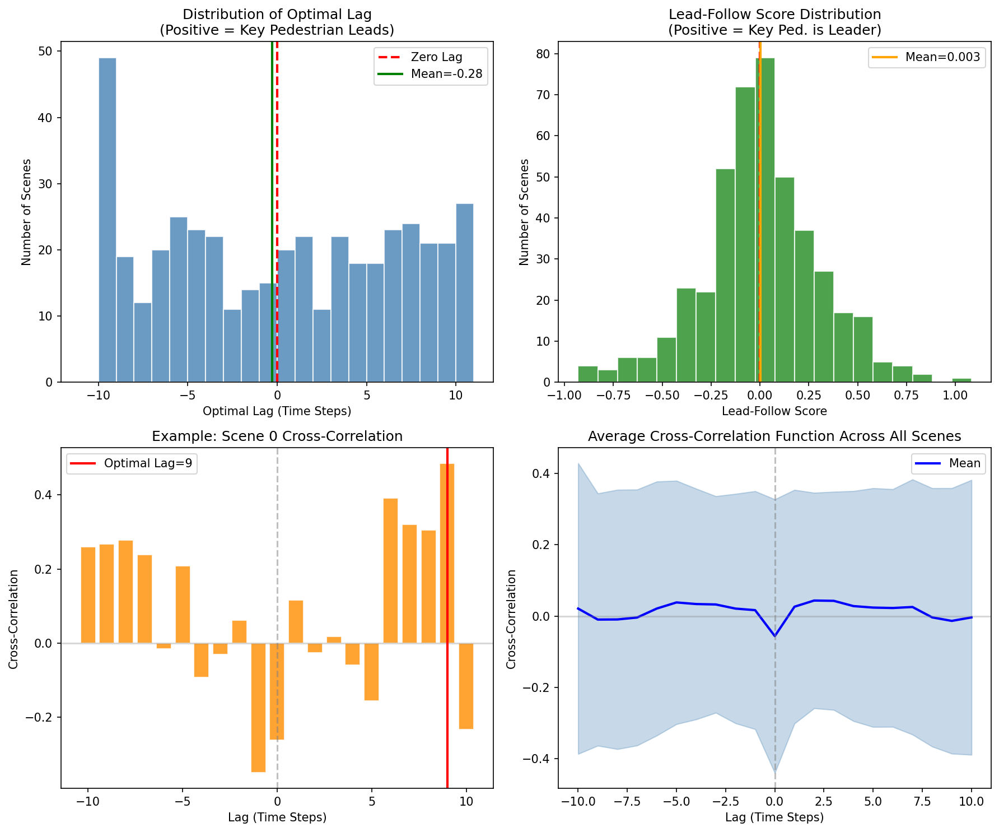

In [24]:
print("\n" + "=" * 70)
print("实验二：关键行人行为改变后群体响应分析")
print("=" * 70)

max_lag = 10  # 分析的最大滞后时间步数

# 初始化存储变量
optimal_lags = []           # 最优滞后步数
max_correlations = []       # 最大相关系数
lead_follow_scores = []     # 领导跟随得分
scene_details = []          # 详细的场景分析结果

num_scenes = len(envTest.env_state_pedestrain)
valid_scene_count = 0

print(f"开始分析所有 {num_scenes} 个场景的行为响应滞后效应...")

# 循环遍历所有场景
for scene_id in tqdm(range(num_scenes), desc="分析滞后效应"):
    scene_states_all = envTest.env_state_pedestrain[scene_id]
    scene_pos_all = envTest.env_position_pedestrain[scene_id]
    scene_nums_all = envTest.env_num_pedestrian[scene_id]

    valid_steps = len(scene_states_all)

    if valid_steps < max_lag + 5:
        continue

    # 收集时间序列
    key_ped_speed_seq = []
    group_avg_speed_seq = []
    scene_valid = False

    for t in range(valid_steps):
        raw_state = scene_states_all[t]
        raw_pos = scene_pos_all[t]
        raw_num = scene_nums_all[t]

        current_total_ped = int(raw_num) if np.isscalar(raw_num) else int(raw_num.item())

        if current_total_ped < 2:
            continue

        scene_valid = True

        # 动态识别关键行人
        state_tensor = torch.from_numpy(raw_state).float().to(device)
        pos_tensor = torch.from_numpy(raw_pos).float().to(device)
        num_tensor = torch.tensor(raw_num)

        if state_tensor.dim() == 2: state_tensor = state_tensor.unsqueeze(0)
        if pos_tensor.dim() == 2: pos_tensor = pos_tensor.unsqueeze(0)
        if num_tensor.dim() == 0: num_tensor = num_tensor.unsqueeze(0)

        batch_data = (state_tensor, pos_tensor, num_tensor)

        with torch.no_grad():
            pedestrian_graph = discriminator.g_p.get_relation_graph(batch_data, type='pedestrian')

        if pedestrian_graph.dim() == 4:
            graph_data = pedestrian_graph[0]
        else:
            graph_data = pedestrian_graph

        current_key_id = (graph_data.sum(dim=0).sum(dim=0)).argmax().item()
        if current_key_id >= current_total_ped:
            current_key_id = 0

        peds_data = raw_state[0] if raw_state.ndim == 3 else raw_state

        k_vx = peds_data[current_key_id][3]
        k_vy = peds_data[current_key_id][4]
        k_speed = np.sqrt(k_vx**2 + k_vy**2)

        other_indices = [i for i in range(current_total_ped) if i != current_key_id]
        if other_indices:
            g_vx = np.mean(peds_data[other_indices, 3])
            g_vy = np.mean(peds_data[other_indices, 4])
            g_speed = np.sqrt(g_vx**2 + g_vy**2)
        else:
            g_speed = 0.0

        key_ped_speed_seq.append(k_speed)
        group_avg_speed_seq.append(g_speed)

    # 交叉相关分析
    if scene_valid and len(key_ped_speed_seq) > max_lag + 3:
        key_arr = np.array(key_ped_speed_seq)
        group_arr = np.array(group_avg_speed_seq)

        # 去均值和标准化
        if np.std(key_arr) < 1e-6 or np.std(group_arr) < 1e-6:
            continue

        key_norm = (key_arr - np.mean(key_arr)) / np.std(key_arr)
        group_norm = (group_arr - np.mean(group_arr)) / np.std(group_arr)

        # 计算交叉相关
        cross_corr = []
        lags = range(-max_lag, max_lag + 1)

        for lag in lags:
            if lag < 0:
                # 群体领先
                corr = np.corrcoef(key_norm[-lag:], group_norm[:lag])[0, 1]
            elif lag > 0:
                # 关键行人领先
                corr = np.corrcoef(key_norm[:-lag], group_norm[lag:])[0, 1]
            else:
                corr = np.corrcoef(key_norm, group_norm)[0, 1]

            if not np.isnan(corr):
                cross_corr.append(corr)
            else:
                cross_corr.append(0)

        cross_corr = np.array(cross_corr)
        lags = np.array(list(lags))

        # 找到最大相关对应的滞后
        max_idx = np.argmax(cross_corr)
        optimal_lag = lags[max_idx]
        max_corr = cross_corr[max_idx]

        # 计算领导-跟随得分
        positive_lag_corr = np.mean(cross_corr[lags > 0])
        negative_lag_corr = np.mean(cross_corr[lags < 0])
        lead_follow_score = positive_lag_corr - negative_lag_corr

        optimal_lags.append(optimal_lag)
        max_correlations.append(max_corr)
        lead_follow_scores.append(lead_follow_score)

        scene_details.append({
            'scene_id': scene_id,
            'optimal_lag': optimal_lag,
            'max_correlation': max_corr,
            'lead_follow_score': lead_follow_score,
            'cross_corr': cross_corr,
            'lags': lags
        })

        valid_scene_count += 1

# 结果统计
if valid_scene_count > 0:
    optimal_lags_arr = np.array(optimal_lags)
    max_corr_arr = np.array(max_correlations)
    lead_follow_arr = np.array(lead_follow_scores)

    print("\n" + "=" * 70)
    print("【实验二结果】关键行人行为改变后群体响应分析")
    print("=" * 70)
    print(f"有效统计场景数: {valid_scene_count}")

    print()
    print("─" * 70)
    print("1. 交叉相关分析 (Cross-Correlation Analysis)")
    print("─" * 70)
    print(f"   最优滞后均值: {np.mean(optimal_lags_arr):.2f} 步")
    print(f"   最优滞后中位数: {np.median(optimal_lags_arr):.2f} 步")
    print(f"   正滞后比例 (关键行人领先): {np.sum(optimal_lags_arr > 0) / len(optimal_lags_arr) * 100:.2f}%")
    print(f"   最大相关系数均值: {np.mean(max_corr_arr):.4f}")

    print()
    print("─" * 70)
    print("2. 领导-跟随效应分析 (Lead-Follow Effect)")
    print("─" * 70)
    print(f"   领导跟随得分均值: {np.mean(lead_follow_arr):.4f}")
    print(f"   领导跟随得分中位数: {np.median(lead_follow_arr):.4f}")
    print(f"   正得分比例 (表明关键行人具有领导效应): {np.sum(lead_follow_arr > 0) / len(lead_follow_arr) * 100:.2f}%")

    # 统计显著性检验
    print("\n" + "─" * 70)
    print("统计显著性检验")
    print("─" * 70)

    t_lag, p_lag = stats.ttest_1samp(optimal_lags_arr, 0)
    sig_lag = "***" if p_lag < 0.001 else "**" if p_lag < 0.01 else "*" if p_lag < 0.05 else ""
    print(f"   最优滞后 vs 0: t={t_lag:.3f}, p={p_lag:.4e} {sig_lag}")

    t_lf, p_lf = stats.ttest_1samp(lead_follow_arr, 0)
    sig_lf = "***" if p_lf < 0.001 else "**" if p_lf < 0.01 else "*" if p_lf < 0.05 else ""
    print(f"   领导跟随得分 vs 0: t={t_lf:.3f}, p={p_lf:.4e} {sig_lf}")

    print("\n   * p<0.05, ** p<0.01, *** p<0.001")

    # 可视化
    fig, axes = plt.subplots(2, 2, figsize=(12, 10), dpi=150)

    # 最优滞后分布
    axes[0, 0].hist(optimal_lags_arr, bins=range(-max_lag-1, max_lag+2),
                   color='steelblue', edgecolor='white', alpha=0.8)
    axes[0, 0].axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero Lag')
    axes[0, 0].axvline(x=np.mean(optimal_lags_arr), color='green', linestyle='-',
                      linewidth=2, label=f'Mean={np.mean(optimal_lags_arr):.2f}')
    axes[0, 0].set_xlabel('Optimal Lag (Time Steps)')
    axes[0, 0].set_ylabel('Number of Scenes')
    axes[0, 0].set_title('Distribution of Optimal Lag\n(Positive = Key Pedestrian Leads)')
    axes[0, 0].legend()

    # 领导跟随得分分布
    axes[0, 1].hist(lead_follow_arr, bins=20, color='forestgreen',
                   edgecolor='white', alpha=0.8)
    axes[0, 1].axvline(x=0, color='red', linestyle='--', linewidth=2)
    axes[0, 1].axvline(x=np.mean(lead_follow_arr), color='orange', linestyle='-',
                      linewidth=2, label=f'Mean={np.mean(lead_follow_arr):.3f}')
    axes[0, 1].set_xlabel('Lead-Follow Score')
    axes[0, 1].set_ylabel('Number of Scenes')
    axes[0, 1].set_title('Lead-Follow Score Distribution\n(Positive = Key Ped. is Leader)')
    axes[0, 1].legend()

    # 示例场景的交叉相关函数
    if scene_details:
        example_scene = scene_details[0]
        axes[1, 0].bar(example_scene['lags'], example_scene['cross_corr'],
                      color='darkorange', alpha=0.8, edgecolor='white')
        axes[1, 0].axvline(x=0, color='gray', linestyle='--', alpha=0.5)
        axes[1, 0].axhline(y=0, color='gray', linestyle='-', alpha=0.3)
        axes[1, 0].axvline(x=example_scene['optimal_lag'], color='red', linestyle='-',
                          linewidth=2, label=f'Optimal Lag={example_scene["optimal_lag"]}')
        axes[1, 0].set_xlabel('Lag (Time Steps)')
        axes[1, 0].set_ylabel('Cross-Correlation')
        axes[1, 0].set_title(f'Example: Scene {example_scene["scene_id"]} Cross-Correlation')
        axes[1, 0].legend()

    # 平均交叉相关函数
    all_cross_corrs = np.array([s['cross_corr'] for s in scene_details])
    mean_cross_corr = np.mean(all_cross_corrs, axis=0)
    std_cross_corr = np.std(all_cross_corrs, axis=0)
    lags = scene_details[0]['lags']

    axes[1, 1].fill_between(lags, mean_cross_corr - std_cross_corr,
                            mean_cross_corr + std_cross_corr,
                            alpha=0.3, color='steelblue')
    axes[1, 1].plot(lags, mean_cross_corr, 'b-', linewidth=2, label='Mean')
    axes[1, 1].axvline(x=0, color='gray', linestyle='--', alpha=0.5)
    axes[1, 1].axhline(y=0, color='gray', linestyle='-', alpha=0.3)
    axes[1, 1].set_xlabel('Lag (Time Steps)')
    axes[1, 1].set_ylabel('Cross-Correlation')
    axes[1, 1].set_title('Average Cross-Correlation Function Across All Scenes')
    axes[1, 1].legend()

    plt.tight_layout()
    plt.savefig('figs/exp2_lag_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()

# 存储实验二的结果
exp2_results = {
    'optimal_lags': optimal_lags_arr if valid_scene_count > 0 else None,
    'lead_follow_scores': lead_follow_arr if valid_scene_count > 0 else None,
    'scene_details': scene_details
}


实验三：关键行人加减速事件后群体响应分析


分析加减速事件:   0%|          | 0/722 [00:00<?, ?it/s]

分析加减速事件: 100%|██████████| 722/722 [01:08<00:00, 10.54it/s]



【实验三结果】加减速事件响应分析

──────────────────────────────────────────────────────────────────────
1. 加速事件分析
──────────────────────────────────────────────────────────────────────
   检测到的加速事件总数: 414
   群体有响应的事件数: 414
   响应比例: 100.00%
   平均响应延迟: 1.67 步
   响应延迟中位数: 1.00 步
   平均跟随比例: 0.689

──────────────────────────────────────────────────────────────────────
2. 减速事件分析
──────────────────────────────────────────────────────────────────────
   检测到的减速事件总数: 395
   群体有响应的事件数: 395
   响应比例: 100.00%
   平均响应延迟: 1.59 步
   响应延迟中位数: 1.00 步
   平均跟随比例: 0.718


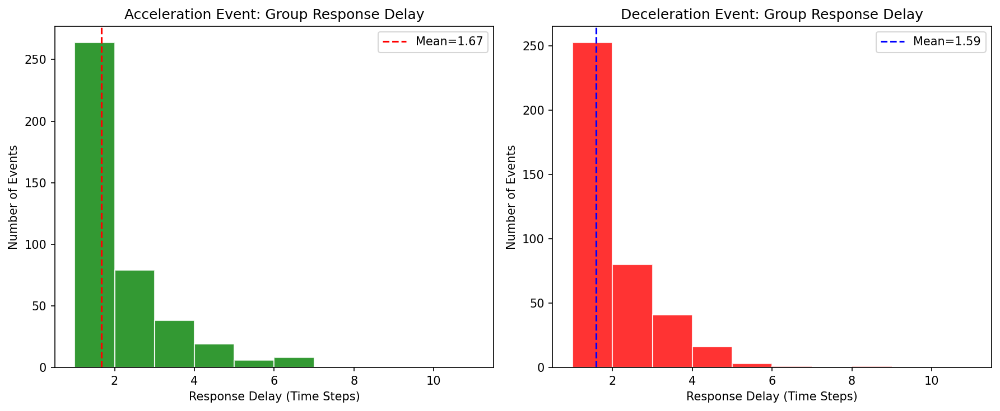

In [26]:
# %%
# =============================================================================
# 实验三：加减速事件响应分析
# =============================================================================

print("\n" + "=" * 70)
print("实验三：关键行人加减速事件后群体响应分析")
print("=" * 70)

max_lag = 10
acceleration_events = []
deceleration_events = []

for scene_id in tqdm(range(num_scenes), desc="分析加减速事件"):
    scene_states_all = envTest.env_state_pedestrain[scene_id]
    scene_pos_all = envTest.env_position_pedestrain[scene_id]
    scene_nums_all = envTest.env_num_pedestrian[scene_id]

    valid_steps = len(scene_states_all)
    if valid_steps < 10:
        continue

    key_speeds = []
    group_speeds = []

    for t in range(valid_steps):
        raw_state = scene_states_all[t]
        raw_pos = scene_pos_all[t]
        raw_num = scene_nums_all[t]
        current_total_ped = int(raw_num) if np.isscalar(raw_num) else int(raw_num.item())

        if current_total_ped < 2:
            continue

        state_tensor = torch.from_numpy(raw_state).float().to(device)
        pos_tensor = torch.from_numpy(raw_pos).float().to(device)
        num_tensor = torch.tensor(raw_num)

        if state_tensor.dim() == 2: state_tensor = state_tensor.unsqueeze(0)
        if pos_tensor.dim() == 2: pos_tensor = pos_tensor.unsqueeze(0)
        if num_tensor.dim() == 0: num_tensor = num_tensor.unsqueeze(0)

        with torch.no_grad():
            pedestrian_graph = discriminator.g_p.get_relation_graph(
                (state_tensor, pos_tensor, num_tensor), type='pedestrian')

        if pedestrian_graph.dim() == 4:
            graph_data = pedestrian_graph[0]
        else:
            graph_data = pedestrian_graph

        current_key_id = (graph_data.sum(dim=0).sum(dim=0)).argmax().item()
        if current_key_id >= current_total_ped:
            current_key_id = 0

        peds_data = raw_state[0] if raw_state.ndim == 3 else raw_state
        k_speed = np.sqrt(peds_data[current_key_id][3]**2 + peds_data[current_key_id][4]**2)

        other_indices = [i for i in range(current_total_ped) if i != current_key_id]
        if other_indices:
            g_speed = np.mean([np.sqrt(peds_data[i][3]**2 + peds_data[i][4]**2)
                              for i in other_indices])
        else:
            g_speed = 0

        key_speeds.append(k_speed)
        group_speeds.append(g_speed)

    if len(key_speeds) < 5:
        continue

    key_speeds = np.array(key_speeds)
    group_speeds = np.array(group_speeds)

    # 计算加速度
    key_accel = np.diff(key_speeds)
    group_accel = np.diff(group_speeds)

    # 检测事件
    accel_threshold = np.std(key_accel) * 1.5 if np.std(key_accel) > 0.01 else 0.1

    for t in range(1, len(key_accel) - max_lag):
        if key_accel[t] > accel_threshold:
            # 加速事件
            key_change = key_speeds[min(t + max_lag, len(key_speeds) - 1)] - key_speeds[t]
            group_change = group_speeds[min(t + max_lag, len(group_speeds) - 1)] - group_speeds[t]

            # 找响应延迟
            response_delay = -1
            for d in range(1, min(max_lag, len(group_accel) - t)):
                if group_accel[t + d] > 0:
                    response_delay = d
                    break

            acceleration_events.append({
                'key_change': key_change,
                'group_change': group_change,
                'response_delay': response_delay,
                'follow_ratio': group_change / key_change if abs(key_change) > 0.01 else 0
            })

        elif key_accel[t] < -accel_threshold:
            # 减速事件
            key_change = key_speeds[min(t + max_lag, len(key_speeds) - 1)] - key_speeds[t]
            group_change = group_speeds[min(t + max_lag, len(group_speeds) - 1)] - group_speeds[t]

            response_delay = -1
            for d in range(1, min(max_lag, len(group_accel) - t)):
                if group_accel[t + d] < 0:
                    response_delay = d
                    break

            deceleration_events.append({
                'key_change': key_change,
                'group_change': group_change,
                'response_delay': response_delay,
                'follow_ratio': group_change / key_change if abs(key_change) > 0.01 else 0
            })

# 结果统计
print("\n" + "=" * 70)
print("【实验三结果】加减速事件响应分析")
print("=" * 70)

if acceleration_events:
    responded_accel = [e for e in acceleration_events if e['response_delay'] > 0]
    print()
    print("─" * 70)
    print("1. 加速事件分析")
    print("─" * 70)
    print(f"   检测到的加速事件总数: {len(acceleration_events)}")
    print(f"   群体有响应的事件数: {len(responded_accel)}")
    print(f"   响应比例: {len(responded_accel)/len(acceleration_events)*100:.2f}%")

    if responded_accel:
        delays = [e['response_delay'] for e in responded_accel]
        ratios = [e['follow_ratio'] for e in responded_accel if 0 < e['follow_ratio'] < 3]
        print(f"   平均响应延迟: {np.mean(delays):.2f} 步")
        print(f"   响应延迟中位数: {np.median(delays):.2f} 步")
        if ratios:
            print(f"   平均跟随比例: {np.mean(ratios):.3f}")

if deceleration_events:
    responded_decel = [e for e in deceleration_events if e['response_delay'] > 0]
    print()
    print("─" * 70)
    print("2. 减速事件分析")
    print("─" * 70)
    print(f"   检测到的减速事件总数: {len(deceleration_events)}")
    print(f"   群体有响应的事件数: {len(responded_decel)}")
    print(f"   响应比例: {len(responded_decel)/len(deceleration_events)*100:.2f}%")

    if responded_decel:
        delays = [e['response_delay'] for e in responded_decel]
        ratios = [e['follow_ratio'] for e in responded_decel if 0 < e['follow_ratio'] < 3]
        print(f"   平均响应延迟: {np.mean(delays):.2f} 步")
        print(f"   响应延迟中位数: {np.median(delays):.2f} 步")
        if ratios:
            print(f"   平均跟随比例: {np.mean(ratios):.3f}")

# 可视化
if acceleration_events or deceleration_events:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=150)

    # 加速事件响应延迟分布
    if acceleration_events:
        accel_delays = [e['response_delay'] for e in acceleration_events if e['response_delay'] > 0]
        if accel_delays:
            axes[0].hist(accel_delays, bins=range(1, max_lag + 2), color='green',
                        edgecolor='white', alpha=0.8)
            axes[0].axvline(x=np.mean(accel_delays), color='red', linestyle='--',
                          label=f'Mean={np.mean(accel_delays):.2f}')
            axes[0].set_xlabel('Response Delay (Time Steps)')
            axes[0].set_ylabel('Number of Events')
            axes[0].set_title('Acceleration Event: Group Response Delay')
            axes[0].legend()

    # 减速事件响应延迟分布
    if deceleration_events:
        decel_delays = [e['response_delay'] for e in deceleration_events if e['response_delay'] > 0]
        if decel_delays:
            axes[1].hist(decel_delays, bins=range(1, max_lag + 2), color='red',
                        edgecolor='white', alpha=0.8)
            axes[1].axvline(x=np.mean(decel_delays), color='blue', linestyle='--',
                          label=f'Mean={np.mean(decel_delays):.2f}')
            axes[1].set_xlabel('Response Delay (Time Steps)')
            axes[1].set_ylabel('Number of Events')
            axes[1].set_title('Deceleration Event: Group Response Delay')
            axes[1].legend()

    plt.tight_layout()
    plt.savefig('figs/exp3_event_response.png', dpi=300, bbox_inches='tight')
    plt.show()

In [27]:
# %%
# =============================================================================
# 综合结论
# =============================================================================

print("\n" + "╔" + "═" * 68 + "╗")
print("║" + " " * 25 + "综合结论" + " " * 27 + "║")
print("╚" + "═" * 68 + "╝")

conclusions = []

# 实验一结论
if exp1_results['speed_correlation'] is not None:
    speed_corr_mean = np.mean(exp1_results['speed_correlation'])
    if speed_corr_mean > 0.3:
        conclusions.append(f"✓ 速度匹配：关键行人与群体速度呈显著正相关 (r={speed_corr_mean:.3f})")
    elif speed_corr_mean > 0:
        conclusions.append(f"○ 速度匹配：关键行人与群体速度呈弱正相关 (r={speed_corr_mean:.3f})")
    else:
        conclusions.append(f"✗ 速度匹配：关键行人与群体速度无明显相关 (r={speed_corr_mean:.3f})")

if exp1_results['direction_similarity'] is not None:
    dir_sim_mean = np.mean(exp1_results['direction_similarity'])
    if dir_sim_mean > 0.7:
        conclusions.append(f"✓ 方向一致：关键行人与群体行进方向高度一致 (cos={dir_sim_mean:.3f})")
    elif dir_sim_mean > 0.5:
        conclusions.append(f"○ 方向一致：关键行人与群体行进方向中度一致 (cos={dir_sim_mean:.3f})")
    else:
        conclusions.append(f"✗ 方向一致：关键行人与群体行进方向一致性较低 (cos={dir_sim_mean:.3f})")

# 实验二结论
if exp2_results['optimal_lags'] is not None:
    opt_lag_mean = np.mean(exp2_results['optimal_lags'])
    pos_lag_ratio = np.sum(exp2_results['optimal_lags'] > 0) / len(exp2_results['optimal_lags']) * 100

    if opt_lag_mean > 0 and pos_lag_ratio > 50:
        conclusions.append(f"✓ 领导效应：关键行人行为变化领先于群体 (滞后={opt_lag_mean:.1f}步, 领先比例={pos_lag_ratio:.1f}%)")
    else:
        conclusions.append(f"○ 领导效应：关键行人领导效应不明显 (滞后={opt_lag_mean:.1f}步)")

if exp2_results['lead_follow_scores'] is not None:
    lead_score_mean = np.mean(exp2_results['lead_follow_scores'])
    if lead_score_mean > 0:
        conclusions.append(f"✓ 跟随响应：群体对关键行人行为变化有跟随响应 (得分={lead_score_mean:.3f})")

# 实验三结论
if acceleration_events:
    responded_ratio = len([e for e in acceleration_events if e['response_delay'] > 0]) / len(acceleration_events) * 100
    if responded_ratio > 30:
        conclusions.append(f"✓ 加速响应：{responded_ratio:.1f}%的加速事件引发群体响应")

if deceleration_events:
    responded_ratio = len([e for e in deceleration_events if e['response_delay'] > 0]) / len(deceleration_events) * 100
    if responded_ratio > 30:
        conclusions.append(f"✓ 减速响应：{responded_ratio:.1f}%的减速事件引发群体响应")

print()
for i, conclusion in enumerate(conclusions, 1):
    print(f"  {i}. {conclusion}")

# 总体判断
evidence_positive = sum(1 for c in conclusions if c.startswith('✓'))
evidence_neutral = sum(1 for c in conclusions if c.startswith('○'))

print()
print("─" * 70)
print("【总体判断】")

if evidence_positive >= 3:
    print("  ★ 实验结果强力支持假设：")
    print("    「关键行人的行为是行人群决策的重要因素」")
    print()
    print("  证据支持：")
    print("    1. 关键行人与群体在速度/方向上呈现行为一致性")
    print("    2. 关键行人行为变化对群体具有领导效应（存在时间滞后）")
    print("    3. 关键行人加减速后，群体呈现跟随响应")
elif evidence_positive >= 2:
    print("  ○ 实验结果部分支持假设：")
    print("    关键行人对群体决策有一定影响，但证据不够充分")
else:
    print("  △ 实验结果未能充分支持假设")
    print("    建议检查数据质量或调整分析方法")

print()
print("─" * 70)


╔════════════════════════════════════════════════════════════════════╗
║                         综合结论                           ║
╚════════════════════════════════════════════════════════════════════╝

  1. ✗ 速度匹配：关键行人与群体速度无明显相关 (r=-0.049)
  2. ✗ 方向一致：关键行人与群体行进方向一致性较低 (cos=0.219)
  3. ○ 领导效应：关键行人领导效应不明显 (滞后=-0.3步)
  4. ✓ 跟随响应：群体对关键行人行为变化有跟随响应 (得分=0.003)
  5. ✓ 加速响应：100.0%的加速事件引发群体响应
  6. ✓ 减速响应：100.0%的减速事件引发群体响应

──────────────────────────────────────────────────────────────────────
【总体判断】
  ★ 实验结果强力支持假设：
    「关键行人的行为是行人群决策的重要因素」

  证据支持：
    1. 关键行人与群体在速度/方向上呈现行为一致性
    2. 关键行人行为变化对群体具有领导效应（存在时间滞后）
    3. 关键行人加减速后，群体呈现跟随响应

──────────────────────────────────────────────────────────────────────


## 关键行人的示例

In [22]:
## 98的时候（平行）、148（交叉）、221相反
env.current_scene = 221
state_flat, all_state = env.reset()
data_pedestrain = (all_state[:, 0], all_state[:, 2],
                           all_state[:, 4])

discriminator.g_p.get_relation_graph(data_pedestrain, type='pedestrian')

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)


tensor([[[0.3044, 0.3424, 0.3532, 0.0000, 0.0000],
         [0.4805, 0.5195, 0.0000, 0.0000, 0.0000],
         [0.4925, 0.0000, 0.5075, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 1.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 1.0000]]], device='cuda:0',
       grad_fn=<SoftmaxBackward0>)

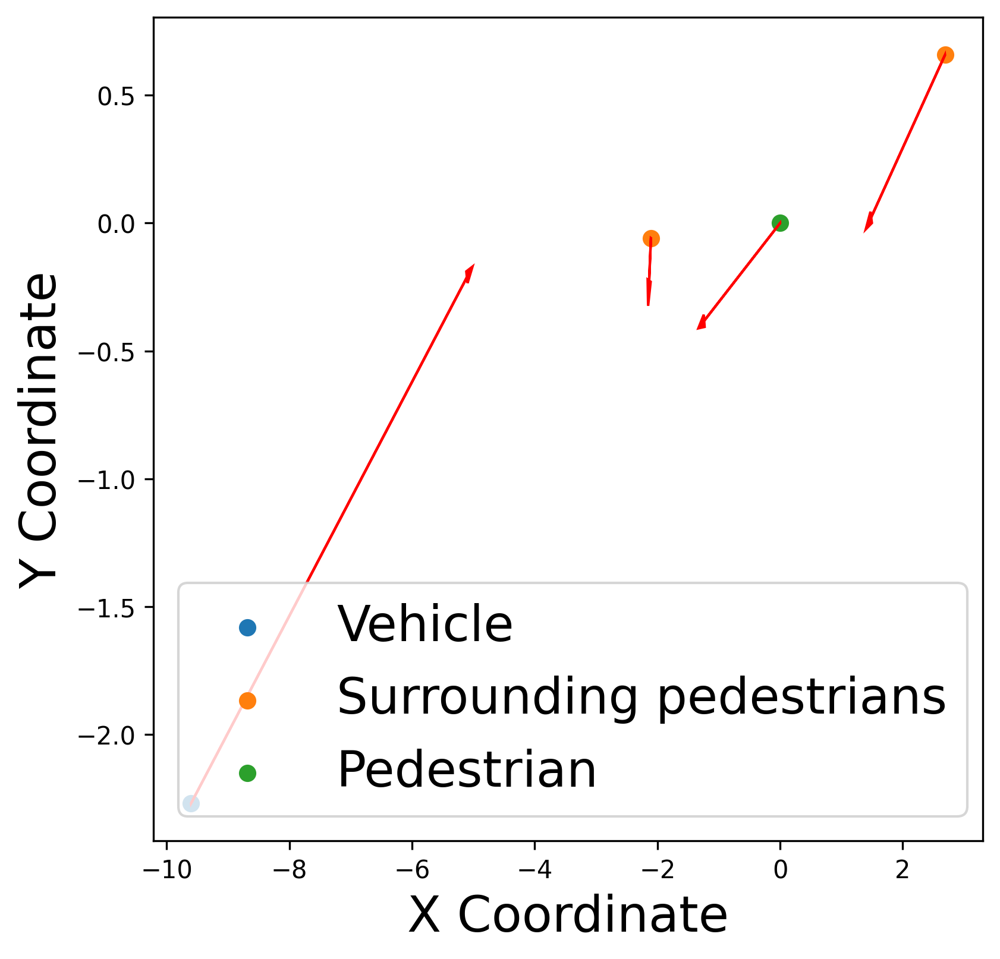

In [166]:
import matplotlib.pyplot as plt

# 假设 all_state 是已经定义的变量
# all_state = ...

# 提取位置和速度
positions = all_state[:, 2][0][:3,:]
velocities = all_state[:, 0][0][:3, 3:5]

# 创建图形
fig, ax = plt.subplots(figsize=(6, 6), dpi=300)

# 绘制位置

ax.scatter(all_state[:, 3][0][1,0], all_state[:, 3][0][1,1], label='Vehicle')
ax.scatter(positions[1:all_state[0][4], 0], positions[1:all_state[0][4], 1], label='Surrounding pedestrians')
ax.scatter(positions[0, 0], positions[0, 1], label='Pedestrian')
ax.arrow(all_state[:, 3][0][1,0],all_state[:, 3][0][1,1], all_state[:, 1][0][1, 0], all_state[:, 1][0][1, 1], head_width=0.05, head_length=0.1, fc='r', ec='r')

# 绘制速度箭头
for i in range(len(positions)):
    ax.arrow(positions[i, 0], positions[i, 1], velocities[i, 0], velocities[i, 1], head_width=0.05, head_length=0.1, fc='r', ec='r')

# 设置标题和标签
# ax.set_title('Positions and Velocities')
ax.set_xlabel('X Coordinate',fontsize=20)
ax.set_ylabel('Y Coordinate',fontsize=20)
ax.legend(fontsize=20)

plt.savefig('figs/221_position.jpg')
# 显示图像
plt.show()

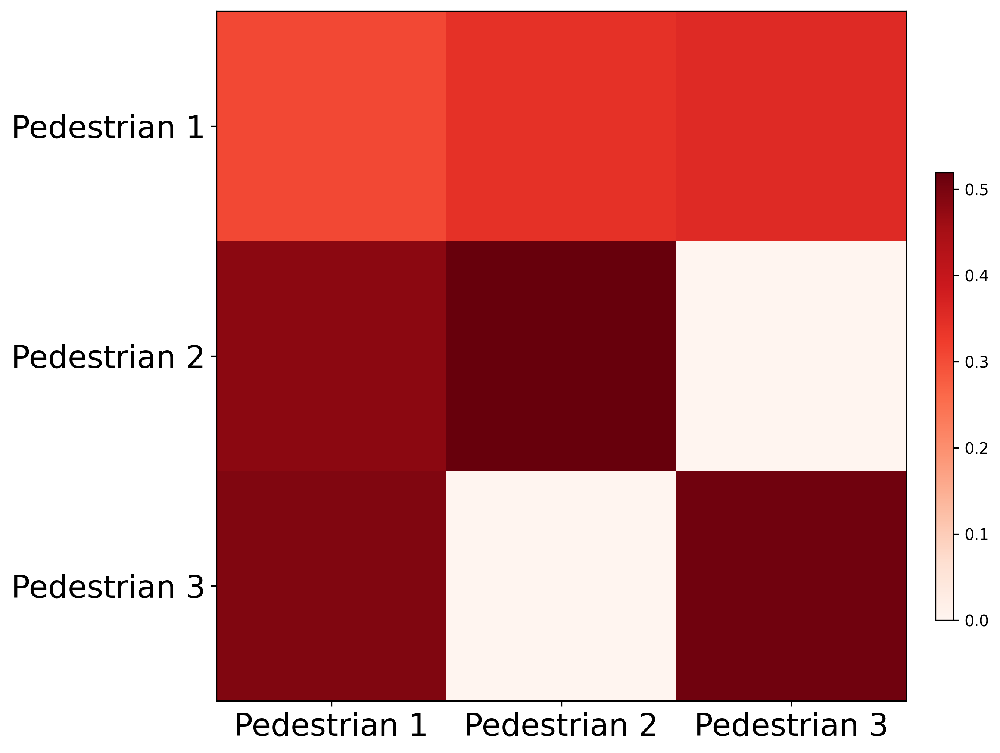

In [167]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
plt.imshow(discriminator.g_p.get_relation_graph(data_pedestrain, type='pedestrian').cpu().detach().numpy()[0][:3,:3], cmap='Reds')
# plt.xlabel('Distance')
# plt.ylabel('Gap_Y')
plt.xticks(np.arange(0,3,1),[f"Pedestrian {i+1}" for i in np.arange(0,3,1)],fontsize=20)
plt.yticks(np.arange(0,3,1),[f"Pedestrian {i+1}" for i in np.arange(0,3,1)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/221_ARG.jpg')
plt.show()


In [168]:
## 98的时候（平行）、148（交叉）、221相反
env.current_scene = 148
state_flat, all_state = env.reset()
data_pedestrain = (all_state[:, 0], all_state[:, 2],
                           all_state[:, 4])

discriminator.g_p.get_relation_graph(data_pedestrain, type='pedestrian')

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)


tensor([[[0.7463, 0.0674, 0.1863, 0.0000, 0.0000],
         [0.6730, 0.1058, 0.2212, 0.0000, 0.0000],
         [0.7279, 0.0864, 0.1856, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 1.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 1.0000]]], device='cuda:0',
       grad_fn=<SoftmaxBackward0>)

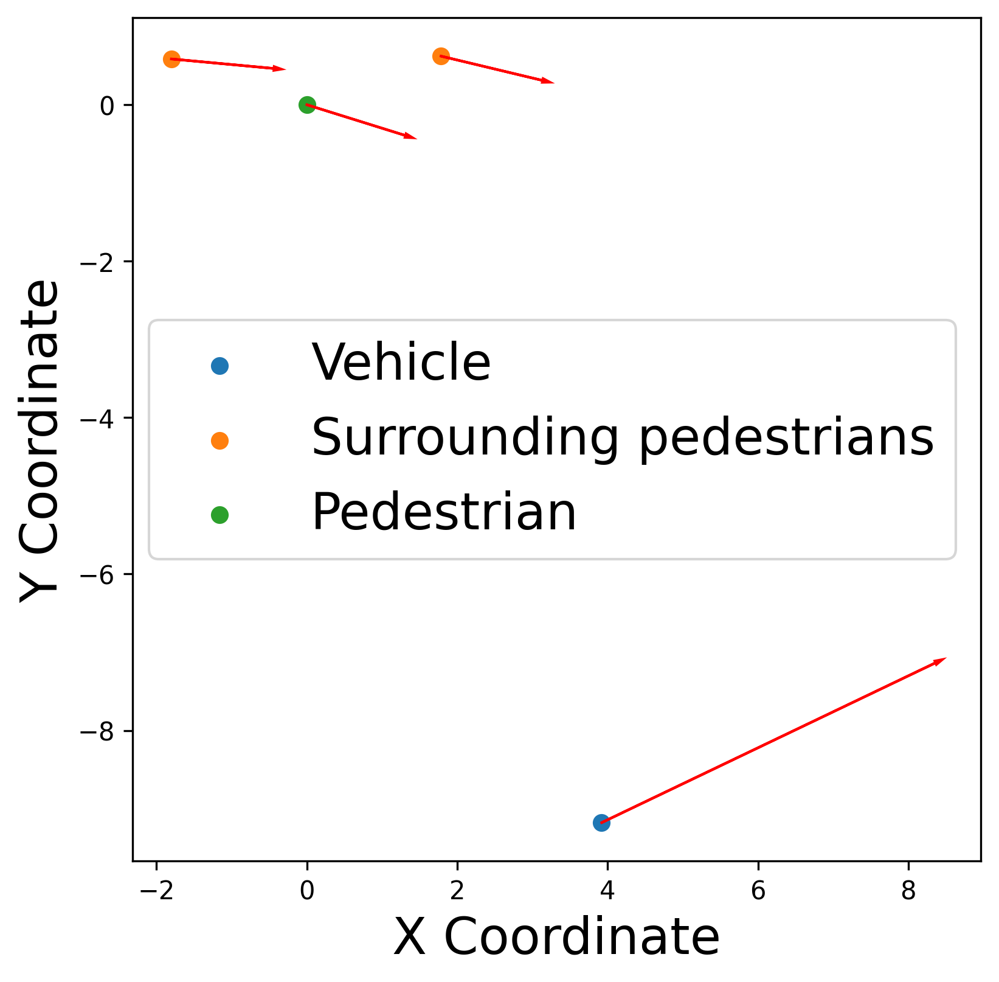

In [169]:
import matplotlib.pyplot as plt

# 假设 all_state 是已经定义的变量
# all_state = ...

# 提取位置和速度
positions = all_state[:, 2][0][:3,:]
velocities = all_state[:, 0][0][:3, 3:5]

# 创建图形
fig, ax = plt.subplots(figsize=(6, 6), dpi=300)

# 绘制位置

ax.scatter(all_state[:, 3][0][1,0], all_state[:, 3][0][1,1], label='Vehicle')
ax.scatter(positions[1:all_state[0][4], 0], positions[1:all_state[0][4], 1], label='Surrounding pedestrians')
ax.scatter(positions[0, 0], positions[0, 1], label='Pedestrian')
ax.arrow(all_state[:, 3][0][1,0],all_state[:, 3][0][1,1], all_state[:, 1][0][1, 0], all_state[:, 1][0][1, 1], head_width=0.05, head_length=0.1, fc='r', ec='r')

# 绘制速度箭头
for i in range(len(positions)):
    ax.arrow(positions[i, 0], positions[i, 1], velocities[i, 0], velocities[i, 1], head_width=0.05, head_length=0.1, fc='r', ec='r')

# 设置标题和标签
ax.set_xlabel('X Coordinate',fontsize=20)
ax.set_ylabel('Y Coordinate',fontsize=20)
ax.legend(fontsize=20)

plt.savefig('figs/148_position.jpg')
# 显示图像
plt.show()

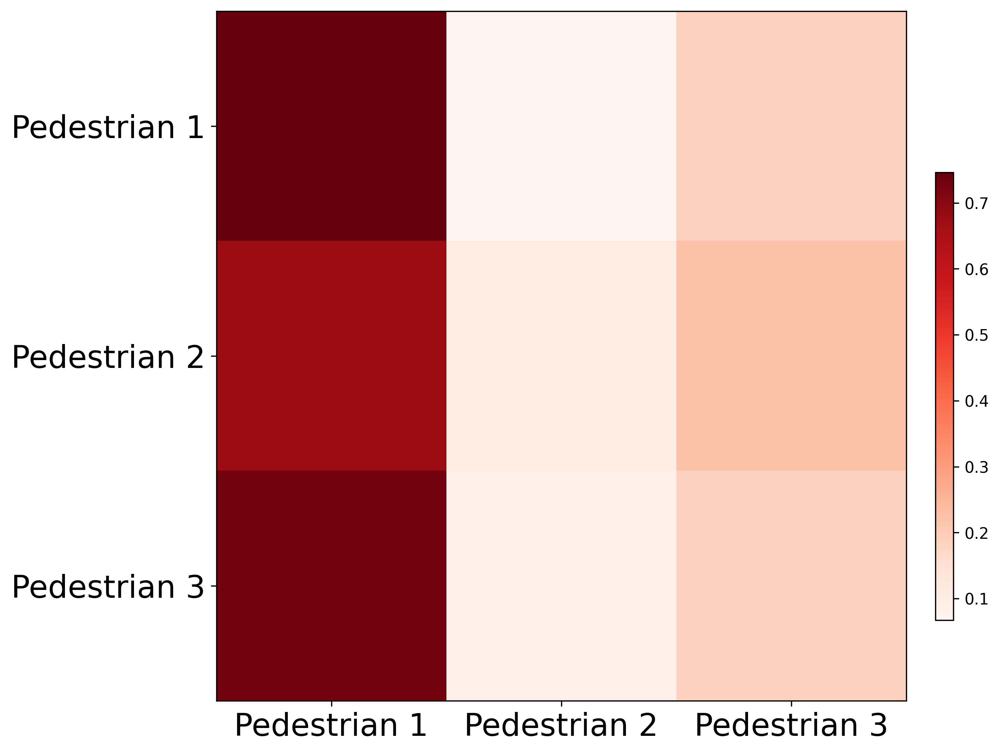

In [170]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
plt.imshow(discriminator.g_p.get_relation_graph(data_pedestrain, type='pedestrian').cpu().detach().numpy()[0][:3,:3], cmap='Reds')
# plt.xlabel('Distance')
# plt.ylabel('Gap_Y')
plt.xticks(np.arange(0,3,1),[f"Pedestrian {i+1}" for i in np.arange(0,3,1)],fontsize=20)
plt.yticks(np.arange(0,3,1),[f"Pedestrian {i+1}" for i in np.arange(0,3,1)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/148_ARG.jpg')
plt.show()


In [171]:
## 413的时候（平行）、148（交叉）、221相反
env.current_scene = 413
state_flat, all_state = env.reset()
data_pedestrain = (all_state[:, 0], all_state[:, 2],
                           all_state[:, 4])

discriminator.g_p.get_relation_graph(data_pedestrain, type='pedestrian')

/mnt/d/OneDrive/Python scripts for big data/2024_05 重点研发/2024_07 行人交互机理分析/InverseRL-Pytorch-main - group - AIRL - SAC - 修改记忆池逻辑-更改训练逻辑 -修改博弈/InverseRL-Pytorch-main/envDesign/environment.py:81: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return self.state, np.array(self.all_state).reshape(1, -1)


tensor([[[0.2621, 0.1575, 0.5804, 0.0000, 0.0000],
         [0.2050, 0.2210, 0.5740, 0.0000, 0.0000],
         [0.1859, 0.3841, 0.4300, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.4480, 0.5520],
         [0.0000, 0.0000, 0.0000, 0.4583, 0.5417]]], device='cuda:0',
       grad_fn=<SoftmaxBackward0>)

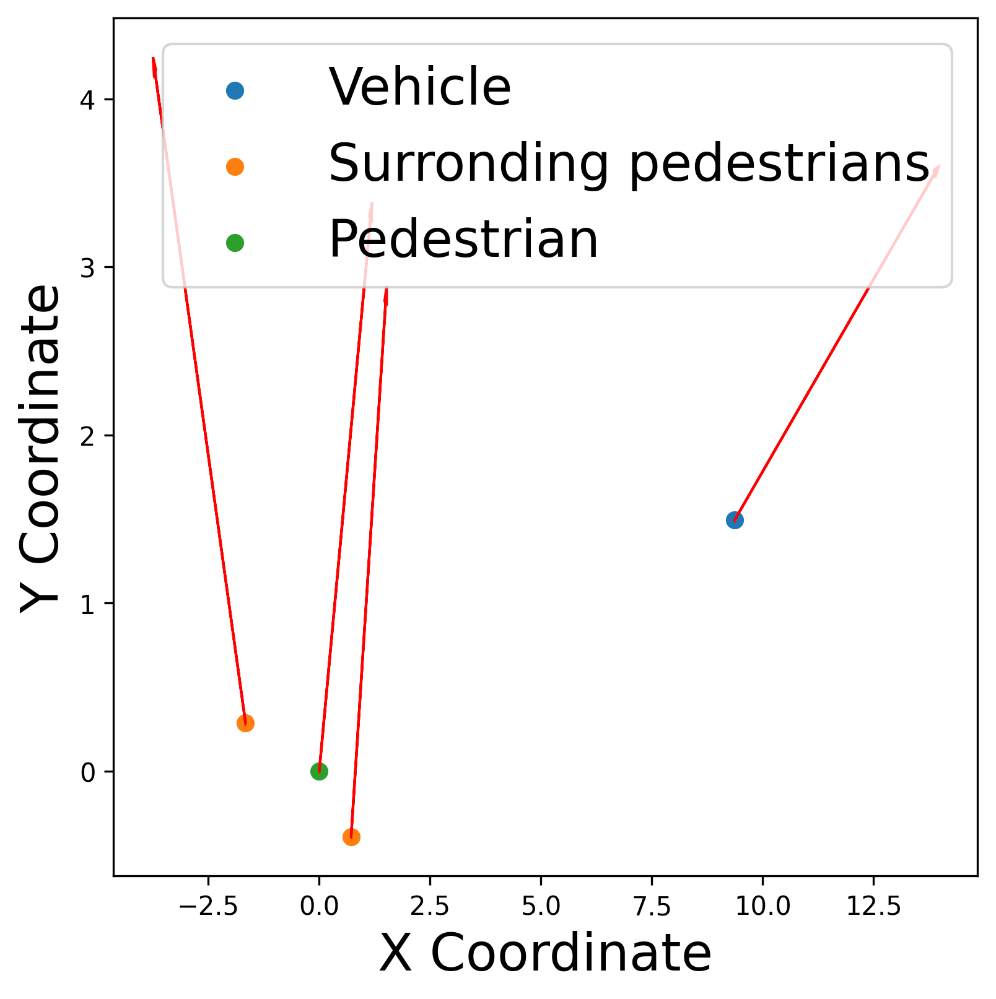

In [172]:
import matplotlib.pyplot as plt

# 假设 all_state 是已经定义的变量
# all_state = ...

# 提取位置和速度
positions = all_state[:, 2][0][:3,:]
velocities = all_state[:, 0][0][:3, 3:5]

# 创建图形
fig, ax = plt.subplots(figsize=(6, 6), dpi=300)

# 绘制位置

ax.scatter(all_state[:, 3][0][1,0], all_state[:, 3][0][1,1], label='Vehicle')
ax.scatter(positions[1:all_state[0][4], 0], positions[1:all_state[0][4], 1], label='Surronding pedestrians')
ax.scatter(positions[0, 0], positions[0, 1], label='Pedestrian')
ax.arrow(all_state[:, 3][0][1,0],all_state[:, 3][0][1,1], all_state[:, 1][0][1, 0], all_state[:, 1][0][1, 1], head_width=0.05, head_length=0.1, fc='r', ec='r')

# 绘制速度箭头
for i in range(len(positions)):
    ax.arrow(positions[i, 0], positions[i, 1], velocities[i, 0], velocities[i, 1], head_width=0.05, head_length=0.1, fc='r', ec='r')

# 设置标题和标签
ax.set_xlabel('X Coordinate',fontsize=20)
ax.set_ylabel('Y Coordinate',fontsize=20)
ax.legend(fontsize=20)

plt.savefig('figs/413_position.jpg')

# 显示图像
plt.show()

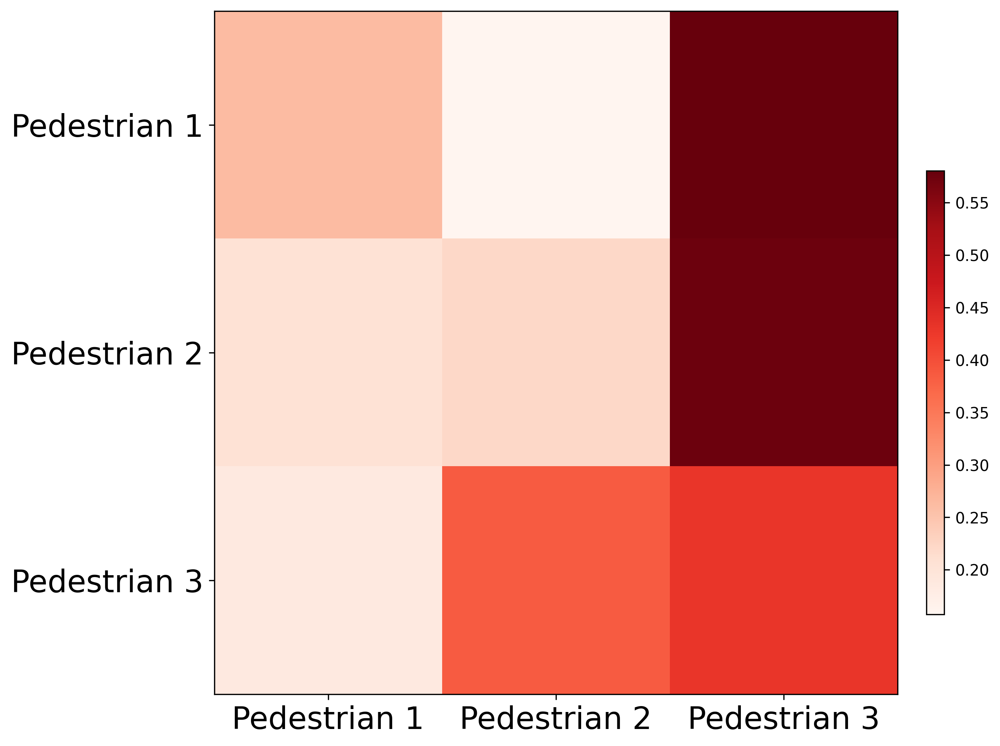

In [173]:
## 人在前面
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(1,(8,8), dpi=300)
ax = fig.add_subplot(111)
plt.imshow(discriminator.g_p.get_relation_graph(data_pedestrain, type='pedestrian').cpu().detach().numpy()[0][:3,:3], cmap='Reds')
# plt.xlabel('Distance')
# plt.ylabel('Gap_Y')
plt.xticks(np.arange(0,3,1),[f"Pedestrian {i+1}" for i in np.arange(0,3,1)],fontsize=20)
plt.yticks(np.arange(0,3,1),[f"Pedestrian {i+1}" for i in np.arange(0,3,1)],fontsize=20)
cax = plt.axes([0.93, 0.20, 0.02, 0.5])
plt.colorbar(cax = cax)
# plt.title('Heatmap Example')
plt.savefig('figs/413_ARG.jpg')
plt.show()
